## CSCE 676 :: Data Mining and Analysis :: Texas A&M University :: Fall 2019


# Project - Social Corps

## Corporate Social Responsibility Report

### Part 1. PDF Crawler


In [1]:
from bs4 import BeautifulSoup
import wget
import csv
import requests
import pandas as pd

data = pd.read_csv('fortune_1000.csv')
companies = data['Company Name'].to_numpy()
companies

array(['Walmart', 'Exxon Mobil', 'Apple', 'Berkshire Hathaway',
       'Amazon.com', 'UnitedHealth Group', 'McKesson', 'CVS Health',
       'AT&T', 'AmerisourceBergen', 'Chevron', 'Ford Motor',
       'General Motors', 'Costco Wholesale', 'Alphabet',
       'Cardinal Health', 'Walgreens Boots Alliance', 'JPMorgan Chase',
       'Verizon Communications', 'Kroger', 'General Electric',
       'Fannie Mae', 'Phillips 66', 'Valero Energy', 'Bank of America',
       'Microsoft', 'Home Depot', 'Boeing', 'Wells Fargo', 'Citigroup',
       'Marathon Petroleum', 'Comcast', 'Anthem', 'Dell Technologies',
       'DuPont de Nemours', 'State Farm Insurance', 'Johnson & Johnson',
       'IBM', 'Target', 'Freddie Mac', 'United Parcel Service', "Lowe's",
       'Intel', 'MetLife', 'Procter & Gamble', 'United Technologies',
       'FedEx', 'PepsiCo', 'Archer Daniels Midland',
       'Prudential Financial', 'Centene', 'Albertsons', 'Walt Disney',
       'Sysco', 'HP', 'Humana', 'Facebook', 'Caterpillar',

In [ ]:
import os

"""
Give the request lib a link to a Google search (manually with get requests (static url) or post)
Use BS4 to scrape the page for all links
Use a for loop on a find_all and run a wget on their url.
filter by PDF i.e. in google Search string + filetype:pdf
"""
for i in range(700,len(companies)):
    company = companies[i]
    url = "https://www.google.com/search?q=social+responsibility+"+company+"&as_filetype=pdf"
    r = requests.get(url)
    html = r.content
    soup = BeautifulSoup(html, 'lxml')
    print('running?')
    print(i)
    print(r.status_code)

    for a in soup.find_all('a', href=True):
        if ".pdf" in a['href']:
            str_result = a['href']
            # just "pdf" includes all google search results because "filetype=pdf" is included in url
            # but adding a dot in front, ".pdf", solved this problem
            start = 0
            end = 0
            for i in range(len(str_result)-5):
                if str_result[i:i+4] == 'http':
                    start = i
                    break
            for i in range(start+5, len(str_result)):
                if str_result[i:i+4] == '.pdf':
                    end = i+4
                    break
            report = str_result[start:end]
            fileDir = os.path.dirname(os.path.realpath('__file__'))
            if not os.path.exists(fileDir+'/csr_data/'):
                csr_data = os.path.join(fileDir+'/csr_data/')
                os.makedirs(csr_data)
            if not os.path.exists(fileDir+'/csr_data/'+company):
                company_dir = os.path.join(fileDir+'/csr_data/'+company)
                os.makedirs(company_dir)
                
            try:
                filename = wget.download(report, company_dir)
                # Prevent duplicate downloads
                if filename[-7:-4] == '(1)':
                    delete_path = os.path.join(company_dir, filename)
                    os.remove(delete_path)
                    print("File already exists")
            except:
                # Catch HTTP Errors such as 403 Forbidden
                pass

running?
700
200
running?
701
200
running?
702
200
running?
703
200
running?
704
200
running?
705
200
running?
706
200
running?
707
200
running?
708
200
running?
709
200
running?
710
200
running?
711
200
running?
712
200
running?
713
200
running?
714
200
running?
715
200
running?
716
200
running?
717
200
running?
718
200
running?
719
200
File already exists
running?
720
200
File already exists
running?
721
200
running?
722
200
running?
723
200
running?
724
200
running?
725
200
running?
726
200
running?
727
200
running?
728
200
running?
729
200
running?
730
200
running?
731
200
running?
732
200
running?
733
200
running?
734
200
running?
735
200
File already exists
running?
736
200
running?
737
200
running?
738
200
running?
739
200
File already exists
running?
740
200
running?
741
200
running?
742
200
running?
743
200
File already exists
running?
744
200
running?
745
200
running?
746
200
running?
747
200
running?
748
200
running?
749
200
running?
750
200
running?
751
200
running?
752
200

### Part 2. PDF to TXT converter

In [1]:
import os, sys, PyPDF2
path = os.path.dirname(os.path.realpath('__file__'))
dirs = os.listdir(path + "/csr_data/")
for folder in dirs:
    if folder == ".DS_Store":
        continue
    sub_dirs = os.listdir(path + "/csr_data/" + folder)
    for file in sub_dirs:
        if file == ".DS_Store":
            continue
        file_path =  path + "/csr_data/" + folder + "/" + file
        if file_path[-4:] != '.pdf':
            continue
        file_pdf = open(file_path, 'rb')        
        # creating a pdf reader object
        try:
            fileReader = PyPDF2.PdfFileReader(file_pdf)
        except:
            continue
        try:
            total_pages = fileReader.numPages
        except:
            continue
        text = ""
        error = False
        for k in range (total_pages):
            page = fileReader.getPage(k)
            try:
                t = page.extractText()
            except:
                error = True
                break
            text = text + t
        if error:
            continue
        if not os.path.exists(path+'/csr_data_txt/'+folder):
            new_folder = os.path.join(path+'/csr_data_txt/'+folder)
            os.makedirs(new_folder)
        make_file_path = path + "/csr_data_txt/" + folder + "/" + file
        txt_path = make_file_path[:-4]+".txt"
        print('Saving...')
        print (txt_path)
        f = open(txt_path, "a")
        f.write(text)
        f.close()

hello


Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Lockheed Martin/Lockheed_Martin_Sustainability_Report_Executive_Summary_2017.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Lockheed Martin/2014-energy-water-waste-conference-united-states-postal-service-lockheed-martin-case-studies-on-energy-waste-and-water-naem.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Lockheed Martin/sustainability-report-2016-web.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Lockheed Martin/a556558.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Lockheed Martin/Lockheed_Martin_Sustainability_Report_Full_2018.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Lockheed Martin/Lockheed_Martin_Sustainability_Report_Full_2017.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Lockheed Martin/lmt_courtesy-pdf.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Cardinal Health/cardinal-he

Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/DXC Technology/SP190025_DXC.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/DXC Technology/2016_CSC_Corporate_Responsibility_Report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/DXC Technology/ethical-digital-study-tour-agenda.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/DXC Technology/NYSE_DXC_2018.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/DXC Technology/Corporate-Responsibility-Report-2018.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Marathon Petroleum/MPC_Code_of_Business_Conduct_2018.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Marathon Petroleum/2018_Climate_Related_Scenarios.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Marathon Petroleum/Sustainability_Report_10_3.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Marathon Petroleum/lov_report_2012_final.txt
Sa

Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/VF/DohenyM_17_6_.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/VF/Akesson_Taru.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/VF/VF.CSR_.7-2019.web_.FINAL_-2.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Synnex/14005390.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Synnex/SYNNEX-Corporation-Proxy-Statement-eProof-2-2-18-19-PM-200.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Synnex/11005009.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/NextEra Energy/codeofbusinessconductandethics.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/NextEra Energy/Executive_Digest_Final.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/NextEra Energy/2011_sustain_report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/NextEra Energy/sustain-report.txt
Saving...
/Users/jeesubyun/D

Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Liberty Mutual Insurance Group/liberty-mutual-annual-report-2017.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Liberty Mutual Insurance Group/PropertyCasualtyRetailBankingOnlineBanking.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Liberty Mutual Insurance Group/Liberty-Mutual-Annual-web-ready.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Liberty Mutual Insurance Group/liberty-life-variable-prospectus.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Liberty Mutual Insurance Group/2018_Investor_Day.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Liberty Mutual Insurance Group/FinEIOWCmFS-200000914.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Liberty Mutual Insurance Group/1809mutualfactor.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Liberty Mutual Insurance Group/Liberty-Mutual-Prospectus-11-

Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Phillips 66/code.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Phillips 66/CSR-8-page-Brochure-2017-single-pages-FINAL.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Phillips 66/sustainability-brochure-print.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Phillips 66/Sustainability-Brochure-2018.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Phillips 66/3qtr13_spirit-magazine.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Phillips 66/Sustainability-Brochure-2017.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Phillips 66/Sustainability-Ch8.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Phillips 66/Sustainability-Report-2019.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/D.R. Horton/patrickmissudhorton110113-14a8.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt

Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/HP/hp_csr_full_hi_tcm_245_1357664.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/HP/ngsr-charter-2019-july-2019.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/HP/c06293935.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/HP/toward-more-responsible-supply-chain-0809.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/FedEx/FedEx_GCR131.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/FedEx/FedEx_GCR121.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/FedEx/FedEx_GCR141.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/FedEx/FedEx_GCR_FINAL_4.17.19_144dpi.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/FedEx/FedEx_2017_Global_Citizenship_Report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/FedEx/FedEx_2018_Global_Citizenship_Report.txt
Saving...
/Users/jeesubyun/Downloads/

Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Cummins/cumminssynthese.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Hewlett Packard Enterprise/c05968415.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Hewlett Packard Enterprise/gourevitch_cs_hur.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Hewlett Packard Enterprise/prospectus-hewlett-packard-enterprise-company-stock-plan.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Hewlett Packard Enterprise/9e4d3db4989957370a4686e6d4653c04f0ce.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Hewlett Packard Enterprise/hp_csr_full_hi_tcm_245_1357664.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Becton Dickinson/BD_Sustainability-Performance-Update-2017_EN.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Becton Dickinson/BD_Sustainability-Report-2016_EN.txt
Saving...
/Users/jeesubyun/Downloads/676/project

Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Henry Schein/JACD-81-1-pgs41-45-press.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Henry Schein/18CC9340_Pages_Vfin_nc.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Wells Fargo/GATX_CSR_Committee_Charter_2018_11_10.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Wells Fargo/2018-corporate-responsibility-report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Wells Fargo/2015-social-responsibility-report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Wells Fargo/2017-social-responsibility-report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Wells Fargo/2013-social-responsibility-report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Wells Fargo/Wells-Fargo-Proxy-Memo_-Solicitation-3-28-17-FINAL.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Wells Fargo/CSR_IN_AMERICAN_BANKING_

Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Morgan Stanley/esg-approach-and-principles-us.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Deere/Support-of-Human-Rights-in-Our-Business-Practices_2017.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Deere/domesticforeignmissionary111312-14a8.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Deere/global_citizenship_report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Deere/JD_GCR_2017_F-web.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Deere/Deere_Strategic_Plan.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Deere/jd-india-csr-policy.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Deere/OurGuidingPrinciples_English.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Deere/2015-2016-CSSR-LR.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/PayPal Holdings/2017511_r0

Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Omnicom Group/Omnicom-Group-2016-Corporate-Responsibility-Report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Omnicom Group/061516_Omnicom_FinalDraft_2.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Omnicom Group/KSR-REPORT.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Omnicom Group/rep-rethinking-corporate-social-responsibility-fleishman-2007.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Omnicom Group/PubGpe_CSRReport_2014.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Omnicom Group/073018_Final_Omnicom_Layout.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/WellCare Health Plans/WellCare_2017_Annual_Review.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/WellCare Health Plans/WellCare_2016_Annual_Review.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Broadcom/Broadcom-2018-A

Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/International Paper/emeaep2013en.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/International Paper/supplier-handbook.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/International Paper/2016-gc-report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/International Paper/gc-report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/International Paper/2014_sust_full-report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/International Paper/4_3_285_wcsdg-wp-27.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Newell Brands/CoC_EMEA.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Newell Brands/NR-SustainabilityBrochure-PF.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Newell Brands/SustainabilityReport2017.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Newell Brands/NWL-res

Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Walmart/topten-walmartsustainability.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Walmart/csr-policy.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Walmart/corporate-social-responsibility-report-published-july-2012.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Walmart/wmt-2017-grr-report-final.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Berkshire Hathaway/ethics.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Berkshire Hathaway/Hanson-2013-Journal_of_Applied_Corporate_Finance_s6WINu1.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Berkshire Hathaway/BerkshireHathaway_Memo_041309.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Berkshire Hathaway/Sustainability-performance-The-method-of-reporting-by-International-companies.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Berks

Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/JPMorgan Chase/jpmc_crr08.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/JPMorgan Chase/2017-jpmorgan-chase-cr-report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/JPMorgan Chase/2016-JPMorgan-Chase-CR-Report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/JPMorgan Chase/220591_JPMC_Summary_Report_aw_linked_v2_ada.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/JPMorgan Chase/final-jpmc-cr-2019.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/JPMorgan Chase/jpmc-cr-esg-report-2018.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/JPMorgan Chase/jpm_corpresp091912_hires.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Netflix/netflix_culture.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Netflix/CSR%2BMEMO%2BWEBSITE.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Net

Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/TIAA/RI_practice_management_guidebook_377920_535605_083115.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/TIAA/ri_delivering_competitive_performance.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/TIAA/socialresponsibilitycharter.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Performance Food Group/9ea24c9c8584eaa5e573864978289b6ebbef.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Performance Food Group/Sysco_2018_CSR.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Performance Food Group/KHC_CSR_2017_Full.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Southwest Airlines/ChristiMcNeill.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Southwest Airlines/20060046466.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Southwest Airlines/c07b4c4f27a6001bcec7c9cf6fdc1822902a.txt
Saving...
/

Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Philip Morris International/pmi-sustainability-report-2018-low-res.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Philip Morris International/e22c9ff113f863079762ccfa2ed9b8f2ded8.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/BlackRock/blk-annual-stewardship-report-2018.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/BlackRock/blk-annual-stewardship-report-2019.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/BlackRock/socially-responsible-fund.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/BlackRock/blk-responsible-investment-guidelines-us.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/BlackRock/blk-sustainability-mission-statement-web.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/BlackRock/blk-esg-investment-statement-web.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/BlackRo

Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Waste Management/71ce7623b3e5876a20bb932bebfb5e2b140e.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Waste Management/WasteManagement_SustainabilityReport_2018.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Waste Management/0724a3d19cca625e45196a54b908262490ee.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Waste Management/192.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Waste Management/Roadmap_Appendices.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/CVS Health/2016-summary-report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Honeywell International/irsHONEYWELLa2014ieng.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Honeywell International/Best-Practices-In-Corporate-Social-Responsibility-2015.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Honeywell International/azzada

Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Bank of New York Mellon/2018-csr-report-overview.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Bank of New York Mellon/2012-csr-full-report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Bank of New York Mellon/bny-mellon-diversity-and-inclusion-strategy.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Bank of New York Mellon/2018-csr-report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Union Pacific/omhq10b29811006339.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Union Pacific/business_conduct.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/AbbVie/abbv_mercyinvestmentservices_3.27.18.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/AbbVie/abbvie-materialityassessment-2018.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/AbbVie/AbbVie-Supplier-Sustainability-Survey.txt
Saving...


Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Procter & Gamble/csr_guide.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Procter & Gamble/PGHH-CSR-Policy.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Procter & Gamble/IJBRM-125.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Procter & Gamble/english_sustainability.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Procter & Gamble/dbp_csr_paper_final_-_corporate_social_responsibility_and_di-_a_critical_partnership.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Procter & Gamble/csr13_14.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Northrop Grumman/2016-noc-cr-report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Northrop Grumman/2007-noc-csr-report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Northrop Grumman/2013-noc-cr-report.txt
Saving...
/Users/jeesubyun/Downloads/676/p

Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Cisco Systems/CSR-Report-2016-story.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Cisco Systems/Pillar_Environment.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Cisco Systems/CSR-Report-2018.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Cisco Systems/CSR_Report_2005.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Cisco Systems/Pillar_GovernanceEthics.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Cisco Systems/CSR-Report-Our-Story-2018.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Cisco Systems/CSR_Report_2013.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Cisco Systems/CSR-Report-2016.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Cisco Systems/CSR-Report-2017.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Cisco Systems/CSR_Report_2015.txt
Saving...
/Us

Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Kimberly-Clark/kimberly-clark-investing.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/UnitedHealth Group/SR-Report-2018-Q4.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/UnitedHealth Group/UHG-2018-SR-report-Q2.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/UnitedHealth Group/SR-Report-2018-Q3.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/UnitedHealth Group/UNH-2015-Social-Responsibility-Report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/UnitedHealth Group/UNH-2013-Social-Responsibility-Report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/UnitedHealth Group/UNH-2014-Social-Responsibility-Report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/UnitedHealth Group/davidridenour021417-14a8.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/UnitedHealth Group/UHG_SRreport_2017.txt

Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Ecolab/Ecolab_2016_GRI_Final_pdf.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Ecolab/20100416obianyo.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Ecolab/Policy_CodeOfConduct_pdf.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Goodyear Tire & Rubber/gy-business-conduct-manual.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Goodyear Tire & Rubber/ctsc-credit-appl-01-17.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Goodyear Tire & Rubber/Goodyear_Tire_and_Rubber_2018_Corporate_Responsibility_Report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Goodyear Tire & Rubber/2016-gri-index-and-full-text.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Goodyear Tire & Rubber/NYSE_GT_2003.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Goodyear Tire & Rubber/2018-corporate-responsibility-

Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/U.S. Bancorp/2018-fifth-third-bank-annual-corporate-responsibility-report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Hartford Financial Services/sustainability-highlight-report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Hartford Financial Services/corporate-responsibility.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Hartford Financial Services/hartford.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Hartford Financial Services/hartfordproxy2017.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Hartford Financial Services/gri-g4-matrix.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Eli Lilly/integrated-report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Eli Lilly/2014_Corporate_Responsibility_Report.txt
Saving...
/Users/jeesubyun/Downloads/676/project/csr_data_txt/Eli Lilly/mercyuaw03021

### Part 3. TXT cleaning

In [2]:
import os, sys, re, string
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer

path = os.path.dirname(os.path.realpath('__file__'))
dirs = os.listdir(path + "/csr_data_txt/")
table = str.maketrans('', '', string.punctuation)
for folder in dirs:
    if folder == ".DS_Store":
        continue
    sub_dirs = os.listdir(path + "/csr_data_txt/" + folder)
    for file in sub_dirs:
        if file == ".DS_Store":
            continue
        file_path =  path + "/csr_data_txt/" + folder + "/" + file
        file_txt = open(file_path, 'rt')
        text = file_txt.read()
        file_txt.close()
        tokens = word_tokenize(text)
        
        # convert to lower case
        tokens = [w.lower() for w in tokens]
        
        # remove punctuation from each word
        stripped = [w.translate(table) for w in tokens]
        
        # remove remaining tokens that are not alphabetic
        words = [word for word in stripped if word.isalpha()]
        
        # filter out stop words
        stop_words = set(stopwords.words('english'))
        words = [w for w in words if not w in stop_words]
        words = [w for w in words if not len(w) <= 3]
        
        # Stemming
        # porter = PorterStemmer()
        # stemmed = [porter.stem(word) for word in words]
        stemmed = words
        
        # ł , œ appear frequently. 
        if not os.path.exists(path+'/csr_data_cleaned/'+folder):
            new_folder = os.path.join(path+'/csr_data_cleaned/'+folder)
            os.makedirs(new_folder)
        make_file_path = path + "/csr_data_cleaned/" + folder + "/" + file
        string = ' '.join(stemmed)
        f = open(make_file_path, "w")
        f.write(string)
        f.close()
        
# Remove line breaks.
# Remove extra spaces (only one space between words)
# Remove Non-alphabets
# Lowercase all
# Remove stop words

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/Users/jeesubyun/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3325, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-2-567527014219>", line 20, in <module>
    tokens = word_tokenize(text)
  File "/Users/jeesubyun/anaconda3/lib/python3.7/site-packages/nltk/tokenize/__init__.py", line 146, in word_tokenize
    token for sent in sentences for token in _treebank_word_tokenizer.tokenize(sent)
  File "/Users/jeesubyun/anaconda3/lib/python3.7/site-packages/nltk/tokenize/__init__.py", line 146, in <listcomp>
    token for sent in sentences for token in _treebank_word_tokenizer.tokenize(sent)
  File "/Users/jeesubyun/anaconda3/lib/python3.7/site-packages/nltk/tokenize/treebank.py", line 140, in tokenize
    text = regexp.sub(substitution, text)
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/Users

KeyboardInterrupt: 

In [9]:
# Remove all words that occur only three times?
import os, sys
path = os.path.dirname(os.path.realpath('__file__'))
dirs = os.listdir(path + "/csr_data_cleaned/")
counts = dict()
for folder in dirs:
    if folder == ".DS_Store":
        continue
    sub_dirs = os.listdir(path + "/csr_data_cleaned/" + folder)
    for file in sub_dirs:
        if file == ".DS_Store":
            continue
        file_path =  path + "/csr_data_cleaned/" + folder + "/" + file
        file_txt = open(file_path, 'rt')
        text = file_txt.read()
        words = text.split()
        for word in words:
            if word not in counts:
                counts[word] = 0
            counts[word] = counts[word]+1
        file_txt.close()
# A lot of words only have counts less than 3!
for word in counts:
    if counts[word] <= 3:
        print(word, '->', counts[word])

incžpaul -> 3
usawwwismws -> 3
americamay -> 3
morphing -> 3
circletempe -> 3
usaphone -> 3
wwwismws -> 3
introduct -> 3
bilitiesbestinclass -> 3
modate -> 3
processesprocedures -> 3
sintegrating -> 3
oversightaccountability -> 3
organizationindustrybusiness -> 3
wwwcapsresearchorg -> 3
wled -> 3
gementsism -> 3
gawlik -> 3
schramm -> 3
sturzl -> 3
baderschneider -> 3
fiore -> 3
neibergall -> 3
ifpsm -> 3
proposaf -> 3
concunently -> 3
necessaiy -> 3
conect -> 3
confomed -> 3
fmih -> 3
wwwpaccarcominvestors -> 3
paiis -> 3
rissman -> 3
leadpdf -> 3
cced -> 3
crjage -> 3
mailr -> 3
expresst -> 3
plžc -> 3
iint -> 3
pavmentbvaccount -> 3
lfappllcnble -> 3
postlllserviceo -> 3
expressž -> 3
wthł -> 3
malurrrnllilch -> 3
slgmwln -> 3
auqul -> 3
ccdo -> 3
sehndued -> 3
dulo -> 3
miiiodny -> 3
croec -> 3
locnllon -> 3
llln -> 3
olwmllm -> 3
tandeir -> 3
satutdlly -> 3
dollvrod -> 3
buulnoob -> 3
tlll -> 3
fccopled -> 3
mmidd -> 3
uolrv -> 3
lnllrncc -> 3
filł -> 3
cooocoo -> 3
paeomł -> 3
df

chomede -> 3
risnewsedglcomstore -> 3
systemshome -> 3
cashhtml -> 3
sourceaolheadlinequotetext -> 3
paraol -> 3
wwwmarketingchartscomdirectcorporate -> 3
companiesjpg -> 3
depotnht -> 3
hincha -> 3
ecotech -> 3
depotht -> 3
wwwcommondreamsorgpre -> 3
corporatehomedepotcompagesdefaultaspx -> 3
corporatehomedepotcomcorporateresponsibilityenvironmentdocumentssustainabilitybrochurepa -> 3
gespdf -> 3
corporatehomedepotcomenuscorporatepubli -> 3
crelationsonlinepresskitdocscorpfinancialoverv -> 3
iewpd -> 3
corporatehomedepotcomcorporateresponsibilityenvironmentpagesmilestonesas -> 3
thdhomerfundorggrants -> 3
corporatehomedepotcomsuppliersdiversitypagesdefaultaspx -> 3
oratehomedepotcomourcompanypagesdefaultaspx -> 3
wwwhomedepotfoundationorgblogthe -> 3
wwwhomedepotfoundationorgblogcategoryphila -> 3
nthropy -> 3
informationcscomp -> 3
releasesregional -> 3
unseats -> 3
wwwprnewswirecomcgi -> 3
binstoriespl -> 3
edate -> 3
mpos -> 3
chinastoreclosure -> 3
wwwsolarc -> 3
itycomnewsroompre

coinﬂs -> 3
datehour -> 3
entification -> 3
rried -> 3
nknownﬂ -> 3
occurren -> 3
rrences -> 3
parta -> 3
dups -> 3
msns -> 3
ccyymmddhhmm -> 3
admittin -> 3
ﬁbrﬂ -> 3
forpricing -> 3
dicaid -> 3
deductibl -> 3
reimbursementpayment -> 3
claimlevel -> 3
ubmedicare -> 3
revﬂ -> 3
hcpcsrates -> 3
produceservice -> 3
delimite -> 3
hyph -> 3
ansmitted -> 3
dcvtosfi -> 3
providerellis -> 3
zzxxxxxxxxx -> 3
pericmike -> 3
memoiral -> 3
oakdale -> 3
hibe -> 3
renced -> 3
mmarized -> 3
aliation -> 3
offens -> 3
alcoh -> 3
olic -> 3
developmentwinter -> 3
portantiere -> 3
wwwiiiorgon -> 3
californiaphoto -> 3
membersacuityaegis -> 3
companyamerican -> 3
amerisure -> 3
bitco -> 3
companiescanal -> 3
companychubb -> 3
csaa -> 3
missourifarmers -> 3
germania -> 3
guideone -> 3
usametlife -> 3
companymillville -> 3
dedham -> 3
companyprovidence -> 3
companyscor -> 3
secura -> 3
americaproud -> 3
iiiother -> 3
kevelighan -> 3
recordﬁwe -> 3
studentsﬁfarmers -> 3
teamﬁwhen -> 3
frasier -> 3
busphotos 

andrespondingtoenvironmentalissuesinlogisticsproviders -> 3
howtogrowtheeconomywhilestillprotectingtheenvironmentisoneof -> 3
theformidablechallengesfacinglogisticsproviderstherefore -> 3
interestinhowtoevaluatethe -> 3
performanceofgreenlogisticscompaniesisincreasingdramaticallythisisespecially -> 3
truesinceassessingtheeffectivenessoftraditionallogisticsproviderssimplycannotmeetthecurrent -> 3
requirementsofbalancingsustainableeconomicgrowthwithenvironmentalresponsibility -> 3
sustainabilityinvolvestheconsiderationofthreefactors -> 3
economicsustainabilityhowever -> 3
allcompanymanagersneedtounderstandmorethoroughly -> 3
whatsustainabilityentailstomakebusinesssurvive -> 3
whatdirectorsneedtoknow -> 3
considerationshouldbegivenwhenacompanyseesthatthingsarefailing -> 3
manyresearchers -> 3
havedonethoroughstudiestoidentifyeconomicfactorstoaddressgreensupplierselectionproblems -> 3
andtheiraresummarizedhere -> 3
leeetal -> 3
mentionedthatquality -> 3
technologycapability -> 3
greenimage

kaslacksbasedmeasureofefindataenvelopmentanalysis -> 3
quantitativemodelsforperformanceevaluationandbenchmarking -> 3
dataenvelopmentanalysiswith -> 3
logisticsandsupplychainmanagementconsultingavailableonline -> 3
wwwltdmgmtcom -> 3
accountingcostsphp -> 3
kaslacksbasedmeasureofsuperefindataenvelopmentanalysis -> 3
ncaprocedureforrankingefunitsindataenvelopmentanalysis -> 3
managsci -> 3
quariguasifrotaneto -> 3
bloemhofruwaard -> 3
theenvironmentalgainsofremanufacturing -> 3
thecomputerandmobileindustry -> 3
erasmusresearchinstituteofmanagement -> 3
thenetherlands -> 3
licenseemdpi -> 3
switzerlandthisarticleisanopenaccess -> 3
articledistributedunderthetermsandconditionsofthecreativecommonsattribution -> 3
ccby -> 3
esgmanagermscicomesgmanager -> 3
rbqc -> 3
rdezbqq -> 3
zbqq -> 3
rdqzbqq -> 3
dqbd -> 3
wwwiataorgpolicyenvironmentpagesclimate -> 3
changeaspx -> 3
fiatacomup -> 3
loadsmediafiatapositionpaper -> 3
sciencebasedtargetsorgcompanies -> 3
wwwteslacomsemi -> 3
wwwlatimescom

currencyas -> 3
schedulepagereport -> 3
entitiesnote -> 3
eventsselected -> 3
weaknesss -> 3
contingenciescsc -> 3
špension -> 3
ššsoftware -> 3
šborrowing -> 3
ššrepurchase -> 3
ššpayment -> 3
capitalearningsretained -> 3
dateseparation -> 3
separationas -> 3
segmentsrestatement -> 3
ﬁconsidering -> 3
dataapril -> 3
unfavorablerevenue -> 3
šretirement -> 3
pensionpostretirement -> 3
calculationacquisition -> 3
goodwillfor -> 3
unitscomputer -> 3
pricingthe -> 3
purposecomputer -> 3
flowsearnings -> 3
awardsnew -> 3
flowscomputer -> 3
itembalance -> 3
adjustmentsincrease -> 3
assetsprepaid -> 3
liabilitiesincome -> 3
operationsstandards -> 3
tiebreaker -> 3
statementscomputer -> 3
investigationduring -> 3
gaapaxon -> 3
highlysecure -> 3
operationscomputer -> 3
taxdeductibleas -> 3
namesindefinitethe -> 3
taxdeductiblepro -> 3
probabilityweighted -> 3
acquisitiondate -> 3
limitationsunder -> 3
obligationsš -> 3
expenseš -> 3
rateother -> 3
contractsprepaid -> 3
forwardcontractsprepaid -

wasreduced -> 3
hpas -> 3
grantsterms -> 3
rightseach -> 3
isevidenced -> 3
determineswhen -> 3
thereofterm -> 3
employmentif -> 3
stermination -> 3
administratorother -> 3
inconsistentwith -> 3
administratortermination -> 3
administratordetermines -> 3
unvestedstock -> 3
reasonvestingthe -> 3
willaccrued -> 3
vestednonemployee -> 3
grantsnonemployee -> 3
determinesotherwise -> 3
datecash -> 3
awardseach -> 3
adoptedby -> 3
nontransferabilityunless -> 3
nottransferable -> 3
grantadjustments -> 3
assetssubject -> 3
byhpe -> 3
hpein -> 3
grantswill -> 3
granteeamendment -> 3
anyamendment -> 3
stockholdersus -> 3
consequencesincentive -> 3
willrecognize -> 3
incomenonstatutory -> 3
nonstatutorystock -> 3
generallymeasured -> 3
rightsstock -> 3
asnonstatutory -> 3
correspondingdeductionstock -> 3
grantsa -> 3
provideservices -> 3
gainsholding -> 3
grantany -> 3
incomeupon -> 3
unitsa -> 3
astock -> 3
periodcash -> 3
unlesslimited -> 3
hpewith -> 3
planapproval -> 3
proposalour -> 3
proposa

ofparsu -> 3
closingstock -> 3
forparsu -> 3
pcsoat -> 3
ofmodifications -> 3
valuesgrant -> 3
yearsrepresent -> 3
incrementaland -> 3
stockcompensation -> 3
inprice -> 3
fromconnection -> 3
becauseawards -> 3
firstall -> 3
continuedtranche -> 3
fiscalservice -> 3
compensationrestricted -> 3
undercost -> 3
awardspinmerge -> 3
wereamounts -> 3
ofconverted -> 3
maximumpcsos -> 3
basedmodifications -> 3
grantawards -> 3
anddescription -> 3
valuesimilarly -> 3
contingentof -> 3
inupon -> 3
roundingperformance -> 3
ofon -> 3
launchequivalent -> 3
toawards -> 3
stockfirst -> 3
orawards -> 3
asupon -> 3
performancefollows -> 3
anyconditions -> 3
forapplicable -> 3
sharesonetime -> 3
specialretention -> 3
awardsequityequityincentive -> 3
equityplan -> 3
incentivenumber -> 3
ofpayout -> 3
marketunearnedof -> 3
securitiessecuritiessecurities -> 3
orshares -> 3
orunitsunits -> 3
underlyingunderlyingunderlying -> 3
ofunits -> 3
otheror -> 3
unexercisedunexercisedunexercisedoption -> 3
thatstock ->

adate -> 3
grantthe -> 3
nextsucceeding -> 3
bnumber -> 3
equityretainer -> 3
sharescvesting -> 3
awardif -> 3
expresslyexercise -> 3
terminationany -> 3
orher -> 3
retainerin -> 3
awardsunless -> 3
bybeneficiary -> 3
alternativelyor -> 3
certificationprior -> 3
coveredemployees -> 3
capitalizationsubject -> 3
eachoutstanding -> 3
proposedtransaction -> 3
orsubstitution -> 3
iincrease -> 3
iireduce -> 3
iiireduce -> 3
ivmaterially -> 3
terminationno -> 3
shallimpair -> 3
arrangementsneither -> 3
acommittee -> 3
secretaryof -> 3
beenunable -> 3
securitiesactyes -> 3
theactyes -> 3
wasrequired -> 3
fileraccelerated -> 3
referencedocument -> 3
partportions -> 3
filedpursuant -> 3
companyform -> 3
statementsforwardlooking -> 3
ourtechnology -> 3
customerson -> 3
approvalson -> 3
approvalswe -> 3
cloudenabledand -> 3
mobileready -> 3
ourconsulting -> 3
servicesfinancial -> 3
financialarchitectures -> 3
asrich -> 3
eraserversservers -> 3
workloadspecific -> 3
serversstorageour -> 3
computing

thelarge -> 3
companydesignedproducts -> 3
marginsinventorythe -> 3
costwhich -> 3
itsnet -> 3
forecastsproperty -> 3
companycapitalizes -> 3
lossrecognized -> 3
yearssoftware -> 3
softwaredevelopment -> 3
significantbusiness -> 3
combinationsthe -> 3
ofpurchase -> 3
incurredgoodwillthe -> 3
withnote -> 3
valueif -> 3
lossintangible -> 3
yearsequity -> 3
investeesthe -> 3
investmentsdebt -> 3
sheetsderivativesthe -> 3
policiesloss -> 3
bothprobable -> 3
policiesaccounting -> 3
currentnote -> 3
amendmentsrequire -> 3
frontloaded -> 3
fordeferred -> 3
methodadoptionas -> 3
formeasurement -> 3
adjustmentsrelated -> 3
thesegments -> 3
resultsa -> 3
followsthe -> 3
acrossvirtual -> 3
basisenterprise -> 3
acrossinfrastructure -> 3
servicessoftware -> 3
andutility -> 3
largenote -> 3
otherssegment -> 3
policyhewlett -> 3
thatreflect -> 3
arrangementshewlett -> 3
revenuesfinancing -> 3
onborrowing -> 3
parenthewlett -> 3
itmanages -> 3
mphasissegment -> 3
changeseffective -> 3
organizationalch

onoproduct -> 3
tercommunication -> 3
threecolumn -> 3
onofor -> 3
detailexplain -> 3
claimsresponses -> 3
nonapplicability -> 3
criteriarequirement -> 3
vpatgpats -> 3
irmbmpgrpsmimpact -> 3
stategov -> 3
tigious -> 3
cscﬁ -> 3
hufo -> 3
analyticsabout -> 3
capabilitiescsc -> 3
companycsc -> 3
ecomanaged -> 3
alwaysavailable -> 3
dilem -> 3
cyberat -> 3
tacks -> 3
leadershipexecution -> 3
capitaldata -> 3
chroniccare -> 3
travelcard -> 3
multicampus -> 3
machineto -> 3
tofaceﬂ -> 3
partnerenabled -> 3
legobased -> 3
disasterimpacted -> 3
dentials -> 3
travelsaving -> 3
myworkstyle -> 3
ﬁcyclothonsﬂ -> 3
jumpstarting -> 3
kaleidoscope -> 3
acclimating -> 3
restorick -> 3
hadoop -> 3
jive -> 3
devopsautomation -> 3
mediathis -> 3
techengineering -> 3
gurvinder -> 3
aisa -> 3
hushon -> 3
cscthrough -> 3
huhlewinner -> 3
aylward -> 3
nghia -> 3
iamcsc -> 3
kinson -> 3
liwinner -> 3
faisal -> 3
siddiqi -> 3
lenged -> 3
honestﬂ -> 3
chennaitamil -> 3
futuresfunding -> 3
legobuild -> 3
spark

hydrotreating -> 3
imocompliant -> 3
higherdemand -> 3
biocrude -> 3
presorted -> 3
bioforming -> 3
reformate -> 3
biorenewable -> 3
biobenzene -> 3
scuderia -> 3
ethanization -> 3
opportunitiesone -> 3
cstores -> 3
ﬂfrom -> 3
solomoneii -> 3
dockage -> 3
geotab -> 3
driverassist -> 3
firedheater -> 3
backlighting -> 3
walkdown -> 3
compressorﬂ -> 3
ﬁscenarios -> 3
analysesﬂ -> 3
wwwvisualcapitalistcomhowmuchoilelectricvehicle -> 3
wwwwriorgresourcesmapsaqueductwaterriskatlas -> 3
wwwusgsgovproductsdataandtoolsrealtimedatadroughts -> 3
wwwtceqtexasgovresponsedrought -> 3
priceadvantaged -> 3
auditchair -> 3
corpgovchair -> 3
sustainabilitychair -> 3
nonmanagedirectors -> 3
mmes -> 3
serviceearned -> 3
namempc -> 3
rsusmplx -> 3
phantomunitsmplx -> 3
mcguirewoods -> 3
superamerica -> 3
alhayyal -> 3
polyone -> 3
hartson -> 3
kenyon -> 3
commoditybased -> 3
gaapbased -> 3
noncontrollable -> 3
marginneutral -> 3
advantaging -> 3
triprelated -> 3
overstates -> 3
stockmpc -> 3
dcfpermplxcom

negativelyaffectournetincomeanincreaseininterestratesmayincreaseour -> 3
futureborrowingcostsandrestrictouraccesstocapitaladditionallycurrentmarketconditionsrecoveringglobal -> 3
economyandoverallcreditconditionscouldlimitouravailabilityofcapitalwhichcouldcauseincreasesininterestmarginspreadsoverunderlyingindiceseffectivelyincreasingthecostofour -> 3
borrowingwhilesomeofourcreditfacilitieshavecontractuallynegotiated -> 3
spreadstermssuchasthesearesubjecttoongoingnegotiationswearedependentonvarietyofitandtelecommunicationssystemsandtheinternetandanyfailureofthesesystemscouldadverselyimpactourbusinessandoperatingresultswedependonitandtelecommunicationssystemsandtheinternet -> 3
forouroperations -> 3
thesesystemssupportvarietyoffunctionsincludinginventory -> 3
managementorderprocessingshippingshipmenttrackingbillingandourbpobusinessfailuresorsignificantdowntimeofouritor -> 3
telecommunicationssystemscouldpreventusfromtakingcustomerordersprintingproductpicklistsshippingproductsbillingcusto

policiesorproceduresmaydeteriorateinouropiniontheconsolidated -> 3
statementschedulewhenconsideredinrelationto -> 3
thebasicconsolidated -> 3
financialstatementstaken -> 3
setforththereinalso -> 3
inouropinionsynnexcorporationmaintainedinallmaterialrespectseffectiveinternal -> 3
andstockholdersofsynnexcorporationinouropinion -> 3
inconformitywithaccountingprinciplesgenerallyacceptedintheunitedstatesofamericainaddition -> 3
inouropinionthefinancialstatementschedule -> 3
relatedconsolidatedfinancialstatementsthesefinancialstatementsandfinancialstatementschedulearetheresponsibilityofthecompanysmanagementourresponsibilityistoexpressanopiniononthesefinancialstatementsandfinancialstatementschedulebasedonourauditweconductedourauditof -> 3
thesestatements -> 3
inaccordancewiththestandardsofthepublic -> 3
aboutwhetherthefinancialstatementsarefreeofmaterial -> 3
misstatementanauditincludesexaminingontestbasisevidencesupportingtheamountsanddisclosuresinthefinancialstatementsassessing -> 3
cashequ

filingsfiledorfurnished -> 3
exchangeactproxyandinformationstatementsofoursallreportsthatwefilewiththe -> 3
couldaffectourbusinessfinancialresults -> 3
andresultsofoperationstheseriskfactorsshouldbeconsideredinconnectionwithevaluatingtheforwardlookingstatementscontainedinthis -> 3
resultsandconditionstodiffermateriallyfromthoseprojectedintheforwardlookingstatementsbefore -> 3
youinvestinourcompanyyoushouldknowthatmakingsuchaninvestmentinvolvessomerisksincludingtherisksdescribedbelowtherisksthat -> 3
risksactuallyoccurourbusinessfinancialconditionorresultsofoperationscouldbenegativelyaffectedin -> 3
thatcasethetradingprice -> 3
declineandyoumayloseallorpartofyourinvestmentrisksrelatedtoourbusinessweanticipatethatourrevenueandoperatingresultswillfluctuatewhichcouldadverselyaffectthe -> 3
enterprisevalueofourcompanyandoursecuritiesouroperatingresultshavefluctuatedandwillfluctuateinthefuture -> 3
asresultofmanyfactorsincludinggeneraleconomicconditionsandlevelofit -> 3
andcespendingthelosso

resultingfromtheconclusionofthe -> 3
internalrevenueserviceorirstaxauditsandtheexpirationofcertainstatute -> 3
taxjurisdictionsaswellascertainfavorablepermanentdifferencesandan -> 3
impactondeferredtax -> 3
assetsincertainforeignjurisdictionsourfutureeffectivetaxratescouldbeadverselyaffectedbyearningsbeinglowerthananticipatedincountrieswherewehavelowerstatutoryratesandearningsbeinghigherthananticipatedincountrieswherewehavehigherstatutoryratesbychangesinthevaluationsof -> 3
ourdeferredtaxassets -> 3
orliabilitiesorbychangesorinterpretationsintaxlawsregulationsoraccountingprinciplesinadditionwearesubjecttothecontinuousexaminationofour -> 3
incometaxreturns -> 3
bytheirsand -> 3
othertax -> 3
authoritiesweregularlyassessthelikelihoodofadverseoutcomesresultingfromtheseexaminations -> 3
forincometaxesnetincome -> 3
noncontrollinginterestsrepresentstheshareofnet -> 3
otherswhichisrecognizedfortheportionofsubsidiaries -> 3
weacquiredcontrollinginterestinoccidentalbusiness -> 3
servicessawhic

abovementionedcurrenciestominimizeitsbalancesheetexposuretoforeigncurrencyriskthesederivativesarenot -> 3
designatedashedging -> 3
instrumentsasthecompanyusesforwardcontracts -> 3
tohedgeforeigncurrencybalancesheet -> 3
exposurestheforwardexchangecontractsare -> 3
recordedatfairvalueineachreportingperiod -> 3
andanygainsorlosses -> 3
resultingfromthechangesinfairvaluearerecordedinearningsintheperiodofchangegenerallythecompanydoesnotusederivativeinstrumentstocoverinterestrateriskequityriskandcreditriskthecompanyspolicyisnottoallowtheuseofderivativesfortradingorspeculativepurposesthefairvalueofthe -> 3
companysforwardexchangecontractsarealsodisclosed -> 3
companysforeignexchangeforwardcontracts -> 3
anddisclosuresestablishesframeworkformeasuringfairvalueandexpandsdisclosureaboutfairvaluemeasurementsthestatementrequiresfairvaluemeasurementstobeclassifiedanddisclosedinoneofthe -> 3
followingthreecategorieslevelunadjustedquoted -> 3
pricesinactivemarketsthatareaccessibleatthemeasurementdate

comwww -> 3
fplcomwwwnexteraenergy -> 3
žnyse -> 3
ecodiscovery -> 3
goaloutstanding -> 3
ninnescah -> 3
pinal -> 3
myplacež -> 3
sewerseptic -> 3
floridacitygascom -> 3
nextbridge -> 3
ontarioa -> 3
southwesta -> 3
storyat -> 2
energychallenges -> 2
responsiblyto -> 2
customervalue -> 2
tojoin -> 2
œrates -> 2
ospreysenvironmental -> 2
stewardshipat -> 2
actionableguidance -> 2
protectionwe -> 2
shareholdersrandy -> 2
labauve -> 2
servicesproject -> 2
environmenttoward -> 2
wholeat -> 2
capacityat -> 2
nationat -> 2
federalenvironmental -> 2
œone -> 3
ratesproject -> 2
diversemix -> 2
percentfpl -> 2
honorsfpl -> 2
miamiin -> 2
toadvancing -> 2
alejandroagag -> 2
theinaugural -> 2
marketingformula -> 2
buenosaires -> 2
stateseducation -> 2
applaudedas -> 2
studentsfrom -> 2
environmentmath -> 2
teamsthe -> 2
ourpower -> 2
plantsproject -> 2
conservationjust -> 2
thevital -> 2
generationusing -> 2
dischargedproject -> 2
belowwater -> 2
managementseeking -> 2
valveswe -> 2
moneymoderniz

risksall -> 2
peerﬂ -> 2
occursnumerous -> 2
daymark -> 2
compensationdramatic -> 2
employeesstrategy -> 3
contractsat -> 3
withinour -> 3
ademonstrated -> 2
implementationproject -> 2
oursuppliersproject -> 2
developmentenhancing -> 2
opportunitiestalent -> 2
activelyencourage -> 2
universitynextera -> 2
specificallyselected -> 2
transmissionsubstation -> 2
managementthese -> 2
unitspecific -> 3
trainingproject -> 2
employeeseducation -> 2
helpedemployees -> 2
marketingproject -> 2
employeeshealth -> 2
beingcomprehensive -> 2
familiesour -> 2
servicesfitness -> 2
communityhealth -> 3
nationproject -> 2
totalcafeteria -> 2
choicesemployee -> 2
programsother -> 3
wellbeingenvironmentally -> 2
buildingsflexible -> 2
normalfunctional -> 2
mouses -> 2
positionsjuno -> 2
gohealthy -> 2
bodyand -> 2
lightsﬁcolorcoded -> 2
thenutritional -> 2
scibelli -> 2
choicesﬂthe -> 2
aweeklong -> 2
makingproject -> 2
employeesunhealthy -> 2
cawley -> 2
shiftin -> 2
choicesﬂnextera -> 2
forhealthy -> 3
a

appropriateéfurther -> 2
òleadership -> 3
òinsignificantó -> 2
reductive -> 2
factorsó -> 3
òinsignificanceó -> 2
secondyear -> 3
schumer -> 3
curried -> 2
nontransparency -> 2
nterests -> 2
toconsiderbuyingnowaspx -> 2
ismakingabigbetongreenpower -> 2
òexpand -> 2
environmentalistsó -> 2
tarif -> 2
nichola -> 2
òsolar -> 2
courting -> 2
initiativeñ -> 2
ballotñ -> 2
pensacolabased -> 2
lawyerbacked -> 2
òdue -> 2
battleground -> 3
beachbased -> 2
manipulatively -> 2
perfetti -> 2
antisolar -> 2
ñññññññ -> 2
scottõs -> 3
antheil -> 2
prosolar -> 2
byzantine -> 2
òhereõs -> 2
politicscom -> 2
utilitiesõ -> 2
swore -> 2
floridaaffiliated -> 2
chamberaffiliated -> 2
coincidences -> 2
stateregulated -> 2
utilityõs -> 2
gillum -> 2
òenergy -> 2
bushpac -> 2
chided -> 2
fiveperson -> 2
òtheir -> 2
increaseó -> 2
courie -> 2
wwwpostandcouriercombusinessnuclearfalloutnextera -> 2
asdominion -> 2
òtangentialó -> 2
proposalñexpenditures -> 2
referendañare -> 2
éthe -> 3
proposalñtransparency -> 

electionsin -> 3
accesscertain -> 3
charterthe -> 3
occurredin -> 3
firmpolicy -> 3
terminationapplicability -> 3
sceeix -> 3
directorscorporate -> 3
documentsshareholders -> 3
expendituressimilar -> 3
wwwscecomcorpgovboard -> 3
committeepeter -> 3
trentaudit -> 3
committeevanessa -> 3
participationpeter -> 3
committeenominatingcorporate -> 3
committeelinda -> 3
committeeellen -> 3
trentfoso -> 3
stationkey -> 3
stockdirector -> 3
tablesdirector -> 3
feejan -> 3
shareholderboardcommittee -> 3
meetingnana -> 3
aboveannual -> 3
boardseix -> 3
plannonemployee -> 3
yearany -> 3
monthspayments -> 3
eixdetermination -> 3
ownercategorydeferred -> 3
optionscommon -> 3
neopedro -> 3
neolinda -> 3
classeix -> 3
stockcapital -> 3
appointmentpwc -> 3
wishpwc -> 3
appointmentindependent -> 3
fairlythe -> 3
committeeduring -> 3
firmaudit -> 3
oversightﬂcommittee -> 3
plansmanagement -> 3
responsibilitiesin -> 3
pwcbased -> 3
secpeter -> 3
welleix -> 3
analysisthis -> 3
benefitswhat -> 3
summaryexecu

morrispacific -> 3
hernandezavid -> 3
mailshareholders -> 3
internationalšmaking -> 3
yearsedison -> 3
superi -> 3
aleksandra -> 3
oberholzergee -> 3
hannarae -> 3
urop -> 3
bolland -> 3
cfpšmore -> 3
regressionšis -> 3
quasinatural -> 3
etaanalysis -> 3
ﬁregression -> 3
discontinui -> 3
closeca -> 3
concave -> 3
fruitsﬂ -> 3
arguabl -> 3
indiffe -> 3
ﬁcsrsensitiveﬂ -> 3
thatšregardless -> 3
usešthe -> 3
ﬁcsrasaresourceﬂ -> 3
mplications -> 3
ﬁdonationﬂ -> 3
orter -> 3
walmartšsee -> 3
anteeing -> 3
srasaresource -> 3
rcfp -> 3
creasingly -> 3
freema -> 3
zanbergen -> 3
csrsensitivity -> 3
opose -> 3
descriptio -> 3
managementsponsored -> 3
ﬁgol -> 3
ﬁclassified -> 3
thresho -> 3
stness -> 3
ﬁsupermajorityﬂ -> 3
twot -> 3
hirds -> 3
heteroskedasticityrobust -> 3
ﬁtreated -> 3
tobook -> 3
auxil -> 3
differenceinmeans -> 3
ristics -> 3
hypo -> 3
csrrelate -> 3
ﬁcsrs -> 3
ensitiveﬂ -> 3
csrsensitivi -> 3
csrsensitive -> 3
coeffi -> 3
anlaysis -> 3
specificatio -> 3
eoff -> 3
tešthe -> 3
u

leverageistheratioofdebtincurrentliabilities -> 3
òdlcó -> 3
andlongtermdebt -> 3
òdlttó -> 3
cashistheratioofcashandshortterminvestments -> 3
òcheó -> 3
tototalassetsthe -> 3
isthenumberofcsrstrengths -> 3
fromthekinder -> 3
anddominidatabase -> 3
gindexisthegovernance -> 3
indexofgompersetal -> 3
obtainedfromriskmetricsthe -> 3
andgindexaremeasuredinthecalendaryearpriortothevote -> 3
institutionalownershipisthepercentageofsharesownedbyinstitutionalinvestorsinthequarterthatendspriortothedateofthevote -> 3
fromthethomsonreuters -> 3
institutionalholdingsdatabase -> 3
isthepercentageofsharesownedbyallexecutivesoftheþrmintheþscalyearpriortothedateofthevote -> 3
fromexecucomp -> 3
isthemedianratioofthesumofstaffexpense -> 3
òxlró -> 3
andpensionandretirementexpense -> 3
òxpró -> 3
tosales -> 3
thecompanyõstwodigitsicindustryintheyearprecedingthevote -> 3
accordingtotheclassiþcationoflevetal -> 3
empiricaldistributionnotethatthenumberofobservationsmaychangeasaresultofmissingvalues -> 3
the

astheywouldallowcompaniesto -> 3
extendtheircustomerbase -> 3
itcouldbethatcsrprogramsincrease -> 3
employeesatisfactionseveralarticlesintheman -> 3
agementliteraturearguethatbynurturingtherela -> 3
tionshiptoitsemployees -> 3
acompanycanattract -> 3
andretainthemosttalentedemployees -> 3
intheindustry -> 3
showsthatcompanieswith -> 3
higherjobsatisfactionearnhigherabnormalreturns -> 3
comparedwiththeirpeersaccordingly -> 3
ifemployee -> 3
satisfactionistheunderlyingmechanismbehindthe -> 3
increaseinproþtability -> 3
ishouldobserveanincrease -> 3
inlaborproductivityfollowingthepassageofclose -> 3
csrinitiativesmayfostertheuseof -> 3
moreefþcienttechnologiesorproductionprocesses -> 3
environmentfriendlytechnologies -> 3
inpartic -> 3
viewspollutionasawasteof -> 3
energyandmaterial -> 3
andargues -> 3
thateffortstoreducepollutionmightnotonly -> 3
reduceacompanyõsenvironmentalfootprintbutalso -> 3
strengthenitscompetitivenessagrowingliterature -> 3
extendsporterõsview -> 3
forreviews -> 3

durolast -> 3
kvtvktxa -> 3
klausman -> 3
rikkart -> 3
bloods -> 3
wbzwsbk -> 3
kpixkbcw -> 3
kovrkmax -> 3
sacramentostocktonmodesto -> 3
teleprescence -> 3
informer -> 3
carboncutting -> 3
davetm -> 3
saveourgulforg -> 3
weathercasters -> 3
lnteractive -> 3
smartplanetcom -> 3
biogs -> 3
newlyreleased -> 3
envrionment -> 3
fishbourne -> 3
oversaaing -> 3
wwwecoadcbscom -> 3
ecaad -> 3
arlinaton -> 3
texasrandal -> 3
randol -> 3
lnitative -> 3
califtelegraph -> 3
telhi -> 3
shrewsbury -> 3
massfloral -> 3
avidia -> 3
ecoads -> 3
petrov -> 3
cbsglmfiaj -> 3
compactthe -> 3
coedited -> 3
cbsdkprme -> 3
maccarthy -> 3
boserup -> 3
sprat -> 3
brogaard -> 3
brøbol -> 3
fromper -> 3
noteable -> 3
ﬁsdgs -> 3
malschow -> 3
fromgregor -> 3
prmekai -> 3
hockertsin -> 3
ceptance -> 3
cbswhile -> 3
ederhan -> 3
pelled -> 3
accelerant -> 3
kous -> 3
trup -> 3
ˆagship -> 3
prmecaroline -> 3
pontoppidanentering -> 3
liaision -> 3
kannegiesserproject -> 3
developmentidkmsc -> 3
officeit -> 3
hockerts

coalescence -> 3
templeman -> 3
lankoski -> 3
knud -> 3
burgoon -> 3
betina -> 3
geisler -> 3
lerberg -> 3
bartosch -> 3
avetysian -> 3
òregulating -> 3
manzur -> 3
drusilla -> 3
remick -> 3
nudsen -> 3
creationó -> 3
hardback -> 3
jett -> 3
kirkelund -> 3
kolbech -> 3
pyndt -> 3
globaliseringen -> 3
virksomhedernes -> 3
udfordringer -> 3
ciaran -> 3
morsi -> 3
mohrman -> 3
vanham -> 3
udsen -> 3
gooding -> 3
sideshow -> 3
seberry -> 3
emperorõs -> 3
mett -> 3
verdun -> 3
svaldo -> 3
groci -> 3
knudse -> 3
palier -> 3
gner -> 3
europeanistsõ -> 3
iccsr -> 3
euram -> 3
nteenth -> 3
meunier -> 3
brunn -> 3
hardi -> 3
dsen -> 3
òimpact -> 3
impacteudocumentsdocuments -> 3
detailhtml -> 3
gregoric -> 3
wwwnordicinnovation -> 3
conferenceó -> 3
bronwyn -> 3
dylla -> 3
dupi -> 3
wwwefmdorgresearchawardscase -> 3
ðmanaging -> 3
porcelaenshaven -> 3
peterlundthomsencopenhagenbusinessschoolcentreforcorporatesocialresponsibility -> 3
departmentofinterculturalcommunication -> 3
andmanagementporce

possibleexplanationforthissomewhatunexpectedoutcomeisthatthedevelopmentofsocially -> 3
responsiblebehaviourmightnotonlydependonemotionalattitudesandpersonalvalues -> 3
butalsoon -> 3
theeffectofbasicworkpressuressuchasstress -> 3
forwhichbotha -> 3
nonorthodox -> 3
trainingapproach -> 3
mightbehighlyapplicable -> 3
onemightevenpositthatthestrainplacedonmanagersintheworkplace -> 3
leadstoshorttermtimehorizons -> 3
narrowselfinte -> 3
andfamilia -> 3
rapproachestoproblemsolving -> 3
thiswouldthuspreventsounddecisionmakingbasedonsearchforcreativesolutionstounstructured -> 3
oncaringandtrustingattitudesandonlongtermviewsoftheimplicationsofone -> 3
decisionsonbroaderaudiencesinternalandexternaltothecompany -> 3
threemainimplicationscanthereforebedrawnfromthisexperimentalstudy -> 3
includinginternalcorporate -> 3
needtoestablisharobustsystemofprepostimpactmeasurementfortheircsr -> 3
relatedtraininginitiatives -> 3
relaxationtechniques -> 3
experientiallearningandothersthisappearstobenecessar

gokey -> 3
kzzofm -> 3
ﬁzone -> 3
unsignedﬂ -> 3
kitsfm -> 3
teners -> 3
cavo -> 3
wertz -> 3
colbie -> 3
callait -> 3
tunstall -> 3
ondrasic -> 3
kjaqfm -> 3
snoqualmie -> 3
wsjtfm -> 3
wsjt -> 3
wscram -> 3
boers -> 3
promotionﬂ -> 3
baseballs -> 3
footballs -> 3
ﬁboers -> 3
poverished -> 3
ﬁlawrence -> 3
timescbs -> 3
charros -> 3
serveathon -> 3
januarymarch -> 3
thoughtprovok -> 3
alifornication -> 3
ackie -> 3
tudo -> 3
linney -> 3
orgia -> 3
shameless -> 3
patriarch -> 3
debaters -> 3
impris -> 3
captor -> 3
bigoted -> 3
persecu -> 3
vigilantism -> 3
kluft -> 3
ﬁdelving -> 3
vigilante -> 3
kaitz -> 3
gaythemed -> 3
theatri -> 3
newfest -> 3
outfest -> 3
gutier -> 3
lanier -> 3
auguration -> 3
ﬁharlem -> 3
graduationday -> 3
cablefax -> 3
pearlena -> 3
blefax -> 3
ndment -> 3
rtshowtime -> 3
outreachfor -> 3
smshowtime -> 3
sshowtime -> 3
themedﬂ -> 3
crohns -> 3
sloankettering -> 3
mautner -> 3
ﬁerin -> 3
thankfulﬂ -> 3
visionsfocus -> 3
jima -> 3
chosin -> 3
eled -> 3
sociologi

aithe -> 3
narrates -> 3
csrempowering -> 3
challengesbusinesses -> 3
classleading -> 3
diligencewe -> 3
rightsaware -> 3
extremistsread -> 3
principlescollaborating -> 3
nationspon -> 3
principlesonline -> 3
principlesprivacy -> 3
contentbased -> 3
reknowned -> 3
principlesleading -> 3
principlesget -> 3
devicerelated -> 3
blesourcing -> 3
powerbi -> 3
ocratic -> 3
chainmicrosoft -> 3
principlesmicrosoft -> 3
deviceslearn -> 3
languagesł -> 3
rationsread -> 3
ﬁsolvingﬂ -> 3
accessibilityfocused -> 3
powerment -> 3
teals -> 3
planetwater -> 3
planetputting -> 3
planetget -> 3
subsidiariesoperation -> 3
principlesdigital -> 3
itthis -> 3
tancy -> 3
reportdimension -> 3
individualsfor -> 3
americatransforming -> 3
cometransforming -> 3
experiencetransforming -> 3
countriesthese -> 3
reportvirginia -> 3
citizenshipibm -> 3
allﬂibm -> 3
scalesolving -> 3
aloneimpact -> 3
transferablestakeholder -> 3
shouldertoshoul -> 3
crisisibm -> 3
levelibm -> 3
exceptionthere -> 3
websitecommunities ->

ecarious -> 2
ognised -> 3
temporarycontract -> 2
outsides -> 2
breadwinners -> 2
absentproduction -> 2
noisefree -> 3
microchips -> 3
doping -> 2
arsenicbased -> 2
borates -> 2
nonhalogen -> 2
diborane -> 2
arsine -> 2
phosphine -> 2
ionising -> 3
nonionising -> 2
newslet -> 2
eczema -> 3
overexposure -> 2
sciousness -> 2
rumours -> 2
abounded -> 2
repro -> 3
semiconduc -> 2
safetypart -> 2
toxicrelated -> 2
clapp -> 2
tish -> 3
openburning -> 2
pcddfs -> 2
jetpower -> 2
nickelcadmium -> 3
svhc -> 3
decadesoccupational -> 2
initiativessilicon -> 2
anroav -> 2
turi -> 2
icpoes -> 2
nonewaste -> 2
managementunion -> 2
phasingout -> 2
manufacturingreset -> 2
bilitieselectronics -> 2
weekensure -> 2
mentsreset -> 2
unioni -> 2
incomprehensibly -> 2
wageviolations -> 2
secondround -> 2
wagesstandards -> 2
initiativeseti -> 2
employmentreset -> 2
remunera -> 2
buyersupplier -> 2
subcontractingin -> 2
indonesiastandards -> 2
workreset -> 2
stepsrecognise -> 2
workerspart -> 2
workseekers -> 

onlyas -> 3
andtechnicians -> 3
excludeaflac -> 3
salesagents -> 3
ﬁapprentices -> 3
nativesﬂ -> 3
skillsassessment -> 3
legallais -> 3
cimmerer -> 3
slade -> 3
careathon -> 3
ellanor -> 3
gamecocks -> 3
neuberg -> 3
ﬁepitomize -> 3
empathyﬂ -> 3
kases -> 3
kenzie -> 3
kase -> 3
kornerﬂ -> 3
ﬁcancerﬂ -> 3
prescripted -> 3
candlelight -> 3
sixminute -> 3
ﬁballoonicle -> 3
peoplecom -> 3
todaycom -> 3
floridacentral -> 3
hartin -> 3
agin -> 3
joydavid -> 3
shelte -> 3
moeder -> 3
laughte -> 3
eartoear -> 3
rainbowﬂ -> 3
dantzle -> 3
nessie -> 3
threeonthree -> 3
goodsell -> 3
ﬁchuck -> 3
cybercrimes -> 3
łnewspaper -> 3
łfluorescent -> 3
łtoner -> 3
łceiling -> 3
łpallets -> 3
łaluminum -> 3
łcopper -> 3
łsteel -> 3
fraudresistant -> 3
ﬁsustaining -> 3
jwin -> 3
klerk -> 3
shogo -> 3
lymphoid -> 3
ﬁclassic -> 3
directordarcy -> 3
britocontributorscatherine -> 3
bladespaul -> 3
directorgraphic -> 3
designlinna -> 3
chhean -> 3
cunninghamphotographyvideographymother -> 3
ballas -> 3
robert

vltbin -> 3
ccding -> 3
subnllssion -> 3
posell -> 3
thncs -> 3
ploviously -> 3
cnlendtnł -> 3
speohto -> 3
diviclencls -> 3
tnnst -> 3
nlatcrials -> 3
comrnlssion -> 3
thau -> 3
dofiuittve -> 3
statoineut -> 3
coinmlsslon -> 3
fjhe -> 3
shnultanoously -> 3
subinlsslon -> 3
conunlssion -> 3
colllp -> 3
fiuitivo -> 3
tnost -> 3
suoh -> 3
connsel -> 3
snoh -> 3
conuntssion -> 3
arguinonts -> 3
requtred -> 3
llnve -> 3
subiulsslon -> 3
shollld -> 3
qllestion -> 3
abolt -> 3
inolucle -> 3
naine -> 3
seourities -> 3
tlon -> 3
nuty -> 3
folntation -> 3
vlly -> 3
niake -> 3
arguinents -> 3
viov -> 3
beheve -> 3
ntatoriahy -> 3
inisleadlng -> 3
tnay -> 3
posiug -> 3
spectftc -> 3
infornultion -> 3
oustrattng -> 3
jnacouraoy -> 3
olahns -> 3
connnission -> 3
stateincnts -> 3
vlug -> 3
noaotion -> 3
olttde -> 3
rnaterials -> 3
statcinents -> 3
stateineut -> 3
edlllon -> 3
edinonton -> 3
resultsgrowth -> 3
warmwater -> 3
carcinogensﬂ -> 3
clementbloomberg -> 3
duong -> 3
cernay -> 3
verlasso -> 3

wehavenotseenamaterialdeteriorationinthecredit -> 3
qualityofnewissuanceinthehighyieldmarketthathasalsotypicallyprecededadefaultcycle -> 3
thesharpdeclineinoilpricesoverrecentmonthshasbroughttheenergysectorbacktotheforefront -> 3
thedirectionofoilpriceswillcontinuetobeanimportantcomponentofoverallhighyieldreturns -> 3
favorabletechnicalfactorshelpedtosteadythehighyieldmarketdespiteboutsofequity -> 3
marketvolatilityanduncertaintyregardingustradepolicyrecordretailoutflowsfromtheassetclassweremorethanoffset -> 3
bylowernewissuance -> 3
smallerdealerinventoriesandshrinkingmarketsizewithmanyinvestorshavingexitedtheasset -> 3
theremaybesomepentupdemandifvaluationsandfundamentalsareattractive -> 3
relativetothepostfinancialcrisistightsseeninearly -> 3
valueforhighyieldwecontinuedtotakeselectiveriskswhencompensatedappropriatelyandinresponsetoprice -> 3
loralspace -> 3
autocomponentsš -> 3
industrialsš -> 3
convertiblebondsš -> 3
starfruitfincobvusholdcollcazkonobel -> 3
increfinitiv -> 3
thet

transactionsaggregated -> 3
andundistributedlongtermcapitalgains -> 3
forincometaxpurposeswereasfollows -> 3
thatourauditsprovideareasonablebasisforouropinion -> 3
prospectusandsaisupplements -> 3
totalreturninformationisbasedonassetvaluescalculatedforshareholdertransactionscertainadjustmentsweremadetothenetassetsof -> 3
thetotalreturnsbasedonthosenetassetvaluesdifferfromtheadjusted -> 3
totalreturnsreportedinthefinancialhighlights -> 3
asmeasuredbythelippermultisectorincome -> 3
fundsclassificationaverage -> 3
increasedduringtheperiodtheyieldrosetomultiyearhighs -> 3
inflationandthefed -> 3
sinterestratepathexpectationsthat -> 3
othercentralbanksmightscalebackmonetarystimulusand -> 3
betterthanexpecteduseconomicreportsalsopushedthe -> 3
somefactorsweighedonthetreasury -> 3
includingconcerns -> 3
aboutpoliticalturmoilinitaly -> 3
politicaluncertaintiesinthe -> 3
tensionsbetweentheusandnorthkorea -> 3
thetrump -> 3
sprotectionisttradepolicies -> 3
ustradedisputes -> 3
withitsalliesandch

politicaluncertaintiesintheusand -> 3
andmajorcentralbanks -> 3
interestratepath -> 3
andunwindingofmonetarystimulusmeasuresmarketswere -> 3
furtherpressuredbyustradedisputeswithitsalliesand -> 3
andtheirimpactonglobalgrowthandcorporate -> 3
earningsinthisenvironment -> 3
globalstocks -> 3
moderatingforthreeconsecutivequarters -> 3
theeconomygrew -> 3
drivenbyconsumerspending -> 3
exportsandgovernmentspending -> 3
growthmoderatedinthethirdquarterduetodeclines -> 3
inexportsandhousinginvestmenttheunemploymentrate -> 3
thefedraiseditstargetrangeforthefederal -> 3
fundsratefourtimesduringtheperiod -> 3
continuedreducingitsbalancesheetaspartofanongoingplan -> 3
tonormalizemonetarypolicyatitsdecembermeeting -> 3
tothreeprojectedpreviously -> 3
squarterlyeconomicgrowthmoderatedin -> 3
ssecondandthird -> 3
quartersthebankofenglandraiseditskeypolicyrateonce -> 3
squarterlygrowthremainedstableinthe -> 3
buteasedinthethirdquarterthebloc -> 3
keptitsbenchmarkinterest -> 3
confirmeditsplantoconclu

sholdingsofelectricity -> 3
suppliersse -> 3
naturalgastransportationcompanywesterngasequitypartners -> 3
cableservicesprovider -> 3
andcableandtelecommunicationscompanyalticeusa -> 3
furtherweighedonrelativeresults -> 3
wasanegativefactorcontributingtorelative -> 3
performanceallofmfs -> 3
commonforourportfoliostohavedifferentcurrencyexposuresthanthebenchmark -> 3
industrywasaprimarycontributortorelativeperformance -> 3
ledbythefund -> 3
sunderweight -> 3
positionsinenergyproductsandservicessupplierdominionenergy -> 3
eandretailelectricservicesprovider -> 3
southerncompany -> 3
thestockpriceofpg -> 3
edeclinedafterwildfiresbrokeoutinthecompany -> 3
sserviceterritory -> 3
whichappeared -> 3
tohavecauseduncertaintyaroundwhetherthecompanywouldhaveanyliabilityassociatedwiththefiresnotowningsharesof -> 3
poorperformingenergyproductsandservicessupplierconsolidatededisonalsocontributedtorelativereturnsalthough -> 3
stakeinsemprasolar -> 3
whichisexpectedtoaddvalueinthelongterm -> 3
thestockc

inaparticular -> 2
underlyingfundforoneormorereasons -> 2
fundchoosestosellitsinvestmentinanunderlyingfundbecauseofpoorinvestmentperformanceorforother -> 2
thefundmayhavetoinvestinanotherunderlyingfund -> 2
performancecouldbenegativelyimpactedifanappropriatealternateunderlyingfund -> 2
doesnotpresentitselfina -> 2
timelymanneroratall -> 2
shownarebasedonitsallocationstotheunderlyingfundsbecauseacquired -> 2
fundswillhavevariedexpenseandfeelevelsandthefundmayowndifferentproportionsofacquiredfundsat -> 2
differenttimes -> 2
theamountoffeesandexpensesincurredbythefundwithrespecttosuchinvestmentswillvary -> 2
interestandinfrequentandorunusualexpensesthisarrangementmayberevisedordiscontinuedatany -> 2
timeeffectoffeewaiversandorexpensereimbursementsonpastperformance -> 2
smcolumbiaacornemergingmarketsfund -> 2
smcolumbiaacorneuropeanfund -> 2
smcolumbiaacorninternationalselect -> 2
provideaboveaveragegrowthovertime -> 2
smcolumbiaacornselect -> 2
andstockpickingcapabilitiesoftheinvestmentma

inthesecuritiesofmidcapitalizationissuers -> 2
aredenominatedhistoricallythefundhasnothedgedthecurrency -> 2
exposurecreatedbyitsinvestmentsinforeignsecuritiesbuthastheability -> 2
todosoifdeemedappropriatebythefund -> 2
efficientcapitalallocation -> 2
pricesthefund -> 2
investmentsmanagementrisk -> 2
msciallcountryworldexusindex -> 2
consistofordinaryincome -> 2
securitiesmarketbenchmarkandapeergroupbenchmarkcomprisedof -> 2
fundswithinvestmentobjectivesandstrategiessimilartothoseofthefund -> 2
formoreinformationonthebenchmarksusedseethe -> 2
sectionintheprospectusthebarchartandperformance -> 2
tablebelowdonotreflectchargesassessedinconnectionwithyourvariable -> 2
theperformanceshownwouldbelowerthefund -> 2
vitii -> 2
massachus -> 2
etts -> 2
ndicate -> 2
dansereau -> 2
highcon -> 2
viction -> 2
kors -> 3
worstper -> 2
troleum -> 3
itconsulting -> 2
mcgrawhillfinancial -> 2
excludinginvestmentspurchasedwith -> 2
cashcollateralfromsecuritiesonloan -> 2
andcouldcausethetotalannualoperat

linkedtocommonstockofblackstonegrouplp -> 2
linkedtocommonstockofeidupontdenemours -> 2
societegeneralesa -> 2
linkedtocommonstockofintelcorp -> 2
linkedtocommonstockofjohnson -> 2
linkedtocommonstockofkkr -> 2
colp -> 2
linkedtocommonstockofppgindustries -> 2
foreignequitysecuritiesactivelytradedinmarketswherethereisasignificantdelayinthelocalcloserelativetothenewyorkstockexchange -> 2
followingthecloseoflocaltrading -> 2
svalueisdetermined -> 2
throughreferencetopricesandinformationfrommarkettransactionsforsimilaroridenticalassetsandorfundpersharemarketvalueswhichare -> 2
notconsideredpubliclyavailabletheseassetsincludecertainforeignsecuritiesforwhichathirdpartystatisticalpricingservicemaybeemployed -> 2
forpurposesoffairmarketvaluationthemodelutilizedbysuchthirdpartystatisticalpricingservicetakesintoaccountasecurity -> 2
scorrelatio -> 2
availablemarketdataincluding -> 2
netdecreaseinnetassetsfromoperations -> 2
fairvaluedpursuanttoapolicyadoptedbytheboard -> 2
utilizingathirdpartyp

recordedasarealizedgainwithrespecttoreits -> 2
extentactualinformationhasnotyetbeenreported -> 2
estimatesforreturnofcapitalaremadebythefund -> 2
sestimatesare -> 2
subsequentlyadjustedwhentheactualcharacterofthe -> 2
distributionsisdisclosedbythereits -> 2
whichcouldresult -> 3
inaproportionatechangeinreturnofcapitalto -> 2
shareholdersawardsfromclassactionlitigationarerecordedasa -> 2
thevalueofadditionalsecuritiesreceivedasanincome -> 2
paymentisrecordedasincomeandincreasesthecost -> 2
basisofsuchsecurities -> 2
thefundexpectsnottobe -> 2
subjecttofederalexcisetaxtherefore -> 2
aredeclaredand -> 2
distributedannuallycapitalgainsdistributions -> 2
yearinordertocomplywiththeinternalrevenuecode -> 2
asapplicabletoregisteredinvestmentcompanies -> 2
incomedistributionsandcapitalgaindistributionsare -> 2
determinedinaccordancewithfederalincometax -> 2
whichmaydifferfromgaapalldividends -> 2
anddistributionsarereinvestedinadditionalsharesof -> 2
theapplicableshareclassofthefundatthenetasse

relativetotheconversionpricethefund -> 2
sinvestmentin -> 2
foreignsecuritiesalsoinvolvesspecialrisks -> 2
fluctuationsandeconomicaswellaspoliticaluncertaintythe -> 2
measuredbythelippervipequityincomefundsclassi -> 2
ficationaverage -> 2
totalreturnforthesameperiod -> 2
underreviewamidhealthyconsumerspendingafterstarting -> 2
theeconomystrengthenedinthe -> 2
secondquarterbutmoderatedinthethirdandfourthquartersas -> 2
spendingmanufacturingactivitiesexpandedformostofthe -> 2
periodbutcontractedtowardperiodendnonmanufacturing -> 2
contributingtonewjobsandhelpingdrivedownthe -> 2
thelowestlevelinmorethansevenyears -> 2
improvedatperiodendasexistingandnewhomesales -> 2
increasedandhomepricesrosedespiteslightlyhighermortgage -> 2
technologyindustrialsfinancialsconsumer -> 2
staplesutilitiesmaterialstelecommunication -> 2
ratesretailsalesgrewmodestly -> 2
ledbyautomobileandauto -> 2
componentsalesannualinflation -> 2
remainedsubduedlargelyduetolow -> 2
energyprices -> 2
generatedamodest -> 2

particularlyin -> 2
morecommodityorienteddevelopingmarkets -> 2
duetoastrongerusdollarconsequently -> 2
relativetothe -> 2
sheavierweightinginhighyield -> 2
seniorsecuredfloatingratedebtandglobalbondsdetracted -> 2
fromperformance -> 2
asdidthefund -> 2
slowerusinterestrate -> 2
durationexposureconversely -> 2
certaincurrencypositionsand -> 2
foreigngovernmentbondsaidedreturns -> 2
whatisduration -> 2
durationisameasureofabond -> 2
spricesensitivitytointerest -> 2
ratechangesingeneral -> 2
aportfolioofsecuritieswithalower -> 2
durationcanbeexpectedtobelesssensitivetointerestrate -> 2
changesthanaportfoliowithahigherduration -> 2
negativelyimpactedbythestrengthoftheusdollarcombined -> 2
withsignificantweaknessincommodityorientedsectors -> 2
althoughhighyielddefaultratesincreasedslightlyfromtheir -> 2
cyclelows -> 2
overalltrailingdefaultsremainedbelowhistorical -> 2
averagesmergerandacquisitionactivityremainedactive -> 2
althoughmanyacquisitionswereproposedbystrategicbuyers -> 2
rathert

whileothersloweredinterestratestopromoteeconomic -> 2
growthintherecentglobalenvironment -> 2
stocksoverall -> 2
asmeasuredbythemsciemergingmarkets -> 2
longterminchoosinginvestments -> 2
wewillfocusonthemarket -> 2
assetvalueandcash -> 2
flowamongfactorswemayconsiderareacompany -> 2
shistor -> 2
icalvaluemeasures -> 2
includingpriceearningsratio -> 2
profitmar -> 2
ginsandliquidationvaluewedoindepthresearchtoconstruct -> 2
abargainlistfromwhichwebuy -> 2
duringthetumultuouspastyear -> 2
globalstockshitrecordhighs -> 2
beforesuccumbinginthethirdquartertofearsaboutfedtighten -> 2
emergingmarketinstabilityandcommodityweakness -> 2
stocksstagedapatchyandpartialrecoverythroughoutthefinal -> 2
butultimatelyendedtheyearmodestlydown -> 2
withanarrowgroupofhighgrowth -> 2
lowriskissues -> 2
outperformingvaluepricedandeconomicallycyclicalstocks -> 2
stockselectionintheindustrialssectornotablydetractedfrom -> 2
performancerelativetothemsciacwi -> 2
pressuredby -> 2
deutschelufthansaag -> 2
offbe

sbenchmarkthefund -> 2
overweightpositionsinfinancialservicescompanyamericanexpress -> 2
energyexplorationandproductioncompanieseogresources -> 2
andnobleenergyalsodetractedfromrelativeresultssharesofrailroadcompanycanadiannationalrailway -> 2
furtherdampened -> 2
relativereturnssharesofcanadiannationalrailwayfellasitappearedthatinvestorconcernregardingweakercarloadvolumesfor -> 2
metalsandcrudeweighedonitsshareprice -> 2
investmentdecisionsaredrivenbythefundamentalsofeachindividualopportunityand -> 2
itiscommonforourportfoliosto -> 2
havedifferentcurrencyexposurethanthebenchmark -> 2
soverweightpositionininternetsearchgiant -> 2
wasanotablecontributortorelativereturnssharesofalphabetbenefitedfromstrengthinmobile -> 2
searchandvideoadsonyoutubewhichwerenotablecontributorstothecompany -> 2
announcedthatithadauthorizedastockbuybackprogramwhichfurthersupportedthestocknotowningsharesofwireless -> 2
communicationssoftwarecompanyqualcommalsoaidedrelativeresultssharesofqualcommdeclinedafterin

telecommunicationservicesandrealestateweretheweakestsectors -> 3
sectorallocationhamperedfundperformance -> 3
thefundunderperformedthemsciindexdueprimarilytosectorallocationdecisionshavingoverweightallocationsto -> 3
energyandtelecommunicationservices -> 3
whichwerethetwoweakestsectorsinthemsciindexduringtheannualperiod -> 3
hurtmosthavinganunderweightallocationtoindustrials -> 3
thestrongestperformingsectorinthemsciindexduringthe -> 3
annualperiod -> 3
averagepositionincashalsohamperedrelativeresultsduring -> 3
anannualperiodwhentheusequitymarketralliedtodoubledigitgainsstockselectioninthehealthcare -> 3
industrialsand -> 3
energycompanychevron -> 3
whosesharesdeclinedalongwiththebroadenergysector -> 3
despiterisingcrudeoilprices -> 3
performancedispersionbetweenenergyrelatedequitiesandunderlyingcommoditypricesrosesignificantlyduringtheannual -> 3
ticalindustriesalsodetracteditssharesdeclinedduringtheannualperiodonrapiddeteriorationofgenericdrugpricingand -> 3
fallingrevenueonitsspeci

ltfmergersub -> 3
silverseacruisefinanceltd -> 3
northwesternmutuallifeinsuranceco -> 3
scrippsnetworksinteractive -> 3
thomsonreuterscorp -> 3
nisourcefinancecorp -> 3
libertymutualgroup -> 3
loewscorp -> 3
solerallcfinance -> 3
concesionariamexiquensesadecv -> 3
linkedtomexicanunidaddeinversionindex -> 3
eracusafinancellc -> 3
comunicacionescelularessaviacomceltrust -> 3
argentinapompoliticamonetaria -> 3
cityofbuenosairesargentina -> 3
brazilnotasdotesouronacionalseriesf -> 3
canadiangovernmentbond -> 3
beijinggassingaporecapitalcorp -> 3
colombiagovernmentinternationalbond -> 3
costaricagovernmentinternationalbond -> 3
ghanagovernmentinternationalbond -> 3
majapahitholdingbv -> 3
kazakhstantemirzholynationalcojsc -> 3
mexicocityairporttrust -> 3
pemexfinanceltd -> 3
namibiainternationalbonds -> 3
pakistangovernmentinternationalbond -> 3
peruviangovernmentinternationalbond -> 3
gazpromneftoaoviagpncapitalsa -> 3
russianfederalbondofz -> 3
turkeygovernmentinternationalbond -> 3
bayvi

economicgrowthratewasthefastestinadecadethebloc -> 3
annualinflationrate -> 3
whilelow -> 3
endedhigherthanindecember -> 3
duringtheperiodhowever -> 3
atitsoctobermeeting -> 3
extendedthetimeframeforitsmassivebondbuyingprogram -> 3
reducingtheamountofmonthlybondpurchasesinhalf -> 3
fortheseventhconsecutivequarter -> 3
growthwaslowerthanthepreviousquarterthebankofjapan -> 3
leftitsbenchmarkinterestrateunchangedduringtheperiodand -> 3
continueditsmonetarystimulusmeasures -> 3
squarterlygdpgrewforthethird -> 3
consecutivequarter -> 3
fromthepreviousquarterthecountry -> 3
scentralbankcutits -> 3
benchmarkinterestrateseveraltimesduringtheperiodtospur -> 3
economicgrowthrussia -> 3
sfirstthree -> 3
quarterscomparedtotheprioryearperiods -> 3
amidthebankof -> 3
scontinuedpolicysupportchina -> 3
sgdpgrewfasterin -> 3
supportedbysolidgrowthinindustrial -> 3
fixedassetinvestment -> 3
retailsales -> 3
importsandexportsthepeople -> 3
sbankofchinaleftits -> 3
benchmarkinterestrateunchangedduringthep

mosthigheryieldingsectorsoftheequitymarketsunderperformedduringtheperiodas -> 3
interestratesrose -> 3
avoidingsharesofpoorperformingdiversifiedindustrialconglomerategeneralelectricandintegratedoilandgas -> 3
companyexxonmobilbenefitedrelativeperformancesharesofgeneralelectricdeclinedafteritsnewmanagementteam -> 3
significantlyreduceditsexpectationsforearningsandcashflow -> 3
andcutitsdividendinhalfweaknessinthecompany -> 3
spowerand -> 3
soperatingresultsoverweightpositionsinbroadbandcommunicationsandnetworking -> 3
servicescompanybroadcomandpaintandcoatingmanufacturersherwinwilliamscontributedtorelativeperformancethefund -> 3
holdingsofluxurygoodscompanylvmhmoethennessylouisvuitton -> 3
andwineandalcoholicbeverageproducerpernod -> 3
furtherbolsteredrelativeresults -> 3
anunderweightallocationtothe -> 3
technologysectorweighedonrelativeperformanceunderweightpositionsintechnologygiant -> 3
appleandsocialnetworkingserviceproviderfacebookhurtrelativeperformancesharesofappleadvancedduring

generallyhasriskssimilartotheseunderlyingequitysecuritiesanelntypicallyprovidesinterestincome -> 2
offeringayieldadvantageoverinvestingdirectlyinanunderlyingequitythefundmaypurchaseelnsthattrade -> 2
onasecuritiesexchangeorthosethattradeontheoverthecountermarkets -> 2
aswellasinprivatelynegotiated -> 2
transactionswiththeissueroftheelninvestmentsinelnsarealsosubjecttoliquidityrisk -> 2
whichmaymake -> 2
elnsdifficulttosellandvaluetheliquidityofunlistedelnsisnormallydeterminedbythewillingnessofthe -> 2
issuertomakeamarketintheelnwhilethefundwillseektopurchaseelnsonlyfromissuersthatitbelievesto -> 2
bewillingandabletorepurchasetheelnatareasonableprice -> 2
therecanbenoassurancethatthefundwillbe -> 2
abletosellatsuchapricefurthermore -> 2
suchinabilitytosellmayimpairthefund -> 2
sabilitytoenterintoother -> 2
transactionsatatimewhendoingsomightbeadvantageousthefund -> 2
sinvestmentsinelnshavethepotential -> 2
toleadtosignificantlosses -> 2
includingtheamountthefundinvestedintheeln -> 2
bec

paymentsofinterestpriortomaturity -> 2
thispreventsanyreinvestmentof -> 2
interestpaymentsatprevailinginterestratesifprevailinginterestratesrise -> 2
thehigheryieldsandinterestratesonpayinkindsecuritiesreflectthe -> 2
paymentdeferralandincreasedcreditriskassociatedwithsuchinstruments -> 2
andthatsuchinvestmentsmayrepresentahighercreditriskthancoupon -> 2
loanspayinkindsecuritiesmayhaveapotentialvariabilityinvaluations -> 2
becausetheircontinuingaccrualsrequirecontinuingjudgmentsaboutthe -> 2
collectabilityofthedeferredpaymentsandthevalueofanyassociated -> 2
collateralspecialtaxconsiderationsareassociatedwithinvestingincertain -> 2
lowergradesecurities -> 2
suchaszerocouponorpayinkindsecurities -> 2
hewasemployedbyfranklintempleton -> 2
andmostrecentlyservedasseniorvicepresident -> 2
willconsistprimarilyofordinaryincome -> 2
bloombergbarclaysusaggregatebondindexisanunmanagedindex -> 2
consideredrepresentativeoftheusinvestmentgrade -> 2
fixedratebond -> 2
bloombergbarclaysusgovernmentind

productsmaterialssourcing -> 2
packagingmaterialssourcing -> 2
advertisingrecycling -> 2
generalrecycling -> 2
productshuman -> 2
resourcesdiversitydiversity -> 2
safetytrainingeducation -> 2
trainingeducationbeneﬁtsbeneﬁts -> 2
codesauditsevaluationsauditsevaluations -> 2
violationscommunity -> 2
communityprograms -> 2
givingother -> 2
safetystakeholder -> 2
privacyreferencesaras -> 2
disingenuity -> 2
admiredscores -> 2
routledgecampbell -> 2
internationalcomparison -> 2
nonﬁnancial -> 3
tamed -> 2
globalenvironmental -> 2
ernstgolub -> 2
managerialism -> 2
universitypressgray -> 2
disclosureaccounting -> 2
industrysocial -> 2
reportingjournal -> 2
pressjia -> 2
amstelveen -> 2
internationalmagness -> 2
intraindustry -> 2
organizationsand -> 3
reﬂection -> 3
industryadvances -> 2
broadergeographically -> 2
responsibilityjournal -> 2
routledgewagner -> 2
seacroft -> 2
urbanstudies -> 2
duston -> 3
hodgkins -> 3
pecified -> 2
assenting -> 2
revenuesales -> 3
rtrays -> 2
misspellings ->

canadahtml -> 3
wwwshellcaenaboutshellwho -> 3
tpkgour -> 3
historytimelinehtml -> 3
wwwshellcomglobalaboutshellwho -> 3
wwwshellcomglobalenvironment -> 3
developmentsd -> 3
shellhtml -> 3
wwwshellcomngenvironment -> 3
societyshell -> 3
societyhtml -> 3
shellcomcontentdamshellstaticmediadownloadsspeechesvoser -> 3
psychologymaidenhead -> 3
sensuality -> 3
meditate -> 3
nstant -> 3
multidimens -> 3
ultidimensional -> 3
inequalit -> 3
wwwepagovepppubsguidancefinalguidancehtm -> 2
lbertson -> 2
wwwoshagovdsghazcomstandardshtml -> 2
wwwenvirondeccom -> 2
wwwsbagovcontentgreen -> 2
ecolabeling -> 2
reusablesorgcategoryproductsreusables -> 2
ncorporating -> 3
ontain -> 3
rans -> 3
wwwastmorg -> 2
polyvi -> 2
teratogens -> 2
wwwepagovtrilawsandregsntpchemicalsfinalhtml -> 2
eradicat -> 3
slav -> 2
olumbite -> 2
assiterite -> 2
olframit -> 2
wwwsecgovaboutlawswallstreetreform -> 2
cpapdf -> 2
erishable -> 2
validus -> 2
vernmenta -> 2
milkproducts -> 2
grownsourced -> 2
catchproduction -> 2
cs

gestalt -> 3
demarcating -> 3
modicum -> 3
populo -> 3
mckitterick -> 3
erudite -> 3
druker -> 3
derage -> 3
agitated -> 3
ercion -> 3
flunk -> 3
ewaterhousecoopers -> 3
retsky -> 3
modulates -> 3
kakati -> 3
professionalmoral -> 3
itudes -> 3
enactm -> 3
minimalists -> 3
investorsstockholders -> 3
whatev -> 3
adolesce -> 3
caricature -> 3
bimbos -> 3
ntervention -> 3
viagra -> 3
tailo -> 3
egoists -> 3
legalist -> 3
legalists -> 3
ritualized -> 3
uming -> 3
seegal -> 3
sacrosanc -> 3
ompetitors -> 3
puffing -> 3
torical -> 3
unstated -> 3
enshrining -> 3
premeditative -> 3
vaporware -> 3
girding -> 3
doctrines -> 3
publici -> 3
ersistently -> 3
desperation -> 3
ordinate -> 3
dysfunctions -> 3
environmentalecological -> 3
onalds -> 3
suppliersdistributors -> 3
extols -> 3
diverges -> 3
oncessions -> 3
shareholderowners -> 3
managersadministrators -> 3
kingly -> 3
bezzlement -> 3
sunbeam -> 3
stakeholderowners -> 3
thorny -> 3
clarks -> 3
dangled -> 3
ownerinvestors -> 3
perceptivity ->

ratingkld -> 3
csrnetwork -> 3
capfast -> 3
wwwgecomannualreport -> 3
newscorporate -> 3
garysheffer -> 3
mantero -> 3
frankmantero -> 3
pmuniqueactivegeneral -> 3
pmresetting -> 2
resourceenvironment -> 3
ehsge -> 3
laboremployment -> 3
ﬁblueprintsﬂ -> 3
crotonville -> 3
baldy -> 3
proofofconcepts -> 3
challengesšpipeline -> 3
employeessites -> 3
thanimproving -> 3
centuryšnot -> 3
victimizes -> 3
familyšﬁgood -> 3
thingsﬂšall -> 3
ecorotr -> 3
frodl -> 3
farnsworth -> 3
wwwgesustainabilitycom -> 3
wwwgefoundationcom -> 3
goodwwwjoingehu -> 3
coachmentoringworking -> 3
gensuite -> 3
aviationvolunteerism -> 3
limitationsge -> 3
dindustry -> 3
focusedresearch -> 3
locationsge -> 3
százhalombatta -> 3
businessesge -> 3
aviatonfly -> 3
safetyequipments -> 3
operationsspread -> 3
simplier -> 3
centerlearn -> 3
stagege -> 3
lightinglight -> 3
lightinglearn -> 3
gasfueling -> 3
gasi -> 3
burnspace -> 3
turbinestator -> 3
gecorporate -> 3
consistelntychange -> 3
riport -> 3
gesustainabilityco

brokerˇ -> 3
contrespectivelyˇ -> 3
contrer -> 3
overˇ -> 3
derivativere -> 3
derivativentral -> 3
clearinghouseˇ -> 3
travom -> 3
timeˇ -> 3
espectivelyt -> 3
agreementˇ -> 3
wespectivelyˇ -> 3
frameworkˇ -> 3
howeverelate -> 3
servical -> 3
insurancestment -> 3
companiesˇ -> 3
operatesˇ -> 3
correlatvent -> 3
matesults -> 3
liquidityˇ -> 3
balanct -> 3
stakeholdersˇ -> 3
considero -> 3
factorsˇ -> 3
ermˇ -> 3
analyell -> 3
catastrravelers -> 3
adequacyˇ -> 3
linesˇ -> 3
belowˇ -> 3
retenewal -> 3
groupsˇ -> 3
custe -> 3
additionallye -> 3
norance -> 3
hartforonnecticut -> 3
disclosureporesponse -> 3
ratioˇﬂ -> 3
receiveen -> 3
cwriting -> 3
businesed -> 3
reporesponse -> 3
accordinglys -> 3
companyatio -> 3
sustainabilityˇtravelersˇcom -> 3
ﬁmayﬂ -> 3
ﬁanticipatﬂ -> 3
ﬁintﬂ -> 3
ﬁbelievﬂ -> 3
portfoliow -> 3
prophe -> 3
reservedˇ -> 3
countriesˇ -> 3
handb -> 3
wanjira -> 2
athai -> 2
lowry -> 3
fridman -> 2
alarcon -> 2
yongjoo -> 2
chunks -> 2
armchair -> 2
specialtyﬂ -> 2
messerli

perched -> 3
ecariously -> 2
incontrovert -> 2
ibly -> 3
niono -> 2
masoudnyc -> 2
ographical -> 2
upriver -> 3
ameni -> 2
tracksﬂ -> 2
smiled -> 3
embezzled -> 2
itdan -> 2
grudgingly -> 2
envious -> 2
jealous -> 2
unhappyﬂ -> 2
unhappiness -> 3
miserably -> 2
waiters -> 2
partying -> 2
pient -> 2
carpenters -> 3
plumbers -> 3
ﬁownershipﬂ -> 3
gamal -> 3
abdel -> 2
ﬁaidﬂ -> 2
ncle -> 2
hellﬂ -> 2
resentful -> 3
ﬁeuropean -> 2
insideﬂ -> 2
ecolodge -> 2
sundown -> 2
drinkﬂ -> 3
congenial -> 2
ﬁheﬂ -> 2
ositively -> 3
emboreet -> 2
shove -> 2
ﬁmister -> 2
impulsively -> 2
beguiling -> 2
impulsiveness -> 2
dominica -> 3
surgin -> 2
glossed -> 2
startin -> 3
naiveté -> 2
delusion -> 2
congratulation -> 3
astray -> 2
disagr -> 2
capetown -> 2
wwwamybiehlcoza -> 2
gaine -> 2
iolence -> 3
fulbright -> 2
revenge -> 2
ﬁsettlersﬂ -> 2
worshiped -> 2
guguletu -> 2
twos -> 2
threes -> 2
worshipping -> 3
sermon -> 2
preached -> 2
rousing -> 2
hymns -> 2
marimbas -> 2
creases -> 3
initiativeihei ->

governanceus -> 3
nondomiciliary -> 3
boardappointed -> 3
stateinsurance -> 3
givenstate -> 3
andattorneys -> 3
lawseach -> 3
offsetssecurities -> 3
conductbanking -> 3
asinternational -> 3
investmentregulation -> 3
managementlike -> 3
modelenterprise -> 3
validationour -> 3
statuseach -> 3
profilesthe -> 3
executionrisk -> 3
forspecific -> 3
debtcapital -> 3
reputationemployeesas -> 3
satisfactoryinternet -> 3
futurerisks -> 3
adverselyaffected -> 3
liquiditythese -> 3
economygenerally -> 3
volatilityfactors -> 3
conditionan -> 3
wouldadversely -> 3
trueups -> 3
reservesincreases -> 3
withchanges -> 3
marketvolatility -> 3
profitabilityan -> 3
profitabilitymarktomarket -> 3
maturitieswe -> 3
riskmany -> 3
theparties -> 3
transactionenvironmental -> 3
investmentsliability -> 3
profitabilityregional -> 3
statecommercial -> 3
investmentoperations -> 3
profitabilitygross -> 3
incomefixed -> 3
periodfluctuations -> 3
ormanaged -> 3
valuationsour -> 3
ourinvestments -> 3
conditionfixed -> 3

earningsif -> 3
blockfixed -> 3
effectsprincipal -> 3
costsacquisition -> 3
enuerecognition -> 3
includepenalties -> 3
amountsfunding -> 3
claimsshortduration -> 3
contractsclaims -> 3
includingseparate -> 3
butdo -> 3
reportedreported -> 3
claimsincurredcumulative -> 3
forunpaid -> 3
lifeconsolidated -> 3
anddental -> 3
discountingthe -> 3
contractunpaid -> 3
operationsdental -> 3
discountdecember -> 3
accretionfor -> 3
debtshortterm -> 3
creditdecember -> 3
paperprograms -> 3
respectivelylongterm -> 3
therespective -> 3
methodon -> 3
dateon -> 3
payablesemiannually -> 3
thenotes -> 3
outstandingprincipal -> 3
paidwe -> 3
reconciliationbetween -> 3
pretaxinterest -> 3
šrepatriation -> 3
perioddeferred -> 3
oursubsidiaries -> 3
postus -> 3
interestother -> 3
weand -> 3
havecompleted -> 3
otherpostretirementpension -> 3
šbenefit -> 3
positionother -> 3
respectivelyemployer -> 3
expectedinformation -> 3
postretirementpension -> 3
usedotherpensionpostretirement -> 3
ššamortization -> 3
re

actionit -> 2
authorizedtelemarketers -> 2
intcp -> 2
telemarkelíng -> 2
complianceandjor -> 2
telemarkets -> 2
serviceapproved -> 2
telemarketingconsumers -> 2
writtenpolicies -> 2
potentialsubscribers -> 2
operalíons -> 2
coveredmarketers -> 2
marketerif -> 2
aviolations -> 2
andorcompliance -> 2
thecovered -> 2
previouslydisciplined -> 2
marketercomplaint -> 2
maintainthese -> 2
shallappoint -> 2
generaloffices -> 2
consumercomplaints -> 2
withthename -> 2
ofhisherlits -> 2
ofrelevant -> 2
andìor -> 2
theentry -> 2
isreceived -> 2
anattorney -> 2
complainthandling -> 2
businessbureau -> 2
toresolve -> 2
asexhibit -> 2
andadminister -> 2
theselection -> 2
theapproval -> 3
shallattempt -> 2
aiidìor -> 2
aneligible -> 2
inforni -> 2
tosubmit -> 3
consumerthe -> 2
restitutionandor -> 2
complaintand -> 2
offerand -> 2
acceptanceby -> 2
consumerof -> 2
returnedto -> 3
containedin -> 2
recordsregarding -> 2
mannerset -> 2
isreturned -> 2
envelopeused -> 2
fotm -> 2
foim -> 3
hisller -> 2
a

blockpepco -> 3
presencepepco -> 3
woodmore -> 3
mitchellville -> 3
presencethanks -> 3
houge -> 3
ﬁpeaceful -> 3
ﬁdiverse -> 3
footballﬂ -> 3
phiﬂ -> 3
presencefeatured -> 3
nigro -> 3
zegada -> 3
carpetﬂ -> 3
regionsthrough -> 3
korman -> 3
ﬁwills -> 3
showpepco -> 3
undergraduategraduate -> 3
gallerypepco -> 3
creationsthe -> 3
printmaking -> 3
ﬁdukeﬂ -> 3
improvisational -> 3
bandleader -> 3
reportestablished -> 3
flyingﬁgo -> 3
kiteﬂ -> 3
lentan -> 3
carnaval -> 3
revelry -> 3
tribulation -> 3
undaunting -> 3
exhibitpepco -> 3
aniaku -> 3
ﬁponchoﬂ -> 3
goodridge -> 3
tarver -> 3
izevbigie -> 3
kathalynas -> 3
marckel -> 3
pasquale -> 3
ernani -> 3
tavlarides -> 3
ﬁtarascaﬂ -> 3
heartabout -> 3
zoopepco -> 3
feted -> 3
picnicnearly -> 3
travoris -> 3
culpepper -> 3
presencewilliam -> 3
wykaine -> 3
norell -> 3
announcedthe -> 3
anahit -> 3
awardpepco -> 3
riegler -> 3
programstudents -> 3
parkdale -> 3
ponichtera -> 3
wireﬂ -> 3
presencesome -> 3
yearpepco -> 3
dimespepco -> 3
mont

airboat -> 2
lauri -> 3
demetra -> 2
kandalepas -> 2
greiner -> 2
wehunt -> 2
moerschbaecher -> 2
mcneese -> 3
havximity -> 2
pitre -> 3
comite -> 2
ofove -> 2
morom -> 2
ﬁshing -> 3
responseby -> 2
cloudless -> 2
buster -> 3
magazineecting -> 2
worky -> 2
kodiak -> 2
seward -> 2
patched -> 3
tmen -> 2
servsabove -> 2
minibarge -> 2
diry -> 2
opere -> 2
contingencective -> 2
bulerabelow -> 2
skimmer -> 2
powerpacks -> 2
equipmentservs -> 2
magazinewith -> 2
creessels -> 2
crmen -> 2
wews -> 2
theective -> 2
daya -> 2
choiceswe -> 2
bartles -> 2
sererings -> 2
ingredientsvorful -> 2
worts -> 2
nutritione -> 2
fuelar -> 2
butconocophillips -> 2
animportant -> 3
equationby -> 2
curreynutrients -> 2
areutrients -> 2
seared -> 3
scallops -> 2
oferings -> 2
tatjana -> 2
lentil -> 2
saucepan -> 2
minuteadd -> 2
simmer -> 2
bergslandtop -> 2
steamer -> 3
cafeteriachicken -> 2
avocadotomato -> 2
texmex -> 2
lowerfat -> 2
splurge -> 2
avocados -> 3
teaspoons -> 2
tortilla -> 2
quesadilla -> 2
ma

gtnerale -> 2
soiowey -> 2
soulhwest -> 2
incstock -> 2
fkiuciery -> 2
ssebank -> 2
ssecapital -> 2
sseblackrock -> 2
tnstihbonal -> 2
ssephysical -> 2
tnsiistato -> 2
totaietf -> 2
ssbtnstcustody -> 2
cooient -> 2
cuslody -> 2
sonlicos -> 2
tisec -> 2
cbiifomia -> 2
companynpa -> 2
passtrvaugh -> 2
corrplny -> 2
slleet -> 2
matkets -> 2
secunt -> 2
sterne -> 2
agee -> 2
ncolaus -> 2
stodtcross -> 2
frnanc -> 2
setvices -> 2
stoever -> 2
sunitomo -> 2
servicesstock -> 2
banksun -> 2
dealllf -> 2
bankstb -> 2
bankstes -> 2
hroy -> 2
sweney -> 2
cartwnght -> 2
banksynovus -> 2
amefitrade -> 2
amontrado -> 2
cloanng -> 2
isecunties -> 2
amecitrade -> 2
themunicenter -> 2
nmbet -> 2
titroer -> 2
llccollduit -> 2
socurities -> 2
secuitlos -> 2
tradebot -> 2
tradesiation -> 2
scqjtities -> 2
tradilion -> 2
asiel -> 2
colrpany -> 2
trustsnark -> 2
tltlelt -> 2
prebon -> 2
nasafekeeping -> 2
nathird -> 2
natrust -> 2
naius -> 2
najetf -> 2
agiac -> 2
clienlsno -> 2
stantotd -> 2
branchas -> 2


mblasky -> 2
łłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłłł -> 2
froa -> 2
misaud -> 2
bese -> 2
clearłł -> 2
tbeir -> 2
cgimpauy -> 2
tlieill -> 2
rcaputations -> 2
tbousanda -> 2
burope -> 2
hitler -> 2
panzara -> 2
cruising -> 3
wbos -> 2
slaughtered -> 2
tunisian -> 2
pervpoctive -> 2
infoxmation -> 2
messaqe -> 2
ipient -> 3
meseage -> 2
youx -> 2
ciroular -> 2
avoidint -> 2
illlposed -> 2
pnie -> 2
patricktrfitigtl -> 2
altora -> 2
aprij -> 2
woad -> 2
staieh -> 2
ijendns -> 2
betmen -> 2
wcsc -> 2
lako -> 2
ociou -> 2
picuure -> 2
lłiatl -> 2
tiolll -> 2
manen -> 3
simot -> 2
flimds -> 2
lhinp -> 2
verydifticutt -> 2
incouit -> 2
nspchlw -> 2
puay -> 2
peiiioqil -> 2
timas -> 2
mcnc -> 2
alljitrsiw -> 2
ottol -> 2
tomniiz -> 2
mondas -> 2
alief -> 2
dulaging -> 2
letsjust -> 2
imode -> 2
thluss -> 2
nriitl -> 2
qlan -> 2
lianl -> 2
thdrcisbl -> 2
wodllidg -> 2
llltetakyqiiitcvcabep -> 2
celt -> 2
autbotitles -> 2
dlompids -> 2
acdoa -> 2
yunab -> 2
itlo

ofzo -> 2
addtlkji -> 2
limj -> 2
hidactually -> 2
beeli -> 2
dmts -> 2
couasol -> 2
subdjfued -> 2
suppod -> 2
ycart -> 2
llridu -> 2
tjntlllfjiiwitk -> 2
hrousbt -> 2
olict -> 2
chletlftlaation -> 2
depuimcnt -> 2
talowjedpd -> 2
ccttitied -> 2
oftbt -> 2
dozeds -> 2
ofaddftloaal -> 2
traud -> 2
fodcnl -> 2
iomnlbdcjwrmaahonoil -> 2
eada -> 2
dttlaetatlaad -> 2
owia -> 2
coptea -> 2
ottho -> 2
hlllpjaimwheteia -> 2
speoificl -> 2
tionwjde -> 2
wasjejjlidded -> 2
otllllwittina -> 2
dodiualers -> 2
lcov -> 2
dttztm -> 2
brouabt -> 2
atttntlon -> 2
ioidj -> 2
reaady -> 2
jutmonth -> 2
maay -> 2
iuidtrs -> 2
conspn -> 2
wftbdhrt -> 2
awdcl -> 2
becomiq -> 2
bavi -> 3
bundticlwithhojftlpun -> 2
atcoisilaierasip -> 2
purclaut -> 2
coatracu -> 2
clepeddlq -> 2
vsect -> 2
ooatraots -> 2
locktd -> 2
iotaelt -> 2
rnpectivoly -> 2
codsuiiltli -> 2
originatior -> 2
incnaso -> 2
atcrlal -> 2
sptcs -> 2
codiuidcrs -> 2
contracb -> 2
jrcedy -> 2
hosa -> 2
othsdhiapnjnriao -> 2
ltavl -> 2
vayprouflc

mtssuo -> 2
patiuck -> 2
misstjo -> 2
ordll -> 2
defendanls -> 2
detnonstratcd -> 2
cleat -> 2
conviftcing -> 2
evidenee -> 2
plainliff -> 2
wiutllly -> 2
violatad -> 2
rcftlsed -> 2
stifłlatcd -> 2
protcqcivc -> 2
icovtr -> 2
contcanpt -> 2
plaintiffsł -> 2
coanplainl -> 2
striekcn -> 2
gonza -> 2
attomoys -> 2
pursuine -> 2
proceedlngs -> 2
cnfon -> 2
stijiulated -> 2
fincl -> 2
piaiadff -> 2
appucllion -> 2
auomeys -> 2
fcej -> 2
enuy -> 2
accordillsiy -> 2
itrs -> 2
caet -> 2
ofjuly -> 2
dato -> 3
courtotl -> 2
ppcalfirst -> 2
fddivision -> 2
clerd -> 2
briefthat -> 2
ofcivil -> 2
fonnatting -> 2
grievously -> 2
wronged -> 3
rearranged -> 3
troensegaard -> 2
silvercrest -> 2
remarriage -> 2
ofwilcox -> 2
itstrtct -> 2
fileddr -> 2
ellate -> 2
sanjuan -> 2
demandforjurytwal -> 2
elizabeffi -> 2
ftjjno -> 2
wghts -> 2
iniroduction -> 2
conpcion -> 2
hypertextenabled -> 2
belowstated -> 2
lowly -> 3
superhighway -> 2
oomplaint -> 2
adeclaration -> 2
asoslo -> 2
wwwdrhortoofraudcoml ->

linder -> 2
einployee -> 2
peplij -> 2
comti -> 2
sjoner -> 2
docl -> 3
unepts -> 2
bthl -> 2
lllriri -> 2
iłdrhg -> 2
oocgqdiatjil -> 2
fotiroiher -> 2
lvolved -> 2
ajso -> 2
perya -> 2
sivcly -> 2
fouild -> 2
thioughout -> 2
pjjc -> 2
folrqwing -> 2
prediltory -> 2
tajccp -> 2
afcdciaj -> 2
iełg -> 2
dhlcicfcmsuttomcyietiury -> 2
tjme -> 2
clain -> 2
hennina -> 2
belm -> 2
htjp -> 2
llirix -> 2
bamf -> 2
ofto -> 2
claimi -> 3
sadsfaction -> 2
redatory -> 2
indepenctcnt -> 2
mrfliitqslpreisrdy -> 2
lłłu -> 2
thattbe -> 2
haid -> 2
pijnte -> 2
beforc -> 2
wjis -> 2
ltatlicr -> 2
asupport -> 2
stes -> 3
siatcbvnonfcasapce -> 2
mortpgc -> 2
takcpd -> 2
acliqn -> 2
łlcvada -> 2
nptuiedqf -> 2
wlticll -> 2
feaiance -> 2
txstale -> 2
liastakexi -> 2
acqrit -> 2
cqlqisi -> 2
iendipg -> 2
whicito -> 2
predatof -> 2
mortgagefniaric -> 2
anions -> 2
juding -> 2
shpw -> 2
prcda -> 2
tocy -> 2
ijowe -> 2
gieiliet -> 2
wqlf -> 2
liucipd -> 2
jiam -> 2
aradshllw -> 2
glnia -> 2
ariioria -> 2
oregqr

interplays -> 2
isser -> 2
eleme -> 3
removealleviate -> 2
removeallevi -> 2
elab -> 2
impractic -> 2
rkson -> 2
groupsparties -> 3
rbearing -> 2
esponsiveness -> 2
popularised -> 2
sponsiveness -> 2
aximise -> 2
rresponds -> 2
stakeholdercomp -> 2
legitimacyﬂ -> 3
abunda -> 2
organizstions -> 2
onation -> 3
sometim -> 2
resourceba -> 2
urcebased -> 2
cwilliams -> 3
logsd -> 2
instea -> 3
derivi -> 2
eznar -> 2
activeness -> 2
nterferences -> 2
sahut -> 2
penditure -> 2
avantages -> 2
crossjoint -> 2
organistions -> 2
loza -> 3
aggressivel -> 2
valuebenef -> 2
willin -> 2
borate -> 2
irresp -> 3
onsibly -> 2
accomplis -> 3
matchin -> 2
ierickx -> 2
ificity -> 2
eeman -> 3
achievemen -> 3
centri -> 2
stakeholdercompany -> 2
profitsacrificing -> 2
avins -> 2
miel -> 2
eshold -> 3
oyalty -> 3
engagi -> 3
ductsservices -> 2
resili -> 2
usso -> 2
taanalysis -> 2
contextsﬂ -> 2
oposes -> 2
ﬁstages -> 2
screeningﬂ -> 2
ﬁcurvilinear -> 2
unusu -> 2
rnsﬂ -> 2
viour -> 3
ferre -> 2
bhattachar ->

ﬁnyse -> 2
fairl -> 3
confidentiall -> 2
drunkﬂ -> 2
supplants -> 2
unres -> 2
offergrant -> 2
effectivel -> 3
directorial -> 3
entirel -> 3
ffing -> 2
unviable -> 3
externall -> 2
improperl -> 3
commitmentstransactions -> 2
consistentl -> 2
procedu -> 3
purchasedevelopment -> 2
anyon -> 2
ificial -> 2
ﬁlisten -> 2
insuranceclosing -> 2
facilitiesinfrastructure -> 2
arenaﬂ -> 2
dinne -> 2
rable -> 3
personnelﬂ -> 3
thereafte -> 2
ourages -> 3
plats -> 2
developmentbuilding -> 3
ﬁentitlementﬂ -> 2
unlawfull -> 2
uately -> 2
promptl -> 2
professionall -> 2
landcontracts -> 2
bagwell -> 2
charbel -> 2
barakat -> 3
roselius -> 2
ilkenhans -> 2
trunnell -> 2
jtewalt -> 2
annmtg -> 2
teract -> 2
solutionsus -> 2
scoopž -> 2
amus -> 2
conceptsdelivered -> 2
supportpietro -> 2
bhavana -> 2
appétit -> 3
leadgreat -> 2
easyž -> 2
countants -> 2
expressi -> 2
eliance -> 2
blicly -> 3
frag -> 3
curately -> 2
sinos -> 2
dyna -> 2
mics -> 3
cuis -> 2
broade -> 2
nnials -> 2
tinction -> 3
cattleman -

agreemeni -> 2
ilie -> 2
petform -> 2
ofbitth -> 2
nonssn -> 2
noncalculated -> 2
rangeł -> 2
pdnickname -> 2
harrietta -> 2
machiavelli -> 2
machiavel -> 2
schedulec -> 2
formau -> 2
coinsured -> 2
coannuitant -> 2
npon -> 2
ofuprs -> 2
wlrich -> 2
unreconciled -> 2
postreconciliation -> 2
uprstodfs -> 2
peiformed -> 2
diligencefor -> 2
beneficiaiy -> 2
propeiiy -> 2
benefipiary -> 2
confrrmed -> 2
benefieiary -> 2
contrach -> 2
debitcharges -> 2
lotl -> 2
ofremittance -> 2
gliccom -> 2
ofbemd -> 2
shaley -> 2
verusfinancialcom -> 2
erus -> 2
armuity -> 2
nonrecordkeeper -> 2
affectedjurisdiction -> 2
lnsured -> 2
tenninate -> 3
coyenants -> 2
thirdpatty -> 2
compatiy -> 2
colulection -> 3
aillluity -> 2
ijcj -> 2
mccart -> 2
mutualy -> 2
nonsocial -> 2
harriett -> 2
harrieta -> 2
gilberr -> 2
oflast -> 2
nanle -> 2
machia -> 2
yell -> 2
machlaveli -> 2
scheduleb -> 2
signalure -> 2
contractcertificate -> 2
coveragebenefits -> 2
futa -> 2
massachusettschartered -> 2
servicingcapabilit

theylive -> 2
effortsaround -> 2
employeesinvolved -> 2
fundingglobal -> 2
programhuman -> 2
millionsnumber -> 2
monthno -> 2
corporationronald -> 3
partnershipjoseph -> 2
antonellisvice -> 2
educationjames -> 2
caccivio -> 2
corporationjeff -> 2
bostonmaureen -> 2
donovan -> 3
stonehill -> 2
committeegary -> 2
enos -> 2
dynamites -> 2
bostonthe -> 2
regionstefan -> 2
gavell -> 2
organizationpamela -> 2
gormley -> 3
balletalan -> 2
scoutsjoseph -> 2
hooleyvice -> 2
bostonwilliam -> 2
overseersmadge -> 2
meyerexecutive -> 2
advisorsdouglas -> 2
englandjames -> 2
phalen -> 2
foundationdavid -> 2
phelan -> 2
foundationalison -> 2
quirk -> 2
housegeorge -> 2
oneunited -> 2
bankstanley -> 2
boardrobert -> 2
tarter -> 2
kongmichael -> 2
crossbreeambuilding -> 2
methodcbrecb -> 2
elliscracommunity -> 2
actcsrcorporate -> 2
responsibilitydjsidow -> 2
indexeasienvironmental -> 2
inceeoequal -> 2
opportunityemsenvironmental -> 2
systemesgenvironmental -> 2
governancegcmcglobal -> 2
consortiumgmi

lmerlin -> 2
llmetlife -> 2
llmge -> 2
lmicrosoft -> 2
lllmitsubishi -> 2
lmitsubishi -> 2
llmitsui -> 2
lllmizuho -> 2
lmol -> 2
llmondelez -> 2
llmonmouth -> 2
lmothercare -> 2
ukllmsci -> 2
lnabors -> 2
lllncr -> 2
lnestle -> 2
llllnetapp -> 2
lnew -> 2
llnewcrest -> 2
llnewell -> 2
lnewmont -> 2
llnews -> 2
lnexity -> 2
lnintendo -> 2
lnippon -> 2
llnn -> 2
lllnoble -> 2
llnorfolk -> 2
novagold -> 3
llnovartis -> 2
llnuance -> 2
llnuvasive -> 2
lnvidia -> 2
loasis -> 2
lloccidental -> 2
llloil -> 2
lold -> 2
plcuklllold -> 2
lomeros -> 2
lllomnicom -> 2
llomron -> 2
lophthotech -> 2
llopus -> 2
bankusa -> 3
loracle -> 2
llorange -> 2
lllorbital -> 2
loreilly -> 2
lorica -> 2
lllorigin -> 2
lowens -> 2
lpaddy -> 2
ukllpalo -> 2
llpaycom -> 2
lpbf -> 2
llpearson -> 2
pebblebrook -> 3
lpentair -> 2
llpersimmon -> 2
ukllpetrochina -> 2
llpetropavlosk -> 2
sothic -> 2
ukllphh -> 2
llphilip -> 2
llpico -> 2
llpinnacle -> 2
llpioneer -> 2
lplexus -> 2
lpnm -> 2
lllpost -> 2
lllppl -> 2
ll

asyougo -> 2
contactlessenabled -> 2
travelplanning -> 2
westchestersouthern -> 2
touchstones -> 2
openess -> 2
multimerchant -> 2
commercerelated -> 2
smartalk -> 2
smefocused -> 2
recommender -> 2
brighterion -> 2
bots -> 3
freshdirect -> 2
datainnovation -> 2
interpol -> 3
systemaccess -> 2
owasp -> 2
ptes -> 2
remotepayment -> 2
emvlevel -> 2
fraudmanagement -> 2
nonvocational -> 2
namwolf -> 2
kloberdanz -> 2
reachšextending -> 2
territoriesšand -> 2
merchantsmastercard -> 2
consumersmastercard -> 2
łopportunity -> 3
partnershipsšboth -> 2
privateto -> 2
partnershipsšthat -> 2
cashša -> 2
agilitywe -> 3
allšconsumers -> 2
sucess -> 2
łinclusionłsafety -> 2
securityłglobal -> 2
citiesinnovation -> 2
worldšto -> 3
paymentsšand -> 2
mastercardš -> 2
beforešalongside -> 2
łhelp -> 2
łallow -> 3
łproducts -> 3
łdeveloper -> 2
democratizes -> 3
seeksto -> 2
partnershipsšto -> 2
mainstreamšempowering -> 2
fraudreducing -> 2
chipbased -> 2
digisec -> 2
citiesšbetter -> 2
urbanizationšacce

overreacting -> 3
ethicsjinedukeenergycom -> 2
tful -> 2
wofkplace -> 2
rearm -> 2
engago -> 2
intldents -> 2
locatlon -> 2
obligamn -> 2
edications -> 2
ettec -> 2
akohoi -> 2
wolking -> 2
wolk -> 2
befot -> 2
iwilł -> 2
macle -> 2
lnslcler -> 2
responstb -> 2
remow -> 2
avord -> 2
rnterest -> 2
cfrcumstances -> 2
ethicsl -> 2
lllscowr -> 2
mernber -> 2
rctahonship -> 2
cmplovert -> 2
inlcrcst -> 2
tlocs -> 2
lamily -> 2
compct -> 2
pcisiti -> 2
lxjdrd -> 2
organizalion -> 2
cmploymont -> 2
inlerlcre -> 2
atrilily -> 2
vour -> 2
anyono -> 2
llenefils -> 2
trsoil -> 2
dhke -> 2
eooos -> 2
emplavees -> 2
argess -> 2
rompany -> 2
havb -> 2
brothcrinl -> 2
rnncwablc -> 2
opcr -> 2
tilkc -> 2
icctrlcity -> 2
domg -> 2
worh -> 2
ronslniction -> 2
redo -> 2
rornpany -> 2
belleve -> 2
allold -> 2
corruptionfree -> 2
pllone -> 2
cthicslincdukeenergycom -> 2
hsted -> 2
leaijlation -> 2
eneigy -> 2
crine -> 2
prornise -> 2
llltll -> 2
oblain -> 2
anbboycott -> 2
inegat -> 2
betwttn -> 2
softvme 

foreststhis -> 2
profitsredefining -> 1
ﬁmoonshots -> 3
ﬁmattersﬂ -> 3
intelli -> 3
betthebusiness -> 3
eachintroducing -> 3
sectionteacher -> 3
ﬁtyping -> 3
makassar -> 3
supercom -> 3
puterﬂ -> 3
ﬁhyperlocalﬂ -> 3
ﬁcognitive -> 3
ibmcomable -> 3
watsonpowered -> 3
efeller -> 3
ﬁstanley -> 3
achievementsﬂ -> 3
leadershipfocused -> 3
nanotechnol -> 3
teachengineering -> 3
ethis -> 3
medallevel -> 3
rachid -> 3
benmokhtar -> 3
ﬁbaltimore -> 3
ﬁsixyearﬂ -> 3
naturallanguage -> 3
encyclopedic -> 3
specialeducation -> 3
nathanael -> 3
pawtucket -> 3
timesaver -> 3
vettedﬂ -> 3
mathﬂ -> 3
memoryﬂ -> 3
mainframeﬂ -> 3
istc -> 3
itsc -> 3
endeavorsﬂ -> 3
postsession -> 3
adjutant -> 3
participantscorporate -> 3
ﬁdiscoveredﬂ -> 3
riavung -> 3
folkk -> 3
techaide -> 3
ricegrowing -> 3
aipromades -> 3
superattractors -> 3
postdeployment -> 3
worldwideibm -> 3
quartz -> 3
jenhsiang -> 3
chuang -> 3
oncologyﬂ -> 3
reedy -> 3
scientistsﬂ -> 3
timetoresults -> 3
ibmpro -> 3
hunkered -> 3
vulcanology

operationplanningppg -> 2
systempolicyawarenessmanagementreviewchecking -> 2
improvementelementselementslegal -> 2
requirementsppg -> 2
systemppg -> 2
plantto -> 3
processtoprocess -> 2
newproduct -> 3
calcote -> 2
completeensuring -> 2
polifarb -> 2
innovationsin -> 3
lowv -> 2
norsok -> 2
germanischer -> 2
fastcuring -> 2
lowvolatile -> 3
pavilions -> 2
inotexž -> 2
appaloosa -> 2
colorshifting -> 2
sumare -> 2
continuedappaloosa -> 2
distinctionthe -> 2
estuaryjersey -> 2
metricsin -> 2
asbestosfree -> 3
tonsenergy -> 2
nonmoving -> 2
ﬁprestigious -> 2
piciacchio -> 2
councilpˆˇˆ -> 2
marketplaceppg -> 2
performancemembers -> 2
skillsdevelopment -> 2
offerred -> 2
hrmanagers -> 2
forhow -> 2
hinsley -> 2
rhiring -> 2
selectiontalent -> 2
managementcompensation -> 3
managementemployment -> 3
relationshundreds -> 2
coatingsrelated -> 2
chinaswitzerlandunited -> 2
kingdomczech -> 2
republicunited -> 2
assessmentppg -> 2
globallyunfortunately -> 2
arcadi -> 2
technican -> 2
felizzano ->

limitedtime -> 2
farmersfood -> 2
ebars -> 2
trackletter -> 2
trackachievedneeds -> 2
hampshireuniversity -> 2
denoncour -> 2
ozlanski -> 2
éééééééééééééééééééééééééééé -> 2
ééééééééééééééééééééééééééééépage -> 2
ééééééééééééééééééééééééééééééééépage -> 2
ééééééééééééééé -> 2
éééééééééééééééééééééééééépage -> 2
ééééééééééééééééééééééééééééééépage -> 2
ééééééééééééééééééééééééééééééé -> 2
òcreating -> 2
ckless -> 2
stinct -> 2
òindividual -> 3
morh -> 2
ardt -> 2
rimental -> 3
òprovide -> 2
weary -> 2
onstrating -> 3
andalone -> 3
onsequently -> 2
businesswirecom -> 3
stakeholderõs -> 2
erful -> 3
òfailure -> 2
credibleó -> 2
òhelps -> 2
investorsó -> 2
studyõs -> 2
inety -> 2
inundat -> 2
teresting -> 2
clustering -> 3
iesõ -> 2
òcommunicate -> 2
òcherry -> 2
pickingó -> 2
simnet -> 2
organizationsó -> 2
òexistence -> 2
criteriaó -> 3
maximiz -> 3
òassurer -> 2
deloittle -> 2
loydõs -> 2
brka -> 2
aapl -> 3
cvscaremark -> 3
esrx -> 2
fmcc -> 2
stfgx -> 2
lowes -> 3
chscp -> 2
lmac -> 2

wesle -> 2
méric -> 2
wwwasainpdfssurveys -> 2
reportsfood -> 2
indiapdf -> 2
mysen -> 2
kimber -> 3
siemensma -> 2
mperatives -> 2
custodianship -> 2
connoisseurship -> 2
burman -> 2
aspal -> 2
polek -> 2
onversions -> 2
bleday -> 2
fending -> 3
arya -> 3
attacharya -> 3
blombäck -> 2
irection -> 2
anthro -> 2
branner -> 2
iabs -> 2
roceedings -> 2
representational -> 3
threatene -> 3
identitie -> 2
methuen -> 2
whetten -> 2
brund -> 2
comissão -> 2
mundial -> 2
clio -> 3
lobell -> 2
intensification -> 2
menichini -> 2
rosati -> 2
sanfelice -> 2
ompeting -> 3
ccountable -> 3
efinitional -> 2
emmerling -> 2
kubina -> 2
repinski -> 2
schl -> 2
ssessi -> 2
mperative -> 2
erspectives -> 3
hauhan -> 2
corneliss -> 2
metonymy -> 3
anguage -> 2
orpus -> 2
ferreri -> 2
typolo -> 2
wwwcsrtimescomcommunity -> 2
articleswhy -> 2
implementationvwlftmlvxa -> 2
accesse -> 3
alethia -> 2
icrbs -> 2
roorkee -> 2
cleyn -> 2
braet -> 2
sweeter -> 2
aplana -> 2
midrang -> 2
orum -> 3
kand -> 2
dogear ->

privacyandcomplianceandcorporateinternalaudittoconfirmappropriate -> 2
andeffective -> 3
areinplaceforanthemandfdrsandtoensure -> 2
compliancewithapplicable -> 2
lawsandregulatory -> 2
mmps -> 2
anth -> 3
structureand -> 3
strivestohaveaneffective -> 2
complianceprograminplacethatadds -> 2
valuetoourmedicare -> 2
planmembers -> 2
andanthem -> 2
compliancedepartmentmeasuresthe -> 2
effectivenessofthecomplianceprogramonacontinuous -> 2
basisthroughout -> 2
suchastheresultsofinternalandexternalaudits -> 2
internalmonitoring -> 2
associatecomprehension -> 2
receivedviatesting -> 2
monthlycompliancereporting -> 2
aresomeofthetoolsutilized -> 2
todetermineifnewtrends -> 2
areemergingandifthecomplianceprogramiseffectiveadditionally -> 2
monthlymetrics -> 2
bythebusinessunits -> 2
allowmedicare -> 2
complianceprogramandcontrolsitisthegoalofanthem -> 2
issuesand -> 2
earlytoprevent -> 2
whenissuesareidentified -> 2
rootcauseanalysis -> 2
iscompleted -> 2
andappropriate -> 3
aremadetoproceduresa

psmaintainedbythe -> 2
businessunitssupporting -> 2
arereviewedandupdated -> 2
asappropriateonatleastanannualbasis -> 2
ormorefrequently -> 2
asguidance -> 2
orbusinessneeds -> 2
useofthissystemensures -> 2
medicarep -> 2
psarecreated -> 2
andstoredinaconsistentmanner -> 2
andinaccordance -> 2
withcms -> 2
systemalsoenables -> 2
compliancetorunregular -> 2
reportingtoensurethatp -> 2
psaretimely -> 2
reviewedandupdated -> 2
asappropriatepleasesee -> 2
asnotedthroughout -> 2
trainingisacritical -> 2
elementofthe -> 2
asitensures -> 2
aswellasfdrs -> 2
areawareofapplicable -> 2
andstatelaws -> 2
andguidelines -> 3
performancemeasurementandreporting -> 2
onkeyperformance -> 2
withourcmsregionalofficehealth -> 2
planmanagers -> 2
duringourregularlyscheduled -> 2
compliancecallsthesebusiness -> 2
metricsareassessedagainstthe -> 2
cmsrequiredperformance -> 2
measurementsaswellasanthemexpected -> 2
ifperformance -> 2
meetcmsoranthemrequirements -> 2
inagivenmonth -> 2
leaderprovides -> 2
anac

availabilityhealthcareanalytics -> 2
datafulfillment -> 2
processassesstheprocess -> 2
tofulfilldatarequeststhrough -> 2
therequest -> 2
informationmanagement -> 2
andresolvedataissuesthroughthedataissuemanagement -> 2
dims -> 2
advantageappealsoverturns -> 2
resolvingroot -> 2
centersofmedicareandmedicaid -> 2
medicarecoordination -> 2
ofcareforspecial -> 2
needsplans -> 2
snps -> 2
forcoordinating -> 2
membercareasrequiredfordual -> 2
issueremediationfollowupassessmanagementscorrective -> 2
actionsforadequatelymitigatinghigh -> 2
riskcentersfor -> 2
complianceissuesidentifiedviaexternal -> 2
andorindependent -> 2
centersformedicare -> 3
checklistvalidateasubset -> 2
coveringanthem -> 2
andsimplymedicarecompliance -> 2
programeffectiveness -> 2
assessthecomplianceprogram -> 2
effectivenessasrequiredbycenters -> 2
formedicareandmedicaid -> 2
andsimply -> 2
medicareappendices -> 2
anthemcommonly -> 2
andcontrolledaffiliates -> 2
theattached -> 2
appliestotheapplicableanthem -> 2
inccomm

ulary -> 2
triplicate -> 2
ﬁdispense -> 2
clinicallyeffective -> 2
halftab -> 2
dosageﬂ -> 2
ﬁdrugs -> 2
glucagon -> 3
impotence -> 2
nonpsychological -> 2
rinses -> 3
niacin -> 2
ﬁcaution -> 2
sanitarium -> 2
convalescent -> 2
wrinkles -> 3
clomid -> 2
pergonal -> 2
metrodin -> 2
firstprimary -> 2
ﬁreconstructive -> 2
surgeryﬂ -> 2
gums -> 3
awayand -> 2
audiohealth -> 2
bluecard -> 2
snowbird -> 2
catheterization -> 3
livingfree -> 2
livingeasy -> 2
livinglean -> 2
lifemart -> 2
beautyskin -> 2
safebeginnings -> 2
babyproofing -> 2
helpcare -> 2
hearpo -> 2
quickandeasy -> 2
anthemcomfederal -> 2
incest -> 3
postservices -> 2
adjudicator -> 3
coverageﬂ -> 3
subrogate -> 3
visiondental -> 3
benefedscom -> 2
medicarecovered -> 3
adminstration -> 2
wwwfsafedscom -> 3
enrolleepayall -> 3
gingivectomy -> 3
prosthodontic -> 3
orthodontia -> 3
wwwopmgovdental -> 3
wwwopmgovvision -> 3
wwwbenefedscom -> 3
wwwltcfedscom -> 3
laboratorypathological -> 2
imagings -> 3
providersplan -> 2
approva

eyecare -> 3
fundšed -> 3
líderes -> 3
única -> 3
hopscotch -> 3
fedexja -> 3
pionship -> 3
mediabased -> 3
pirho -> 3
maniacs -> 3
ﬁsafetyaboveallﬂ -> 3
malaquias -> 3
seateaw -> 3
motorbike -> 3
oncoming -> 3
safetyaboveall -> 3
operatešbar -> 3
tragediesša -> 3
ﬁperfect -> 3
stormﬂ -> 3
ducker -> 3
racked -> 3
championshipsﬂ -> 3
traveltotraining -> 3
skerl -> 3
tocqueville -> 3
monthšoften -> 3
laboršto -> 3
ﬁhomegrownﬂ -> 3
goalsettingﬂ -> 3
alertﬂ -> 3
coldship -> 3
andrecycle -> 3
ntractors -> 3
aboutfedexcom -> 3
customscleared -> 3
meconomics -> 3
tatex -> 3
rapidão -> 3
guarulhos -> 3
benito -> 3
pauloguarulhos -> 3
bctt -> 3
nonrepayment -> 3
cashinadvance -> 3
wwwgermanplatescom -> 3
satgur -> 3
businessearthsmart -> 3
lbsatm -> 3
hydrotreated -> 3
fischertropsch -> 3
prerecat -> 3
intermo -> 3
pertonmile -> 3
emissionsus -> 3
batterycharging -> 3
vehicletogrid -> 3
tigating -> 3
nonwoodpulp -> 3
wasteconscious -> 3
fedexwide -> 3
hydrologist -> 3
motorcyclists -> 3
threeci

smithwe -> 3
commerceremoving -> 3
traderelated -> 3
statesman -> 3
aurelius -> 3
comefrederick -> 3
ceoﬁwe -> 3
ﬁﬁmost -> 3
ﬁunemployment -> 3
africaﬁjohan -> 3
reinvents -> 3
ﬁshipping -> 3
waterpurification -> 3
ﬁschneider -> 3
mobiya -> 3
themﬁwith -> 3
ecommerceas -> 3
businessheadquartered -> 3
globallymiddle -> 3
europeparis -> 3
americamemphis -> 3
californianewark -> 3
indianaanchorage -> 3
californiamississauga -> 3
ontarioasia -> 3
chinaosaka -> 3
caribbeanmiami -> 3
succeedshareowners -> 3
chainfedex -> 3
businessessince -> 3
businessesfedex -> 3
billionaverage -> 3
businesseswomenowned -> 3
minoritywomanowned -> 3
appropriateafter -> 3
teamdue -> 3
stepsif -> 3
upheldregularly -> 3
billionconnecting -> 3
successmore -> 3
businesssurface -> 3
envionmental -> 3
communitiesmateriality -> 3
shippingsupply -> 3
commitmentdriver -> 3
standardsmitigating -> 3
risksunderstanding -> 3
indexcivic -> 3
shippingour -> 3
grantscorporate -> 3
sustainabletransportation -> 3
expressjunior

becam -> 2
ernathy -> 1
complemen -> 1
comyns -> 2
oreover -> 3
overlo -> 1
luhmann -> 2
reted -> 2
ccordi -> 1
ugiou -> 1
grougiou -> 2
resorted -> 3
nagerial -> 1
fryn -> 1
yahamaki -> 1
meixell -> 2
luoma -> 3
vilchez -> 1
receptivene -> 1
predicaments -> 1
aktar -> 2
idely -> 2
mmented -> 1
stabilised -> 1
embership -> 3
theoreti -> 1
problematics -> 1
csrd -> 1
pirc -> 2
interpretati -> 2
iceable -> 1
aggarwall -> 3
goodwell -> 1
negat -> 3
milnes -> 2
agesson -> 1
nnarakis -> 1
álvar -> 1
paveline -> 1
assurors -> 1
comparativ -> 1
danishnorwegian -> 1
sprea -> 3
stakeholdershareholder -> 1
orientatio -> 1
gesson -> 1
ortantly -> 1
wwwworldbankorgentopicagricultureoverview -> 1
wwwunorgensectionsissues -> 1
depthfood -> 1
wwwoxfamorgengrow -> 1
elez -> 1
todio -> 1
acturers -> 3
ndividualism -> 1
ncertainty -> 2
voidance -> 1
masculinity -> 2
hypothesizes -> 1
ssified -> 1
rgill -> 1
ecard -> 1
exhaustiveness -> 1
imposs -> 1
recard -> 1
aggarwa -> 1
wordsentence -> 1
tilized -> 

masons -> 1
uppolice -> 1
statisticsﬂ -> 1
volunteersfollowing -> 1
deathsgeneral -> 1
statesgeneral -> 1
waysa -> 1
bestifusedby -> 1
biub -> 1
datesa -> 1
freestorefoodbank -> 2
easytoprepare -> 1
packﬂ -> 2
munderlying -> 1
ﬁamazing -> 1
droughtparched -> 1
trudge -> 1
fetch -> 2
earthquakeaffected -> 1
jixi -> 1
bugles -> 2
higherthanmarket -> 1
ruijinhäagen -> 1
ruijin -> 2
alonzo -> 1
fulgham -> 1
countriesover -> 1
zambiabased -> 1
chikahya -> 1
zambiathe -> 1
comacotype -> 1
malawiﬂ -> 1
ﬁafrican -> 3
ﬁunlockedﬂ -> 2
astrid -> 1
kalinde -> 1
mzati -> 1
lekueyen -> 2
ﬁlekueyen -> 1
mushitz -> 1
himﬂ -> 2
employeeﬁwe -> 1
luger -> 2
namesﬁadmission -> 1
weisberg -> 1
lekue -> 1
lifeclinic -> 1
glucometer -> 1
pedometer -> 3
successfulﬂall -> 1
timegeneral -> 1
trihealthalon -> 2
ulia -> 1
halbe -> 1
spousespartners -> 1
apiece -> 1
ohealth -> 2
natha -> 1
ﬁpretty -> 1
unbelievableﬂ -> 1
conspire -> 2
goalsﬁi -> 1
neatﬂ -> 1
treadmills -> 1
deskﬂ -> 2
appetizing -> 1
carbs -> 2
ve

clientsa -> 2
generateguaranteed -> 1
forretirement -> 2
mutualprovides -> 1
lifetimeretirement -> 1
anyinsurance -> 1
psca -> 1
otiier -> 1
bytaking -> 1
andcompensate -> 1
aclient -> 1
incomeoptions -> 3
imperativethat -> 1
shouldacknowledge -> 1
annuitiesdifferently -> 1
exemptionsthe -> 1
ruleour -> 1
regardingretirement -> 1
usuallypurchased -> 1
aspecified -> 1
benefitsince -> 1
andexpect -> 2
annualexpense -> 1
formutual -> 1
rulemal -> 1
arecommendation -> 1
betreated -> 1
advicepermit -> 1
duringwhich -> 1
advisercould -> 1
anynumber -> 1
whencongress -> 1
afterproviding -> 1
theirrelationships -> 1
brokersdealerswe -> 1
providesrecent -> 1
servicesspace -> 1
notestablish -> 1
theretirement -> 1
theadvice -> 2
presumptionshould -> 1
timeframereasonably -> 1
ofrecommendation -> 1
contrarybroaden -> 1
carveoutthe -> 3
proposedspecifically -> 1
investmentproducts -> 2
servicesindustry -> 2
currentflexibility -> 1
rulethere -> 1
examplesof -> 1
aretirement -> 2
wantsinformation ->

reactionsthatweobservearemorelikelytoberesponsestotheseannouncementsthisfeaturemakes -> 1
thecsrwiredatasuitablefortestingourpreferencerelatedhypotheses -> 1
webcrawlingalgorithmwefurtherprocesstheseannouncementstoeliminateeventannouncements -> 1
egsriconferencesandseminars -> 1
andrecordtheidentityoftheannouncingentity -> 1
dateandtimeofeachannouncementwethendevelopafuzzyidentitymatchingalgorithmtolink -> 1
csrwirewithcrspandcompustatglobalusingmultipleincludingnametext -> 1
websiteurl -> 1
andtradingsymbol -> 1
crossreferencedwithfromworldscopeandfactsetwe -> 1
andtheseconstituteoureventstudysamplenotethatthissample -> 1
coversmoreyearsthantheesgstatssamplebecauseofthelongercoverageofcsrwire -> 1
tomitigatechangesinratingcriteriaovertime -> 1
wecomputethear -> 1
usingthepercentilerankingsofthe -> 1
withinagivenyear -> 1
ratherthanusingtherawsrscores -> 1
seehttp -> 1
wwwcsrwirecom -> 2
otherdatasources -> 1
weobtainallstockreturndatafromcrspandaccountingdatafromcompustattable -> 1
re

kldscores -> 1
kldscoredecline -> 1
annualfrequency -> 1
annualabnormalreturns -> 1
goodtimebadtime -> 2
dailyeventstudyusingcsrwireannouncements -> 1
pressannouncementthroughcsrwire -> 1
dailyabnormalreturns -> 1
alphasofsrscoreweightednetlongportfolios -> 1
thistablereportsthealphasfromrollingandregressions -> 1
usingthreenetlongsrportfoliosinsteadofthelong -> 1
shortportfolioweconstructtheseportfoliosbyweightingindividualstocksannuallybytheirsrscorelevels -> 1
changesfrom -> 1
thelastyear -> 1
andonlypositivechangesseesection -> 1
fordetailspanelareportstheaveragealphasestimatedusingrolling -> 1
regressionsofvariouswindows -> 1
oncewiththefullsamplethenumbersinbracketsare -> 1
rollingbetas -> 1
estimationwindow -> 1
alphasweightingmethod -> 2
levelchangeposchange -> 2
fixedbetas -> 1
differencesinalphasbetweensociallyresponsibleandothermutualfunds -> 1
thistablepresentsthefourfactoralphasandbetasofthelongshortportfoliothatbuysanequallyweightedportfolioofself -> 1
reportedsociallyres

functionability -> 1
becerra -> 3
punishm -> 1
delobbe -> 3
decisional -> 1
fluences -> 2
irrelev -> 1
characteristi -> 1
kassinins -> 2
contrived -> 3
subtler -> 2
adulation -> 1
erfect -> 2
lammers -> 2
vater -> 2
roepke -> 2
exhibitionists -> 1
haspeslagh -> 1
jemiso -> 1
hierarchal -> 1
captivated -> 3
affectionate -> 1
crill -> 1
woodman -> 3
akehurst -> 2
ompromised -> 1
topple -> 1
themselve -> 2
brockner -> 3
elitist -> 3
engross -> 1
luxuriousness -> 1
inwardly -> 2
ibra -> 1
joms -> 1
recurrently -> 2
independency -> 1
ungainly -> 1
irrelative -> 2
proble -> 3
gjølberg -> 3
confounds -> 3
liesen -> 3
mayb -> 1
honea -> 2
argheyd -> 1
usedi -> 1
transparencyi -> 1
environmentiv -> 1
categoriesiv -> 1
measuredv -> 2
categoriesdv -> 1
aggregatediv -> 1
contributioniv -> 1
givingiv -> 1
givingdv -> 1
newsdv -> 1
ahrne -> 2
pearn -> 2
perceptibility -> 1
impracticality -> 1
boal -> 3
peery -> 3
omponents -> 3
managersowners -> 1
csrstakeholder -> 2
ccrued -> 2
nearnesspositioning 

ancourt -> 1
neuilly -> 1
saran -> 1
variableadjusted -> 1
pourçain -> 1
logement -> 1
kinougarde -> 1
asional -> 1
societas -> 1
europaea -> 1
délégation -> 1
ztis -> 1
contrats -> 1
entere -> 1
childca -> 1
nyon -> 1
enegotiating -> 1
whistleb -> 1
hôtel -> 3
aden -> 1
erluti -> 1
patina -> 2
demonstrators -> 3
worksp -> 1
videoconferences -> 1
fils -> 1
reassigning -> 3
discrimin -> 1
confidentialit -> 1
sylvie -> 2
kirkwood -> 2
belvedere -> 1
vodka -> 1
neurologist -> 2
titut -> 1
pasteur -> 2
ourahmoune -> 1
boxin -> 1
gimena -> 1
oluwole -> 2
flessel -> 1
colovic -> 1
brations -> 1
reassert -> 1
ourses -> 1
vignoble -> 1
féminin -> 2
quipement -> 1
viticole -> 1
atelier -> 1
découverte -> 1
congrès -> 2
adaptées -> 1
attende -> 2
togethe -> 2
blois -> 1
uptih -> 1
travailleurs -> 1
indépendants -> 1
handicapés -> 1
aipd -> 1
agpd -> 1
genitori -> 2
sindrome -> 2
assumiamoli -> 1
travaill -> 1
handicapé -> 1
rqth -> 1
eping -> 3
languag -> 2
vauzelles -> 1
châteaubernard -> 1
ful

waypeople -> 1
microinequities -> 3
ñsuchas -> 1
lunchgatherings -> 1
inclusiveprograms -> 1
groupswhat -> 1
careerwoman -> 1
workgroupshe -> 1
buttwo -> 1
strategyñthat -> 1
theirlistñis -> 1
expectationsthe -> 2
inßuencing -> 3
stretchassignment -> 1
aregoing -> 1
businessbuilding -> 2
anystage -> 1
experienceis -> 1
differentenvironment -> 1
culturewhy -> 1
managementpositions -> 1
isßexibilityñworking -> 1
areabout -> 1
asimportant -> 1
advancementthe -> 1
inhospitablecorporate -> 1
muchbetter -> 1
forwomen -> 2
hardwork -> 1
businessreview -> 1
ibmmadediversity -> 1
themarketplace -> 2
marketplacewhy -> 1
ofcolor -> 2
highlyinßuential -> 1
wasin -> 1
andhe -> 1
executiveforum -> 1
inginside -> 1
sustainedand -> 1
companiesñthatibmõs -> 1
ibmyou -> 1
herewas -> 1
diversityas -> 3
movingthemselves -> 1
gotme -> 1
thewmc -> 1
startingwith -> 1
leadersor -> 1
wmcwho -> 1
beeninvolved -> 1
allcould -> 1
iõvebeen -> 1
toset -> 3
brieþng -> 3
itselfñother -> 1
doubleminority -> 1
worldat

threemeetings -> 1
resourcescommitteehas -> 1
approvingall -> 1
ceocompensation -> 1
andñtogether -> 1
directorsñtodetermine -> 1
ratiþcation -> 1
governanceñ -> 2
auditsibmuses -> 1
ibmuses -> 2
attestto -> 1
þnancialstatements -> 3
performany -> 1
bysecurities -> 1
regulationsadditionally -> 1
ibmsubsidiaries -> 1
ibmõsþnancial -> 1
tostockholder -> 1
ratiþcationsarbanesoxley -> 1
bypresident -> 1
òcleanó -> 1
weaknesseswhile -> 1
andtesting -> 1
retool -> 2
trolsinto -> 1
ñincluding -> 2
auditability -> 2
þnancialrelated -> 1
ñmade -> 1
cumbersomethan -> 1
reportcontains -> 1
havemade -> 2
areañcorporate -> 1
directorsco -> 1
committeeibm -> 1
corporationmail -> 1
roadarmonk -> 2
nonmanagementdirectors -> 2
usibmcominformation -> 1
aboutibmõs -> 1
ibmseeks -> 3
beliefsówas -> 1
companyñevenamong -> 1
centuryin -> 1
ibmbegan -> 3
valuestoday -> 1
programsthat -> 3
andestablishing -> 1
valuesin -> 3
doneñwe -> 1
runningour -> 1
bestthis -> 1
objectivesthe -> 2
globalñso -> 1
commonsta

worldjam -> 3
thespeciþc -> 1
appealsñibmhas -> 1
whichemployees -> 1
ñsome -> 1
neededñand -> 1
theseprograms -> 1
ibmõsinternal -> 1
programsglobal -> 2
surveyñibmõs -> 1
speciþcareas -> 1
theworldwide -> 1
emergingemployee -> 1
oforganizational -> 1
theitindustry -> 1
wwwibmcomibmresponsibilitypeople -> 1
retireeson -> 1
communityretiree -> 1
theircommunities -> 2
soughtout -> 1
notforprofits -> 1
arich -> 1
greaterimpact -> 1
volunteerismcommunity -> 1
ofodcand -> 1
theawarded -> 1
odcfor -> 1
ofibmretirees -> 1
odcsixty -> 1
worldto -> 2
teamfor -> 3
wwwibmcomibmresponsibilityworldcommunities -> 2
usemployers -> 1
sosince -> 1
ibmsubsidy -> 1
differentlyfor -> 1
nonmedicareeligible -> 1
ibmretiree -> 1
ibmmanagedpharmacy -> 1
statesibmõs -> 2
dedicatedtelephone -> 1
onibmõs -> 1
oftools -> 1
risksibmretirees -> 1
ibmmedical -> 1
optionretirees -> 1
usprogramsfor -> 1
wwwibmcomibmresponsibilitypeoplewellbeing -> 1
wwwibmcomibmresponsibilitypeoplecompben -> 1
communitiesibmõs -> 2
s

employeewellbeing -> 2
òresponsibility -> 1
safetyó -> 2
ibmgeographies -> 1
allowmaximum -> 1
isibmõs -> 1
makingñwhile -> 1
toibmand -> 1
ñhelping -> 1
ñenabling -> 2
taxadvantagedemploymentbased -> 1
innovativenonemploymentbased -> 1
improvedpatient -> 1
ibmõsworking -> 1
manufacturingtools -> 1
awarenessworkplace -> 1
linemanagement -> 1
ibmsafety -> 1
selfassessmenttools -> 1
locationthe -> 2
physicaland -> 2
þtness -> 3
holisticapproach -> 1
employeeswherever -> 1
ofoccupational -> 1
safetyñsuch -> 1
industrialemployee -> 1
injuryñnone -> 1
whenthey -> 1
lateñibm -> 1
ñtoinnovative -> 1
wbmsensures -> 1
unitsñincluding -> 1
organizationseach -> 1
ñmeasuring -> 1
satisfactionby -> 1
wbmshas -> 1
andrecognition -> 2
wbmsin -> 1
ibmaustralianew -> 1
usfacilities -> 1
ornational -> 1
oshaorganizations -> 1
osharequirements -> 1
asmodels -> 1
companieschanging -> 1
largemanufacturing -> 1
berof -> 1
practicesprovide -> 1
workevery -> 1
ibmemployee -> 2
conþdentially -> 1
wellbeingsupp

ibmerswill -> 1
learningto -> 1
rightto -> 1
computerõs -> 1
themour -> 2
newemployee -> 1
programñyour -> 1
ibmñsets -> 1
stageby -> 1
withemphasis -> 1
practiceócitation -> 1
themand -> 1
òstretchó -> 1
becomemore -> 1
membersaccording -> 1
everyibmerñbecause -> 1
anintegral -> 1
ibmleadership -> 1
individualswho -> 2
òvirtuallyó -> 1
solutionsibmõs -> 2
ñone -> 1
managercommented -> 1
fundamentallydifferent -> 1
personó -> 1
programshave -> 1
organizationsrole -> 1
twoyearprogram -> 1
initiatedmajor -> 1
feedbackfrom -> 1
andbonus -> 1
ibmpeople -> 1
justas -> 1
òexcellence -> 1
theamerican -> 2
strategymodules -> 1
ibmcontinued -> 2
leadershipcapabilities -> 1
withleading -> 1
ibmñwhich -> 1
whohave -> 1
appointedmanagers -> 1
ofstrong -> 1
learninginto -> 1
leadersõ -> 3
ibmreßects -> 1
ibmõsgrowing -> 1
ibmprogramsspeciþcally -> 1
astdin -> 1
þvecategories -> 1
changeedvisoris -> 1
helpsmanagers -> 1
edvisor -> 1
axiem -> 1
opportunityin -> 2
enhancekey -> 1
fornew -> 2
onthose -

pelmlandþll -> 1
pelmlocations -> 1
worldwideñenvironmental -> 1
productperformance -> 1
monitorsmeeting -> 1
thinkcentre -> 1
applicationpointofsale -> 1
performancestorage -> 1
subsystemsthere -> 1
gigabyte -> 1
productionprocurement -> 1
ibmengineering -> 1
speciþcationon -> 1
unionõs -> 3
inelectrical -> 1
ibmeliminated -> 1
rohsdirectivemany -> 1
remainingapplicable -> 1
ascadmium -> 1
polybrominateddiphenyl -> 1
andplastic -> 1
ibmproductmust -> 1
aproduct -> 2
rohsdirectivelead -> 1
rohsrequirements -> 1
electronicassemblies -> 1
restrictedunder -> 1
ibmestablished -> 2
comprehensiveprogram -> 1
underthis -> 2
andsupporter -> 1
onsolutions -> 1
manufacturingissues -> 1
printerand -> 1
andserver -> 1
mainframecomputers -> 1
differenttimetomarket -> 1
rangingfrom -> 3
ibmtech -> 1
productsare -> 1
leadfreetechnology -> 1
ofleadfree -> 1
wirebonded -> 2
madeavailable -> 2
customersanother -> 1
gridarrays -> 1
ibmdivisions -> 1
ofapproved -> 1
metallurgies -> 2
ibmexpectsto -> 1
suf

authenti -> 1
wwwidentruscom -> 1
ogsa -> 1
aworking -> 1
wwwggforgogsawg -> 1
ldapstandards -> 1
pkixworkand -> 1
wwwietforg -> 1
ibmestablishedthis -> 1
interoperabilityof -> 1
wwwwsiorg -> 1
securityroadmap -> 1
activeloss -> 1
apithat -> 1
foundingmember -> 1
wwwopengrouporg -> 1
committedto -> 2
servicesibmis -> 1
wwwopenmobileallianceorg -> 1
specificationsfor -> 1
afounding -> 1
pdaand -> 1
seewwwtrustedcomputinggrouporg -> 1
helpbuild -> 1
servethose -> 1
seedfunding -> 1
bbbonlineibmalso -> 1
ibmdata -> 2
activerole -> 2
necessarygiven -> 1
ibmpresented -> 1
internationaldata -> 1
countriesñsuch -> 1
forexampleñwe -> 1
ourexpertise -> 1
governanceibmemploys -> 1
governhow -> 1
whoprocess -> 1
accesswith -> 1
useñwho -> 1
purposesñandñsecurity -> 1
governmentregulations -> 1
ibmgathers -> 2
orproduces -> 1
autonomically -> 1
elementsacross -> 1
ñall -> 1
otherinstructions -> 1
weõreconsolidating -> 1
þnite -> 2
datañusing -> 1
ibmidentity -> 1
partiesin -> 3
governancechallenge

resolutionšto -> 1
selfselection -> 1
šthey -> 3
materialsšwhich -> 1
willson -> 1
botanics -> 3
fareva -> 2
onlinešas -> 1
wands -> 1
buds -> 3
krill -> 3
antarctic -> 2
crustacean -> 1
rpotc -> 3
yourgoodskin -> 1
csspo -> 3
labelsšon -> 1
abhorrent -> 2
futhermore -> 1
convictindenturedforced -> 1
totalsatisfactory -> 1
mdlive -> 1
ukšboth -> 1
donationsš -> 1
lifeworksša -> 1
nottinghamshire -> 2
ibuprofen -> 1
pumpers -> 1
hoodwinked -> 2
tabby -> 1
ukchildren -> 1
bootssponsored -> 1
programan -> 1
nineteenth -> 2
ﬁbrings -> 1
championsšnamed -> 1
bearšreceived -> 1
awardboots -> 1
aaln -> 3
awarenesswalgreens -> 1
positionsš -> 1
nonmanager -> 3
externs -> 1
marches -> 3
brgsš -> 1
wdin -> 1
wlpn -> 2
ngen -> 2
wpride -> 1
wvets -> 2
wesn -> 1
recipientsariel -> 1
poliomyelitis -> 1
mutualaid -> 2
wheelchairbound -> 1
includedšsuch -> 1
hgvs -> 3
comparatives -> 1
antiˆcorruption -> 1
antiˆcompetitive -> 1
filingsﬂ -> 1
investorwalgreensbootsalliancecom -> 1
wwwwalgreensbootsall

staffer -> 2
transcrip -> 1
incenti -> 3
retra -> 1
faked -> 1
culpability -> 3
retracting -> 2
veering -> 1
evision -> 3
foxtel -> 3
oxtel -> 1
austri -> 1
advertisi -> 2
komm -> 2
iolating -> 1
iolation -> 3
oftware -> 2
controll -> 2
allegati -> 3
properness -> 1
confidenc -> 1
murdochs -> 2
ospect -> 1
defiance -> 1
newsprinters -> 1
equently -> 2
pervert -> 1
acquitted -> 1
voic -> 2
weeting -> 3
pinetree -> 1
golding -> 2
mulcaire -> 1
wrongdoin -> 2
grabiner -> 1
unauthorised -> 1
rongdoing -> 1
hackin -> 1
ombudsm -> 1
ndle -> 3
pports -> 2
headlined -> 2
parliame -> 1
ringfenced -> 2
tnhl -> 3
irregulari -> 1
mplaints -> 3
esca -> 2
gcco -> 2
ttlements -> 1
erybody -> 1
opportunist -> 1
allegat -> 1
allegatio -> 2
witlieb -> 1
cques -> 1
victimised -> 2
transcr -> 1
enhancem -> 1
pproac -> 1
shers -> 1
tivated -> 1
visionally -> 1
plcpreliminary -> 1
ﬁakinﬂ -> 1
pheasant -> 2
ﬁnewscorpbskyb -> 1
interventionﬂstrictly -> 1
ukspecific -> 2
diagrammatically -> 1
deregulatory -> 3

daimlerc -> 1
hrysler -> 1
onstrated -> 2
wwwmbdccom -> 3
wellused -> 2
daimlerchr -> 3
ysler -> 3
lityminded -> 1
socialenvironmentaleconomic -> 1
hallma -> 1
sustainabilityre -> 2
stee -> 2
filtr -> 2
wellshielded -> 1
filte -> 3
noisesilencing -> 1
eavy -> 1
singlefilter -> 1
xhaust -> 1
wwwfleetguardcomfleetenaboutfleetguardindexjsp -> 2
wwwfleetguardcomfleete -> 1
naboutfleetguardenfactsjsp -> 1
porates -> 2
fitﬂ -> 3
ﬁaftermarketﬂ -> 1
losi -> 1
wwwfleetguardcomfleetenaboutfleetguardenhistoryjsp -> 2
ﬁlearned -> 1
rentiate -> 1
thetics -> 1
incinerati -> 1
ndfill -> 1
eurostonne -> 1
rostonne -> 1
incine -> 3
volumereducing -> 1
dreds -> 1
commoditytype -> 2
problema -> 1
wwweic -> 2
guidecoukdefaultasp -> 2
phillipe -> 2
ﬁstatus -> 2
bitively -> 1
fleetgua -> 2
endoflif -> 2
protot -> 2
stri -> 1
ngent -> 1
plasti -> 3
prototyp -> 1
fres -> 1
unevaluated -> 1
ﬁfresh -> 1
eyesﬂ -> 1
hastily -> 2
likened -> 2
fforded -> 1
grouporiented -> 1
ﬁmultifunctional -> 1
voiceofth -> 1
ecu

floutingtheseimplicitsocialnormscanhavedireconsequencesin -> 1
designatedperceivedviolationsoftheﬁsocialcodeﬂas -> 1
thesinglemostcommoncauseofaggressioninprimategroupsdominant -> 1
individualstypicallytakeontheroleofprotectingthisimplicitﬁsocial -> 1
aggressingagainstthosewhoviolatesocialnormsandbreaking -> 1
updisputesbetweenlowerrankingindividuals -> 1
highrankingindividualsoftenpunishviolationsofsocial -> 1
normsasbenignasgroomingorsharingfoodwithforbiddenindividuals -> 1
inordertopreservethesocialcode -> 1
membersofa -> 1
dominancehierarchymustbecapableof -> 1
detectingviolationsofthesocial -> 1
codeinotherwords -> 1
onemusthavethecognitivewherewithaltorecognize -> 1
whensomeoneisviolatingasocialnormthisisparticularlytrueifone -> 1
istomaintainahighrankingpositionsinceviolationdetectioniscrucial -> 1
toensuringthatonemaintainspriorityofaccesstoresources -> 1
reproductiveresources -> 1
dominancestatusandreciprocalobligations -> 1
highrankingpositionsareacquiredanddefendedthroughthe

whichviolationsaredetecteddependsonwhoseperspectivethereasoner -> 1
adoptsduringthereasoningprocessforexample -> 1
considerthepromise -> 1
ﬁifyoumowmylawn -> 1
illgiveyou -> 1
itisimportanttoensurethatthelawnwasmowedbeforethe -> 1
inthestandardwasontask -> 1
thiscorrespondstoselectingnot -> 1
ﬁdidntmowthelawnﬂandﬁpaid -> 1
itisimportanttoensurethatthe -> 1
thiscorrespondstoselecting -> 1
ﬁmowedthelawnﬂ -> 1
ﬁdidntpay -> 1
spectiveonreciprocalobligationtasksresultsinjustthistypeofswitchin -> 1
selectionpatterns -> 1
suggestingthatpeopleareindeedverygoodatdefecting -> 1
violationsofreciprocalobligations -> 1
manktelow -> 3
crossculturalworkonreasoningshowssimilarresultsanexample -> 1
citedbyscribner -> 1
onsyllogisticreasoningamongthekpelle -> 1
ofwestafricaamplyillustratesthetypeofresponsesobservedwhenusing -> 1
categoricalsyllogismstotesttheoreticalreasoning -> 1
allkpellemenarericefarmersmrsmith -> 1
thisisawestern -> 1
isnotaricefarmerisheakpelleman -> 1
idontknowthemaninpersonihaven

dominanceanddeceptioninchildrenand -> 1
areleadersthebestmisleaders -> 1
personalityandsocialpsychologybulletin -> 1
kosslyn -> 1
wetmind -> 1
thenewcognitiveneuroscience -> 1
animalsignals -> 1
mindreadingandmanipulation -> 1
jrkrebsandnbdavies -> 1
behavioralecology -> 1
anevolutionaryapproach -> 1
andafliationin -> 1
apreschoolgroup -> 1
aninemonthlongitudinalstudy -> 1
falsicationandthemethodologyofscienticresearchprogrammes -> 1
inilakatosandamusgrave -> 1
criticismandthegrowthofknowledge -> 1
tomm -> 1
andagency -> 2
corearchitectureanddomainspe -> 1
inlahirshfeldandsagelman -> 1
spcityincognitionandculture -> 1
nfreeman -> 1
ckyriakidou -> 1
cialuencesonfalsebeliefaccess -> 1
spccontagionorgeneralapprenticeship -> 1
socialrolesandutilitiesinreasoningwith -> 1
deonticconditionals -> 1
deonticreasoning -> 1
insenewsteadandjst -> 1
bevans -> 1
perspectivesonthinkingandreasoning -> 1
njmccann -> 1
aggressionandsexualactivityofmalesouthernelephantseals -> 1
miroungaleonina -> 1
journ

oers -> 3
unew -> 1
womenmenutotal -> 1
alliesł -> 2
perceptyx -> 1
nongenderbased -> 1
communitiessm -> 1
wwwdirectrelieforgbdhbhc -> 2
coduct -> 2
cdhc -> 1
carešlike -> 1
treatšto -> 1
usinformation -> 1
oncaporg -> 1
girlsthe -> 2
initiativith -> 1
wwwtogetherf -> 1
orgirlsorg -> 1
campaignaworld -> 1
infomen -> 1
ˇyear -> 2
œincludes -> 2
cver -> 2
soloshotž -> 2
unijectž -> 1
nutritionł -> 1
mwandi -> 1
cmmborgprog -> 1
ramschamps -> 1
wwwuniceforghealthindex -> 1
havalidated -> 1
ovinces -> 1
sholinganallur -> 1
oveam -> 1
riderolunteers -> 1
achievational -> 1
allowo -> 1
participateach -> 1
hpvdirect -> 1
pathž -> 2
cervi -> 1
goalmap -> 1
internationalmap -> 1
wwwmaporg -> 1
vsts -> 2
survivability -> 3
haitithe -> 1
clma -> 1
tofit -> 1
sourdine -> 1
oraliste -> 1
qpour -> 1
malentendants -> 1
sourds -> 2
robocap -> 1
sweetpea -> 1
kidz -> 2
ˆgood -> 1
partnerus -> 1
partnerempowerment -> 1
rigidly -> 1
extents -> 1
gceo -> 1
fullgceo -> 1
partialorganizational -> 1
gabout -

shun -> 2
estigious -> 1
inuity -> 1
ﬁleadersas -> 1
mpetition -> 2
wwwtopjobde -> 1
njbiz -> 1
magazi -> 2
jerseyﬂ -> 1
breakdownsectors -> 1
servedcustomers -> 1
salesrevenues -> 3
recommendationsdirection -> 1
bodysenior -> 1
approachprinciple -> 2
reporthelping -> 3
peoplelive -> 2
drivefranklin -> 3
aretrademarks -> 2
franklinlakes -> 2
publicfinancial -> 2
highlightsthousands -> 2
chairmanðstaples -> 2
henryp -> 2
presidentðwgbh -> 2
foundationedward -> 2
chairmanðgillette -> 2
companyclairem -> 2
medicinemarshall -> 2
executiveofþcerðgoodrich -> 2
corporationedward -> 2
bolessenior -> 2
presidentðhuman -> 2
borofsky -> 2
presidentðtaxes -> 2
presidentðquality -> 2
cohenexecutive -> 2
ofþcerðbd -> 2
affairsðprinceton -> 2
healthcarecathy -> 2
bostonjames -> 2
executiveofþcerðconvergys -> 2
partnerðgoldman -> 2
chairmanðingersollrand -> 2
presidentðtiaacref -> 2
ophthalmologyðjohns -> 2
healthcommittees -> 2
committeejohn -> 2
considinesenior -> 2
cunniff -> 2
presidentðasiapaciþc

restructuringprograms -> 1
postmarketingphase -> 1
arebecoming -> 1
morestringent -> 1
ornecessitate -> 1
fundingand -> 1
coverageand -> 1
liabilityclaims -> 1
manyproduct -> 1
inbdõs -> 1
manufactureour -> 1
moreplants -> 1
necessaryinfrastructure -> 1
commissionthe -> 1
anyforwardlooking -> 1
shouldnot -> 1
potentialrisks -> 1
youngõs -> 1
overþnancial -> 1
ludwigjohn -> 1
considinewilliam -> 1
presidentð -> 1
ofþcerandchieffinancialofþcer -> 1
companymanagementõs -> 1
amountsbased -> 1
proceduresthis -> 1
sixindependent -> 1
theirresponsibilities -> 1
accountingþrm -> 1
þnancialreporting -> 2
mattersreports -> 1
managementmanagementõs -> 1
maintainingadequate -> 1
firmbecton -> 1
ofbecton -> 2
companywehave -> 1
sheetsof -> 1
theþnancial -> 3
auditincludes -> 1
auditalso -> 1
evaluatingthe -> 1
ouraudits -> 1
abovepresent -> 1
þnancialposition -> 1
endedseptember -> 3
acceptedaccounting -> 1
asdiscussed -> 2
accountingstandard -> 1
offasb -> 1
andcompanyõs -> 1
internalcontrolintegr

pcwthermo -> 1
lava -> 2
plash -> 1
oggles -> 1
ˆˆˇˆˇ -> 1
ﬁskillﬂ -> 1
nutritionabbott -> 2
immunodiagnostics -> 3
painrelief -> 2
healthdiagnostics -> 1
citizenshipindustry -> 1
liberated -> 3
nourishedš -> 1
savedš -> 1
štop -> 1
briberył -> 3
ﬁwastedﬂ -> 1
ﬁstuntedﬂ -> 1
healthexamples -> 1
directorsœ -> 1
lausannedavid -> 1
tasteblocking -> 1
pricking -> 3
onesecond -> 2
hyperglycemia -> 3
contraindications -> 3
diathermy -> 3
warningslimitations -> 3
unawareness -> 3
hypotensive -> 3
hyperglycemichyperosmolar -> 3
ketosis -> 3
neonates -> 3
wwwfreestylelibreus -> 3
diabetesreporthtml -> 1
smartphonecompatible -> 2
insertable -> 2
activator -> 1
arrhythmias -> 2
heartmate -> 3
ventricular -> 2
lvad -> 2
constipation -> 1
dydrogesterone -> 1
progestogen -> 1
duphaston -> 2
uterus -> 2
progesterone -> 1
vaginally -> 1
santosh -> 3
dosages -> 3
clevercap -> 2
dispenses -> 2
rhinitis -> 1
irritate -> 1
breastfeed -> 3
oligosaccharide -> 1
castanysmunoz -> 1
glycan -> 1
ﬁbagintheboxﬂ -

daysš -> 1
lowpriced -> 3
kazemi -> 1
burdennot -> 1
watkin -> 1
informationdisrupting -> 1
undertreated -> 1
managementdepending -> 1
burstdr -> 3
dorsal -> 2
ganglion -> 2
iosž -> 1
boettiger -> 1
medicinesa -> 1
dosed -> 2
raviraj -> 1
pillai -> 1
billionaccording -> 1
exceptionalﬂ -> 2
imperativeš -> 1
ﬁabbott -> 1
presentedﬂ -> 1
nutritionwhen -> 1
poundswe -> 2
baginthebox -> 1
fortuneł -> 2
sciencescience -> 1
wwwwhoint -> 1
ncbinlmnih -> 1
nfcenabled -> 1
wwwnationalacademiesorghmd -> 1
ablueprintfortransformingpreven -> 1
tioncareeducationresearch -> 1
reportbriefaspx -> 1
leadley -> 1
kleijnen -> 1
wwwsjmcomenpatients -> 1
chronicpainwhatischronicpain -> 1
schraudner -> 1
wwwsjmcomenpatientschronic -> 1
painwhatischronicpain -> 1
wwwswissrecom -> 1
sigmaestimateshtml -> 1
unflinching -> 1
urgen -> 2
shareholdersstakeholders -> 1
ambit -> 3
activitiesprojects -> 2
munir -> 1
shaikh -> 1
kapur -> 1
dhara -> 1
rehan -> 1
thereund -> 1
cpses -> 1
maintaine -> 1
surplusbenefit -> 

thewageandhoursettlementpreopeningexpenseswere -> 1
toloweramountsofinvested -> 1
componentsofinterestincomeexpensenetourincome -> 2
ofpretaxincomefromcontinuingoperations -> 2
ofstateincometaxaudits -> 1
seenoteofnotestoconsolidatedfinancialstatementsforadditionalinformation -> 1
relatingtoincometaxesincomefromcontinuingoperations -> 2
millionor -> 3
posttaxincreaseof -> 2
clubclosinginsouthcarolinaposttaxoperating -> 1
lossforthesouthcarolinaclubof -> 2
oncomparableclubbasis -> 1
openingstookplaceinthefourth -> 1
quartersincemembershipfeeincomeisdeferredandrecognizedoverthelifeofthe -> 1
membershipwhichistypicallytwelvemonthsmostofthe -> 1
attheendofthe -> 1
previousyearrewardsmembers -> 1
otherrevenuesincreased -> 1
slightlyfrom -> 1
innetsalesanddecreaseofbasis -> 1
resultstotalsgaexpensesincreasedby -> 1
remainingincreaseinsgawasduemainlytoincreasesof -> 1
settlementsof -> 1
stateincometaxauditswhichreducedourprovisionforincometaxesby -> 1
stateincometaxauditswhichreducedourprovis

executivepositionsatthelimitedandpriortothat -> 1
invarietyofpositionsandasfacultymemberandadministratoratbrownuniversitymrschlesingeristheauthorcoauthororcoeditorofnine -> 1
booksmrschlesingerservedontheboardofdirectorsof -> 1
asmanagingdirectorofshields -> 1
companyincbostonbasedinvestment -> 1
ofenvironmentalenergyandindustrialservicesinnorthamericaandnewyorkstockexchangelistedcompanymrshieldsischairof -> 1
bjauditcommitteeandmemberofbjexecutivefinanceandcorporategovernancecommittees -> 1
theboardconcludedthatmrshieldsiswellsuitedtoserveasdirectorofthe -> 1
companybecauseofhisknowledgeandexperienceinthefinance -> 1
chairmanoftheboardofdirectorsofthe -> 1
unitedstatesbankruptcycodeonnovember -> 1
bjsexecutivecommitteeandmemberofthe -> 1
fullboardupontherecommendationofthe -> 1
corporategovernancecommitteedecidesotherwiseunderspecialcircumstancesinmrzarkincasetheboardconcludedupontherecommendationofthe -> 1
corporategovernancecommitteethatmrzarkiniswellsuited -> 1
tocontinuetoserveasd

fromthegroupofpeerorganizationssetoutinthefollowingtablethatwasusedinevaluatingandsettingneocompensationwatsonwyattsmarketassessment -> 1
fortheneosincludedbasesalarytotalcashcompensationbase -> 1
datarelatedto -> 1
longtermincentivepracticesatthepeerorganizationsthepeergroupsummaryfinancialstatisticsareset -> 1
executiveofficercompensationchairmanofthe -> 1
circuitcitystoresincdillardsincdollargeneralcorpfamilydollarstoresinc -> 1
kohlscorporationlongsdrug -> 1
storescorpofficemaxincradioshackcorpstaplesincsupervaluincwholefoodsmarket -> 1
noassurancethatcompensationattributableto -> 1
interestsofbjsanditsshareholdersaftertakingintoconsiderationchangingbusinessconditionsextraordinaryeventsandtheperformanceofitsexecutivesforexampletimebasedrestrictedstockawards -> 1
codeiiicompensationactionsrelatingtofiscal -> 1
wasmemberofthe -> 1
operationshebeganhiscareerwith -> 1
promotiontoexecutivevice -> 1
asseniorvicepresidentgeneralcounselandsecretaryforthe -> 1
appointmentheservedasgeneralco

oncakandnumerousmeatindustryscientificadvisorsincludingdrstemplegrandinmohanrajandianduncanhaveconcludedthatitissuperiortoelectric -> 1
immobilizationwith -> 1
regardtoanimalwelfare -> 1
becausethereisnoliveshacklingor -> 1
livescaldingproductqualityandyieldaregreatlyimprovedandcontaminationisdrasticallydecreasedthemanagerofcakturkeyplant -> 1
inohiotoldpoultryusathatsinceswitchingtocakhiscompanyisstartingtoquantifytheimprovementsinyieldandlaborseethebenefits -> 1
inwingswing -> 1
meatandbreastmeatbecauseworkersneverhandle -> 1
livebirdsergonomicsimproveinjuryandillnessratesdecreaseandtheopportunitiesforworkerstoabuselivebirdsareeliminatedtheturnoverrateat -> 1
nebraskapoultryplantdroppedby -> 1
orconsideration -> 1
tochickensuppliersthatusecakkfcsincanadarubytuesdayquiznos -> 1
krogerapharristeeterandwinndixiearealready -> 1
proposalthesafetyandqualityofthe -> 1
productswesellin -> 1
ourwarehouseclubsisandhasalwaysbeentoppriorityforusbjdoesnotownraisetransportorprocesspoultrywesellpou

equitycompensationplansthenfromandaftertheeffectivedateofsuchamendmenttothenyserulesnoamendmentofthe -> 1
planwhichmateriallyincreasesthe -> 1
approvalisobtainedinadditionifatanytimethe -> 1
approvalofthe -> 2
companysstockholdersisrequiredastoanyothermodificationor -> 1
amendmentundersection -> 1
codeoranysuccessorprovisionwithrespecttoincentivestockoptionstheboardmaynoteffectsuchmodificationor -> 1
ofallawardsoutstandingundertheplanatthetimethe -> 1
anyportionofanypaymentcompensation -> 1
orotherbenefit -> 1
codeunlesstheboardatthetime -> 1
cedethecompanyshallhaveno -> 1
liabilitytoparticipantoranyotherpartyifanawardthatisintendedtobeexemptfromorcompliant -> 1
codeineachcaseasdeterminedbythecompanyinaccordancewithitsproceduresbywhichdeterminationsthe -> 1
participantthroughacceptingtheawardagreesthatheorsheisboundsuchportionofthe -> 1
paymentcompensationorotherbenefit -> 1
shallnotbepaidbeforethe -> 1
daythatissixmonthsplusonedayafterthedateofseparationfromserviceasdeterminedundersec

fetzer -> 2
humanscale -> 1
kohler -> 3
valutus -> 2
animusoft -> 2
dronepowered -> 2
dronecaptured -> 1
instrumenting -> 2
iotenabled -> 2
quansett -> 2
deluge -> 3
seasiot -> 1
chainhighlights -> 1
dellsupply -> 1
riskassess -> 1
chainby -> 1
rrmi -> 2
dellhighlights -> 1
eraser -> 1
phytoplankton -> 2
courseﬂ -> 1
ingested -> 2
grenier -> 3
mushrooms -> 3
sloths -> 1
marrakech -> 3
settat -> 1
ﬁawayﬂ -> 1
bezels -> 2
remolded -> 2
kooloos -> 2
dellﬁ -> 2
twitterbased -> 2
ufrj -> 2
salomone -> 1
curl -> 1
ﬁcram -> 1
reapdell -> 2
ankang -> 3
neurim -> 1
haogen -> 1
hakehilaty -> 1
villageﬂ -> 1
pulver -> 2
ﬁprecisionﬂ -> 1
evergreater -> 2
isilon -> 2
democratize -> 3
ﬁintegrating -> 3
nmtrc -> 1
molecularguided -> 3
tgennmtrc -> 1
subtype -> 3
rarer -> 3
fantasticﬂ -> 1
genomecommunitiesadvancing -> 1
misspelling -> 1
ﬁquestion -> 2
newbill -> 1
ﬁpride -> 2
kenner -> 1
villarreal -> 2
professionalﬂ -> 3
outie -> 2
dellgovernance -> 1
eliterature -> 1
chainunit -> 1
ethicsprotection

cyclates -> 1
kenaf -> 3
arons -> 3
brakere -> 1
brak -> 1
nonmetals -> 3
payhe -> 1
essenz -> 1
tviron -> 2
assessmentin -> 1
busglc -> 1
solobus -> 3
ecoperformance -> 1
sessmentwe -> 1
totons -> 1
eitcent -> 1
ecobalance -> 1
steeliron -> 1
dieselt -> 1
kgcitaro -> 1
plantsinitiatives -> 1
shimmerwever -> 1
merhe -> 1
admixture -> 1
nonaudited -> 1
visiteyear -> 1
stuttgartuntertürkheim -> 1
varcedesbenz -> 1
electre -> 1
hicles -> 3
mobilityt -> 1
batterhe -> 1
getec -> 1
elverlingsen -> 1
westphalia -> 1
spareparts -> 1
themselvder -> 1
ﬁcycledﬂ -> 1
nondisruptive -> 1
secondlife -> 2
lünen -> 1
ﬁinsect -> 1
hotelsﬂ -> 1
garwer -> 1
gaggenau -> 2
ﬁbergmanngartenﬂ -> 1
biodiversityﬂ -> 2
speciesﬂ -> 3
awarm -> 1
grts -> 1
nabu -> 1
baskey -> 1
badenwürttemberg -> 2
ultramodern -> 2
carrtting -> 1
electrehicles -> 1
alrs -> 1
whicequested -> 1
blacklane -> 2
flixbus -> 3
careem -> 1
turo -> 2
ratcent -> 1
growtcent -> 1
bining -> 2
venturvices -> 1
drivenow -> 3
bervices -> 1
carsha

bartschat -> 1
thorson -> 1
alfano -> 1
łeporting -> 1
yłols -> 1
łonmental -> 1
nołgri -> 1
wwwjohnsoncontrolscom -> 2
ﬁview -> 1
employeesdisclosure -> 1
membershipsstrategy -> 1
assessmentdisclosure -> 1
helplinegovernance -> 1
employeesstakeholder -> 1
assessmentreporting -> 2
corpsustainability -> 2
wwwjohnsoncontrolscomcorporate -> 1
jciwaste -> 1
jciwater -> 2
policiesmaterial -> 1
sdgsasb -> 1
ethicsgri -> 1
governmentwe -> 1
productssystems -> 1
diversitydisclosure -> 1
boundarydisclosure -> 1
eexplanation -> 1
boundarygri -> 2
policyenergy -> 1
powerframe -> 1
challengedisclosure -> 1
waterepri -> 1
thermosyphon -> 1
bluestream -> 1
systemgri -> 1
copunavailable -> 1
biodiversityunavailable -> 3
changedisclosure -> 1
policydisclosure -> 2
releasesdisclosure -> 1
wasteunavailable -> 1
complianceenvironmental -> 2
lettersupplier -> 1
portalmaterial -> 1
helplinegri -> 2
copgri -> 1
policytraining -> 1
employerdisclosure -> 1
youdiversity -> 1
militarydisclosure -> 1
menjcisr ->

socialproduct -> 1
omissionsexplanationssocialproduct -> 1
lifeannual -> 1
africaour -> 1
missionwwwjjcctorg -> 1
regionjane -> 1
trustfrank -> 1
welvaert -> 3
trustbringing -> 1
programexploring -> 1
colalife -> 2
ideasin -> 1
generationthank -> 1
ussuggestions -> 1
wwwjjcctorg -> 3
emali -> 3
stakeholdersduring -> 1
resourcepoor -> 2
peoplecentred -> 1
wwwakdnorg -> 1
nsead -> 1
wwwinseadedu -> 1
copartnership -> 2
careexamples -> 1
pagewith -> 1
destitution -> 1
aswan -> 3
directorates -> 1
yearsinitiatives -> 1
childrennicholas -> 1
mckinlay -> 1
lifeﬂthe -> 1
statusin -> 1
aswancommunity -> 1
provisionﬁthe -> 1
kisia -> 1
servestephen -> 1
rationing -> 1
accreditedsince -> 1
environmentsharing -> 1
innovationfollowing -> 1
nnovators -> 1
welness -> 1
inseadinnovating -> 1
demythologise -> 1
federito -> 1
fourleafed -> 1
corresponsables -> 1
atresmedia -> 1
carrión -> 1
educacionenfermedadesrarasorgdefending -> 1
spainjohnson -> 1
spainspanish -> 1
wwwcocukpostasich -> 1
schürch ->

wwwlondonedumarketing -> 1
kropp -> 1
staton -> 2
fiercepharma -> 2
wwwfiercepharmacomstorymerck -> 1
drugapproval -> 1
lvert -> 1
enwikipediaorgwikimerck -> 1
brenson -> 1
verdicts -> 2
partnerrssnyt -> 1
mcrss -> 1
orefslogin -> 1
implosion -> 2
onchocercal -> 1
birr -> 1
selfinflicted -> 2
gcppv -> 3
generatedrecycled -> 2
ethicsombudsmanadviceline -> 1
merkel -> 2
adjuvant -> 2
microsatellite -> 1
instabilityhigh -> 1
brca -> 2
platinumbased -> 1
lenvima -> 2
endometrial -> 1
pifeltro -> 2
delstrigo -> 1
nucleoside -> 1
transcriptase -> 1
translocation -> 2
nrtti -> 1
zerbaxa -> 1
nosocomial -> 1
betalactamase -> 1
relebactam -> 1
imipenemcilastatin -> 1
midadult -> 1
conjugate -> 3
pneumococcal -> 2
butantan -> 1
prevymis -> 1
inglobal -> 3
rotateq -> 1
zepatier -> 1
isentress -> 1
geralyn -> 1
deadlineswe -> 1
phoneby -> 1
hpvrelated -> 1
bridion -> 1
antelliq -> 2
researchfocused -> 1
officerapril -> 1
contentsproxy -> 1
nomineenonbinding -> 1
forshareholder -> 1
proposalsshareh

trebíc -> 1
dentaire -> 1
vietnamaquitaine -> 1
centeralpha -> 1
altamed -> 1
ambambulatory -> 1
healthdental -> 1
amdamamerican -> 1
americaresamerican -> 1
madaardco -> 1
soutenir -> 1
odontologiearroyo -> 1
asam -> 1
provenceasian -> 1
cáncerasperger -> 1
arkè -> 1
medewerkerbärenherz -> 1
barnabas -> 1
basisschool -> 1
bakenbe -> 1
britberkeley -> 1
projectbosnia -> 1
caplin -> 1
carmi -> 1
departmentcda -> 1
centrum -> 3
implparo -> 1
convergencecf -> 1
charitieschapcare -> 1
leukaemia -> 1
centercitylife -> 1
monsenor -> 1
medicinearizona -> 1
universitycollege -> 1
jumelage -> 1
allierniafunke -> 1
hopecommunity -> 1
carecommunity -> 3
networkcommunity -> 1
smilescompassionate -> 1
scotthill -> 1
centercornerstone -> 1
carecourt -> 1
centercrisis -> 1
agape -> 2
kidsdamian -> 1
gamez -> 1
taishan -> 1
mavericks -> 1
networkdental -> 1
dentalcoop -> 1
riverglen -> 1
clowns -> 3
kutna -> 1
hora -> 1
smilesdierenasiel -> 1
viseu -> 1
dfdd -> 1
dientesdiversity -> 1
missionariesdoct

globalreportingorgsearch -> 2
zeszyty -> 2
kolegium -> 2
brzozowska -> 2
flejterski -> 2
praktyka -> 3
eylaundering -> 2
wwwusbankcomencorporatere -> 2
wwwusbankcom -> 2
pdfcommunityusbanksustainabilityfactsheetpdf -> 2
wwwusbankcomaboutusbankhtml -> 2
wwwdamicofcgcom -> 2
wwwwellsfargocomassetspdfaboutcorporateresponsibilityenviron -> 2
mentallendingpracticespdf -> 2
bilityinterimpdf -> 2
wwwwellsfargocomas -> 2
setspdfaboutcorporateresponsibilitysustainabledevelopmentgoalspdf -> 2
wwwwellsfargocomassetspdf -> 2
aboutcorporatewellsfargotodaypdf -> 2
sitatis -> 2
mariae -> 2
curie -> 3
oeconomia -> 2
zdanowicz -> 2
bezpieczny -> 2
wellsfargocomaboutcorporateresponsibilitygoalsandreporting -> 3
inclusionawarded -> 1
wellsfargocomabout -> 2
storieswfcom -> 2
ﬁbetterﬂ -> 1
sporhasewhite -> 1
cesc -> 3
hurricanerelated -> 1
boaters -> 1
mpledged -> 1
desautel -> 2
nndf -> 3
shampoos -> 3
millionadvance -> 2
milliondevelop -> 1
criticaleconomic -> 1
millionincrease -> 3
millionempower -> 1


equalityachieve -> 2
girlsclean -> 2
communitiesmake -> 2
bsrł -> 1
casis -> 3
cdpł -> 2
impacttł -> 1
pacifics -> 2
nestł -> 2
brandsforgood -> 1
beefł -> 1
worldšstarting -> 1
storesšand -> 1
doorstepsšon -> 1
targetšin -> 1
definitionsteam -> 2
toas -> 2
štheir -> 1
familiesšis -> 1
conditionł -> 3
backupcare -> 1
incenter -> 1
suicideprevention -> 1
peersupport -> 2
planenrolled -> 2
sofa -> 2
officerinvolved -> 1
nonclosure -> 1
societyseventyfive -> 1
stridesachieve -> 1
achievedhire -> 1
alligned -> 1
availabilitymilestone -> 1
achievedour -> 2
suppliersmilestone -> 1
achievedimprove -> 1
achievedcontinue -> 1
communitiesmilestone -> 1
commitmentsrepresentation -> 1
behaviorsbusiness -> 1
openﬂ -> 2
maleus -> 1
diversenondiverseus -> 1
livelihoodsjust -> 1
herfinance -> 2
herrespect -> 2
šthree -> 1
childrights -> 1
firesafety -> 2
visionspring -> 3
messagesšan -> 1
gudwin -> 1
rightstarget -> 2
laundries -> 3
chrb -> 3
impacttwe -> 1
workerborne -> 1
industryaligned -> 2
shopan

attainšand -> 1
approachšmaking -> 1
ﬁmissionsﬂ -> 1
caryl -> 1
playability -> 2
betterknown -> 1
bikeability -> 1
kidsšespecially -> 1
americašto -> 1
playworld -> 1
clementine -> 1
championšall -> 1
fitbitž -> 1
challengesšteam -> 1
labelﬂ -> 2
matteršhandpicked -> 1
faršsales -> 1
sustainabilityleveraging -> 1
unchained -> 2
humantrafficking -> 1
designša -> 1
labelša -> 1
instructionsš -> 1
wastešthings -> 1
repreve -> 3
unifi -> 1
antibioticsantimicrobials -> 1
certifiedšmore -> 1
intensitypersquarefoot -> 2
storesšequal -> 1
climateﬂ -> 1
changešin -> 1
shoppingšwithout -> 1
storesšwith -> 1
cartsšhave -> 1
listenedšand -> 1
savannahﬂ -> 1
contoured -> 1
castors -> 1
bešthat -> 1
montañez -> 2
cheetosš -> 1
tristan -> 1
silbermann -> 1
nondiversetarget -> 1
diversetarget -> 1
statusšshould -> 1
beenšand -> 3
beša -> 1
programšnearly -> 1
mostšand -> 1
interestsšfrom -> 1
descriptionwe -> 1
initiativesinternal -> 1
balancedexternal -> 1
actgeneral -> 1
associationstrade -> 1
cashi

multibilli -> 1
impactšthe -> 1
highcoupon -> 1
swapsšwas -> 1
steadiness -> 1
sarbanesoxl -> 1
upho -> 2
associatio -> 3
shington -> 1
lded -> 1
goalsšthe -> 2
grantšaccounted -> 2
toperiod -> 1
dging -> 2
ﬁearning -> 1
resultsš -> 1
ﬁbonusesﬂ -> 2
ﬁperform -> 1
programsšaip -> 1
remunerati -> 1
pprove -> 1
ﬁturbo -> 1
ﬁreason -> 3
draftšﬁclearin -> 1
thicket -> 1
awardsa -> 1
aexecutives -> 1
grantﬂ -> 1
bbonus -> 1
cmost -> 1
cashﬂ -> 3
ﬁfindings -> 2
recommendationsšpart -> 2
thingšmeeting -> 1
dersštying -> 1
subordinat -> 1
consultantšjohnson -> 1
associatesšas -> 1
consultantﬂ -> 1
segue -> 3
perqui -> 2
vicechairs -> 1
ensate -> 1
orecard -> 1
shold -> 3
leonid -> 1
meteor -> 1
phen -> 1
omenaﬂ -> 1
reshold -> 2
narrowfive -> 1
ﬁcomp -> 1
committeevincent -> 1
chairmandesignate -> 1
yout -> 1
vicepresidents -> 3
fmsrcztz -> 1
ﬁminimumﬂ -> 1
furtheršit -> 1
ﬁtapped -> 1
ﬁdivvied -> 1
threeeighteen -> 2
divvied -> 1
ghteen -> 1
mohfeo -> 1
ﬁluck -> 1
biltmore -> 2
ﬁstretch -> 1
ﬁ

daue -> 1
tieber -> 1
remicsﬂ -> 2
ﬁstructured -> 1
dressingﬂ -> 2
ritized -> 1
collateraltranches -> 1
principalﬂ -> 1
ﬁprincipalﬂ -> 2
implyi -> 1
wwwsecgovnews -> 1
jonath -> 1
soldﬂ -> 1
profitmaki -> 1
residua -> 1
onically -> 2
incomeshifti -> 1
workarounds -> 3
understateme -> 1
lerouzes -> 3
overshoot -> 2
repurchasesšalso -> 1
buybacksšreached -> 1
barbieri -> 1
ﬁjune -> 1
rouzes -> 1
ecorded -> 3
offtherun -> 2
ontherun -> 1
noncallable -> 2
fixedpay -> 1
llation -> 1
yieldsto -> 1
rrentcoupon -> 1
gherranking -> 1
arbitragerelated -> 1
willia -> 1
ﬁfourth -> 2
timoth -> 1
lossesﬂ -> 2
buybacksšthe -> 1
ﬁbuybacks -> 3
itrage -> 1
greaterthanplanned -> 1
objectivešrisk -> 1
managementšmisleadingly -> 1
programšexpanded -> 1
rewardsšpurchased -> 1
bermudabased -> 1
rwriting -> 2
ﬁace -> 1
smoothingﬂ -> 1
ﬁmentione -> 1
precl -> 2
ﬁyesterday -> 1
risktransfer -> 1
ﬂmay -> 1
ﬁsubj -> 1
ﬁsub -> 2
formaxls -> 1
kieran -> 3
kightlinger -> 3
fsmein -> 2
ﬁrob -> 1
haar -> 1
ﬁunjustifi

futurecityscapeexhibit -> 1
goalslow -> 1
rivaled -> 1
auss -> 3
prospector -> 3
ﬁalta -> 1
aminus -> 3
blemishes -> 1
futurecityscapesubprime -> 1
accountingrule -> 2
fhfaissues -> 1
evaluatedif -> 1
insurancein -> 2
departmentin -> 1
gsesliquidity -> 1
stabilityhow -> 1
riskšexplicitly -> 1
futurecityscapefinancing -> 1
privatemarket -> 3
acknowledgmentsthe -> 1
shroder -> 1
szymanoski -> 1
suggestionsauthor -> 1
agencygovernment -> 1
ﬁsubprime -> 2
creep -> 1
readingus -> 1
mbssecuritiescomcommunity -> 2
registeredproudly -> 2
yieldł -> 2
pointsi -> 2
businessesiii -> 2
mbssecuritiescom -> 2
coyanosa -> 2
bordercrossing -> 2
elizario -> 2
herscher -> 1
electricgeneration -> 2
demonstated -> 1
ethicssense -> 2
eightyfive -> 1
midtosmall -> 1
ﬁaspiring -> 1
ariele -> 3
businesssegment -> 1
ﬁonestop -> 1
shopﬂ -> 1
catchesﬂ -> 2
pvis -> 3
hospitilization -> 1
firerelease -> 2
equipmenttier -> 1
incidentresponse -> 1
glenrock -> 2
wellsford -> 2
overfilling -> 1
antioch -> 2
newspapersm

naturalgasprocessorsandproducersandthe -> 1
petrochemicalindustrythat -> 1
requireadditionalmidstream -> 1
infrastructuretoaccommoda -> 1
teincreasingsupplyand -> 1
demandintheareasinwhichweoperate -> 1
webenefitedfromfavorablengl -> 1
pricedifferentialsasavailablepipelineandfractionation -> 1
capacityinandbetweentheconway -> 1
andmont -> 1
marketcenterstightenedduetogrowing -> 1
nglsupplyfromthemidcontinentandrockymoun -> 1
tainregions -> 1
combinedwithincreasedpetrochemical -> 1
andnglexportdemandinthegulfcoast -> 1
optimizationandmarketingactivitiesinthefourthquar -> 1
thesedifferentialsnarrowedresultingfrom -> 1
seasonalityofsupplyanddemandinthemidcontinent -> 1
lowercommoditypricesandadditionalpipeline -> 1
andfractionationcapacityresultingfromoperationaleffi -> 1
ciencieswhileweexpectnglpricedifferentialstobe -> 1
weexpectthattheywillbewiderthan -> 1
historicalnormsduetoadditionaldemandinthegulf -> 1
additionalnglsupplygrowthinthemid -> 1
continentregionandcontinuingfractionation

trusteesandothersimilarfiduciariesare -> 1
requiredtorequestvotinginstructionsforsharestheyholdonbehalf -> 1
oftheircustomersandothersweencourageyoutoprovide -> 1
instructionstoyourbrokeragefirm -> 2
fiduciaryonhowtovoteyoursharesifyoursharesareheldﬁin -> 1
ﬂtobeabletovotethosesharesinpersonatthe -> 1
youmustobtainaproxy -> 1
executedinyourfavor -> 2
fromthebroker -> 2
bankorothersimilarfiduciarywhoheldthose -> 1
therulesofthenysedeterminewhetherproposalspresentedat -> 1
shareholdermeetingsareroutineornonroutineifaproposalis -> 1
abroker -> 2
trusteeorothersimilarfiduciaryholding -> 1
sharesforanownerinstreetnamemayvotefortheproposalwith -> 1
outreceivingvotinginstructionsfromtheownerundercertaincir -> 1
cumstancesifaproposalisnonroutine -> 1
orothersimilarfiduciarymayvoteontheproposalonlyiftheowner -> 1
hasprovidedvotinginstructionsaﬁbrokernonvoteﬂoccurswhen -> 1
trusteeorothersimilarfiduciaryisunabletovote -> 1
onaproposalbecausetheproposalisnonroutineandtheowner -> 1
doesnotprovidea

thecorporategovernancecommittee -> 3
practicesandeffectivenesstheseresponsibilitiesinclude -> 1
includingqualifieddirectorcandidatessuggestedbyourshare -> 1
holdersinwrittensubmissionstoourcorporatesecretaryin -> 1
accordancewithourcorporategovernanceguidelinesandour -> 1
bylawsorinaccordancewiththerulesofthesecurities -> 1
directorsandfillingvacanciesontheboard -> 1
practicesandbyaidinginidentifyingandrecruitingdirector -> 2
respecttotheorganization -> 2
compositionand -> 1
operationoftheboardanditscommittees -> 1
ourchiefexecu -> 2
tiveofficerandtheexecutivecompensationcommittee -> 1
ingmanagementsuccessionanddevelopment -> 1
assessingriskandmakingrecommendationswith -> 1
respecttoothercorporategovernancematters -> 1
allmembersofourcorporategovernancecommitteeare -> 1
sourcorporategovernanceguidelinesprovidethattheboardof -> 1
directorsisresponsibleforselectingcandidatesforboardmember -> 1
shipanddelegatesthescreeningprocesstothecorporategover -> 1
nancecommitteeoftheboardthiscommitt

takenbyindustryassociationsonissuesthebenefitsthatwereceive -> 1
fromindustryassociationsareprimarilyexpertiseandtheabilitytogain -> 1
wepaidduesofapprox -> 1
catedbythoseassociationstolobby -> 1
expensesandpoliticalexpenditures -> 1
ourlobbyingandpoliticalactivitiesarereviewedannuallybytheboard -> 1
ofdirectorswebelievethisoversi -> 1
ghtprocessensuresaccountability -> 1
andtransparencyforourlobbyingandpoliticalactivities -> 1
boardrefre -> 2
shmentourboardrecognizestheimportanceofboardrefreshmenttohelp -> 1
ensureanappropriatebalanceofexperience -> 2
expertiseandper -> 1
spectiveonourboard -> 1
basedontherecommendationsofourcorporategovernance -> 1
markwheldermantoourboardmessrslarson -> 1
derksenand -> 1
expertiseandknowledge -> 1
inanumberofareas -> 1
includingnaturalgasandnaturalgasliquids -> 1
fractionationtransportationandstorage -> 1
operationsandaccounting -> 1
financeandcapitalmanagementinthe -> 1
midstreamsectoroftheenergyindustry -> 1
yourboardofdirectorsbelievesthatitscurr

hireand -> 2
whereappropriate -> 2
independentauditorand -> 1
initscapacityasacommitteeofour -> 1
isdirectlyresponsiblefortheappointment -> 1
compensationandgeneraloversightoftheworkoftheindependent -> 1
auditortheauditcommitteeisalsoresponsibleforapprovingthe -> 1
auditandpermissiblenonauditservicesprovidedbythe -> 1
independentauditorandtheassociatedfees -> 1
theauditcommitteeevaluatestheperformanceofourindependent -> 1
includingtheseniorauditengagementteam -> 1
eachyearand -> 2
determineswhethertoreengagethecurrentindependentauditoror -> 2
considerotherauditfirmsindoingso -> 1
considersthequalityandefficiencyoftheservicesprovidedbythe -> 1
andknowledgeofouroperationsandindustryandtheimpacttothe -> 1
companyinchangingauditorsinconnectionwiththemandated -> 1
auditcommitteeanditschairpersonaredirectlyinvolvedinthe -> 1
selectionofthenewleadengagementpartner -> 2
theauditcommitteehasappointedprice -> 1
waterhousecoopersllptoserveasourindependentauditorforthe -> 1
sideredbymanagementtobe

includingthosewithrespecttoindividual -> 1
compensationmatterspreparedbymanagementforthecommit -> 1
reviewedrecommendationsandproposalsbeingsubmittedto -> 1
thecommitteeandprovidedperspective -> 1
adviceandrecom -> 1
mendationstothecommitteeregardingtherecommendationsof -> 1
managementtheexecutivecompensationconsultantalsogath -> 1
eredandprovidedcompetitivemarketdataandotherbackground -> 1
informationforconsiderationbythecommittee -> 1
shouldbeabletorendercandidanddirectadviceindependentof -> 1
ousstepshavebeentakentosat -> 1
isfythisobjectivetheexecutivecompensationconsultantisengaged -> 1
byandreportsdirectlytothecommitteeonmattersrelatedto -> 1
compensationasnotedabove -> 1
representativesoftheexecutive -> 1
compensationconsultantmeetseparatelywiththecommitteemem -> 1
bersoutsidethepresenceofmanagementateachregular -> 1
meetingandalsospeakseparatelywiththecommitteechairandvice -> 1
chairandothercommitteemembersbetweenmeetings -> 1
ordesiredtheexecutivecompensationconsultantinteract

dependingontheofficeheld -> 2
ourboardofdirectorshasalsoestablishedminimumshare -> 1
ownershipguidelinesforourdirectorsthatprovidethat -> 1
withinfive -> 2
yearsafterjoiningtheboard -> 2
eachnonmanagementdirectorwill -> 2
ownsharesofourcommonstockhavingaminimumvalueoffive -> 1
timestheannualcashretainerpaidforserviceonourboard -> 1
ourshareownershipguidelinesprovidethatanofficerordirector -> 1
maynotsellsharesofhisorherstockunlesssuchofficerordirector -> 1
holdssharesthatmeettheminimumownershipguidelineaftergiv -> 1
ingeffecttosuchsale -> 1
changeincontrolbenefit -> 1
sourexecutivemanagementandotheremployeeshavebuiltour -> 1
companyintothesuccessfulenterprisethatitistoday -> 1
believethatitisimportanttoprotecttheirinterestsintheeventofa -> 1
changeincontrolofourcompanyfurther -> 2
itisourbeliefthatthe -> 1
interestsofourshareholderswillbebestservediftheinterestsof -> 1
ourseniormanagementarealignedwithourshareholders -> 1
providingchangeincontrolbenefitsshouldmitigatethereluctance -> 1

ﬂalongwiththesubsequent -> 1
tablesandnarrativedescriptions -> 1
compensationcommitteetookintoaccounttheaffirmativevoteby -> 2
determinedtocontinuetoapplythesameprinciplesappliedin -> 1
recentyearsindeterminingthenatureandamountofexecutive -> 1
compensationforthereasonsdiscussedabove -> 1
theboardofdirectorsrecom -> 1
mendsthatshareholdersvoteinfavorofthefollowingresolution -> 1
thattheshareholdersherebyapprove -> 1
thecompensationpaidtothenamedexecutive -> 1
includingthecompensationdiscussionand -> 1
compensationtablesandnarrativediscussionﬂ -> 1
voterequiredandboard -> 2
recommendationthisvoteisadvisoryandwillnotbebindingonthecompany -> 1
boardofdirectorsorourexecutivecompensationcommitteeour -> 1
boardandourexecutivecompensationcommitteevaluetheopin -> 1
ionsofourshareholdersand -> 1
totheextentthereisanysignificant -> 1
voteagainstthenamedexecutiveofficercompensationasdisclosed -> 1
inthisproxystatement -> 2
andtheexecutivecompensationcommitteewillevaluate -> 1
whetheranyactionsare

sionsarethen -> 1
submittedtothefullboardforit -> 1
sconsiderationandratification -> 1
šthecommitteei -> 1
smindfulofnotencouragingexce -> 1
skswhenitde -> 1
signscompensationprogram -> 1
sandsetstargetspayforperformance -> 1
compensationforournamedexecutiveofficer -> 1
sisinthe -> 1
formofatri -> 1
variablecompen -> 1
sationba -> 1
sedoncompany -> 1
andindividualperformance -> 1
withafocu -> 1
soncreatinglong -> 1
termshareholdervalue -> 1
retainqualifiedexecutive -> 1
sprovideacompetitivetotalpayopportunity -> 1
švariablecompen -> 1
sationisbasedonmorethanonemea -> 1
suretoencourage -> 1
balancedincentive -> 1
sawardsarecapped -> 1
šallofourvariablecompen -> 1
sationplanshavecap -> 1
sonplanformula -> 1
committeeadju -> 1
stmentstotheindividualperformance -> 2
multiplierinexce -> 2
sesofexceptionalperformancewithregardtoaward -> 1
sunderourannual -> 2
compensationrelie -> 1
sonmultiyearve -> 1
stingrequirement -> 1
sshareownershipguidelines -> 1
competitiveshareowner -> 1
sforourdire

submittedtoavoteof -> 1
shareholdersatthemeeting -> 1
shareholdersofrecordmayvoteinper -> 1
sonorbyproxyattheannual -> 1
meetingallproperly -> 1
submittedproxie -> 1
sreceivedpriortothecom -> 1
ancewiththevotingin -> 1
structionscontainedontheproxy -> 1
sharesforwhichsignedproxie -> 1
sareproperly -> 1
submittedwithoutvoting -> 1
sfordirector -> 1
namedinthi -> 1
sproxystatementto -> 1
fortheratificationofthe -> 1
forthepropo -> 1
sedoneok -> 1
fortheadvi -> 1
sorypropo -> 1
saltoapproveourexecutive -> 1
compensationwhileweknowofnoothermatter -> 1
sthatarelikelytobebrought -> 1
intheeventanyotherbu -> 1
sinessproperlycome -> 1
sbeforethemeeting -> 1
swillbevotedinthedi -> 1
scretionofthe -> 2
personsnamedintheproxytheper -> 1
sonsnameda -> 1
sproxiesweredesignatedbyourboardofdirector -> 1
stovote -> 1
sharesheldﬁin -> 1
streetnameﬂthroughabroker -> 1
shareholdermu -> 1
stprovidevoting -> 1
instructionstohi -> 1
sorherbroker -> 1
bankorother -> 2
steesandother -> 1
similarfiduciarie -> 

sprudenttoexpendre -> 1
sourcestoseektoavoidormitigatethepotentialadver -> 1
seimpactmanagement -> 1
isresponsibleforidentifyingri -> 1
skandri -> 1
skcontrol -> 1
srelatedtoour -> 1
significantbu -> 1
sinessactivities -> 2
mappingtheri -> 1
skstoourcorporate -> 1
anddevelopingprogram -> 1
sandrecommendation -> 1
stodetermine -> 1
thesufficiencyofri -> 1
skidentification -> 1
thebalanceofpotentialri -> 1
skto -> 1
mitigateri -> 1
sktheboardimplement -> 1
sitsriskover -> 1
sightre -> 1
sponsibilitiesbyhaving -> 1
managementprovideperiodicbriefingandinformational -> 1
sessionsonthesignificantvoluntaryandinvoluntaryri -> 1
sksthatourcompany -> 1
facesandhowourcompanyi -> 1
sseekingtocontrolandmitigate -> 1
thoseri -> 1
sksin -> 1
someca -> 1
aswithri -> 1
sksrelatingto -> 1
significantacquisitions -> 1
sighti -> 1
saddresseda -> 1
songoingengagementwiththechiefexecutiveofficerandmanage -> 1
menttheboardannuallyreview -> 1
samanagementa -> 1
ssessmentofthevari -> 1
ousoperationalandregulat

stedinadditional -> 2
sharesofphantom -> 2
stockcalculated -> 1
basedontheaverageofthehighandlowtradingprice -> 1
sofourcommon -> 3
seonthedatethedividendequivalentwa -> 1
spaid -> 1
ctheamount -> 1
sandmrgib -> 2
sonreflectboardfee -> 1
sthatweredeferredtoca -> 1
sonandintere -> 1
staccrued -> 1
sedeferredfee -> 1
stheamount -> 1
smoorereflectintere -> 1
staccruedonpriorca -> 1
snoboardfee -> 1
sweredeferredtoca -> 1
msmooreca -> 1
scolumnreflecttheaggregategrantdatefairvalue -> 1
computedinaccordancewithfinancialaccounting -> 1
sationstockcompen -> 1
sreceivedbydirector -> 1
sforserviceonourboardof -> 1
directorssincethe -> 1
sharesarei -> 1
ssuedfreeofanyre -> 1
strictionsonthegrantdate -> 1
thegrantdatefairvalueofthe -> 1
seaward -> 1
sisthevalueoftheequityretainerthefollowing -> 1
tablesetsforththenumberof -> 1
sharesandgrantdatefairvalueof -> 1
suchsharesofourcommon -> 1
ssuedtoournonmanagementdirector -> 1
serviceonourboardcertainboardmember -> 1
shadafractional -> 1
shareofreco

structureoverthela -> 1
stseveralyear -> 1
sthroughcon -> 1
structionofadditionalproce -> 1
ssingplant -> 2
pressioncapacityandgatheringpipeline -> 1
sincreaseininfra -> 1
structureha -> 1
sresultedindecrea -> 1
sedflaringofnaturalga -> 1
willistonba -> 1
sandcombu -> 1
sterstocapturenatural -> 1
gasthatotherwi -> 1
sewouldbevented -> 1
ssionoptimizationtool -> 1
soncertaintran -> 1
smissionpipelines -> 1
whichha -> 1
sdecreasedemi -> 1
sﬂin -> 1
steadofventingflaringofpipeline -> 1
segmentswhenmakingconnection -> 1
ssuresoncompre -> 1
ssorsandpipeline -> 1
spriortoventing -> 1
servenaturalga -> 1
sandreduceemi -> 1
ssionswhentakinga -> 1
ssetsofflineformaintenanceorotherrea -> 1
sandregularleakin -> 1
spectionprogram -> 1
sforournaturalga -> 1
spipelinesandproce -> 1
senvironmentalhighlightsandawards -> 1
stpublicly -> 1
tradedcompanie -> 1
sintheu -> 1
stpub -> 1
liclytradedcompanie -> 1
sglobally -> 1
onoverallenviron -> 1
sforemostcorporateenvironmentalranking -> 1
scorewa -> 1
str

soni -> 2
sthenonexecutivechairmanoftheboardofoneok -> 1
inche -> 1
sappointedchairmanoftheboardof -> 1
sappointedchairmanoftheboardofoneok -> 1
thegeneralpartnerofoneokpartner -> 1
servedinthatcapacityuntilthecon -> 1
summationofthe -> 1
mergertran -> 1
soserveda -> 2
schiefexecutiveofficerofoneokpartner -> 1
spresidentofoneok -> 1
energycompanie -> 1
whichincludedournaturalga -> 1
sandstorageandenergy -> 1
servicesbusinesss -> 1
egmentspriortothat -> 1
sonjoinedoneokinmay -> 1
subsidiaryofkochindu -> 1
sanexecutivevicepre -> 1
sidenthi -> 1
scareerintheenergy -> 1
sarefineryengineerwithexxonu -> 1
sahe -> 1
swithphillip -> 1
spetroleumcompanyinavarietyof -> 1
domesticandinternationalpo -> 1
sitionsinit -> 1
snaturalga -> 1
sliquidsandexplorationandproductionbu -> 1
sinesseshehold -> 1
sanengineeringdegreefrommi -> 1
ssouriuniver -> 3
formerlyknowna -> 1
stheuniver -> 1
sityofmi -> 1
ssouriatrolla -> 1
soservesasthenonexecutivechairmanoftheboard -> 1
ofonega -> 1
incanda -> 1
sofmatri

salsotheindependentauditorforoneok -> 1
priortocompletionofthemergertran -> 1
sreflectedinthetableincludefee -> 1
sbilledbypricewaterhou -> 1
secoopersllptobothoneokandoneokpartner -> 1
sforservicesrenderedduringthe -> 1
yearspresentedauditcommitteepolicyon -> 1
sepoliciesregardingauditorindependence -> 1
sponsibilityforappointing -> 1
settingcompen -> 1
sationandover -> 1
ingtheworkofourindependentauditorinfurtheranceofthi -> 1
sestablishedapolicywith -> 1
respecttothepreapprovalofauditandpermi -> 1
auditandnonaudit -> 1
servicesprovidedbypricewaterhou -> 1
secoopersllpwerepreapprovedbytheauditcommitteeinaccordancewith -> 1
priortoengagementofpricewaterhou -> 1
aplanwa -> 1
ssubmittedtoand -> 1
approvedbytheauditcommittee -> 1
settingforththeaudit -> 1
whicharecompri -> 1
sedofwork -> 1
performedintheauditofourfinancial -> 1
statementsandtoatte -> 1
reportonourinternalcontrol -> 1
soverfinancialreporting -> 1
sworkthatonlytheindependentauditorcanrea -> 1
sonablybeexpected -> 1
comfort

sofab -> 2
sencethatmaybegrantedto -> 1
aparticipantwithoutcon -> 1
stitutingterminationofhi -> 1
sorheremploy -> 1
authorizeanyper -> 2
onbehalfofthecompany -> 2
anyin -> 1
strumentrequiredtocarry -> 1
spurposes -> 1
correctanydefect -> 3
supplyanyomi -> 2
orreconcileanyincon -> 2
makedetermination -> 1
sthatitdeem -> 1
snecessaryoradvi -> 1
sableforthe -> 1
andaddre -> 1
resolvingdi -> 1
sputedi -> 1
ssuesoffact -> 1
delegateanyorallofit -> 1
sauthoritytoadmini -> 1
stertheplantothe -> 1
strationcommitteeorit -> 3
sauthorizedrepresentative -> 1
anydelegationwillonly -> 1
bepermittedtotheextentpermi -> 1
ssibleunderny -> 1
sandappli -> 1
cablesecuritiesandotherlaw -> 1
thecommitteewillnotdele -> 1
gatetheauthoritytograntaward -> 1
sonssharesauthorized -> 1
subjecttotheadju -> 1
shareswillbecarriedoverfromthepriorplan -> 1
sharecounting -> 1
scancelledorforfeited -> 1
sori -> 1
ssettledinca -> 1
eipthefollowing -> 1
sharesthatarenot -> 1
issueduponthenet -> 1
stocksettledstockappreciat

ofthecovered -> 1
sharesovertheexerci -> 1
sepriceonthedateof -> 1
exerciseisanitemoftaxpreferenceforalternativeminimumtax -> 1
purposesiftheparticipantexerci -> 1
sestheoptionandhold -> 1
stheacquiredsharesformorethantwoyear -> 1
sfollowingthedateofoption -> 1
grantandmorethanoneyearafterthedateofexerci -> 1
thediffer -> 1
encebetweenthe -> 1
salepriceandexerci -> 1
sepricewillbetaxeda -> 1
slongtermcapitalgainorlo -> 1
ssunder -> 1
suchcircum -> 1
companywillnotbeentitledtoanytaxdeductioniftheparticipant -> 1
sellstheacquired -> 1
sharesbeforetheendofthetwoyearand -> 1
oneyearholdingperiod -> 1
theparticipantgenerallywillrecognize -> 1
ordinaryincomeatthetimeof -> 1
saleequaltothefairmarketvalueof -> 1
thesharesontheexerci -> 1
sedate -> 1
ifle -> 3
minu -> 1
stheexercisepriceoftheoptionanyadditionalgainwillbecapitalgain -> 1
longtermifthe -> 1
shareshavebeenheldformorethanoneyear -> 1
undersuchcircum -> 1
thecompanygenerallywillbeentitledto -> 1
acorre -> 1
spondingtaxdeductionequal

servicesforthecompany -> 2
sinexecutive -> 1
sessionwithout -> 1
swithandwithouttherepre -> 1
sentativesofmeridiancompen -> 1
sanannualreviewandapprovalofour -> 1
compensationprogramtoen -> 1
surethattheri -> 1
sksarisingfromthe -> 1
programarenotrea -> 1
sonablylikelytohaveamaterialadver -> 2
seeffectonourcompany -> 1
sophyourexecutivecompen -> 1
sophyi -> 1
sbasedonthefollowing -> 1
coreelement -> 1
compensationpackagetoattractandretainqualifiedexecutive -> 1
swhileen -> 1
suringourcompen -> 1
sationprogramdoe -> 2
snotprovide -> 1
incentivesforexce -> 1
sktaking -> 2
payforperformancewestructureourcompen -> 1
sationprogramtoaligntheintere -> 1
swiththeintere -> 2
scompensationshouldbetied -> 1
directlytotheachievementofour -> 1
allofwhicharede -> 1
signedtodelivervaluetoour -> 1
shareholderstherefore -> 1
spayi -> 1
sﬁatrisk -> 1
equityba -> 1
sedincentiveaward -> 1
stheamountofthe -> 1
annualshorttermincentiveawardpaiddepend -> 1
sperformancemea -> 2
suredagain -> 1
stfinancialando

sidersanumberoffactor -> 1
sinstructuringourcom -> 1
pensationprogramandmakingcompen -> 1
compensationpractice -> 1
sofselectedpeercompanie -> 1
sintheenergy -> 1
whichwerefertoa -> 1
sourﬁenergypeer -> 1
sindependentcon -> 1
sultantannuallyreview -> 1
sthepeergroupwiththe -> 1
committeetoa -> 1
ssessitscontinuedappropriatene -> 1
ssandapplicabilityto -> 1
swererecommendedbymeridian -> 1
sandmanagement -> 1
selectedbecau -> 1
setheyhave -> 1
significantline -> 1
sofbu -> 1
sinessintheenergyindu -> 1
strythatare -> 1
similartoourbu -> 1
sinessesandbecau -> 1
sizeoftheiroperation -> 1
andearning -> 1
skillsandexperiencerequiredof -> 1
theirseniormanagementtoeffectivelyoperatetheirbu -> 1
sinessesareal -> 1
sosimilartoourbu -> 1
sinessesthecommitteemadecertainchange -> 1
stonarrowthefocu -> 1
soncompanie -> 1
soperatingsolelyorprimarilyinthemid -> 1
streamenergybu -> 1
sinesswhilemaintainingthe -> 1
reasonablecon -> 1
sistencyand -> 1
statisticalvalidityofthecompetitivecom -> 1
pensationa

sttheamount -> 1
stancestheﬁnonequityincentiveplancompen -> 1
sationﬂcolumnofthe -> 2
stheannual -> 1
sundertheannualofficer -> 1
incentiveplanearnedbyeachofthenamedexecutiveofficer -> 1
soverviewwehi -> 1
storicallyhavemaintainedtheltiplanandtheecp -> 1
suanttowhichvariou -> 1
stypesoflongtermequityincentive -> 1
sweregranted -> 1
includingre -> 2
swehavenotgranted -> 1
andnooption -> 1
sareheldbyournamedexecutiveofficer -> 1
spartic -> 1
ipationintheltiplanandtheecpwa -> 1
slimitedtotho -> 1
seofficer -> 1
sandemployeeswhowereinapo -> 1
sitiontocontribute -> 1
significantlytoour -> 1
longtermgrowthandprofitabilitythe -> 1
sareadmini -> 1
steredby -> 1
andthecommitteei -> 1
sauthorizedtomakeallgrant -> 1
soflongtermincentiveaward -> 1
stomakeall -> 1
decisionsandinterpretation -> 1
srequiredtoadmini -> 1
sterthe -> 1
planssubjectto -> 1
futureequityaward -> 1
equitybasedlongtermincentiveaward -> 1
sareapprovedandgranted -> 1
typicallyinthefir -> 1
stquarterofeachyearaward -> 1
sedupon

sesandtheamount -> 1
sinthetablereflect -> 1
forhi -> 1
srelocationallowanceinaddition -> 1
sreimbursedfortravelexpen -> 1
sesintheamountof -> 1
sultingarrangementwith -> 1
thecompanywhichterminateduponhi -> 1
sbecominganexecutiveofficerofourcompany -> 1
funderouremployee -> 1
wehavei -> 1
ssuedone -> 1
stocktoalleligibleemployee -> 2
fulltimeemployee -> 1
sonshorttermdi -> 1
sfornoadditionalca -> 1
shcon -> 1
whentheper -> 1
shareclo -> 1
sabove -> 1
takingintoaccountourtwoforone -> 1
shareforthefir -> 1
sttimewehavei -> 1
ssuedandwillcontinuetoi -> 1
fornoadditionalca -> 1
shconsideration -> 1
oneadditional -> 1
swhentheclo -> 1
singpriceontheny -> 1
forthefir -> 1
sttime -> 1
atoraboveeachone -> 1
dollarincrementabove -> 1
sharegreflect -> 1
inconbehalfofthenamedexecutiveofficercon -> 1
sistingof -> 1
contributionsupto -> 1
schoiceunderourmatchinggrantprogram -> 1
unitedwaypur -> 1
sforhurricaneharveyrelief -> 1
proratedamount -> 1
sforhi -> 1
chieffinancialofficerandtrea -> 1
satio

stimatesoftheamount -> 1
sthatwouldbepaidtothe -> 1
executivesuponsuchtermination -> 1
specttoper -> 1
formanceunit -> 2
theperformancefactorcalculateda -> 1
siftheperform -> 1
sreflectedintheﬁqualifyingterminationfollowingachangeincontrolﬂcol -> 1
umnofthetable -> 1
sthatfollowaretheamount -> 1
sthatwouldbepaid -> 1
pursuanttoourchangeincontrol -> 1
severanceplanand -> 1
respecttoout -> 1
assumeachangein -> 1
basedonourtotal -> 1
shareholderreturnrelativetothede -> 1
signatedpeer -> 1
grouponthatdate -> 1
finalsecuritiesandexchangecommi -> 1
simplementingthe -> 1
doddfrankactnowrequirepubliccompanie -> 1
stodi -> 1
sclosetheratio -> 1
ofceoannualtotalcompen -> 1
sationtomedianemployeeannualtotal -> 1
compensationu -> 1
singthemethodologyde -> 1
scribedbelow -> 1
annualtotalcompen -> 2
theannualtotalcompen -> 1
scompensationtomedianemployeecompen -> 1
ourmedianemployeewa -> 1
sdeterminedbyrankingthegro -> 1
sswageincome -> 1
excludingonetimeandnonrecurringitem -> 1
ofallactive -> 1
exc

sharesauthorizedforgrantpur -> 1
intheeventofanymerger -> 1
recla -> 2
ssification -> 1
sactionorotherchangeincorporate -> 1
structureaffectingthe -> 1
stmentsandother -> 1
substitutionsshallbemadetotheplanandtoaward -> 1
stmentsintheaggregatenumber -> 1
intheaggregateortoany -> 1
inthenumber -> 1
sepriceof -> 2
securitiessubjecttoout -> 1
sasthecommitteemay -> 1
determinetobeappropriate -> 1
thatthenumberof -> 1
sharessubjecttoanyaward -> 1
shallalway -> 1
sbeawholenumberandfur -> 1
therprovidedthatinnoeventmayanychangebemadetoani -> 1
sowhichwouldcon -> 1
stituteamodificationwithinthemeaningofcode -> 1
anadju -> 1
stmenttoanawardmaynotbemadeinamanner -> 1
thatwouldre -> 1
sultinadver -> 1
setaxcon -> 1
selectanyemployeeordirectortoreceiveanaward -> 1
sosshallonlybegrantedto -> 1
employeesinaccordancewithcode -> 1
sarenoteligibletoreceiveperformanceunit -> 1
committeeshallgrantdirector -> 1
stodirector -> 1
thecommitteemaygrantre -> 1
strictedstockor -> 1
toanemployeeordirectorwith ->

ssuanceand -> 1
shallnotbe -> 1
subjecttothelimit -> 1
scontainedin -> 1
ssec -> 1
sharessubjecttoaward -> 2
sthatmaybegrantedunderthi -> 1
splanorotherwi -> 1
seduringanyoneyeartoadirector -> 1
takentogetherwithanyca -> 1
suchdirectorduring -> 1
calculatingthevalueofany -> 1
sbasedonthegrantdatefair -> 1
ssthecommitteedetermine -> 1
thefollowingprovi -> 1
sionsshallapplytoperformanceba -> 1
swillbee -> 1
sfollowingthecommence -> 1
mentoftheapplicableperformanceperiodeachrecipientofaperformanceba -> 1
sedawardwillbea -> 1
ssignedatargetamountof -> 1
sharesorcashpayableifperformancegoal -> 1
sareachievedpaymentofanawardgrantedwithperformancegoal -> 1
sshallbeconditionedonthecertifi -> 1
cationofthecommitteeineachca -> 1
sethattheperformancegoal -> 1
sandothermaterialcondition -> 1
sweresatisfiedanawardmayprovidefor -> 1
paymentgreaterthanthetargetamountifperformanceexceed -> 1
sthespecifiedperformancegoal -> 1
butinnoeventmay -> 1
suchpayment -> 1
exceedthelimit -> 1
asthecommitteedeter

shallhavejuri -> 1
sdictiontohearandruleonprehearingdi -> 1
sputesandi -> 1
sauthorizedtoholdpre -> 1
hearingconference -> 1
sbytelephoneorinper -> 1
sthearbitratordeem -> 1
snecessarythearbitratorwillhavetheauthoritytohearamotionto -> 1
dismissandoramotionfor -> 1
summaryjudgmentbyanypartyandindoing -> 1
soshallapplythe -> 1
standardsgoverningsuchmotion -> 1
federalrule -> 1
sofcivilprocedure -> 1
prehearingprocedure -> 1
seachpartymaytakethedepo -> 1
sitionofnotmorethanoneindividualandtheexpertwitne -> 1
signatedbyanotherpartyeachpartywillhavetherightto -> 1
subpoenawitne -> 1
ssesinaccordancewiththearbitrationactadditional -> 1
discoverymaybehadonlyifthearbitrator -> 1
soorder -> 1
showingof -> 1
substantialneed -> 1
sandco -> 1
stsadmini -> 1
strativearbitrationfee -> 2
sandarbitratorcompen -> 1
sationshallbeborneequallybythepartie -> 1
eachparty -> 1
shallbere -> 1
sponsibleforit -> 1
thatthecommitteewillauthorizepaymentbythe -> 1
companyofalladmini -> 1
arbitratorcompen -> 1
sfee

sabilityplan -> 1
thenthecommittee -> 1
shalldeterminedi -> 1
sabilitynotwith -> 1
ingthepreviou -> 1
stwosentences -> 1
specttoanawardthati -> 1
settlementoftheawardwill -> 1
accelerateuponterminationofemploymentor -> 1
sdisability -> 1
sesofdeterminingthetiming -> 1
suchterminationwillcon -> 1
stituteadi -> 1
sabilityforpurpo -> 1
sesoftheplanoranyawarddocumentunle -> 1
uchevental -> 1
stitutesaﬁdi -> 1
sabilityﬂa -> 1
ﬁdividendequivalentﬂmean -> 1
arighttoanamountequaltodividend -> 1
sdeclaredonan -> 1
equalnumberofi -> 1
standingsharesﬁeffectivedateﬂmean -> 1
stheeffectivedateofthi -> 1
ﬁemployeeﬂmean -> 1
sanemployeeofthecompanyorany -> 1
includinganofficerordirectorwhoi -> 1
ssuchanemployee -> 1
ﬁexchangeactﬂmean -> 1
successoractthereto -> 1
ﬁexerciseperiodﬂmean -> 1
stheperiodduringwhicha -> 1
saroroptioni -> 1
sexercisable -> 1
ssetforthintherelatedawardagreement -> 1
ﬁexercisepriceﬂmean -> 1
sthepriceatwhicha -> 1
sharemaybepurcha -> 1
sedbyaparticipantpur -> 1
suanttoanoptio

disconcerting -> 1
wellgrounded -> 1
phannaceutical -> 1
drng -> 2
suneptitiously -> 1
foie -> 3
setious -> 1
pticing -> 2
lsta -> 1
democratsoversighthousegovnewspressreleases -> 1
cummingsandwelchla -> 1
unchinvestiga -> 1
tionofdrugcom -> 2
skyrocketingprice -> 1
democratsoversighthouse -> 3
govnewspressreleases -> 1
cummingsandwelchp -> 1
roposemedicaredrugnegotiationbillinwith -> 1
nbcnewscombusinessconsumermy -> 1
fouofn -> 1
lnvestmen -> 1
corprrate -> 1
thejbeneficial -> 1
gerdesj -> 1
meml -> 1
ntma -> 1
wwwinvestorscomnewstechnologybiogentevasdrugpricingprobe -> 1
lnvest -> 1
azzard -> 1
democratsoversighthousegovnewspressreleasescummingsandwelchlaunchinvestigationofdrugcompaniesskyrocketingprices -> 1
democratsoversighthousegovnewspressreleasescummingsandwelchproposemedicaredrugnegotiationbillinmeetingwith -> 2
prerg -> 1
wwwinvestorscomnewstechnologybiogentevaslipafterdemocratslaunchdrugpricingprobe -> 1
pncmg -> 1
togethr -> 1
makerdispe -> 1
rketwatch -> 2
myla -> 2
execu

òcommons -> 1
avily -> 1
maude -> 1
crisisó -> 1
commonsó -> 1
stewardshipó -> 1
vendana -> 1
commodific -> 1
òwateró -> 1
culturesó -> 1
ghtly -> 1
commodityó -> 2
duali -> 1
wastewaterclean -> 1
devalues -> 2
maste -> 2
grahamõs -> 1
capitalistnoncapitlist -> 1
ñwithout -> 1
anyth -> 1
vationist -> 1
òover -> 1
òselló -> 2
òenvironmentó -> 2
prevue -> 1
bstracting -> 1
intersectional -> 2
materialization -> 2
accessin -> 2
tohuman -> 2
nonprudential -> 1
mistrea -> 1
òcompetingó -> 1
pezzullo -> 2
rheto -> 2
glorif -> 1
reeõs -> 1
prõs -> 2
ludlow -> 3
òfather -> 1
relationsó -> 2
conscienceó -> 1
òconscienceó -> 1
òcontributedéto -> 1
generallyó -> 1
classõs -> 1
interestó -> 3
viscerally -> 1
advertisingõs -> 3
unpopularity -> 2
waró -> 1
opaganda -> 1
wartime -> 1
publicsõ -> 1
ônew -> 1
governanceõ -> 1
transnat -> 1
ritiesó -> 1
barkayõs -> 1
aiyer -> 3
cacolaõs -> 1
legitimizes -> 3
curvy -> 1
nonetheles -> 1
ateró -> 1
domina -> 1
òpublics -> 2
marginsó -> 1
ôdeveloping -> 2
w

adored -> 1
aboutof -> 1
disagreeing -> 3
adap -> 2
onstrates -> 3
gatively -> 2
nctions -> 2
teraction -> 1
kaeok -> 1
measura -> 2
kaeoka -> 3
jussila -> 2
drich -> 1
ferrel -> 3
pedant -> 1
icit -> 2
sustainabilitysustainable -> 1
steimle -> 2
hindrance -> 3
notici -> 1
pretence -> 1
mouthpiece -> 2
pter -> 3
pemberto -> 1
flavoured -> 3
pemberst -> 1
bookkeeper -> 1
pemberton -> 1
candler -> 1
sortment -> 1
extende -> 2
toughening -> 1
plast -> 3
articipates -> 1
truc -> 2
inviolable -> 1
toljagic -> 2
vertisement -> 1
arandilla -> 3
dding -> 1
verts -> 1
drank -> 1
vibes -> 1
roadsides -> 1
lthy -> 1
mercials -> 1
reshwater -> 2
espite -> 2
internationall -> 2
unstructu -> 1
wishe -> 1
thesizing -> 1
orementioned -> 1
enqui -> 1
ecording -> 1
reliminary -> 2
asted -> 1
enquire -> 1
enquired -> 1
leisurely -> 2
readingviewing -> 3
stewardess -> 1
bleak -> 3
mediocre -> 3
cokes -> 1
drinkabl -> 1
respectwater -> 1
hanged -> 2
humongous -> 1
schoolcollege -> 1
hasty -> 2
hyperact -> 

mixtureﬂ -> 1
implementationwhile -> 1
ﬁreclamation -> 1
plantthere -> 1
periodmunicipal -> 1
watergroundwaterspring -> 1
forwardbackwashing -> 1
backwash -> 2
straightreverse -> 1
plantwith -> 1
plantcci -> 1
systemwastewater -> 1
azerbaijancorporate -> 1
quantitytoday -> 1
ﬂwater -> 1
ﬁsource -> 2
faisalabad -> 1
multan -> 1
gujranwala -> 1
storageleast -> 1
effectprevious -> 1
slew -> 2
featureas -> 1
treesat -> 1
ﬁconical -> 1
shortnecked -> 1
bottleﬂthe -> 1
implementationsbottles -> 1
linesin -> 2
azerbaijanﬁwe -> 1
ﬁbalancing -> 1
krgyzstan -> 1
ﬁincident -> 1
validationﬂ -> 1
workforcethe -> 2
accomodate -> 2
harmonizedrespect -> 1
engagementturkey -> 1
numbercorporate -> 1
scorescci -> 1
detemining -> 1
ﬁworklife -> 2
tccosh -> 3
unionsthere -> 1
representativesduring -> 1
neccesity -> 1
regularlycci -> 1
punctually -> 3
boundaires -> 1
operationsturkey -> 1
ministery -> 1
eosh -> 1
completedwithin -> 1
hepatitisb -> 2
resouces -> 1
mapsas -> 1
processesduring -> 1
secondmentﬂ

turkmenistancoca -> 1
beveragespakistan -> 1
pakistancocacola -> 1
almatybottlers -> 1
azerbaijancocacola -> 1
bishkek -> 2
bottlerscjsc -> 1
kyrgyzstanthe -> 1
bottlingcompany -> 1
jordansyrian -> 1
syriathe -> 1
iraqfzco -> 1
emiratescci -> 1
bvefes -> 1
słnai -> 1
turkeymahmudiye -> 1
kaynak -> 1
suyultd -> 1
turkeycocacola -> 1
satłß -> 2
kazakhstanmarket -> 1
elevennevertheless -> 1
morecomprehensive -> 2
thisreason -> 1
beannounced -> 1
finalizedreference -> 1
estimatesparkling -> 1
inturkey -> 1
companygrew -> 1
yearretail -> 1
ccitraditional -> 1
hypermarkets -> 1
ofpackaging -> 2
increasedto -> 1
sparklingbeverages -> 1
iceteaproduct -> 1
innovationsproduct -> 1
internationaloperations -> 2
operatesin -> 2
stronggrowth -> 1
caseswith -> 1
developmentcreates -> 1
forwardcappy -> 1
mixazerbaijancappy -> 1
orangekazakhstan -> 1
azerbaijanriwasyriapiko -> 1
zerosyria -> 1
jordanburnazerbaijan -> 1
jordannestea -> 1
kyrgyzstannestea -> 1
greencocacola -> 1
fantapet -> 1
teapowerade

physicalhandicap -> 1
topcorporate -> 1
workingconditions -> 2
remunerationand -> 1
continuousimprovement -> 2
requiredlevel -> 1
ensurethe -> 1
allemployeesb -> 1
provisionsof -> 1
proceduresregarding -> 1
theirsupervisorsour -> 1
ofcontinuous -> 2
exerciseleadership -> 1
avoidharm -> 1
viewsc -> 1
necessarymeasures -> 1
compliesall -> 1
auditsto -> 1
reportdetailed -> 1
ispublished -> 1
routinelythe -> 1
systemsas -> 1
mayemerge -> 1
thefunction -> 2
generalmanagers -> 1
forminimizing -> 1
auditdirector -> 1
committeebased -> 1
preparedaccording -> 1
andregularly -> 1
gaccuracy -> 1
datageffectiveness -> 1
operationsgprotection -> 1
assetsgcompliance -> 1
andcontractsthe -> 1
wasaudited -> 1
madecci -> 1
materialassets -> 1
ensurescontrol -> 1
nonmaterialassets -> 1
theimcr -> 1
reportrisk -> 1
systemhuman -> 1
resourcespolicy -> 1
alabor -> 3
forpersonal -> 2
universalhuman -> 1
genderresponsibilities -> 1
employeesprinciplesgcci -> 1
withtolerancegcci -> 1
supportemployees -> 1
the

papershrink -> 1
cardboardminimization -> 1
studiesas -> 1
productionas -> 1
bycci -> 1
recoveredduring -> 1
ofmain -> 1
reportmarch -> 1
minimizationkg -> 1
minimizationquantitykgtrees -> 1
reportcommunitywe -> 1
andexpectations -> 2
responsibilitypolicycci -> 1
byfulfilling -> 1
transparencycommitmentsgestablish -> 1
indirectlygwork -> 1
communitygstandardize -> 1
policygimprove -> 1
objectivesachievementsenhance -> 1
wwwhayataarticomcontinue -> 1
socialdevelopment -> 2
voluntarydonationscci -> 1
donationsemployees -> 1
collaboratedto -> 1
threeclassroom -> 1
mardincci -> 1
locatedcci -> 1
foundationworking -> 1
differencea -> 1
ofcci -> 1
andsoutheastern -> 1
cciemployees -> 2
diyarbakłr -> 1
yukarł -> 1
esentepevillage -> 1
theassociation -> 1
çydd -> 1
classesbegan -> 1
schoolyear -> 1
employeecontribution -> 1
evaluatefeedback -> 1
koza -> 3
dialoguecontribution -> 1
futureof -> 2
tansaß -> 2
sportsexpenses -> 1
toçydd -> 1
lightpurchase -> 1
tlmade -> 1
betweenmay -> 1
donationt

conservationclimate -> 2
packagingrecycling -> 3
kiaora -> 2
peartiser -> 3
fruitiser -> 3
izzy -> 3
jowett -> 1
festivalgoers -> 3
wight -> 2
zerosugar -> 1
ñpubs -> 1
wellõs -> 3
ñemployees -> 1
ôswagõ -> 1
foodgrade -> 2
doif -> 1
thcocacsystem -> 1
baldry -> 1
limitedjon -> 1
ôlive -> 1
positivelyõ -> 1
ôcommitment -> 1
watersustainable -> 1
thocacolystem -> 1
britaincocacola -> 1
drinkõs -> 1
wwwcokecorporate -> 1
responsibilitycouk -> 1
interestimpact -> 1
ukhigherlowerhigherlowertier -> 1
nutritiontier -> 1
agriculturetier -> 1
governancetier -> 1
labourtier -> 1
ñmanufacturing -> 1
ñoutlets -> 1
ñgreat -> 1
peterlee -> 1
coleshill -> 1
bridgend -> 1
poyle -> 1
marketplaceconcentrate -> 1
roadrail -> 1
isotonic -> 2
libertus -> 2
vitaminwaterª -> 1
cranberry -> 1
bottlestop -> 1
fantastills -> 1
cordialsadult -> 1
drinksjuices -> 1
roseõs -> 1
ñcarbon -> 1
ñlike -> 1
bestloved -> 1
europeð -> 1
carbonintensity -> 2
dieselcold -> 1
fronted -> 2
maryanne -> 3
ôvoltaicõ -> 1
cestog

demobilizations -> 1
šhas -> 2
šsupporting -> 2
enlace -> 3
ﬁlinkﬂ -> 1
assistconnecteducate -> 1
andidates -> 2
ndidates -> 2
lignment -> 2
superpowerﬂ -> 1
ﬁaside -> 2
losely -> 1
excelle -> 3
rehiring -> 3
šrisk -> 1
asteacher -> 1
curricul -> 1
ﬁautomation -> 1
envisionž -> 2
simsbury -> 1
allons -> 2
permanganate -> 2
cešour -> 1
bilize -> 1
ntally -> 2
ertake -> 2
essments -> 2
caeser -> 3
lements -> 3
reconfirme -> 1
spensers -> 1
dispens -> 1
discar -> 2
reasing -> 1
pint -> 3
cubi -> 1
llons -> 2
dialsﬂ -> 1
wastewate -> 1
lient -> 3
šrecognizing -> 1
siwa -> 2
gustaf -> 1
gregates -> 1
thevalueofwater -> 1
longﬂ -> 1
linke -> 1
dinž -> 1
rdship -> 3
lozier -> 3
desalting -> 1
watereuse -> 2
schimmoller -> 1
overtreatment -> 1
wrrf -> 2
ofwin -> 1
wdbc -> 2
duyen -> 3
bedell -> 1
wastewa -> 2
rien -> 2
muylwyk -> 2
spigot -> 2
quirien -> 2
ecrease -> 1
reprographics -> 1
rebaselined -> 3
šgood -> 2
inum -> 1
comingle -> 1
ﬁshred -> 1
bookshelves -> 1
memorabilia -> 1
securel -

caroli -> 2
yorkarea -> 1
cdcu -> 1
nicks -> 1
adnh -> 1
nobuyuki -> 1
hirano -> 1
alistair -> 1
riskall -> 1
nonmanage -> 1
skillssets -> 1
policiessustainability -> 1
governancesustainability -> 1
nominat -> 3
chairmansustainability -> 1
structuremorgan -> 1
corruptionwe -> 1
businessreporting -> 1
pervisors -> 1
ﬁmspacﬂ -> 1
gressional -> 1
philosoph -> 1
ngosongoing -> 1
conditionsrisk -> 1
tolerancesł -> 1
fundingł -> 1
nonman -> 1
ulators -> 1
riskrisk -> 1
salespolicies -> 1
statementsł -> 2
cense -> 2
trainingł -> 1
personnelsales -> 1
escalat -> 3
risksoperational -> 1
risksprimary -> 1
toleranceour -> 1
rcsa -> 3
decisionsregulatory -> 1
merchanting -> 1
castleton -> 1
clientfacil -> 1
clientfo -> 1
igates -> 1
devicesmanaging -> 1
subjectfocused -> 1
decisionincreased -> 1
miningunder -> 1
breaam -> 1
emissionsreduc -> 1
zeroœemission -> 1
fullbuilding -> 1
retrocommissionings -> 1
possibleł -> 2
croydon -> 3
recerti -> 1
nonrecyclables -> 1
cineration -> 1
diversitysmall ->

valuenderstand -> 1
ovative -> 3
fferings -> 2
ronmentand -> 1
roonal -> 1
operationttract -> 1
therce -> 1
attsuperior -> 1
supeurrent -> 1
requireementsł -> 1
commitmitments -> 1
diverserse -> 1
merscustome -> 1
mpront -> 1
atbility -> 1
onesty -> 2
amers -> 2
empccountability -> 1
involveme -> 1
nabilitytose -> 1
eandembrac -> 1
wwwmenashacorporationcom -> 2
menashacomprinted -> 1
wwwmenashapackagingcom -> 1
oconomowoc -> 2
wwworbiscorporationcom -> 2
menashacomorbis -> 1
wwwmenashacom -> 1
companiesprinted -> 1
jerid -> 1
blacksmith -> 1
wwwfidelitycom -> 3
fidelitycom -> 1
cloak -> 3
maneuve -> 1
cative -> 2
emains -> 1
unobtainable -> 1
jdqps -> 1
salessva -> 1
farmsite -> 2
turfsite -> 1
guidelinespolicies -> 2
bowles -> 3
coffman -> 1
dipak -> 2
rockwe -> 1
joachim -> 2
milberg -> 3
bayerische -> 2
motoren -> 2
bertelsmann -> 1
festo -> 1
esslingen -> 1
walldorf -> 1
friedrichshafen -> 1
acatech -> 1
adademie -> 1
technikwissenschaften -> 1
btaining -> 1
becht -> 1
dalhoff -> 1

riskbefore -> 1
risksadaptation -> 2
ctivitieswhile -> 2
businessresiliency -> 2
goalsresearch -> 2
evelopmentt -> 2
thesteamtooil -> 2
coinjection -> 3
extractionoperationswe -> 2
introducedin -> 2
paidfor -> 3
ofmethane -> 2
controllersto -> 2
europeto -> 2
byevaluating -> 2
asharper -> 2
supplywe -> 2
oilcompanies -> 2
reductionsand -> 2
ivestments -> 2
rocessas -> 1
orkshopswe -> 1
climateelated -> 1
ssessmenta -> 1
storageutilization -> 2
uthorizationour -> 1
lowerbleed -> 2
strategysd -> 2
processscopedescription -> 1
morewater -> 2
tolegislationpercent -> 1
millioncanada -> 1
millionnorway -> 1
greenhouseand -> 1
specied -> 2
emissionreporting -> 1
loadcalculation -> 1
activitiesunited -> 2
corporateemissions -> 1
eupstream -> 1
ugitive -> 1
lowarbon -> 2
andmethane -> 3
reductionswhile -> 2
todetect -> 2
whichprovides -> 1
wvwmv -> 2
vmmwvv -> 2
cvvvcw -> 2
vcwwvwmvc -> 2
vmvcwmv -> 2
mvˇwvmvw -> 2
wmvmvcwwmcvwmvw -> 2
vwvww -> 2
wvmvcww -> 2
wvww -> 2
wwwvmwv -> 2
vwvw -> 2
wm

majoraccidents -> 1
orextreme -> 1
performanceannually -> 2
trainingevents -> 1
localregulatory -> 1
areconducted -> 1
regionalexercises -> 1
ofemergency -> 1
improvingcapabilities -> 1
positionspecic -> 1
spillresponse -> 1
businesshealthy -> 1
performanceassessment -> 1
assetsustainable -> 1
thehse -> 3
bycorporate -> 1
reect -> 2
anobvious -> 2
messageat -> 3
perfectmetaphor -> 2
situationsthat -> 2
awakenand -> 2
damageproactively -> 2
andaddressing -> 3
canprevent -> 3
incidentsthe -> 2
afterinvestigations -> 2
incidentsessentially -> 2
ﬁsleeping -> 2
tigersﬂ -> 2
awakenedlearning -> 2
leadershipenabled -> 2
contextcuriosity -> 2
attitudechronic -> 2
signalsﬁimproving -> 2
otherways -> 2
getbetter -> 2
faveeresafetyrevealing -> 2
tigerspotlight -> 1
jbhij -> 2
jbhbjjij -> 2
ijiijijbi -> 2
jiibji -> 2
ibjjb -> 2
ibhij -> 2
jbhibijbhijbjjhjjbjj -> 2
bjijibjjibjibj -> 2
hjiij -> 2
jijbhjj -> 2
bjji -> 2
ibjibiij -> 2
commitmentconocophillips -> 3
planto -> 3
accountabilitiesensure ->

gunnett -> 3
tanyia -> 1
balam -> 1
skille -> 1
amundsen -> 1
šproduced -> 3
šliquid -> 3
salinebrackish -> 3
rystad -> 2
wwwconocophillipscomfactsheets -> 3
wwwfacebookcomconocophillipswwwlinkedincomcompanyconocophillips -> 1
conocophillipswwwinstagramcomconocophillipswwwyoutubecomuserconocophillipsconocophillips -> 1
sheetšmarch -> 2
conocophillipsšaverage -> 1
sustainabledevelopmentintroduction -> 1
thisfilecontains -> 1
allofthecontent -> 1
relatedtosustainabilityfoundonconocophillipscom -> 1
itspurposeistobettercommunicate -> 1
progressonsustainabledevelopmentissuesforstakeholderswho -> 1
choosetodownloadourcontent -> 1
fileiscurrent -> 1
lettertostakeholders -> 3
developmentreportdescribes -> 1
sustainabilityprogressandchallenges -> 1
aswellasourcomprehensiveactionplansthisisourfirst -> 1
ofconocophillipsthroughthespin -> 1
offofourdownstreamassetstherepositioning -> 1
largestindependentoilandnaturalgasexplorationandproductioncompany -> 1
basedonproduction -> 2
andprovedreservesw

andifapprovedbygovernment -> 1
affairsandlegal -> 3
requestscandidatesand -> 1
theirsupportersholdsocial -> 1
activitiesaspoliticalfundraisers -> 1
federalandmanystatelaws -> 1
imposerestrictions -> 1
fundsfortheseactivities -> 1
requirepriorreviewandapprovalofgovernmentaffairs -> 1
andlegalconocophillipsdoes -> 1
toballotinitiatives -> 1
getoutthevoteactivitiesandpartisanorganizationssuchasthe -> 1
democraticandrepublican -> 1
governorsassociations -> 1
requirereview -> 1
seelistofcontributions -> 1
inclusiveofthecurrentreport -> 1
topolitical -> 2
contributionstonational -> 1
partiesbyacorporation -> 1
areillegalanysuchrequestsshouldbeforwardedtogovernment -> 1
affairsgiventhepotentialforchangesinthe -> 1
lawandtheneed -> 1
tomonitorsuchrequests -> 1
contributionstostateparties -> 1
remainlegal -> 1
butsubjecttovaryinglimitations -> 1
andreportingrequirements -> 1
stateall -> 1
requestsrequiregovernment -> 1
affairsandlegalreview -> 1
conocophillipsmayelect -> 1
instateorfederalpolit

sustainabledevelopmentinthe -> 2
urbanregeneration -> 2
andwaterissues -> 2
submissionsfortheannual -> 1
prizeareassessedbyapanel -> 1
ofeminent -> 1
trusteesrepresenting -> 1
withtheawardgoingtothe -> 1
projectthetrusteesconsider -> 1
displaysthebestcombination -> 1
ofgoodscience -> 1
economicrealismandpoliticalacceptability -> 1
integrationofsustainabilityintobusinessprocesssustainabledevelopmentrequirements -> 1
keybusinessplanning -> 1
processesforthecompany -> 1
countryentry -> 2
developmentaction -> 1
thelongrange -> 1
projectdevelopmentauthorization -> 1
andthehealth -> 1
andenvironmentmanagement -> 1
systemthis -> 1
createsacomplete -> 1
systemofcontinuous -> 1
andassetsatallstagesoflifecycle -> 1
newcountryentry -> 1
anewventure -> 3
projectteammust -> 1
theidentified -> 1
risksandconstraints -> 1
inorderfortheprojecttoobtainapproval -> 1
beforestartingaventure -> 2
inanewcountry -> 2
wetakeseveral -> 2
stepstoassessthepotentialsustainabilityandbusinessrisksonce -> 2
andareque

onenvironmentalissuesofinternational -> 1
monitoringissues -> 1
andprovidinginput -> 1
onrelevantdevelopments -> 1
bodiesauthoritiesregulators -> 1
developingand -> 1
advocatingindustrypositions -> 1
identifyingstrategicandemerging -> 1
addressingcommonconcernsandsharing -> 1
oftheenvironmentalimpact -> 1
ofthee -> 1
pindustry -> 1
operationalpractices -> 1
basedonthatknowledge -> 1
anintegralpartofthecommitteeprogramistorespond -> 1
toregulatory -> 1
inthebroadrangeofforumsinwhichogp -> 1
isrepresented -> 1
usbusiness -> 1
councilforsustainabledevelopmenttheusbusinesscouncilfor -> 1
isaregional -> 1
oftheworldbusinesscouncilforsustainable -> 1
aglobalnetwork -> 1
internationalcompanieswithmember -> 1
missionistoshowfirsthandthebenefits -> 1
œgenerating -> 1
economicreturns -> 1
whileimproving -> 1
theusbcsddemonstrates -> 1
valueofsustainable -> 1
providingthe -> 1
sustainabilityprojectswithindustry -> 1
andotherkey -> 1
offeringmeaningful -> 1
relationshipswithleaders -> 1
fromdivers

anddiscussions -> 1
rigoroussafetyqualification -> 1
standardsforhiringand -> 1
safetyinspections -> 1
ongoingemployeeandcontractor -> 1
supportforachieving -> 1
illnessesandincidentscontinualencouragement -> 1
andneighbors -> 1
toaddressriskseagleforddevelopment -> 1
activityhasbroughtawelcome -> 1
ofjobs -> 1
localrevenuetosouth -> 1
universityoftexasatsan -> 1
antonioprojects -> 1
presenceineagle -> 1
jobsandaccountfor -> 1
withchallenges -> 1
tomakesureweareaware -> 1
wereach -> 1
outthroughcommunity -> 1
andinformal -> 1
discussionstodeveloprelationshipswithawidevarietyofstakeholderstheseincludecivic -> 1
schoolsandcommunity -> 1
localofficials -> 1
professionalgroupsandmanyothersweengage -> 1
tolisten -> 1
toconcerns -> 1
discusshowwemight -> 1
toaddressissuesandexplain -> 1
ourwork -> 2
forthecommunity -> 1
aseriesofinformalgatherings -> 1
wediscussedmutual -> 1
amulti -> 2
companygroup -> 1
andresponds -> 1
issuesinthecounties -> 1
whereindustryoperates -> 1
thisgrouptackles ->

anchorageoffice -> 1
towerbartlesville -> 1
centerhoustonheadquarters -> 1
bossierasset -> 1
sanjuangasplant -> 1
southtexasasset -> 1
wingatefractionator -> 1
safetyandenvironment -> 2
policyisthefoundational -> 1
forconocophillipsacomponent -> 1
corporateexpectations -> 1
foreachindividual -> 1
systemandistheprimarytoolthat -> 1
ourbusinessunitsusetoexecute -> 1
thecontents -> 1
hsepolicykeyelements -> 1
ofthehse -> 1
includerisk -> 1
incidentandnearmissreportingandinvestigation -> 1
onsitejobsafety -> 1
hsetraining -> 3
andannualreviewandgoalsetting -> 1
executionofthehsemanagement -> 1
avarietyofdeliverablesaregenerated -> 1
byeachbusinesssomeoftheseinclude -> 1
reportsof -> 1
auditfindings -> 1
andhsecomplianceverificationreports -> 1
reporthighlighting -> 1
iselectronically -> 1
viathecompanyintranet -> 1
whichisaccessibletoallemployees -> 1
boththeconocophillipsmanagement -> 1
ofkeyhseissues -> 1
ofhse -> 1
conocophillipsmaintainsamultitiered -> 1
basedhseauditprogram -> 1
syste

theoilspillpreparedness -> 1
andresponsetaskforce -> 1
thesubseawellcontrolandcontainmenttaskforcethesegroupsprovidedmore -> 1
includingquickerandmoreeffective -> 1
forcapping -> 1
anuncontrolled -> 1
tosubsea -> 1
insituburning -> 1
shorelineprotectionandcleanup -> 1
andotherresponseoperations -> 1
andanewwellconstruction -> 1
thatoffshoreoperatorsanddrilling -> 1
canemploy -> 1
tointegrateallaspectsofsafetymanagement -> 1
systemsconocophillipsisactivelyparticipating -> 1
oneachofthese -> 1
pleasevisitapijitfinaddition -> 1
toparticipatingintheabovejitf -> 1
activelyparticipatesinotherindustry -> 1
groupssuchas -> 1
apiemergency -> 1
preparednessandresponsesubcommittee -> 1
advisorycommittee -> 2
oilspillworking -> 1
responseandarctic -> 1
responsejointindustry -> 1
oilandgasukoilspillpreventionandresponseadvisory -> 1
andeuropeanissues -> 1
societyofpetroleumengineers -> 1
providedindustry -> 1
onhowtocalculate -> 1
worsecasedischarge -> 1
volumesinresponsetoabureau -> 1
ofocean -> 1

projectteamsuseasustainabledevelopment -> 1
andtworelatedtools -> 1
weincorporatebiodiversity -> 1
issuesinthesdscorecardprocess -> 2
wherewarranted -> 2
bynewcountry -> 2
orotherpreliminary -> 2
inmoredetailinourapproach -> 1
thebiodiversity -> 1
riskassessmentframework -> 1
thatwasdeveloped -> 1
forscreeningrisksatassetswillbeintegrated -> 1
intothescorecardthistoolprovidedabroad -> 1
onourrisksaroundbiodiversityand -> 1
ourassetsglobally -> 1
furtheridentify -> 1
issuesandpotentialeffectsthatshouldbeconsidered -> 1
andallowsforcontinued -> 1
astheprojectprogresseshealth -> 1
wesystematicallyconduct -> 1
affectcommunities -> 2
andprojectdevelopment -> 1
isplanned -> 2
biodiversityassessmentsareincluded -> 1
whichisdescribed -> 1
inourapproachunder -> 2
biodiversityinitiatives -> 1
employeesparticipate -> 1
inavarietyofprojects -> 1
refinescientific -> 1
aboutbirds -> 1
toprotectandimprovewildlife -> 1
andtoprovideeducational -> 1
programsaboutbirdsspiritofconservationoneofconocophill

ofecologysexceptionalcompliance -> 1
avoluntaryprogramfortankersandtank -> 1
recognizesoperatorcommitment -> 1
stewardshipthroughcompliancewithstandards -> 1
ourfleetoperationsalsocomply -> 1
thecompanyconducts -> 1
drillsinbothlandandmarine -> 1
informationaboutthosedrills -> 1
andouremergencyresponseplanscanbereviewedunder -> 1
oroffshoreincident -> 1
preventionandresponsecapabilities -> 1
addressingglobal -> 1
waterchallenges -> 1
someyearswaterisplentiful -> 1
otheryearsitisnotwhiletheindividual -> 1
assetsworkonthelocalfocus -> 1
thecompanycontinues -> 2
tolookathowwecanhelp -> 1
addresssomeofthelargerissuessuchasthelackofaccesstoclean -> 1
waterandsanitationthese -> 1
aredifficultglobalchallenges -> 1
andrequire -> 2
waterstewardshipwearenot -> 1
tosolvethemalone -> 1
towaterforpeoplewhichseekstoalleviatealack -> 1
ofcleanwaterourindustry -> 1
supportofwatermatch -> 1
atooltomatchindustryneeds -> 1
topotential -> 1
sourcesofmunicipal -> 1
supportofnetimpact -> 1
increasesawarenes

performancedata -> 3
andverification -> 2
eachofourbusinessunits -> 1
isresponsibleforquantifying -> 1
andreportingtheinformationtothecorporatehse -> 1
thehsegroup -> 1
compilesadatabasewhich -> 1
allowsreportingonacompanywidebasisreportingtoauthorities -> 1
andorregulators -> 1
istheresponsibilityoftheindividual -> 1
themethodateachindividual -> 1
sourceranges -> 1
fromcontinuousemissionsmonitoring -> 1
toemissionsestimationsestimating -> 1
meetapplicableregulatoryreportingrequirements -> 1
orindustry -> 1
asappropriatethequalityofestimating -> 1
andcalculations -> 1
areauditedonaroutineschedule -> 1
byourcorporate -> 1
reportingverificationofghgemissionsthemajorityofconocophillipslargestationary -> 1
sourcesofghg -> 1
emissionsaroundthe -> 1
worldreport -> 1
annualghg -> 3
emissionstostateprovincialornational -> 1
statesconocophillipsbeganreporting -> 1
emissionstotheus -> 1
theuseofselective -> 1
auditsaustraliatheaustralia -> 1
participatesinthe -> 1
nationalgreenhouse -> 1
gasande

rightsduediligence -> 1
andgrievancemechanisms -> 1
includinglearning -> 1
andthedevelopment -> 1
ofguidance -> 1
canbeappliedwithinconocophillips -> 1
laborissuesasoutlined -> 1
inourhuman -> 1
conocophillipshascommitted -> 1
expressedintheinternational -> 1
thecorelaborstandardsrelatedtonon -> 1
freedomofassociation -> 1
andavoidingtheuseofforcedorchild -> 1
voluntaryprinciplesonsecurityandhumanrightsconocophillipshasbeenamember -> 1
ofthevoluntaryprinciplesonsecurity -> 1
initiativesinceits -> 1
asaparticipating -> 1
conocophillipsiscommittedtosupportingandpromotingthe -> 1
voluntaryprinciplesforsecurity -> 1
initsoperationsthiscommitment -> 1
humanrightspositionandourrelated -> 1
activitiesourannual -> 1
tothevoluntaryprinciplesonsecurity -> 1
detailsourcurrent -> 1
aswellasprovides -> 1
viewofthebusinesspracticesthatsupportourcommitment -> 1
californiatransparencyinsupply -> 1
chainsconocophillipsrecognizes -> 1
thatslaveryand -> 1
arecrimes -> 1
andinternationallawswealsorecogniz

localpractices -> 1
majorsafetycampaigns -> 1
involvingvariousaspectsofouroperationsthese -> 1
toincreasepublic -> 1
safetyawarenessaroundourriverbarging -> 1
rightofwaysandoffshoreplatformswealsoconducted -> 1
safetycampaigns -> 1
inlocalcommunities -> 2
andschoolsonpedestrian -> 1
drivingandmotorcycle -> 1
conocophillipsannouncedadecision -> 1
towithdrawasoperatorandoptoutofthenextexploration -> 1
tooptimizeourassetportfoliothecompanyisproud -> 1
relationshipsthatwere -> 1
nearthesetwoblocks -> 1
inthemarañon -> 1
andourworkinperurepresentsastrongexample -> 1
ofourapproachtoengaging -> 1
withcommunitiesaspartoftheseismicprogram -> 1
conocophillipsperusoughttoensure -> 1
thatstakeholdershadachance -> 1
tobeheardandinformed -> 1
activitieswefirstaskedpermissiontomeet -> 1
withthecommunities -> 2
intoarespectfuldialogue -> 1
weunderstood -> 1
theimportanceofestablishing -> 1
foundthecommunities -> 1
tobeveryreceptive -> 1
toourengagement -> 1
intheregionintotal -> 1
wereheld -> 1
withat

oflocalinitiatives -> 1
acrossourworldwideoperations -> 1
wehavedrawnupontheglobal -> 1
initiativereportingstandard -> 1
theoilandgasindustryguidance -> 1
onvoluntarysustainability -> 1
reportingdeveloped -> 1
bytheamericanpetroleuminstitute -> 1
andadditionalresourcesweutilizeoursustainable -> 1
developmentreport -> 2
thekeyareasofourperformancethatinterest -> 1
stakeholdersbasedonstakeholderfeedback -> 1
tousethiswebsiteasaprimaryreporting -> 1
wehavealso -> 1
optedtomake -> 1
tothisreport -> 1
providingadditionalinformation -> 1
thatisbetterorganized -> 1
readerfriendly -> 2
ourbusinessunitsalsocommunicate -> 1
performancetostakeholdersthroughdialogue -> 1
aswellasformal -> 1
reportsassociatedwithlocal -> 1
regulatoryprocessesseveral -> 1
conocophillipsbusiness -> 1
includingalaska -> 1
andperupublished -> 1
sustainabledevelopmentreports -> 1
performanceandtoengage -> 1
withlocalandregionalstakeholdersineach -> 1
yearbeginning -> 1
conocophillipshasbeennamedtothedowjones -> 1
whichl

oftheermgroup -> 1
workthatermcvsconducts -> 1
forclientsissolelyrelatedtoindependent -> 1
assuranceactivitiesandtraining -> 1
programmesrelated -> 1
toauditing -> 1
approachesourprocessesaredesigned -> 1
andimplemented -> 1
theworkweundertake -> 1
withclientsisfreefrombiasandconflict -> 1
ermcvsandthestaffthat -> 1
haveundertaken -> 1
workonthisassuranceexercise -> 1
noconsultancy -> 1
relatedservicestoconocophillipsinanyrespect -> 1
andassurance -> 1
internalcriteria -> 1
reviewandconsolidationfortheselecteddatawhich -> 1
epaandipiecaguidelines -> 1
ourworkinaccordancewitherm -> 1
isbasedontheinternationalstandard -> 1
forassuranceengagements -> 1
assuranceengagements -> 1
otherthanaudits -> 1
orreviewsofhistoricalinformationissued -> 1
andassurancestandards -> 1
ourassurance -> 1
teamofsustainability -> 1
andassurancespecialists -> 1
thefollowingactivities -> 1
areviewofthecorporateguidelines -> 1
forreportingthequarterlyand -> 1
hsedatafromthereportingunits -> 1
conversionfactorsan

conocophillipsyou -> 1
conocophillipswe -> 1
conocophillipspotential -> 1
incomeanswer -> 1
conocophillipsif -> 1
companysanctioned -> 1
decisionﬁgiftsﬂ -> 1
equivalenthowever -> 1
documentedanswer -> 1
establishedfees -> 1
departureand -> 1
sunja -> 3
materialwhile -> 2
projectionsmany -> 1
thebooksﬂ -> 1
controlsif -> 1
reportanswer -> 1
skillsome -> 1
oncecompetition -> 1
employerssimilarly -> 1
guidelinessetting -> 1
candidatecompany -> 1
ﬁbribeﬂ -> 1
ﬁkickbackﬂ -> 2
eyeﬂ -> 1
launderingﬂ -> 1
legitimatewhile -> 1
overpaymentcomplying -> 1
questionseconomic -> 1
standardswaivers -> 1
innovatešin -> 1
futureinnovative -> 1
futurešfor -> 1
beautifulﬂ -> 1
mraised -> 2
młałc -> 3
salesprestige -> 1
worldwidefreestanding -> 1
carbonfootprint -> 3
brandsšsome -> 1
makeuppencil -> 1
sharpener -> 1
łałcﬂ -> 1
surveyedšcompleted -> 1
planšour -> 1
kingdomšalong -> 1
regionšin -> 1
safetyempowering -> 1
incidentrate -> 2
tošor -> 1
beyondštheir -> 1
womenthe -> 1
ingredientsšmainly -> 2
der

saapi -> 1
konica -> 2
minolta -> 2
globeflight -> 1
tigerbrands -> 1
pproached -> 1
tsogo -> 1
advtech -> 1
waltons -> 1
cavi -> 1
smollen -> 1
ﬁmicrocosmﬂ -> 1
antitative -> 1
surveymonkeyco -> 1
ntages -> 3
targete -> 2
firewalls -> 3
mund -> 1
nonexperime -> 1
ascert -> 1
irth -> 2
iewed -> 2
licates -> 1
nonresponse -> 1
ntacts -> 2
semiconducted -> 1
questionnairesurvey -> 1
specifyﬂ -> 1
ecoded -> 1
preco -> 1
recategorised -> 1
emanated -> 2
chnique -> 1
pval -> 1
artefacts -> 2
typicall -> 1
ﬁanalytically -> 1
distinguishableﬂ -> 1
egarding -> 2
criterionrelated -> 2
infere -> 1
gins -> 2
iscussed -> 1
pular -> 2
inferentia -> 1
ession -> 3
ﬁdemographic -> 1
respondentsﬂ -> 2
profilingﬂ -> 1
fics -> 1
orty -> 2
asiatic -> 3
ﬁdepartment -> 1
redominantly -> 1
ﬁworked -> 3
totalﬂ -> 1
twen -> 1
ﬁles -> 2
occupyi -> 1
ambigu -> 1
ﬁspecialistﬂ -> 1
ﬁexecutiveﬂ -> 1
extre -> 3
marketingresearch -> 2
courierlo -> 1
armaceuticals -> 2
stionnaire -> 2
explorator -> 1
lihood -> 2
depar

upspeak -> 1
englishto -> 1
numberthe -> 1
themwhen -> 1
closedall -> 1
websiteusa -> 1
rulescode -> 1
worldantitrust -> 1
thatfix -> 1
customersstructure -> 1
anticompetitively -> 1
purposesantitrust -> 1
lawscode -> 2
tiein -> 3
approvaloracle -> 1
statesoracle -> 1
theoracle -> 1
questionscode -> 1
disassociate -> 2
departmentq -> 2
ﬁcourtesy -> 1
bidﬂ -> 1
oraclelegal -> 2
departmentreal -> 1
paymentswe -> 1
outlaw -> 2
briberypenalties -> 1
personallythe -> 1
partyadditionally -> 1
fundsglobal -> 1
entertainmentoracle -> 1
actgovernment -> 1
teamcode -> 1
extendfurnishing -> 1
traveland -> 1
recipientcode -> 1
receiveyou -> 1
countriesoracle -> 1
approvalis -> 1
requiredyou -> 1
treatmentcode -> 1
involvedq -> 1
entitiesq -> 1
dealsreal -> 1
lawsšno -> 1
conductq -> 1
buyhim -> 1
antcorruption -> 1
conductreal -> 1
lawsšgifts -> 1
requirementsq -> 1
approvalq -> 1
offerreal -> 1
lawsšbusiness -> 2
requiredq -> 1
donorq -> 1
teamq -> 1
entertainmentq -> 1
contractingoracle -> 1
int

apprendre -> 2
partenariat -> 1
jisr -> 2
marocaine -> 1
achievementšyoung -> 2
flexcube -> 3
outofclass -> 1
kamat -> 1
kendriya -> 1
vidyalaya -> 2
sangathan -> 1
puducherry -> 1
navodaya -> 1
samiti -> 2
minstry -> 2
pesonaedu -> 1
ilearning -> 1
indonesiašbinus -> 1
collegesuniversities -> 3
studentsšages -> 1
draganddrop -> 2
latrobe -> 2
phasizes -> 1
foodšmore -> 1
mealsšto -> 1
kidzscience -> 2
catastrophically -> 2
gicorporate -> 1
cocos -> 1
isla -> 2
salas -> 1
gómez -> 3
sausalito -> 1
blarney -> 1
scoil -> 1
mhuire -> 1
smál -> 1
donkey -> 1
donkeys -> 1
paddocks -> 1
lubirre -> 1
gemio -> 1
putzbrunn -> 1
salberghaus -> 1
málaga -> 1
bohemia -> 2
babelfamily -> 2
qaryet -> 1
elsamad -> 1
conjunto -> 1
habitacional -> 1
leones -> 2
niñez -> 2
riveraanahuacalli -> 1
larga -> 1
juanito -> 1
voluntarios -> 1
criança -> 1
visconde -> 1
toydrive -> 1
pequitas -> 1
celestino -> 1
mutis -> 1
evangel -> 1
tumes -> 1
nandi -> 1
chamarajanagar -> 2
girijana -> 1
kalyana -> 1
paranaq

intheclassroom -> 1
ﬁevolving -> 1
instinctively -> 3
communitycommitmentwellness -> 1
wellnessoriented -> 2
awardworkplace -> 2
americaworkplace -> 1
foundationł -> 3
datatype -> 1
communitycommitmentreporting -> 1
responsibilityenvironment -> 1
woburn -> 1
yenibosna -> 1
sekerpinar -> 1
kirinamgen -> 1
communitycommitmentun -> 1
foundmany -> 1
laboranticorruptionresponsibility -> 1
reportcommitment -> 1
foundationsupplier -> 1
sustainabilitycalifornia -> 1
diversityanticorruption -> 1
principlesreporting -> 1
laboranticorruptioncounterfeit -> 1
drugsglobal -> 1
aichelmann -> 1
ironwood -> 2
bradosky -> 1
wyner -> 1
ncats -> 1
sbirsttr -> 1
bekefi -> 3
daedalus -> 3
celis -> 3
brisbin -> 3
danvers -> 3
faust -> 3
lapp -> 1
greenharvardedutopicsclimate -> 1
housezero -> 1
corporateuniversity -> 1
effiicency -> 1
behnisch -> 1
architekten -> 1
allston -> 1
greenharvardeduclimate -> 1
greenharvardeduplan -> 1
greenharvardedureport -> 1
ﬁminimize -> 1
łdelta -> 3
łskyteam -> 1
łinvestors 

victimsdelta -> 1
areapioneering -> 1
nckudelta -> 1
iwate -> 2
floodsin -> 1
rachanukroh -> 1
kaohsiungin -> 1
elementaryjunior -> 1
workcontributions -> 1
tamp -> 1
aspecindicatordescriptionsectionpagenotestrategy -> 1
strategyletter -> 1
chairmanletter -> 2
opportunitiesletter -> 1
ceoclimate -> 1
organizationdelta -> 2
servicesdelta -> 1
venturesgroup -> 1
headquartersdelta -> 1
formdelta -> 1
serveddelta -> 1
ownershipgroup -> 1
periodcsr -> 1
scalcalendar -> 1
comparabilityfrom -> 1
organizationsthe -> 1
calculationsnoted -> 1
reportindex -> 1
reportthird -> 1
aspecindicatordescriptionsectionpagenotegovernance -> 1
ofcercorporate -> 1
membersdelta -> 1
bodycommunication -> 1
stakeholdersemployee -> 1
communicationtransparency -> 1
performancedelta -> 2
organizationrisk -> 1
managementsalary -> 1
topicscorporate -> 1
implementationdelta -> 1
commitmentethical -> 1
standardsemployee -> 1
endorsesdelta -> 1
organizationsdelta -> 1
organizationcommunication -> 1
engagecommunication -

tinuum -> 3
findingšone -> 3
discussedšis -> 3
sizzles -> 3
wwwlucumiyqu -> 3
ecomlbjazzfestivalbtmhtml -> 3
wwwaluminumorgcontentnavigationmenu -> 3
newsandstatscansforhabitatorghabitataffiliatesnewsl -> 3
wwwsuburbanchicagonewscomsend -> 3
storyprintsotoryasp -> 3
htmlpath -> 3
sunpubbbr -> 3
wwwairtrancomab -> 3
outusinvestorindexjsp -> 3
wwwairtrancoma -> 3
boutusinvestorindexjsp -> 3
wwwaacomconten -> 3
tamrcorpcoorporateinformationmainjhtml -> 3
wwwatlantasymphonyor -> 3
gsupportendowmentnameshtml -> 3
wwwboeingcomcompanyofficesaboutusethics -> 3
linois -> 3
wwwphilanthrop -> 3
yiupuiedunrts -> 3
unamireliefhtml -> 3
dogooders -> 3
wwwcontinentalcomc -> 3
ompanyinvestord -> 3
ubicaboutcommunityoutreachhtml -> 3
wwwdhl -> 3
usacomaboutprprdetailasp -> 3
pressroompressreleases -> 3
harperbusiness -> 3
wwweastersealscomsi -> 3
tepageserver -> 3
pagename -> 3
ntlservices -> 3
seslocationserv -> 3
wwwfedexcomusaboutrespons -> 3
ibilitycommunityindexhtml -> 3
wwwfedexcomusaboutresponsi

billionmile -> 1
anol -> 1
ﬁdropinﬂ -> 2
highmileage -> 1
fidence -> 1
wwwnrelgovtransportationfleettestfuelsdieselhtml -> 1
cialization -> 2
whitlatch -> 1
electrichydraulic -> 1
gasesall -> 1
boundarythe -> 1
updelivered -> 2
ﬁmeasurement -> 2
oecdiea -> 3
chol -> 1
cholburi -> 1
packageinternational -> 3
lossesgeneration -> 2
airrailcar -> 2
electricitynatural -> 3
gasoli -> 1
propanelpg -> 3
welltopump -> 2
packagesfreight -> 1
tractortrailer -> 2
freightpackages -> 2
travelincludes -> 1
upst -> 1
nonups -> 2
productsnot -> 2
reportednot -> 3
computeroptimized -> 1
nasdaqomxmobularnet -> 3
terstate -> 1
upscommedia -> 1
materialitymatrixwippdf -> 1
ictc -> 2
minimumwage -> 3
pressroomupscom -> 1
contactus -> 1
omments -> 2
upscomcontentusen -> 1
upscomsustainability -> 1
ﬁconsigneesﬂ -> 1
freightex -> 1
ﬁfreightexﬂ -> 1
platformbased -> 1
eirpost -> 1
vaulted -> 1
sttas -> 1
ﬁsandler -> 1
ﬁsttasﬂ -> 1
lcvp -> 1
shiˆ -> 3
upssponsored -> 3
upserscom -> 1
optoro -> 1
upsgo -> 1
integ

datelongterm -> 1
awardwe -> 1
cycleas -> 1
yearsnonqualified -> 1
optionswe -> 1
grantedexecutive -> 2
variablewe -> 1
exercisableexercise -> 2
rangeshares -> 1
averageexercisepriceshares -> 1
areaus -> 1
packagedomestic -> 1
statesinternational -> 1
segmentssupply -> 1
freightsupply -> 1
capitalin -> 2
partnershipsunited -> 1
assetsno -> 1
nondeductiblenontaxable -> 1
respectivelydeferred -> 1
indefinitelyunited -> 1
jurisdictionsundistributed -> 1
taxinterestpenaltiesbalance -> 1
šlapses -> 1
appealsin -> 1
irsat -> 1
elapse -> 3
antidilutiveunited -> 1
purposescredit -> 1
defaultaccounting -> 1
perioda -> 2
itema -> 1
earningsunited -> 1
hedgescommodity -> 1
managementcurrently -> 1
occurforeign -> 1
remeasurementwe -> 1
aociwe -> 1
fixedcoupon -> 1
debtunited -> 1
yearsbalance -> 1
offsetgross -> 1
sheetsnet -> 2
appliedasset -> 1
appliedliability -> 1
derivativesbalance -> 1
hedgingrelationshipslocation -> 1
inincomeamount -> 2
incomehedged -> 1
presentedwe -> 1
dedesignate -> 1


uberization -> 1
automatio -> 1
ﬁawarded -> 1
ﬁobjectif -> 1
consignments -> 1
multimoda -> 1
hyster -> 1
todoor -> 1
overval -> 1
weaknes -> 1
transla -> 1
aftks -> 1
cturers -> 1
expediated -> 1
freigh -> 1
parallelly -> 1
truckloa -> 1
oomberg -> 1
utstanding -> 3
dcfep -> 1
premiumbeta -> 1
growthwacc -> 1
increasesdecreases -> 3
ratecv -> 1
uncertaintie -> 2
variati -> 1
revenuecv -> 1
ﬁfed -> 1
tradingeconomicscomunited -> 1
statesgdp -> 1
wwwthomsononecomworkspacemainaspx -> 1
viewaction -> 1
brandnamewwwthomsonone -> 1
isssologintrue -> 1
fredstlouisfedorgseries -> 1
dcoilwtico -> 1
enwikipediaorgwikixpologistics -> 1
spotlightﬂ -> 1
wwwselectusagovlogistics -> 1
ﬁshifting -> 1
wwwpwccomsgenpublicationsassetsfutur -> 1
industrypdf -> 1
wwwodysseylogisticscomhow -> 1
wwwlogisticsplusnettransportation -> 1
towatch -> 1
seatrade -> 1
wwwseatrade -> 1
maritimecomimagespdfssomwme -> 1
whitepapersu -> 1
lphur -> 1
comproxylibuiowaeduciqdotnetlistsprofileaspx -> 1
favoritetrue -> 1
ﬁt

abstentionsarecountedforpurposesofdeterminingwhetheraquorumispresentabstentionsarenotcounted -> 1
inthecalculationofthevotes -> 1
withrespecttoanyofthematterssubmittedtoavoteofstockholders -> 1
directorswillbeelectedbyapluralityofthevotescastatthemeeting -> 1
brokersholdingsharesmustvoteaccordingtospecificinstructionstheyreceivefromthebeneficialownersof -> 1
thestockifthebrokerdoesnotreceivespecificinstructions -> 1
insomecasesthebrokermayvotethesharesin -> 1
sdiscretionhowever -> 1
precludesbrokersfrom -> 1
exercisingvotingdiscretiononcertainproposalswithoutspecificinstructionsfromthebeneficialownerthis -> 1
resultsina -> 1
brokernonvote -> 1
ontheproposalabrokernonvoteistreatedas -> 1
forpurposesof -> 2
determiningaquorum -> 1
hastheeffectofanegativevotewhenamajorityofthevotingpoweroftheissuedand -> 1
outstandingsharesisrequiredforapprovalofaparticularproposal -> 1
andhasnoeffectwhenamajorityofthe -> 1
votingpowerofthesharespresentinpersonorbyproxyandentitledtovoteorapluralityormajor

manufacturingandenergy -> 2
holdingpositionsthatincludedchairman -> 1
hemostrecentlyservedinpositionsincludingpresidentandchief -> 1
adiversified -> 1
industrialrealestateandfinancialservicescompany -> 1
premcorincfrom -> 1
mrkosnikalsoservedonmarquetteuniversity -> 1
sboardoftrusteesanditsauditcommitteefromseptember -> 1
mrkosnik -> 1
sexperienceasafinancialexpertandboardmemberofpublicentitiesincludingintherefiningand -> 1
logisticssectors -> 1
andforthesereasonspbfenergy -> 3
incbelievesmrkosnikisavaluablememberofitsboardofdirectors -> 1
mostrecentlyasanexecutivevice -> 1
headofnesteinternationaloiltradingandsupplysheservedasthechairmanandprincipalowner -> 1
ofmereienergyoyltd -> 1
anoiltradingcompany -> 1
theboardofdirectorsofkemiraoyj -> 1
vrgroupltd -> 1
alllocatedinhelsinki -> 1
msmalmivirta -> 1
sextensiveoilindustryexpertiseandpublicentityboardmemberexperience -> 1
includinginthe -> 2
providesourboardwithaddeddepthandstrategicinsight -> 1
incbelievesmsmalmivirtaisavaluablemembe

theamountssetforthinthiscolumnrepresentthegrantdatefairvalueofoptionsforthepurchaseofclassacommon -> 2
theamountssetforthinthiscolumnrepresenttheaggregatechangeduringtheyearintheactuarialpresentvalueof -> 2
accumulatedbenefitsunderthepbfenergypensionplanandthepbfenergyrestorationplan -> 2
includesbonusespaidinconnectionwithouripointheamountof -> 1
thefollowingtableprovidesinformationregardingthegrantsofplanbasedequityawardstoeachofour -> 1
allotheroptionawards -> 2
thomasd -> 1
theamountssetforthinthiscolumnrepresentthephantomunitsofpbflogisticslpgrantedtothenamedexecutive -> 1
officersunderthepbfxltip -> 1
theamountssetforthinthiscolumnrepresentoptionstopurchaseclassacommonstockgrantedtothenamed -> 2
theamountssetforthinthiscolumnrepresentthetotalgrantdatefairvalueofthephantomunitsofpbflogisticslp -> 2
oroptionstopurchaseclassacommonstockforeachofthenamedexecutiveofficers -> 1
calculatedinaccordancewith -> 1
thefollowingtableprovidesinformationregardingoutstandingequityawardsheldbyeac

includingtaxbenefits -> 2
attributabletopaymentsunderthetaxreceivableagreementthesepaymentobligationsareobligationsofpbf -> 1
andnotofpbfllcoranyofitssubsidiaries -> 1
forpurposesofthetaxreceivableagreement -> 1
subjecttocertainexceptionsnotedbelow -> 2
thebenefitdeemed -> 1
realizedbypbfgenerallyiscomputedbycomparingtheactualincometaxliabilityofpbf -> 1
calculatedwith -> 1
certainassumptions -> 1
totheamountofsuchtaxesthatpbfwouldhavebeenrequiredtopayhadtherebeenno -> 1
increasetothetaxbasisoftheassetsofpbfllcasaresultofthepurchaseorexchangesofpbfllcseriesa -> 1
unitsandhadpbfnotderivedanytaxbenefitsinrespectofpaymentsmadeunderthetaxreceivableagreement -> 1
thetermofthetaxreceivableagreementwillcontinueuntilallsuchtaxbenefitshavebeenutilizedorexpired -> 1
certainchangesofcontroloccurasdescribedbelow -> 1
pbfexercisesitsrighttoterminatethetax -> 1
pbfbreachesanyofitsmaterialobligationsunderthetaxreceivableagreementinwhichcaseallobligations -> 1
willgenerallybeacceleratedanddueasifpbfha

shareholdervaluecreation -> 1
asignificantportionofthecompensationofour -> 1
executiveofficersisweightedtowardequityand -> 1
equitybasedawardsthatencouragesustained -> 1
performanceandpositiveshareholderreturns -> 1
ownershipalignment -> 1
equityawardsshouldbesubjecttovestingover -> 1
anextendedperiodoftimeweestablish -> 1
alignmentbetweenourstockholdersand -> 1
managementthroughastraightforwardfouryear -> 1
vestingschedule -> 1
lowercashcompensationasapercentageof -> 1
totalcompensationforhighlycompensated -> 1
employeesthepercentageofcompensationawardedin -> 1
compensationincreasesinorderforlongterm -> 1
performancetoremaintheoverridingaspiration -> 1
torealizingfullcompensation -> 1
stronggovernancestandardsinoversightof -> 1
weprovidestandardemployeebenefitsand -> 1
verylimitedperquisitestoourexecutiveofficers -> 1
weprovidenoexcisetaxgrossups -> 1
governancepbfenergyiscommittedtomeetinghighstandardsofethicalbehavior -> 1
businessconductineverythingwedo -> 1
everydaythiscommitmenth

officersofpbfasagroupnoexecutiveofficer -> 1
ornomineefordirectorbeneficiallyownsany -> 1
classofequitysecuritiesofpbfenergyincotherthancommonstocknoneoftheshareslistedbelow -> 1
arepledgedassecuritybeneficialownershipisdeterminedinaccordancewiththerulesand -> 1
regulationsofthesecthepercentageofpbfenergycommonstockbeneficiallyownedisbasedon -> 1
thesharesofclassacommonstockandclassbcommonstockoutstandingthebusinessaddress -> 1
foreachofthefollowingpersonsisonesylvanway -> 1
ownedpercentofcommon -> 2
stockowned -> 2
asagroup -> 1
exerciseofoutstandingoptions -> 2
stockheldbyaretirementaccount -> 1
exerciseofoutstandingwarrantsandoptions -> 1
whichareentitledtovoteandreceivedividendsbutaresubject -> 1
tovestingorrestrictionsontransfer -> 1
whichareentitledtovoteandreceivedividendsbutaresubjecttovestingorrestrictionson -> 3
whichareentitledtovoteandreceivedividendsbutaresubjecttorestrictionsontransfer -> 3
whichareentitledtovoteand -> 2
receivedividendsbutaresubjecttorestrictionsontransf

thetermofemployment -> 1
theexecutivewill -> 1
ﬁchangeincontrolﬂasdefinedintheemploymentagreementsmeans -> 1
isorbecomestheﬁbeneficialownerﬂ -> 3
includingbyway -> 1
ofmerger -> 1
toanyﬁpersonﬂorﬁgroupﬂ -> 1
anydirectorappointedorelectedtotheboardtoavoid -> 1
orsettleathreatenedoractualproxycontestshallinnoeventbedeemedtobeanindividualontheincumbent -> 1
ﬁexcludedentityﬂmeansanyofthefollowing -> 2
usandanyentitiesofwhichamajorityofthevotingpowerofitsvotingequitysecuritiesandequityinterests -> 1
isowneddirectlyorindirectlybyus -> 1
ortrustformingapartthereof -> 2
sponsoredor -> 1
maintainedbyanyoftheforegoing -> 1
yearinwhichsuchdeathordisabilityoccurs -> 1
acashlumpsumpaymentequaltothegreaterof -> 1
onehalfofthe -> 1
salarythattheexecutivewouldhavereceivedhadthefulltermofemploymentoccurredundertheemployment -> 1
thecontinuedhealthbenefitscostforeachofmessrsnimbley -> 1
lucey -> 1
eventofdeathordisabilityor -> 1
namedexecutiveofficersthevalueoftheacceleratedvestingandexercisabilityofthe

vestingcriteria -> 1
ifanytheawardagreementspecifiestheconsequencesunderthestockoptionofa -> 1
serviceasadirectororotherrelationshipbetweenusand -> 1
theparticipant -> 2
vestingofawards -> 1
awardsundertheplanwillgenerallyvestovernotlessthanoneyearfollowingthedatetheawardis -> 1
madethecompensationcommitteemayprovidethatsuchvestingrestrictionslapseorarewaived -> 1
retirementorotherspecifiedterminationoruponachangeof -> 1
controlorsuchothereventsasdeterminedbythecompensationcommitteethecompensation -> 1
committeehastheabilitytograntawardsofuptofivepercentoftheplanlimitwithoutregardtothe -> 1
minimumvestingperiodsthecompensationcommitteemaymakethegrant -> 1
vestingofawardscontingentuponcontinuedemploymentwithus -> 1
thepassageoftime -> 1
orsuch -> 1
performancecriteriaandthelevelofachievementagainstsuchcriteriaasitdeemsappropriatean -> 1
awardmay -> 1
involvethetransferofactualsharesofclassacommonstock -> 1
atthetimeofgrantorthereafter -> 1
orpaymentincashorotherwiseofamountsbasedontheva

oneyearminimumvestingperiod -> 1
outsideadvisorstothecommitteethecommitteemayemploycounsel -> 1
brokersorotherpersonsattheexpenseofthecompanythe -> 1
andtheofficersordirectorsofthecompanyshallbeentitledtorelyupon -> 1
opinionsorvaluationsofanysuchpersons -> 1
liabilityallactionstakenandallinterpretationsanddeterminationsmade -> 1
bythecommitteeingoodfaithshallbefinal -> 1
conclusiveandbindinguponallgrantees -> 1
andallotherinterestedpersonsnomemberofthecommitteeshallbeliableforanyaction -> 1
determinationorinterpretationmadeingoodfaithwithrespecttotheplanortheawards -> 1
membersofthecommitteeshallbefullyprotectedbythecompanywithrespecttoanysuchaction -> 1
determinationorinterpretation -> 1
generalfromtimetotime -> 1
thecommitteewilldeterminetheform -> 1
conditionsandlimitationsofawards -> 1
consistentwiththetermsofthisplantheform -> 1
formapprovedbythecommittee -> 1
withthetermsoftheplan -> 1
whichaward -> 1
agreementmaycontain -> 1
provisionsdealingwiththetreatmentofawardsinthe -> 1
e

dundera -> 1
dozenemployeesan -> 1
dthetimeofo -> 1
urinitialp -> 3
uitysponsoredandcontrolledentitywiththreeoperatingrefineries -> 1
wehavegrowntofiverefineries -> 1
umerousterminalsan -> 1
dpipelinesandotherassetsprovi -> 1
dingmeaningf -> 1
ulopport -> 1
dedicatedemployeessincetheipo -> 1
pbfhas -> 2
rewardeditsstockhol -> 1
derswithareg -> 1
ularann -> 1
ualdividend -> 1
dquarterly -> 1
whichhasret -> 1
urnedanaggregateofapproximatel -> 1
dersthro -> 3
weachieve -> 2
danumberofsignificantmilestonesan -> 2
ddeliveredstrongoperationalan -> 2
dfinancialperformanceacross -> 1
theb -> 1
debitdaexcl -> 1
anongaapfinancialmeas -> 2
doperatingincomeof -> 1
representingahistoricalrecor -> 1
dfinancialperformanceo -> 1
urrefiningsegmentha -> 2
dastrong -> 2
ularlywithrespecttotheperformanceofo -> 2
urtorrance -> 1
whichweacq -> 2
sinceacq -> 2
uiringthetorrancerefiner -> 2
ytwoan -> 2
dahalf -> 2
improvedtheenvironmentalan -> 1
dsafetyperformanceofthefacilit -> 2
yandtakensignificantstepstol

votescast -> 1
pbfpa -> 1
ysforthecostofsolicitingproxiesan -> 1
ualmeetingina -> 1
dditiontosolicitationb -> 1
ymail -> 1
proxiesma -> 1
ybesolicitedbypersonalinterview -> 1
dsimilarmeansb -> 1
ydirectors -> 1
oremplo -> 1
yeesofpbf -> 1
whomwillbespeciall -> 1
ycompensatedfors -> 1
uchactivitiesmorrow -> 1
proxysolicitationfirm -> 1
willbeassisting -> 1
usforafeeofapproximatel -> 1
usoutofpocketexpensespbfalso -> 1
intendstoreq -> 1
uestthatbrokers -> 1
dothernomineessolicitproxiesfromtheirprincipalsan -> 1
dwillpa -> 1
ysuchbrokers -> 1
dothernomineescertainexpensesinc -> 1
urredbythemfors -> 1
uchactivities -> 1
iiiproxystatementsummary -> 1
thissummaryhighlightsinformationcontainedelsewhereinthisproxystatementweencourageyoutoreviewthe -> 1
containedonourwebsiteisnotincorporatedbyreferenceintothisproxystatement -> 1
weareoneofthelargestin -> 2
dstateswesello -> 2
urpro -> 2
ductsthro -> 1
ughoutthenortheast -> 1
dwest -> 2
ulfcoastan -> 2
dwestcoastoftheunite -> 2
aswellasinotherre

unitsofpbfx -> 1
theﬁdevelopmentassetacq -> 1
pbfxcomplete -> 1
dthep -> 2
urchaseofknoxville -> 1
terminalsfromc -> 1
umminsterminals -> 1
incfortotalcashconsi -> 1
udingworking -> 1
capitala -> 2
theﬁknoxvilleterminalsp -> 1
urchaseﬂ -> 1
thetransactionwasfinance -> 1
dthrougha -> 1
combinationofcashonhan -> 1
dandborrowingsunderthepbfxrevolvingcre -> 1
daninitialp -> 1
whichisliste -> 1
donthe -> 2
nysewehaveanotherclassofcommonstock -> 1
classbcommon -> 1
whichhasnoeconomicrightsb -> 1
utentitles -> 1
utregar -> 1
dtothen -> 1
umberofsharesofclassbcommon -> 1
umberofvotesonmatters -> 1
presentedtoo -> 1
dersthatiseq -> 1
ualtotheaggregaten -> 1
umberofpbfllc -> 2
seriesaunitshel -> 3
dertheclassacommon -> 1
dtheclassbcommon -> 1
stockarereferre -> 1
dtoaso -> 1
urﬁcommonstockﬂwewereinitiall -> 1
ysponsoredandcontrolledbyfundsaffiliate -> 1
dwiththeblackstonegro -> 1
uplp -> 1
dfirstreserve -> 3
yreferredtoasﬁo -> 1
urformersponsorsﬂ -> 1
certainofo -> 1
urcurrentan -> 3
dformerexec

discussiononperformance -> 1
meaningfulassessmenttoolan -> 1
dafor -> 1
umfor -> 1
discussingareasforimprovement -> 1
followingtheretirementofo -> 1
determinedthatthemosteffective -> 1
leadershipstr -> 1
uctureatthistimeistohaveachairmanoftheboar -> 1
dwhoisalsotheceotheboar -> 1
dmaymodifythisstructureinthef -> 1
uturetoens -> 1
urethattheboar -> 1
dleadershipstr -> 1
uctureforthecompan -> 1
yremainseffectivean -> 1
dadvancesthebestinterestsofo -> 1
dersourboar -> 1
dappointsaﬁlea -> 1
ddirectorﬂwhoseresponsibilitiesincl -> 1
udelea -> 1
dingthemeetingsofo -> 1
urnonmanagement -> 1
directorso -> 1
utsidethepresenceofmanagemente -> 1
dwardkosnikisc -> 1
urrentlyourlea -> 1
ddirectorthelea -> 1
ddirectoracts -> 1
asthechairofallnonmanagement -> 1
directormeetingssessionsan -> 1
disresponsibleforcoor -> 1
dinatingtheactivitiesofthe -> 1
othero -> 1
utsidedirectors -> 2
asreq -> 1
uiredbyourcorporategovernanceg -> 1
dtheny -> 1
dardsthe -> 1
setsagen -> 1
dasan -> 1
dleadsthe -> 1
discuss

dadanónimadecapitalvariableorganize -> 1
dunderthelawsoftheunite -> 1
dmexicanstates -> 1
isahol -> 1
ywithportfolioinvestmentsinvario -> 1
uscompaniesinversoracarsoownsalloftheo -> 1
utstandingvoting -> 1
securitiesofcontrolempresarial -> 1
decapitales -> 1
sadecvthe -> 1
yhasana -> 1
ddressofpaseo -> 1
colonialomas -> 1
udaddeméxico -> 1
méxicoan -> 1
lagoz -> 1
coloniagrana -> 1
daampliacion -> 1
udaddemexico -> 1
mexicothe -> 1
yandinversoracarsohaveshare -> 1
dvotingan -> 1
ydimensionalf -> 1
undadvisorslp -> 2
ddressofb -> 1
uildingone -> 1
undadvisorslphassolevotingpowerwith -> 1
dsharesdimensionalf -> 1
dviserregistere -> 1
urnishesinvestmenta -> 1
dvicetofo -> 1
urinvestment -> 1
companiesregistere -> 1
dundertheinvestmentcompan -> 1
dservesasinvestmentmanagerors -> 1
ubadvisertocertainother -> 1
commingledfunds -> 3
uptr -> 1
ustsan -> 2
dseparateacco -> 1
uchinvestmentcompanies -> 1
daccounts -> 1
yreferredtoasthe -> 1
ﬁfundsﬂ -> 1
ubsidiariesofdimensionalf -> 1
undadvisorsl

youtofperformance -> 1
srisnegativeovertheperformance -> 1
periodtoalignpa -> 1
ucturedthevestingofthe -> 1
longtermincentivestoenco -> 1
uryearswhile -> 1
thenewl -> 1
yintroducedperformanceawar -> 1
yclethecommittee -> 1
believestheperformanceawar -> 1
deasignificantperformancebase -> 1
dincentiveforexec -> 1
utivesto -> 1
remainwiththecompan -> 1
ydespitethefactthat -> 1
dwiththepriorgrantsofrestricte -> 1
dbyourname -> 3
dexecutiveofficerswill -> 2
governancefeaturesoftheexecutivecompensationprogram -> 1
ourexec -> 3
utivecompensationprogramcontainsfeat -> 2
uresthatalignwithgoo -> 2
dgovernancepractices -> 2
reinforcewitho -> 1
urpayforperformancephilosoph -> 2
yandmitigaterisktoo -> 2
dersourcompensationprincipleswhatwedo -> 1
thecompensationofo -> 1
utiveshasconsistentl -> 1
ythatthelevelofthecompan -> 1
determineincentivecompensationo -> 1
usunderthecashincentiveplan -> 1
determinedbasedupona -> 1
djustedebitdathreshol -> 3
dhashistoricall -> 1
ybeenasignificantcomponentof -> 1

ymentterm -> 2
andforsixmonthsfollowingterminationofhisemplo -> 1
ymentforan -> 1
yreason -> 2
ubjecttocertainexceptions -> 2
compensationelementsandmix -> 1
webelievethatcompensationforo -> 1
utiveofficerssho -> 1
uldprovideabalancebetweeno -> 1
urshortterman -> 1
dlongtermfinancialperformancegoalsasares -> 1
asignificantportionofexec -> 1
utivecompensationwillbeﬁatriskﬂan -> 1
distiedtotheattainmentofprevio -> 1
uslyestablishedfinancialgoalshowever -> 1
wealsobelievethatitispr -> 1
udenttoprovi -> 1
decompetitivebasesalariesan -> 1
dbenefitstoattractan -> 1
dretains -> 1
uperiortalentinor -> 1
dertoachieveo -> 1
urstrategicobjectives -> 1
whilethebaseelementsofo -> 1
urcompensationprogramsremaine -> 1
dthesamešbasesalar -> 1
ualcash -> 1
longtermincentivesan -> 1
dbenefits -> 1
thecompensationcommitteesignificantl -> 1
yalteredthelongtermincentive -> 1
awardsgrante -> 3
dexecutiveofficersfromacombinationoftimebase -> 1
dstockoptionsan -> 2
dtimebasedrestrictedstocktoacombinationoftim

dexecutiveofficersareeligibletoreceiveawar -> 1
orthepbfxltipgrantstoo -> 1
underthepbfxltipare -> 1
determinedbythedirectorsofthe -> 1
dministersthepbfxltipan -> 1
darereporte -> 1
dtothecompensation -> 1
urceoreceive -> 1
urpresi -> 1
dentreceive -> 1
deachofo -> 1
urcfo -> 1
svpcommercialan -> 1
dpresidentwesternregionreceive -> 1
discussedunderﬁcertainrelationshipsan -> 1
drelatedtransactionsšinvestmentsinpbfllc -> 1
ﬂpriorto -> 1
ourinitialp -> 1
dexecutiveofficerswereprovi -> 1
dedcertainopport -> 1
unitiestop -> 1
dwarrantstop -> 2
dweregrante -> 1
dadditionalcompensator -> 1
seriesaunitscertainofo -> 1
urofficers -> 2
alsoiss -> 1
uedpbfllc -> 1
seeﬁcertainrelationshipsan -> 1
drelatedtransactionsšsummaryofpbfllc -> 1
allexec -> 1
udingthename -> 1
areeligibleforotherbenefitsincl -> 1
disabilityandlifeins -> 1
urancetheexec -> 1
utivesparticipateintheseplansonthesamebasis -> 1
termsan -> 2
dconditionsasothera -> 1
dministrativeemplo -> 1
yeesina -> 1
weprovi -> 1
delongterm -> 

definedintheemplo -> 3
ymentagreementsmeans -> 2
uttheexec -> 1
thefail -> 1
ureofthecompan -> 1
ytopa -> 3
yorcausetobepai -> 1
dtheexec -> 1
yorcashbon -> 1
yadverse -> 1
ubstantialan -> 1
dsustaineddiminutioninthe -> 1
uthorityorresponsibilitiesb -> 1
yfromthose -> 1
describedintheemplo -> 1
yrequiringa -> 1
changeinthelocationforperformanceoftheexec -> 1
notincl -> 1
udingor -> 1
dinarytravelduringthereg -> 1
ularco -> 1
urseofemplo -> 1
yotheractionorinactionthatconstit -> 1
utesamaterial -> 1
breachb -> 1
yoftheemplo -> 1
thattheevents -> 1
describedincla -> 2
shallconstit -> 1
uteﬁgoodreasonﬂonl -> 1
yifthecompan -> 1
yfailstoc -> 1
daysafterreceiptfromtheexec -> 1
utiveofwrittennoticeoftheeventwhich -> 1
constitutesﬁgoo -> 1
dreasonﬂ -> 1
thatﬁgoo -> 1
dreasonﬂshallceasetoexistforanevent -> 1
dayfollowingthelaterofitsocc -> 1
urrenceortheexec -> 1
dgethereof -> 1
unlesstheexec -> 1
utivehasgiventhecompan -> 1
ywrittennoticethereofpriortos -> 1
uchdateﬁcauseﬂas -> 1
ymentagreeme

dersof -> 2
proratainaccor -> 2
dancewiththeir -> 1
respectiveshareofthenetprofitsan -> 1
dnetlossesofpbfllcingeneral -> 1
pbfllcisreq -> 1
uiredtomakeperio -> 1
dictax -> 2
distributionstothemembersofpbfllc -> 1
dancewiththeirrespectivepercentage -> 1
interestsfors -> 1
asdeterminedundertheamen -> 1
dedandrestatedlimitedliabilitycompanyagreementofpbf -> 1
ubjecttoavailablecashan -> 1
dapplicablelawan -> 1
dcontractualrestrictions -> 1
udingp -> 1
ursuanttoo -> 1
urdebtinstruments -> 1
dbasedoncertainass -> 1
umptionsgenerall -> 1
distributionswillbeanamo -> 1
ualtoo -> 1
urestimateofthetaxableincomeofpbfllcforthe -> 1
yearm -> 1
ultipliedbyanass -> 1
umedtaxrateeq -> 1
ualtothehighest -> 1
effectivemarginalcombine -> 1
dusfe -> 1
dlocalincometaxrateprescribe -> 1
dforanin -> 1
dividualorcorporate -> 1
residentinnewyork -> 1
takingintoacco -> 1
untthenon -> 1
deductibilityofcertainexpenses -> 1
withrespecttoan -> 1
ygivencalen -> 1
daryear -> 1
theaggregateperio -> 1
distributionswerel

asares -> 1
ultoftiming -> 1
discrepanciesorotherwise -> 1
receivableagreementexcee -> 1
ualbenefitswerealizeinrespectofthetaxattrib -> 1
utess -> 3
ubjecttothetax -> 2
receivableagreementan -> 1
usbypbfllcarenots -> 1
ufficienttopermit -> 1
ustomakepa -> 1
ymentsunderthetaxreceivableagreementafterwehavepai -> 1
dourtaxesan -> 1
dotherobligationsinthisregar -> 1
thetax -> 2
receivableagreementgives -> 1
ussomeflexibilit -> 1
ytodefercertainpa -> 1
ymentobligationsthatareinexcessofo -> 1
urthen -> 1
availablecash -> 1
uttheperio -> 1
dofan -> 1
ysuchdeferralunderthetaxreceivableagreementma -> 1
ynotexcee -> 1
dtwoyearssuchdeferredpaymentswo -> 1
uldaccrueinterestatarateofliborpl -> 1
receivableagreementarenotcon -> 1
ditioneduponan -> 1
ypersonscontin -> 1
uedownershipof -> 1
usincertaininstances -> 1
describedinthefollowingparagraph -> 1
ymentsunderthetaxreceivableagreementma -> 2
ybeacceleratedandorsignificantl -> 1
yexceedtheact -> 1
ualbenefitsrealize -> 1
dinrespectofthetaxattrib -

representsfeesassociate -> 1
dwithtaxservicesren -> 1
deredforincometaxplanning -> 1
dsales -> 1
usean -> 1
dexcisetaxmattersan -> 1
dthepreparationof -> 1
partnershiptaxinformationforpbflogisticslp -> 1
allengagementsperforme -> 1
dbyourin -> 1
untingfirm -> 1
whetherfora -> 1
uditingornona -> 1
uditingservices -> 1
ustbepreapprove -> 1
dbythea -> 2
dofdirectorsd -> 1
uringthe -> 1
alloftheservicesperforme -> 1
dforusbydeloittewerepreapprove -> 1
dfinancialreportingprocessdeloitte -> 1
independenta -> 2
datedfinancialstatementsinaccor -> 2
dancewiththestan -> 1
dardsofthep -> 2
ubliccompanyaccountingoversightboar -> 1
dtoiss -> 1
ueitsreportthereonthea -> 1
uditcommitteemonitorsan -> 1
doverseestheseprocessesthea -> 1
uditcommitteeapprovestheselectionan -> 1
untingfirman -> 1
drecommendstheratificationofs -> 1
uchselectionan -> 1
dappointmenttoo -> 1
uditcommitteeservesinanoversightcapacit -> 1
yandisnotpartofthecompan -> 1
decisionmakingprocessmanagementisresponsibleforthefinancialre

ﬁnonemployee -> 2
ﬁoutside -> 3
treasurymeetings -> 1
nysemeetings -> 1
abovemeetings -> 1
boarddirector -> 1
processesboard -> 1
candidatesboard -> 1
nominationsuccession -> 1
decisioncompensation -> 1
committeetransactions -> 1
appropriatebased -> 1
benefitsethical -> 1
expensesin -> 1
stockdirectors -> 1
feeitem -> 1
boardno -> 2
benefitsstock -> 1
meetingresolved -> 1
disclosurethis -> 1
ﬁsayonpayﬂ -> 2
compensationapproval -> 1
compensationtable -> 2
pageexecutive -> 1
summaryoverall -> 1
retainsupport -> 1
developmentmaintain -> 1
approachensure -> 1
alignedthe -> 1
levelsabout -> 1
solutionsas -> 2
geographiesthe -> 1
changeoverview -> 1
eventful -> 3
billionnet -> 1
billionfree -> 1
billionoperating -> 2
roicnet -> 1
ﬁebitaﬂ -> 1
ebitawe -> 1
wellfocused -> 1
profitwe -> 1
possibleex -> 1
touché -> 1
yearddb -> 1
eurobest -> 1
eveddb -> 2
networksomnicom -> 1
companybbdo -> 1
magazineat -> 1
capabilitieswe -> 2
tbwalondon -> 2
agenciesomnicom -> 1
verve -> 3
ﬁlink -> 2
toolﬂ ->

vigi -> 2
bangkokin -> 1
victimsﬂ -> 1
cpcr -> 2
ﬁhugging -> 2
brightmanﬂ -> 1
ﬂlight -> 1
schoolﬂhaier -> 1
brightman -> 1
burnettat -> 1
purposesﬂ -> 1
tortured -> 2
terrifying -> 2
ﬂsounds -> 1
tortureﬂamnesty -> 1
portugalour -> 2
rightsawarded -> 1
trainingof -> 1
employeesparticiped -> 1
committeesaverage -> 1
ageof -> 1
committeesmore -> 1
traininghours -> 1
pyramidwomenmengender -> 1
balanceturnoversocial -> 1
climatehealth -> 1
absenteeismemployees -> 1
committeesagency -> 1
committeesworkinjuryin -> 1
oprganizations -> 1
saatchiat -> 1
ﬁcenterstageﬂ -> 1
ﬁhttp -> 1
wwwfreeartsnycorgﬂ -> 1
quintin -> 1
kynaston -> 1
ﬁregularﬂ -> 1
volunteeringmediafree -> 2
arca -> 1
régies -> 1
mediavision -> 1
mediagare -> 1
mediarail -> 1
krisulagreen -> 1
zenithoptimediazenithoptimedia -> 1
ﬁgenerosity -> 1
brotherhoodsister -> 3
thalerlast -> 1
costumeﬂ -> 1
mondeleo -> 1
gcfd -> 1
tongueincheek -> 1
commando -> 1
commandoﬂ -> 1
safeﬁ -> 1
bbhwwf -> 1
hijacked -> 1
ﬁsmogﬂ -> 2
renren -> 1

discriminationbringing -> 1
pakistanisnetwork -> 1
pakistanis -> 1
pakistana -> 1
drivenetwork -> 1
pikitup -> 2
ecorangers -> 2
nivea -> 3
czechsnetwork -> 1
svými -> 1
czechs -> 1
survivorsnetwork -> 1
indiaphd -> 1
sharenetwork -> 1
macroscope -> 2
tostitos -> 1
messagekids -> 1
africanetwork -> 1
marketeers -> 2
healthgroup -> 1
summitsubcommittees -> 1
eventfiveyear -> 1
designationsł -> 2
americanexpanded -> 1
pridein -> 1
campaignhow -> 1
panelthis -> 1
heiss -> 2
diksha -> 1
ﬁomniwomen -> 1
smallerﬂ -> 1
omniwomenthis -> 1
omniwomennext -> 1
omniwomenas -> 1
catibog -> 1
ﬁapproaching -> 1
deft -> 1
ﬁasia -> 2
sessionlao -> 1
ﬁleftover -> 2
frowns -> 1
germanywomen -> 1
putheronthemap -> 1
marketingadver -> 1
internshipsł -> 2
eventfrom -> 1
criseli -> 1
saenz -> 2
ashleigh -> 2
pawnelladcolor -> 1
awardscelebrating -> 1
ﬁrecognizing -> 2
taelor -> 1
pawnell -> 3
cdmﬂ -> 1
ﬁmaip -> 1
hightower -> 2
marsoc -> 1
quoﬂ -> 2
ﬁmisconceptionsﬂ -> 1
pony -> 1
personalityrich -> 1
ﬁing -

ofourvehiclessold -> 1
weretransferredatcustomerrequestourcertifiedqualityinspection -> 1
assuresthateveryvehicleweofferforsalemeetsourstringentstandardswebackeveryvehiclewith -> 1
orarrangecustomerfinancingwithcompetitivetermsandthecomprehensivenessandcostofthe -> 1
extendedserviceplansweofferwebelievethatwearecompetitiveinalloftheseareasandthatweenjoyadvantagesovercompetitorsthatemploytraditionalhighpressurenegotiationorientedsalestechniquesoursalesconsultantsplaysignificantroleinensuringcustomerfriendlysalesprocesssalesconsultantispaidcommissionbasedonfixeddollarsperunitstandardtherebyearning -> 1
thesamedollarsalescommissionregardlessofthe -> 1
grossprofitonthevehicle -> 1
beingsoldthesalesconsultantnormallyreceivesnocommissiononthefinance -> 1
processthisensuresthatthesalesconsultantsprimaryobjective -> 1
ishelpingcustomersfindtherightvehiclesfortheir -> 1
needsatpricesthey -> 1
canaffordin -> 1
contrastsalesandfinancepersonnelattraditional -> 1
dealershipstypicallyreceivehigherco

assumptionsusedindeterminingthefairvalueoftheretained -> 1
interestearningscouldbeaffectedourretainedinterestwas -> 1
wasweakerthanhistoricalaverageswebelievethiswasprimarilytheresultofthe -> 1
weakeconomicenvironmentwhichhasadverselyaffectedunemploymentandindustrytrendsforlossesanddelinquenciesinresponsewetightenedcafslendingcriteriain -> 1
thirdpartyfinanceprovidersbeganpurchasinglargeportionoftheloans -> 1
thatcafwouldhaveoriginatedpriortothetighteningoflendingstandardsoffsettingthemajorityoftheadversesaleseffectofthe -> 1
tighteningtheaveragerecovery -> 1
raterepresentstheaveragepercentageofthe -> 1
anditisprimarilyaffectedbychangesinthewholesalemarketpricingenvironmentsellinggeneralandadministrativeexpensessgaexpensesprimarilyincluderent -> 1
andoccupancycostspayrollexpensesotherthanpayrollrelatedtoreconditioningandvehiclerepairservicewhichisincludedincostof -> 1
salesfringebenefitsadvertising -> 1
inunitsalesinfiscal -> 1
spendingthesgaexpensereductionalsoreflected -> 1
decreases

averagesharesinthousandsnumberofcontractualexercise -> 1
numberofexercise -> 1
shareslifeyearspricesharesprice -> 1
modelincomputingthevalueoftheoptionthebinomial -> 1
modelconsiderscharacteristicsoffairvalueoptionpricingthatarenotavailable -> 1
forconsiderationundertheblackscholesmodelsuchascontractualtermofthe -> 1
optiontheprobabilitythattheoptionwillbeexercisedpriortotheendofitscontractuallifeandtheprobabilityofterminationorretirementof -> 1
theoptionholderforthisreasonwebelievethatthebinomial -> 1
modelprovidesfairvaluethatismorerepresentativeofactualexperienceandfutureexpectedexperience -> 1
fairvaluearenot -> 1
intendedtopredict -> 1
actualfuture -> 1
eventsorthevalueultimatelyrealizedbytherecipientsofsharebasedawardstheweightedaveragefairvaluesatthedateofgrantforoptionsgrantedwere -> 1
nonvestedoptionstotaled -> 1
expectedtoberecognizedoverweightedaverage -> 1
estimateoption -> 1
measuredusinghistoricaldailypricechangesofourstockforperiodcorrespondingtothetermoftheoptionandthei

commercialfirstmortgageloansgenerallywithprincipalamountsbetween -> 1
communitiesdrivenbycombinationofaffordable -> 1
homepriceslowinterestratesandconstrainedsupplyasevidencedbyourincreaseinnewordersof -> 1
yearoveryearwereportednetearningsattributableto -> 1
profitabilityonthehomeswesellbyincreasingsalespricesandreducingsalesincentiveswhichmorethanoffsetincreasingmaterial -> 1
laborandlandcostsaswellastakingadvantageofthe -> 1
equivalentsweextendedourdebtmaturitiesbyissuing -> 1
notesandotherdebtandconvertingtheentire -> 1
intosharesofclass -> 1
commonstockourstrongbalancesheet -> 1
andliquiditywillallowustocapitalize -> 1
onfutureopportunitiesastheypresent -> 1
commercialmortgageloanshadoperatingearnings -> 1
earningsattributableto -> 3
noncontrollinginterestscomparedtooperatingearnings -> 1
andanaddback -> 2
lossattributableto -> 2
relatedtobargainpurchaseacquisitionwhichincludedcashandloanreceivable -> 1
primarilyfromequityinearningsfromourinvestmentinthealliancebernstein -> 1
lpab

ofrialto -> 1
segmentscurrentstrategyistoseekabovenormalriskadjustedreturnsforusandfortheinvestmentfunds -> 1
wemanagebyfocusingoninvestmentsinrealestaterelatedassetsthatareavailableatbelowmarketpricesbecauseofthe -> 1
effectsofthedislocations -> 1
intheunitedstatesrealestatemarketsoverthepastseveralyearscontinuedrecoveryofthe -> 1
realestatemarketswouldprobablybenefittheinvestmentsweandthefundswemanagehavemadebutitprobablywouldsubstantiallyreduceorendtheavailabilityofthetypesofdistressed -> 1
assetinvestmentsweseekwearecurrentlybeginningtoengageinactivitiesthat -> 1
aremoresuitableforperiodsofhealthyrealestatemarketsbut -> 1
segmentfrommakinginvestmentstherialtosegmentmanagesthefundswhichwere -> 1
formedtomakeinvestmentsinamongotherthingsdistressedrealestaterelateddebtandforeclosedpropertiesinordertoprotectinvestorsinthefundsagainstthepossibilitythatwewouldkeepattractiveinvestmentopportunitiesforourselvesinsteadof -> 1
presentingthemtothefundsweagreedthatwewouldnotmakeinvestmentsthata

outstandingindebtednessoutstandingincreaseour -> 1
interestexpensediluteourexistingstockholdersandoraffectthebookvalueofourassets -> 1
infinancingactivitiesof -> 1
seniornotesand -> 1
interestsprimarilyrelatedtotwoofourconsolidatedjointventuresthiswaspartiallyoffsetbythereceiptofproceedsrelatedtothesaleof -> 1
seniornotesthesaleofanadditional -> 1
seniornotesandthesaleof -> 1
seniornotesbyourrialtosegment -> 1
segmentsnewwarehouserepurchasefacilityrelatedtoitsnewrmfbusinessand -> 1
theissuanceof -> 1
thesaleofanadditional -> 1
thattheinitialpurchasersacquired -> 1
tocoveroverallotmentsthis -> 1
theissuanceofnewdebtpartiallyoffsetbyprincipalpaymentsonotherborrowingsandtherepaymentofour -> 1
towhichwehadsoldland -> 1
relatedtoconsolidatedinventorynotownedby -> 1
qualifassaleundergaapthustheinventoryhadremainedonourbalancesheet -> 1
inconsolidatedinventorynotowneddebttototalcapitalratiosarefinancialmeasurescommonlyusedinthehomebuildingindustryandarepresentedtoassistinunderstandingthelever

ontheprojectedsalespricesinthecashflowmodelforcommunityinordertoarriveat -> 1
ourassumedcoststobuildanddeliverourhomeswegenerallyassumecoststructurereflectingcontractscurrentlyinplacewithourvendorsadjustedforanyanticipatedcostreductioninitiativesorincreasesincoststructure -> 1
costsassumedinourcashflowmodelsforourcommunitiesaregenerallybasedontherateswearecurrentlyobligatedtopayunderexistingcontractswithourvendorsadjustedforanyanticipatedcostreductioninitiativesorincreases -> 1
incoststructure -> 2
sincetheestimates -> 1
andassumptionsincludedinourcashflowmodelsarebaseduponhistoricalresults -> 1
andprojectedtrendstheydonotanticipateunexpectedchangesinmarketconditionsor -> 1
strategiesthatmayleadtousincurringadditionalimpairmentchargesinthefutureusingalltheavailable -> 1
informationwecalculateourbestestimateof -> 1
projectedcashflowsforeachcommunitywhilemanyofthe -> 1
estimatesarecalculated -> 1
basedonhistoricalandprojectedtrendsallestimatesaresubjectiveandchangefrommarkettomarketandco

numberofcommonsharesoutstandingfortheperioddilutedearningspersharereflectsthepotentialdilutionthat -> 1
couldoccurifsecuritiesorothercontracts -> 1
toissuecommonstockwereexercisedorconvertedintocommonstockorresultedintheissuanceofcommonstockthatthenshared -> 1
inearningsofthe -> 1
companyalloutstandingnonvestedshares -> 1
thatcontainnonforfeitable -> 2
rightstodividendsordividendequivalentsthatparticipateinundistributedearningswithcommonstockareconsideredparticipatingsecuritiesandareincludedincomputingearningspersharepursuanttothetwoclass -> 1
methodthetwoclassmethodisanearningsallocationformula -> 1
thatdeterminesearningspershareforeachclassofcommonstockandparticipatingsecuritiesaccordingtodividendsordividendequivalentsandparticipationrightsinundistributedearningsthecompanysrestrictedcommonstocknonvestedshares -> 2
areconsideredparticipatingsecuritieslennarfinancialservicestitlepremiumsonpoliciesissueddirectlybythecompanyarerecognizedasrevenue -> 1
realestatetransactionsare -> 1
compl

servicemortgageloanasrevenueuponenteringintoaninterestrate -> 1
similarcharacteristicslennarfinancialservicesmortgagejoancommitmentsfairvalueofcommitmentstooriginateloansisbaseduponthedifference -> 1
betweenthecurrent -> 1
valueofsimilarloansandthepriceatwhichthelennarfinancialservicessegmenthascommittedtooriginatetheloans -> 1
thefairvalueofcommitmentstosellloancontracts -> 1
istheestimated -> 1
amountthatthelennarfinancialservicessegmentwouldreceiveor -> 1
paytoterminatethe -> 1
commitmentsatthereportingdatebasedonmarketpricesforsimilarfinancialinstrumentsin -> 1
additionthecompanyrecognizesthefairvalueofitsrightstoservicemortgageloanasrevenueuponenteringintoaninterestrate -> 1
commitmentwithborrowerthefairvalueofservicingrightsisdeterminedbasedonactualsalesofservicingrightsonloanswith -> 1
similarcharacteristicsthefairvalueofthe -> 1
arebasedonthethirdpartyvaluationsandorestimatedbythecompanyonthebasisof -> 1
discountedcashflowsrialtoinvestmentsloansheldforsalethefairvalueofloans ->

determinewhatflightsmaybescheduledbymrmillerandundertheagreementthecompanyspriorplanneduseofthe -> 1
aircrafttakesprecedenceovermrmillersnonbusinessusemrmillerpaidoursubsidiary -> 1
regulationsinadditiontoreimbursing -> 1
thatunderfederalaviationadministration -> 1
rulespermitsmrmillerathisoptiontopayonbehalfofthe -> 1
companythefullcostof -> 1
alluseandownershipofthe -> 1
aircraftincludingbusinessusefederalaviationadministration -> 1
rulesdidnotpermitmrmillertoreimbursethe -> 1
companyforbusinessuseofthe -> 1
subsidiarieswhichprovidesthatmrbeckwittcansubleasesecondaircraftleasedbythatsubsidiaryfornonbusinesspurposesthetermsofthat -> 1
timesharingagreementareessentiallythesameasthoseinthetimesharingagreementbetweenthesubsidiaryandmrmillermrbeckwittpaidoursubsidiary -> 1
boardidentifiesareasofriskthatparticularlyaffectusandassignsseniormembersofourmanagementtoreporttothe -> 1
boardoneachofthoseareasofriskonrotatingbasisattheregularlyscheduledquarterlyboardmeetingstheareasofriskreportedt

canbesubmittedbystockholdersassociates -> 1
customersandanyotherinterested -> 1
personsandconcernsregardingquestionable -> 1
accountingorauditingmatterscanbe -> 1
submittedbyemployeesconfidentiallyandanonymouslytotheaudit -> 1
committeeofourboardofdirectorsinthefollowingmannerbyemailtolennar -> 1
companycanbesubmittedbyanyonetothe -> 1
nonmanagementdirectorsofour -> 1
boardofdirectorsinthefollowingmannerbyemailtofeedback -> 1
ourleaddirectorwhowilldistributesuchcommunicationsasappropriateavailableinformationwemaintainaninternetwebsiteatwwwlennarcomcopiesofthe -> 1
auditcommitteecompensation -> 1
committeeandncgcommitteetogetherwithcertainothercorporategovernancematerialsincludingourcodeofbusinessconductandethicscanbefoundintheinvestorrelationscorporategovernancesectionof -> 1
ourwebsiteatwwwlennarcomandsuchinformationisalsoavailableinprinttoanystockholderwhorequestsitthroughourinvestorrelations -> 1
departmentattheaddressbelowwewillfurnishwithoutchargetoeachpersonwhoseproxyisbeingsolic

calibr -> 1
ivals -> 1
msung -> 1
upstagen -> 1
nterestingly -> 1
redrawing -> 1
inoperable -> 3
ryover -> 1
incapacitating -> 1
masterstroke -> 1
viab -> 3
kiplinger -> 2
eselling -> 1
exceede -> 1
ecosyste -> 1
wapping -> 1
inexistent -> 3
inferi -> 1
atteries -> 1
powerw -> 1
mush -> 2
mbracing -> 1
ecosytem -> 1
perfe -> 2
utonomous -> 1
mpeted -> 1
lectric -> 2
bibli -> 1
ography -> 1
digitpoly -> 1
mediumcom -> 2
joshganswhy -> 1
salmenkaita -> 1
wwwactionablebookscomen -> 1
casummariesthe -> 1
wwweconomistcomblogseconomist -> 1
wont -> 1
rvard -> 1
diffusing -> 2
ncreasingly -> 1
erge -> 1
revier -> 1
esla -> 2
enem -> 1
happene -> 1
explpoting -> 1
adven -> 1
etely -> 1
novating -> 1
swapping -> 3
attery -> 2
introductionmission -> 1
inþnitely -> 2
deux -> 1
teslarelated -> 1
electriþcation -> 3
shiningenvironmental -> 1
gwhs -> 3
twhs -> 3
generationõs -> 1
steamdriven -> 1
xand -> 1
teslasolar -> 1
telsaõs -> 1
resilienceof -> 2
gridtesla -> 1
culebra -> 1
niœo -> 1
dirtiest 

òfourth -> 1
parkó -> 1
slafights -> 1
toparkhtml -> 1
teslamotors -> 1
youand -> 1
wwwteslamotorscomblogtesla -> 1
òelon -> 1
muskó -> 1
twittercomelonmusk -> 1
wwwteslamotorscomblogall -> 1
ourpatent -> 1
òtale -> 1
supercharged -> 3
intelligentó -> 1
futurist -> 2
motivationsó -> 1
òcar -> 1
farce -> 1
prophesy -> 1
chanceó -> 1
sixtiesó -> 1
benegal -> 1
òdecl -> 1
òautomotive -> 1
goalsó -> 1
wwwteslamotorscomengbaboutpressreleasestesla -> 1
salesgoals -> 1
challengeó -> 2
wwwteslamotorscomforumforumsteslas -> 1
rangeó -> 1
wwwteslamotorscomroadstertechnologybattery -> 1
òcharge -> 1
modelsó -> 1
wwwteslam -> 1
otorscomcharging -> 1
roadsteró -> 1
wwwteslamotorscomroadster -> 1
òhomepageó -> 3
wwwteslamotorscom -> 1
wwwteslamotorscomgoelectric -> 1
wwwteslamotorscomengbmodelsfeatures -> 1
òmarketplace -> 1
òcountervailing -> 1
optation -> 1
òinhabiting -> 1
usde -> 1
wwwfueleconomygovfeghybridtechshtml -> 1
structuresó -> 1
leeu -> 1
perfec -> 1
tionist -> 1
languageó -> 1
wwwtesl

screamed -> 1
suffocated -> 1
crusted -> 1
dislodge -> 2
oshaﬂ -> 1
failﬂ -> 1
udying -> 1
pervisor -> 2
attit -> 2
auditsassessments -> 2
intimi -> 1
observationsﬂ -> 1
duals -> 3
danielspalmer -> 1
rlgov -> 1
uussfluor -> 1
ssee -> 1
ooff -> 2
nneettworrkkiing -> 1
aanndd -> 2
resourceyincciiddent -> 1
reppoorrttinng -> 1
iinnvvestigationessssnves -> 1
uorcom -> 1
siteety -> 1
beginsmodule -> 1
transportationfluor -> 1
powermodule -> 1
settinghcbi -> 1
pumphouse -> 1
erectionrecognition -> 1
eventelectricalinstrumentation -> 1
workswinter -> 1
drivingrecognition -> 1
toellner -> 1
iorvl -> 1
allard -> 1
weeklymonthlymerged -> 1
ssst -> 1
ssstjack -> 1
sampsonl -> 1
whitten -> 1
infrastructureoffleaseearthworks -> 1
modularization -> 1
flashalerts -> 1
starttownhall -> 1
posterbanner -> 1
wcontractor -> 1
cnrl -> 1
biannuallyjack -> 1
ocdi -> 1
responsiblities -> 1
adrainm -> 1
constructability -> 2
ongoingas -> 1
requiredcharlie -> 1
adrainl -> 1
scorecardmonthly -> 1
reportmonthly -

sitionsin -> 1
farnborough -> 2
nonwestern -> 2
trengthsin -> 1
hourswellness -> 1
leadersduring -> 1
buildsafe -> 1
prieto -> 2
goetz -> 2
severityrisk -> 1
weekbyweek -> 1
warrelated -> 1
motorvehicle -> 2
ameco -> 3
drivertraining -> 1
footp -> 3
rinttco -> 1
indirectgreenhouse -> 1
nserva -> 2
dfluor -> 2
ormalize -> 1
powermanagement -> 1
bagram -> 1
cleanser -> 2
pera -> 1
umassedu -> 1
advancemen -> 2
nuscale -> 2
renewablealternative -> 1
yosemiteepagov -> 1
headwatersrecyclecom -> 2
certifica -> 3
tionshse -> 1
vopak -> 2
midex -> 2
socialmente -> 1
chayvo -> 2
escondida -> 1
largestproducing -> 1
scdhecgov -> 1
worldaluminiumorg -> 1
recyclesteelorg -> 1
sustainabletableorg -> 1
fluorled -> 1
ocusmillion -> 1
secunda -> 1
bathingtoilet -> 1
demonstrationsexperiments -> 1
bukid -> 1
kabataan -> 1
computerliteracy -> 1
greenvillebased -> 1
gawad -> 3
pingku -> 1
cultiva -> 1
twokilometer -> 2
gastoliquids -> 3
transportationpipelines -> 1
polysilicon -> 1
servicebase -> 1
solid

safetyall -> 2
locationseconomic -> 2
wasteall -> 1
ngoslocal -> 2
communitiesall -> 2
ngosbiodiversityall -> 1
ngosmaterial -> 1
aspectsšvalueadd -> 1
locationswater -> 1
ngosproducts -> 1
servicesall -> 1
educationall -> 1
stakeholdersof -> 1
benchmarksaccuracy -> 1
timelinessinformation -> 1
claritythe -> 1
reliabilitythere -> 1
dentially -> 2
assurancecommitted -> 1
sectionexternal -> 1
gowe -> 1
goexternal -> 1
istrars -> 1
nessesšaerospace -> 1
constructionšare -> 1
airfoil -> 2
cnia -> 1
aladdiny -> 1
stakeholdersdetails -> 1
magnaforcež -> 2
avoidedultra -> 1
wheelbased -> 1
strating -> 3
positiveexpanding -> 1
handprintour -> 1
generationwe -> 1
marketsšaerospace -> 1
phasešextraction -> 1
multiattribute -> 1
productsšforged -> 1
lithographic -> 3
ampliforgež -> 3
nickelbased -> 3
footprintsšall -> 2
mising -> 1
thirdgen -> 1
compositeintensive -> 1
isostatic -> 3
whitehall -> 2
additivemanufactured -> 1
toughness -> 2
aluminuminten -> 1
steelheavy -> 1
venza -> 1
tening -> 2


sein -> 2
collège -> 1
montmorency -> 1
manicouagan -> 2
saintraymond -> 1
guepehémaquébecinnovation -> 1
manicouaganinsertech -> 1
dirigeants -> 3
étrangères -> 1
leucan -> 1
têtes -> 1
rasées -> 1
électrisant -> 1
durablemaison -> 1
mauriciešcentreduquébec -> 1
mouvement -> 2
municipalité -> 1
stpierre -> 1
becquets -> 1
musée -> 2
civilisation -> 1
pointeàcallière -> 1
neuvaction -> 1
novaeopération -> 1
enfant -> 1
soleilopération -> 1
organisme -> 1
bassins -> 1
versants -> 1
obvm -> 1
pointeauxoutardes -> 1
gentilly -> 1
régional -> 3
prest -> 1
sauvetage -> 1
rivièreàpierre -> 1
réserve -> 1
mondiale -> 1
biosphère -> 1
manicouaganuapishka -> 1
collectivités -> 1
nicoletbécancour -> 1
sadc -> 1
portuaire -> 1
technocentre -> 1
écologie -> 1
industrielle -> 2
uccip -> 1
producteurs -> 1
agricoles -> 1
université -> 3
lethbridge -> 3
districtchinaamerican -> 1
shengtao -> 1
institutecang -> 1
caochang -> 1
qinglong -> 1
chongchuan -> 1
centerglobal -> 2
huaqiao -> 3
xinyuan -> 1
s

região -> 1
caenicentro -> 1
negociações -> 1
internacionaiscenter -> 1
negotiationconjus -> 1
sustentávelcouncil -> 1
juruticsršcorporate -> 1
responsibilityeitišextractive -> 1
initiativefgvfundação -> 1
businessfunbiofundo -> 1
biodiversidadethe -> 1
fundfunjusfundo -> 1
sustentável -> 1
fundgrišglobal -> 1
initiativeibamainstituto -> 1
naturaisbrazilian -> 1
resourcesicmmšinternational -> 1
metalsincrainstituto -> 1
colonização -> 1
agrária -> 1
reformiriinstituto -> 1
relações -> 1
internacionaisinstitute -> 1
relationsiserinstituto -> 1
religiãoinstitute -> 1
studiesmpministério -> 1
públicomstmovimento -> 1
pmdbpartido -> 1
movimento -> 2
democrático -> 1
brasileirobrazilian -> 1
partysipa -> 1
šschool -> 1
universityptpartido -> 1
paulouniversity -> 1
pauloacronyms -> 1
negocia -> 3
razil -> 2
professing -> 1
òcountry -> 2
liliana -> 3
òehs -> 2
wwwalcoa -> 1
comglobalenenvironmentpolicyprinciplesasp -> 1
brazilenaboutinfopageprofileasp -> 2
wwwalcoacombrazilencustompageenviron

ﬁgoogle -> 1
speculativ -> 1
technologic -> 1
phibbs -> 1
profitsó -> 1
òsuperior -> 1
purposeó -> 1
ògovernanceó -> 1
òlong -> 1
termó -> 3
òpurposeó -> 1
òleadershipó -> 1
òlarry -> 1
ðjan -> 2
òblackrockõs -> 2
esgs -> 2
ògenerating -> 1
prosperityó -> 1
ðòpurposeó -> 1
òstakeholderó -> 1
skyrockets -> 1
óòpurpose -> 2
unifies -> 1
óòclarity -> 1
òéearn -> 1
goalséó -> 1
òélong -> 2
educationéó -> 1
economyéó -> 1
ðespecially -> 1
effectivelyó -> 1
òclimate -> 2
indispensableó -> 1
wwwblackrockcomcorporateliteraturewhitepapercorporate -> 1
engagementpdf -> 1
wwwblackrockcomcorporateliteraturepublicationletter -> 1
tocorporates -> 1
wwwblackrockcomcorporateliteraturepublicationlong -> 1
wwwblackrockcomcorporateliteraturepress -> 2
letterpdf -> 2
triedandtested -> 1
alphaelectric -> 2
ecoaware -> 1
alphacity -> 2
emissionswhere -> 1
neutralising -> 2
zerohassle -> 1
ingberthoeveweg -> 1
alphabetbe -> 1
wwwalphabetbe -> 1
industriestr -> 1
vilbel -> 1
alphabetcom -> 1
ﬁconse -> 1
ﬁbind

personconfidential -> 1
informationone -> 1
anadarkoquestionwe -> 1
omittedanadarko -> 1
pcard -> 1
disclosuresanadarko -> 1
responsequestiona -> 1
falsehood -> 1
proverbpart -> 1
regulationsquestioni -> 1
candidatequestionam -> 1
anadarkoantiboycottunder -> 1
ﬁtip -> 2
timeafter -> 1
securitiesquestionhow -> 1
answerinsider -> 1
departmentquestioni -> 1
tradingthings -> 1
passedł -> 1
manualanadarko -> 1
anadarkoquestiona -> 1
consultantquestionin -> 1
answerwhat -> 1
lawsanadarko -> 1
ﬁfixﬂ -> 1
productionif -> 1
prosecutionquestionevery -> 1
answernot -> 1
departmentquestionwe -> 1
ﬁbenchmarkingﬂ -> 1
answerbenchmarking -> 1
materialsanadarko -> 1
anadarkoquestioni -> 1
answeralthough -> 1
advocateambassador -> 1
programsproactively -> 1
riskachieving -> 1
ratespursuing -> 1
mozambiqueincreasing -> 1
danielsevp -> 1
hollek -> 1
klecknerevp -> 1
programpeople -> 1
communicationthe -> 1
communicationsachieving -> 1
riskonshore -> 1
blegal -> 1
offshoreł -> 1
safetyhazard -> 1
permitsł

supportincluding -> 1
œmanaged -> 3
œcomprehensive -> 1
infosec -> 2
wardialing -> 1
cosourced -> 1
supportdevelop -> 1
crossutilized -> 1
glba -> 1
servicescenturylink -> 1
loglogic -> 1
gatewaybased -> 2
supportnetwork -> 1
premisesbased -> 1
anytoany -> 1
gbps -> 1
bandwidthintensive -> 1
conclusioncenturylink -> 1
idpids -> 1
commandments -> 1
crossdata -> 1
sitetosite -> 1
wwwctlioknowledgebasecapabilityaccount -> 1
administratoraccount -> 1
viewerbilling -> 1
managerdns -> 1
managernetwork -> 1
managersecurity -> 1
managerserver -> 1
administratorserver -> 1
operatoraccount -> 1
billingchange -> 1
xxchange -> 3
xxxview -> 3
xxaccount -> 1
accountxxchange -> 1
xxedit -> 1
accountxxxxxxxxview -> 1
xxxxxxxxaccount -> 3
managementchange -> 1
xxcreate -> 1
xxreenable -> 1
xxsuspend -> 1
accountxxview -> 1
accountxxdelete -> 1
accountxxdisable -> 1
xxenable -> 1
xxxxxxxxglobal -> 1
cloudcenturylink -> 1
itready -> 1
wwwctlio -> 1
wwwcenturylinkcomtechnology -> 1
taubin -> 1
scrooge -> 

leaderspaper -> 1
managementpulp -> 2
industrysustainable -> 2
productstwo -> 2
europepromotes -> 1
developmentceoled -> 1
environmentworld -> 1
nonadvocacy -> 2
integrityvalues -> 1
timešthis -> 2
neededmechanisms -> 1
repercussionsfor -> 1
wwwinternationalpapercomcompanyethicshelpline -> 1
ethicsipcomethicsipcomethicsipthe -> 1
teamif -> 1
internationalpaper -> 2
whataction -> 1
nextif -> 1
areidentify -> 2
ynot -> 1
contactyou -> 1
investigatethe -> 1
permittedby -> 1
lawif -> 1
willaddress -> 1
itreports -> 1
ethicsipgo -> 1
resolutionduring -> 1
investigationprocess -> 1
investigatormay -> 1
yourreport -> 1
phonethere -> 1
internationalpapercomcompanyleadershipgovernance -> 1
citizenshiprelated -> 2
progressmanage -> 1
standardsset -> 1
progresscrossfunctional -> 1
citizenshipcrossbusiness -> 1
advisechairman -> 1
committeesaudit -> 1
environmentceo -> 1
leadershipenvironment -> 2
councilglobal -> 2
teamglobal -> 1
teamglobalcitizenship -> 1
groupglobal -> 1
paperglobal -> 1
issue

employmentmalefemalenorth -> 1
malefemalenorth -> 1
surveyscompensation -> 1
successorship -> 1
łonthejob -> 1
experiencesand -> 1
assignmentsłcoaching -> 1
mentoringłformal -> 1
trainingłondemand -> 1
resultsinternational -> 1
bestł -> 1
šfred -> 1
towler -> 2
forumswe -> 1
chainlegal -> 1
manufacturingpublic -> 1
linkmalefemaleboard -> 1
onlinesafety -> 1
concernemployees -> 1
escommunication -> 1
nationalwe -> 1
forestproud -> 1
descriptionparticipation -> 3
levelparticipation -> 1
resourcesforest -> 1
leaguethe -> 1
statesorchse -> 1
resourcesglobal -> 2
systembiomass -> 1
neutralcorporate -> 1
growthtransportation -> 1
productsrecycling -> 1
materialsinfrastructure -> 1
operateextended -> 1
internationalpapercomgovernance -> 1
burnedchain -> 1
materialsclimate -> 1
sustainablecontainerboard -> 1
responsibilitieshourly -> 1
padsthe -> 1
radiationindirect -> 1
resourcesnongovernmental -> 1
productsosha -> 1
needstier -> 1
summaryall -> 1
forestview -> 1
pipikat -> 1
ﬁfortuneﬂ -> 1
l

sandstorms -> 1
projectglobal -> 1
sourcingwe -> 3
productsﬁwe -> 1
customersresponsible -> 1
smeal -> 1
paperdiverseinternational -> 1
suppliervendors -> 1
highlightbecause -> 1
processthis -> 1
dosscapital -> 1
repaircost -> 1
boardsinternational -> 1
diversitycompany -> 1
singleaxis -> 1
mmbc -> 1
diversityowned -> 2
growssince -> 1
tierﬂ -> 1
expectationsﬁour -> 1
manfuacturing -> 1
manufacturingexcellence -> 1
withcommitmentworking -> 1
processpapermaking -> 1
processwood -> 1
processpapermachinedryerspaper -> 1
rollspaper -> 1
reamstreespaper -> 1
rollscorrugatorconverted -> 1
gluerinternational -> 1
templeinland -> 1
ninh -> 1
methodpurchased -> 1
mmbtut -> 1
shortus -> 1
millmanagerbogalusa -> 1
chascin -> 1
alabamamary -> 1
kally -> 1
hodgsonmaysville -> 1
depuydt -> 2
bretton -> 3
dejong -> 2
paperœowned -> 1
œoperated -> 1
assin -> 2
millsfrom -> 1
productsonce -> 1
convertingonce -> 1
mallon -> 1
highlightgreenhouse -> 1
stilwell -> 3
soxscope -> 2
payal -> 1
riskmedium -> 

emissionsdatahtml -> 1
wwwbpcomenglobalcorporatesustainabilityclimatechangetacklingmethanehtml -> 1
wwwbpcomcontentdambpencorporatepdfsustainability -> 1
wwwbpcomenglobalcorporatesustainabilityclimatechange -> 1
wwwcabotogcomcorporateresponsibilityenvironmentairquality -> 1
wwwcdpnetenresponses -> 1
highlightsdocumentpdf -> 2
wwwchkcomresponsibilityenvironmentair -> 1
wwwchevroncommediachevroncorporate -> 1
wwwchevroncomcorporateresponsibilityclimatechangegreenhouse -> 1
gasmanagement -> 1
wwwconocophillipscomenvironmentclimatechangeclimatechangestrategy -> 1
greenhousegasemissionsintensitytarget -> 1
copprogrammeresponsepdf -> 2
fracturingpdf -> 1
wwwdevonenergycomdocuments -> 1
wwwdevonenergycomdocumentssustainabilityairdisclosingthefacts -> 1
tohttps -> 2
wwweqtcomourresponsibilityenvironmentmethaneemissions -> 1
wwwequinorcomcontentdamstatoildocuments -> 2
wwwcdpnetenformattedresponses -> 1
localeen -> 1
organizationnameexxonmobilcorporation -> 1
programinvestor -> 1
redirecthttps 

stephenscovotti -> 2
stephenrgoltz -> 1
stephengoltz -> 1
viniciusferreira -> 2
saopaulo -> 1
kimberlyeyarborough -> 1
kimberlyyarborough -> 1
midstreamsectortobuildtheirinfrastructuretheymustsecureenvironmentalpermits -> 1
havebecomeincreasinglydifficulttoobtainfromregulatorybodiesforexample -> 1
enbridgeinc -> 2
pipelineoilspillinmichiganskalamazoorivercostit -> 1
millionsettlementtoresolveclaimsrelatedtothespillthecompanyhashadsomedifficulty -> 1
landuseisanotherkeyrisk -> 1
especiallyfornewpipelineconstruction -> 1
forwhichenvironmental -> 1
protestsorlegalchangeshaveattimesledtosubstantialdelaysandhighercoststhemost -> 1
notableexamplesincludechallengestothedakotaaccesspipeline -> 1
andkindermorgan -> 1
transmountainpipelinewhileoperatorenergytransferlpwasabletostart -> 1
thepipelinepromptedalegalchallengefromthestandingrock -> 1
siouxreservationandcausedsignificantdelaysandcostsbeforetransmountainwassoldtothe -> 1
canadiangovernment -> 1
constructiondelaysandlegislationfrombritis

wwwkindermorgancompagespublicawareness -> 1
wwwkindermorgancompagespublicawarenessresidentsdefaultaspx -> 1
wwwkindermorgancompagespublicawarenesstheresponderdefaultaspx -> 1
connectinspiregive -> 1
tallulah -> 1
bulletproof -> 1
metairie -> 3
waynedale -> 2
humanrightsstatementpdf -> 1
indigenouspeoplespolicypdf -> 1
uncontracted -> 2
backstopped -> 1
restrains -> 3
irkindermorgancom -> 1
renewablefirming -> 1
supplant -> 2
transitiondriven -> 1
biojet -> 2
vertz -> 1
sayal -> 1
crudecondensate -> 1
transload -> 1
mcelmo -> 1
sacroc -> 1
twentyfoot -> 2
shortservice -> 3
emep -> 2
redlines -> 1
nmfr -> 2
uedc -> 1
renewablesbased -> 1
steeply -> 1
ninefold -> 2
oneoutoffive -> 1
oneoutofthree -> 1
sedar -> 2
wwwsedarcom -> 2
wwwkindermorgancanadalimitedcom -> 2
compilat -> 1
berridge -> 3
ceresorg -> 2
unsu -> 2
bsidized -> 1
llustrated -> 1
minefield -> 1
uninter -> 1
rupted -> 1
attle -> 1
engagementsceresorg -> 2
mminette -> 1
aesõ -> 3
ormanceó -> 1
òpossiblyó -> 1
spower -> 1
mpa

partnershipowned -> 2
parentowned -> 2
unsurrendered -> 3
bargainedfor -> 3
thenprevailing -> 3
revocations -> 2
imposts -> 3
exculpation -> 3
daviddeveau -> 3
kindermorgancom -> 3
michaelaiello -> 3
weilcom -> 3
orloff -> 3
garyorloff -> 3
bgllpcom -> 3
florey -> 2
joshuadavidson -> 2
tullflorey -> 2
friable -> 2
dispersal -> 3
cashepb -> 1
ractional -> 2
aximum -> 2
ecommendation -> 2
ermits -> 3
roceeding -> 3
adverserestraints -> 1
recommendationsec -> 1
recommendationexchange -> 1
adverselaw -> 1
estraints -> 2
ciii -> 1
fannin -> 2
rosenwasser -> 1
fullenweider -> 1
mrosenwasser -> 1
velawcom -> 2
kfullenweider -> 1
radon -> 1
cashhazardous -> 1
recommendationrepresentatives -> 1
kmpg -> 1
wwwtudorpickeringholtcom -> 1
securs -> 1
finrasipc -> 3
biddings -> 1
illiland -> 1
gilliland -> 1
shutoffsterminations -> 1
overcollections -> 1
ﬁauthorizedﬂ -> 2
overcollected -> 1
ﬁmakeupﬂ -> 1
humanservice -> 1
shutoffstermination -> 1
checkdishonored -> 1
pucapproved -> 1
reconnection -> 

continuesonwardinitsdevelopmentalpathandsystemati -> 1
callybecomesmoreinstitutionalizedintoorganizationalpractices -> 1
inthenextsectionofthisvolume -> 1
theanalysisturnstowardexplor -> 1
ingthepresenceofcsrwithinaregionšinitiallyasia -> 1
europedkirkdavidson -> 1
pawanktaneja -> 1
andjuelinyinprovideacomprehen -> 1
sivereviewofcsrfoundinfourasiancountries -> 1
andchinausinganeightpartframework -> 1
theseauthorsclarify -> 1
howcsrcameintopracticeacrossasiaandanalyzethedevelopment -> 1
politicalstructure -> 1
civilsoci -> 1
etyinstitutions -> 1
plusthesocietalsafetynetforitscitizensthesimilari -> 1
tiesanddifferenceshighlightedinthischapterprovideastarkcontrast -> 1
tothemorecommonlyknownanglosaxonunderstandingofcsrthat -> 1
permeatesunitedstatesandeuropeanacademicliterature -> 1
asnoted -> 1
laterthenextchapterfocusesoncsrpracticeinindiaauthoredby -> 1
shwetanawani -> 1
andvivekpandey -> 1
thischapterbroad -> 1
theauthors -> 2
introducethereadertoanewformofcsršﬁlegislatedcsrﬂš -> 1
pr

astrictloyaltytocompanyrules -> 1
tinesandpracticeshere -> 1
aswithcorporateculture -> 1
wasanoppor -> 1
tunityfortopmanagementtosupportandnurtureanorganizational -> 1
climatefavorabletosociallyresponsiblepracticestowardbothinternal -> 1
andexternalstakeholders -> 1
corporatecultureandethicalclimatederivetheirmeaningandsocie -> 1
soughtbysocietiesaroundtheworld -> 1
respectforhumanrights -> 1
mentofsocialjustice -> 1
promotionofcommunitywelfare -> 1
andenviron -> 1
mentalprotectioncompaniesthatexplicitlyandconsciouslymake -> 1
theseprinciplesanintegralpartoftheircultureandorganizationalcli -> 1
movingwell -> 1
beyondthesimplerformulasofthetwoearliercsrphases -> 1
whatcombinationofforcescouldpossiblyexplaintheradicaltransfor -> 1
toabroadernormativeorientation -> 1
personalmanagerialconscience -> 1
andcompanyreputationdrovecorporatephilanthropypublicpolicy -> 1
rulesandregulationsdrovecorporateresponsivenesswhatisthe -> 1
motivepowerforcorporatebusinessethics -> 1
threefactorsofferareas

thepersistentsearchtoprovethatsocialinitiativescarryeconomic -> 1
paysﬂorisﬁgoodbusinessﬂorthataﬁmarketforvirtueﬂexistsšhas -> 1
oftenadvo -> 1
isadigres -> 1
socialactivityisliterallybesidethepointandisnomeasureofitssocial -> 1
economizingrole -> 1
whichmaywellproducepositive -> 1
thoughlimited -> 1
resultsforthelargersociety -> 1
ecologizingrole -> 1
itsultimate -> 1
andbroaderimpactonplanetarylifewritlargecsrcompaniesseekto -> 1
searchisforanorganiclinkageofbusinessandsocietythatpreserves -> 1
theintegrityandcontinuityofboththatmainlinequesttakesthem -> 1
deeplyintoarealmofvalueandpurposewherethelanguageofcom -> 1
ofthiselusivequestandsomepossibleanswers -> 1
seewilliamc -> 1
naturalcorporatemanagement -> 2
fromthebig -> 1
bangtowallstreet -> 1
csrismainlyenactedwithinan -> 1
environmentofmarketdrivenprivateinitiativeandpoliticallydriven -> 1
publicpolicyinwesternorientednations -> 1
theratioofeconomytopol -> 1
ityestablishesthetermsonwhichcsrwillbeofmainlineormarginal -> 1
proporti

societyinsurance -> 1
seriouslyand -> 1
besuccessful -> 1
growthencouraging -> 1
practicesaig -> 1
governancethis -> 3
theiroperationscreating -> 1
stabilityresearch -> 1
peoplesave -> 1
þnances -> 3
indemnifyingthose -> 1
andbusinesses -> 1
assurancethat -> 1
lossesinsurance -> 1
prioritiesaig -> 1
customersworldwideaig -> 1
operationsaig -> 1
sustainablecompanies -> 1
cializing -> 1
ònon -> 1
ditionaló -> 1
developmentaigõs -> 1
thecountries -> 1
importantnationbuilding -> 1
greatersocial -> 1
worldõslargest -> 1
infrastructuregrowth -> 1
lendingmarkets -> 1
peopleaig -> 2
aremanaged -> 2
nationbuilding -> 1
wellbeingthe -> 2
yearsðas -> 1
responsibilityaigcorporate -> 1
managementhave -> 1
governanceaigõs -> 1
theorganizationõs -> 1
practicesthese -> 1
thecommittees -> 2
ofþcerõs -> 1
andpolitical -> 1
transparencyin -> 1
complianceboard -> 1
itsfunctions -> 1
managementresources -> 3
recommendthese -> 1
asmembers -> 1
resourcescommittee -> 1
aigõscompensation -> 1
seniorexecutives 

wellbeinggoal -> 1
healthwhy -> 1
communitiestake -> 1
baselinewhen -> 1
saunas -> 1
ﬁkiller -> 1
risksexercise -> 1
dashoverweight -> 1
managementstress -> 3
ebbing -> 1
sorrows -> 1
waver -> 2
beaﬂ -> 1
stressor -> 1
harrishumana -> 1
neededincidents -> 1
doinclusion -> 1
genus -> 3
thoughtoften -> 1
othersinclusion -> 1
healtheach -> 1
whittle -> 1
ﬁhumana -> 2
eitheror -> 2
memberstotal -> 1
engagementlarge -> 1
retinopathy -> 3
nephropathy -> 1
screeningthreeyear -> 1
cdcnph -> 1
hyperlipidemia -> 3
mapd -> 3
angiotensinconverting -> 1
acei -> 1
angiotensin -> 1
blockers -> 1
statins -> 1
conditionspecific -> 1
adherance -> 1
gapsincare -> 1
bronchodilators -> 1
oxycodone -> 1
hydrocodone -> 3
morphine -> 2
successeslaunched -> 1
ondemandtm -> 1
gotm -> 1
mindaverage -> 1
humanaaffiliated -> 1
caredelivery -> 1
cityarea -> 1
seniorfocused -> 1
unmotivated -> 1
visitshospital -> 1
humanasponsored -> 1
neigborhood -> 1
atneighborhood -> 1
ﬁbobbieﬂ -> 1
kissimmee -> 1
ﬁbobbie -> 1
ﬁe

employmentand -> 1
affecttysonõs -> 1
obtainapproval -> 2
workmust -> 1
memberõssupervisor -> 2
totysonõs -> 1
interestsgiftsentertainmentacceptance -> 1
yread -> 1
ongifts -> 1
allowablesection -> 1
relativesteam -> 1
workof -> 1
questionsabout -> 3
tysonõshuman -> 1
departmentpolicy -> 1
extensionthe -> 1
resourcesdepartment -> 1
ofentertainment -> 1
courtesiesunfortunately -> 1
beenexcessive -> 1
decisionsregarding -> 1
anygift -> 1
fromvice -> 1
corruptpractices -> 2
practicessection -> 1
moneyteam -> 1
circumstancesunsolicited -> 1
giftsas -> 1
restrictionsapply -> 1
lesspromotional -> 1
anadvertising -> 1
giftstyson -> 2
orreturn -> 1
excessivevalue -> 1
policytyson -> 1
acceptgifts -> 1
departmentsentertainmentfrom -> 1
oraccept -> 1
entertainmentis -> 1
entertainmentmeets -> 1
ethicsdepartmenthelpful -> 1
receivemessages -> 1
andproprietary -> 1
otherssection -> 1
personneltyson -> 1
rohibited -> 2
sinspection -> 1
antigratuity -> 1
usdaclosely -> 1
scannot -> 1
rdless -> 1
ògi

respetarnos -> 1
unos -> 2
otros -> 3
respetar -> 1
intereses -> 1
rereseseararrachchccca -> 1
andndd -> 1
dddddevevevevevevevvelelleleeelelelloopopopoopopopopopoomememememememementntntntntntntnt -> 1
oooonnn -> 1
nnhhththththththe -> 1
eeeeefufufuuufufutututtuttttuttututurererererrerershshshshshshararaeheheheeolololollddededdededeedrsrsrsrsrsrss -> 1
lonononnnoggggggtetetetetetetetetermrmrmrmrmrmrmrmrmmm -> 1
shshshshsssssararararrrehehehehehholloloolololoddddedededederr -> 1
vvavavavvaalulullululueeeessussupppplylly -> 1
chahahainin -> 1
witititith -> 1
susususupppppppppppplilililileerererssscococommmmmununitityyy -> 1
lllliviviviveseses -> 1
andndndn -> 1
meeeeeetititingngngg -> 1
nnneeeeeedsdstyson -> 1
highlyﬂ -> 1
underhood -> 1
cilitates -> 1
ideasharing -> 2
usdainspected -> 1
multiprotein -> 1
productdevelopment -> 1
inefﬁ -> 2
staffthe -> 2
culinologists -> 1
steak -> 1
appetizer -> 1
engery -> 1
cannondale -> 1
foodservicelite -> 1
cognitio -> 1
chefsbest -> 2
antress -> 1
m

consortiumõs -> 2
tscõs -> 2
preshackle -> 2
regardingñamong -> 2
thingsñthe -> 2
supplierspeciþc -> 2
regionspeciþc -> 2
ukfocused -> 2
retailersõ -> 2
toolsñ -> 2
auditsñto -> 2
cgfõs -> 2
ijminitiated -> 2
ciudadano -> 2
allianceõs -> 3
chileõs -> 2
òfight -> 2
vulnerableñ -> 2
elderlyñgather -> 2
massmartõs -> 2
hygenic -> 2
nepartak -> 2
lumberton -> 3
wildþres -> 2
worldñwhich -> 2
emergencyñbecome -> 2
nonproþtsñ -> 2
globalñwhich -> 2
ßashlights -> 2
litoral -> 2
helpñwhether -> 2
ßoodravaged -> 2
walmartsupported -> 2
medicallegal -> 2
thalassemiaña -> 2
òbokinó -> 2
yenforyen -> 2
stockwalmartcominvestors -> 2
corporategovernancegoverancedocuments -> 2
conþguration -> 2
corporategovernanceguidelinespdf -> 2
integrityñthe -> 2
workplaceñdeþnes -> 2
marketspeciþc -> 2
onlineo -> 2
corporatewalmartcomprivacysecurity -> 2
classiþcations -> 3
òwalmartó -> 2
òreport -> 2
cardó -> 2
senategovlegislativepublicdisclosurelda -> 2
òforwardlooking -> 2
stakeholdersñ -> 2
investorsñ -> 2


acceptancešin -> 1
fundsšand -> 1
valuešand -> 1
fundsšcan -> 1
abdicate -> 2
programsšan -> 1
ﬁproblematic -> 1
unacceptablešand -> 1
againstšbased -> 1
ﬁarbitrary -> 1
lemﬂ -> 1
displaydefault -> 1
wwwnestlecomcsvcasestudies -> 1
wwwapachecorpcomsustainabilityindexaspx -> 1
mentšthe -> 1
longerrun -> 1
underinvestment -> 3
stakeholdersšall -> 1
insets -> 1
persis -> 3
howﬂ -> 2
illadvised -> 1
binges -> 1
ﬁoverinvestmentﬂ -> 1
ﬁcsvﬂ -> 1
suppliesšwhich -> 1
ragﬂ -> 1
overloadﬂ -> 1
heim -> 3
ﬁselfsourceﬂ -> 1
esgaware -> 1
cilitate -> 1
priorityšthrough -> 1
investmentsšand -> 2
kimonoﬂ -> 1
selfpromoting -> 1
cupped -> 1
barrage -> 1
thinkingšand -> 1
publicšthat -> 1
credibilityšand -> 1
ﬁplaying -> 1
petroleumﬂ -> 2
thinkinginvestors -> 1
ﬁroadmapﬂ -> 2
ﬁdemandsﬂ -> 1
addressša -> 1
ﬁqualityﬂ -> 1
disciples -> 1
ﬁwonderful -> 1
roics -> 1
wellthoughtout -> 3
onešthe -> 1
ﬁmomentumﬂ -> 1
ﬁtransientsﬂ -> 2
transients -> 1
beget -> 1
guidancešespecially -> 1
targetsšmay -> 1
technica

ﬁaffiliatesﬂ -> 1
cpni -> 1
ﬁprocessing -> 1
feeﬂ -> 2
ﬁexpeditingﬂ -> 2
quartered -> 1
ewebverizoncombpagecomplianceanticorruptionlawsshtml -> 1
falsifyin -> 1
aboutyouverizoncomhrguidelines -> 3
vzcultureethicscompliance -> 1
securityverizoncom -> 2
vzculturesafetyandenvironmentalcompli -> 1
nextgenvzwcorpcomcontenthq -> 1
departmentsnetworkcompliance -> 1
andsanctions -> 1
andanti -> 1
securityverizoncomsecuritywebsite -> 1
securityorganizationslegalcompliance -> 1
wwwverizoncomaboutnewsmedia -> 1
responsibilityverizoncom -> 1
wwwanthemcomeapverizon -> 1
wwwanthemcomeapglobal -> 1
lewkow -> 1
blacklow -> 1
buchheit -> 1
goodmancleary -> 1
clearygottliebcom -> 1
akohn -> 2
cgshcom -> 2
moloney -> 1
sung -> 3
cestero -> 1
odell -> 1
varon -> 3
joon -> 1
peponis -> 1
brod -> 1
giraldez -> 1
grabar -> 1
szelbo -> 1
kordula -> 1
brodsky -> 1
kohn -> 3
adame -> 1
fleisher -> 2
jeffreys -> 1
mcgrory -> 1
shim -> 1
salerno -> 2
wilner -> 1
nijenhu -> 1
gerstenzang -> 1
lenas -> 1
marcogljes

rtake -> 1
dertaken -> 1
weblink -> 2
modificationamendment -> 1
eradi -> 1
swach -> 2
bhar -> 1
kosh -> 1
endowmen -> 1
ganga -> 2
setu -> 1
waypo -> 1
devicesindustrysemiconductorssectortechnologyfiscal -> 1
lexar -> 3
chainmore -> 1
performancethank -> 1
reportlooking -> 1
semiconductorcompany -> 1
worldmemory -> 1
serversšour -> 2
fourperson -> 3
silicontosemiconductor -> 2
randomaccess -> 2
mulitichip -> 1
applicationsmicron -> 1
ballistix -> 2
crucialcom -> 2
lexarcom -> 2
silicate -> 2
americałboise -> 1
idahołlehi -> 1
utahłmanassas -> 1
japanłhiroshima -> 1
łmuar -> 1
łsingapore -> 1
łtaichung -> 1
łtaoyuan -> 1
łxian -> 1
managementlaborsupply -> 1
productscommunitiesethical -> 1
compliancetransparency -> 1
hoursuser -> 1
productssupply -> 1
suppliercontractor -> 1
selectionworkforce -> 1
retentionhazardous -> 1
emissionstaxes -> 1
independencesecurity -> 1
efficiencyhazardous -> 1
productscommunications -> 1
engagementworker -> 1
trainingteam -> 1
developmentworkforce -> 1
s

rbašor -> 1
micronnow -> 3
joinšor -> 1
joinša -> 1
hoursšmore -> 1
łdeterring -> 1
łresponding -> 3
łreporting -> 2
łwearing -> 1
łexercising -> 1
łcomplying -> 1
łfollowing -> 2
łproperty -> 1
łinventory -> 2
łequipment -> 1
łconfidential -> 1
assetsšlike -> 1
cardsšonly -> 1
ﬁipﬂ -> 2
łcheck -> 1
łtechnical -> 1
łpricing -> 3
informationšincluding -> 1
emailšis -> 1
łwhile -> 1
łsafeguard -> 1
developmentšor -> 1
informationšin -> 1
yukiko -> 3
wwwcrucialcom -> 1
couldšor -> 2
tošinterfere -> 2
łspouse -> 1
łparents -> 1
łchildren -> 1
łstepchildren -> 1
łsiblings -> 1
łnephews -> 1
łaunts -> 1
łgrandparents -> 1
łgrandchildren -> 1
łinlaws -> 1
relationshipš -> 1
relationshipšit -> 1
friendsšdo -> 1
ﬁcecﬂ -> 3
systemšregardless -> 1
integrityšnever -> 1
tradešor -> 1
łplans -> 1
łmarketing -> 1
łdiscounts -> 1
łdividing -> 1
łinventories -> 1
łwhether -> 1
łentering -> 2
łestablishing -> 2
łtying -> 1
ﬁrequirementsﬂ -> 1
shrugs -> 1
grins -> 1
nods -> 1
thumbsup -> 1
pricesšan -> 1

bargainingmajorhealth -> 1
managementall -> 3
equipement -> 2
matterspotentially -> 1
legallypermitted -> 1
placemajormajorcommunication -> 1
channelsjob -> 1
opportunitiesland -> 1
rightshigh -> 1
areasthere -> 1
majorareas -> 1
standardin -> 2
majorminorresidues -> 1
usehuntingenvironmental -> 1
impactburningwater -> 1
smallcaliber -> 1
usesmajorthere -> 1
requirementsmeasures -> 1
standardtotal -> 1
chemicalsminorminorstarting -> 1
materialfertilizationfertilizationthe -> 1
managementknowledge -> 1
techniquesmajormajora -> 1
standardrecords -> 1
reportcommercialization -> 1
chosenavoiding -> 1
parcelidentity -> 1
capably -> 1
ominate -> 1
nomina -> 1
tingcorporate -> 1
ominatingcorporate -> 3
rsuant -> 2
valuab -> 1
nsuccession -> 1
nfidential -> 2
nominatingcorpo -> 1
foodingredient -> 1
hypersonics -> 2
wilemain -> 1
thorld -> 1
retaliationfree -> 2
visidents -> 1
chipp -> 1
aperture -> 3
peohan -> 1
plortant -> 1
inerators -> 1
ytheon -> 3
intelligencemachine -> 1
mplished -> 1
t

businessleading -> 1
developmentfor -> 3
softwareproductsencategoryprocurement -> 1
wwwibmcomlegalcopytradeshtml -> 1
gigaom -> 1
passin -> 1
highlig -> 2
hted -> 3
igmaž -> 1
špermanently -> 1
lculating -> 1
ﬁleversﬂ -> 1
emittance -> 2
cddvds -> 1
extrude -> 1
ofbreed -> 1
visua -> 2
actualphysical -> 1
ineering -> 1
auditsre -> 1
overachieving -> 1
shiftsš -> 1
encompassesšindeed -> 1
integratesšour -> 1
educationš -> 1
urbanizing -> 1
citiesšwith -> 1
partnershipsšfrom -> 1
recoveryšas -> 1
ﬁcognitiveﬂ -> 1
educationšfrom -> 1
lessonsšand -> 1
momentšis -> 1
predates -> 1
activitiesšboth -> 1
impactconsistent -> 1
ﬁcheckbook -> 2
particularlyšbut -> 1
exclusivelyšin -> 1
halfdozen -> 2
studentsšand -> 2
nationšmore -> 2
decisionmakingﬂ -> 2
rothschild -> 2
engagementšthree -> 2
individualsšmore -> 1
uberlandia -> 2
larusso -> 2
ibmšthey -> 1
activitiesšfrom -> 2
goalšpart -> 1
planšwas -> 1
hyref -> 2
suppliersšinclusive -> 1
andšwhen -> 1
knownšthe -> 1
ﬁstewardship -> 1
initiativ

apahandbookofindustrialpsychology -> 1
embeddedversus -> 1
peripheralcorporatesocialresponsibility -> 1
psycho -> 2
logicalfoundations -> 1
industrialandorganizational -> 1
perspectivesonscienceandpractice -> 1
whatarebcorps -> 1
wwwbcorporationnetwhatarebcorpsblab -> 1
wwwbcorporationnetcommunitypatagoniaincchandler -> 1
patagoniakeepsacloseeyeon -> 1
itssupplychain -> 1
stanfordgraduateschoolofbusi -> 1
nessretrievedfrom -> 1
wwwgsbstanfordedu -> 1
wwwgecomabout -> 1
usbuildingnewbelgium -> 1
wwwnewbelgiumcom -> 1
naturalresource -> 1
managementteam -> 2
newbelgiumcomsustainabilitybreweryaspxnewyorktimes -> 1
inanibmvil -> 1
pollutionfearstaintrelationswithneighbors -> 1
retrievedfromwwwnytimescom -> 1
letitavoidtaxesaltogether -> 1
commonthreadsinitiative -> 1
wwwpatagoniacomus -> 1
commonthreadsrecycle -> 1
srcvtyrecycportero -> 1
paidmoretolobbycongressthanincometaxes -> 1
internationalbusinesstimes -> 1
thecore -> 1
competenceofthecorporation -> 1
intelvsthevillage -> 1
universes

croatian -> 1
ssria -> 1
énergétique -> 1
pnee -> 1
chileadp -> 1
astaldi -> 1
huella -> 2
airportł -> 2
ravinal -> 1
meridiam -> 1
bouygues -> 1
bâtiments -> 1
madagascan -> 2
ivato -> 3
antananarivo -> 1
fascène -> 1
nosy -> 2
madagascans -> 1
ravinala -> 2
belgocontrol -> 1
ingéniérie -> 1
resourcesadp -> 1
environmentadp -> 1
handlingcommunity -> 1
globalcompact -> 3
rightsindividual -> 1
appendixresponsable -> 1
tightenedup -> 1
functionsł -> 1
wwwparisaeroportsfr -> 1
millionexternal -> 1
millionstaff -> 1
millionconsolidated -> 1
guidelinesłˇ -> 1
methodologyour -> 1
ˇexemplary -> 3
partnersˇ -> 3
thématiques -> 1
enjeux -> 1
internalexternallow -> 2
highissues -> 2
ingénierieadp -> 1
capitalcustomersprocurement -> 1
mobilityhub -> 1
annexe -> 1
periodicity -> 3
ﬁemissionsﬂ -> 1
beneficiariesﬂ -> 1
pagesthe -> 1
millionna -> 3
numberł -> 1
recruitsleavers -> 1
occupationsﬂ -> 1
noisecases -> 2
soundproofed -> 1
qualityannual -> 1
xtonne -> 2
kwhperson -> 1
appendixthis -> 1
mech

ffcp -> 1
gdlc -> 1
départs -> 1
llbg -> 1
jurassic -> 1
mesozoic -> 1
seriesonera -> 1
recherches -> 1
aérospatiales -> 1
handicapée -> 1
réduite -> 1
prse -> 1
santéenvironnement -> 1
rrelamping -> 1
denoting -> 2
ssesar -> 1
système -> 3
intégré -> 1
stpa -> 1
ttep -> 1
équivalent -> 1
pétrole -> 1
uues -> 1
énergétiques -> 1
professionnels -> 1
duerp -> 1
planèt -> 2
investmentby -> 1
passengershandled -> 1
destinationsaccessible -> 1
companiesat -> 1
passengerssuppliers -> 1
millionhub -> 1
milliontav -> 2
millionadp -> 2
oneprofessional -> 1
solutionsmain -> 1
revenueappendix -> 1
subsidiariesforty -> 1
roleinterdepartmental -> 1
networkenvironment -> 1
committeeaéroports -> 1
sasubsidiariescsr -> 1
networkspurchasing -> 1
hoursman -> 1
abbreviationsexecutive -> 1
emsims -> 1
basisappendix -> 1
actorsfrench -> 2
categoriesregional -> 1
categoriesappendix -> 1
expectationsconsultation -> 1
clientspassengers -> 1
comfortpassengers -> 1
websitewwwparisaeroportfr -> 1
clientsairlines

rnfv -> 1
rltt -> 1
sprt -> 1
pprw -> 1
utfv -> 1
unnt -> 1
ttjfjfn -> 1
utnv -> 2
rjft -> 1
rsjt -> 1
spsxd -> 1
rjtw -> 1
rsrw -> 1
sjud -> 1
rsrv -> 3
aqvp -> 3
oprbd -> 1
vdrqvp -> 1
rfsys -> 2
sjnys -> 2
snrk -> 1
ibqci -> 1
jaiood -> 1
hdodkb -> 1
rnuynyr -> 1
lhjyf -> 1
lttyqlhoyqs -> 1
fhloytu -> 1
hufw -> 1
rsrs -> 1
nlpoqt -> 1
nlpo -> 1
tfpnr -> 1
jfutt -> 1
pljqtrhoqp -> 1
nnuott -> 1
sfjs -> 2
sfjv -> 1
jtnoqt -> 3
jtno -> 1
ljfnr -> 1
hhntr -> 1
snuqtluoql -> 1
slnott -> 1
sjnw -> 1
rfrs -> 2
rfrv -> 1
fuhoqt -> 3
fuho -> 1
ptpynyr -> 1
flsytn -> 1
truyqtltoyqh -> 1
tjroytt -> 1
rsrk -> 1
vaprdb -> 1
jtps -> 1
httw -> 1
aprtp -> 1
ntfoqs -> 1
juuov -> 1
psnr -> 1
hnpr -> 1
imxd -> 1
rpst -> 1
ntjt -> 1
fjhoqr -> 1
pjfoqn -> 1
hfpoqs -> 1
hlhoqp -> 1
tfjo -> 1
ujus -> 1
fjnn -> 1
upfxd -> 1
ptfoqr -> 1
lrpoqp -> 1
ljhon -> 1
tsss -> 1
jhft -> 1
lpln -> 1
nlpow -> 2
pnrt -> 1
ntut -> 1
httt -> 1
tutw -> 1
shhjru -> 1
njsj -> 1
shpl -> 1
njsyj -> 1
shpdbggyxwcy -> 1
yvdbedv 

spotlightapplying -> 1
directormidwest -> 1
nlen -> 2
goalsperspectives -> 1
ﬁboeing -> 1
cassel -> 2
yﬁby -> 1
chicagoﬂ -> 1
ﬁwashington -> 1
citybridge -> 1
neighborhoodsﬂ -> 2
leonsis -> 1
washingtonian -> 1
riverﬂ -> 1
wacif -> 1
spotlightbuilding -> 2
chasm -> 2
spotlightparis -> 1
prioritaires -> 1
politique -> 1
kyril -> 2
courboin -> 2
spotlighteast -> 1
qconsult -> 2
londoners -> 2
londonﬂ -> 1
spotlightanswering -> 1
grayin -> 1
wellpa -> 1
surest -> 3
goodjobsdataorg -> 2
debunks -> 3
bankingonmycareercom -> 1
allcharter -> 1
ahaiwe -> 1
okafor -> 1
sparandara -> 2
spotlightharnessing -> 1
melba -> 1
bronxlebanon -> 2
urbanrural -> 1
nalcab -> 1
gentrifying -> 1
preservedour -> 1
secretar -> 2
marisol -> 2
jamburrito -> 2
ﬁcities -> 2
cajuncreole -> 1
jamburritos -> 1
jambalaya -> 2
trellis -> 2
kresse -> 3
knocks -> 2
sbaguaranteed -> 1
businessfueling -> 1
tomorr -> 1
neighborhoodbased -> 3
businessesbelow -> 1
spotlighteoc -> 1
lingo -> 1
bunkerbuilds -> 1
wwwjpmorganchas

serviceas -> 1
claimsif -> 1
affectedmusic -> 1
ﬁcmosﬂ -> 1
ﬁcloudﬂ -> 3
understandingattitudes -> 1
fundsour -> 2
jurisdictionswe -> 1
taxestax -> 1
impactedif -> 1
impactedchanges -> 1
affectedcompanies -> 1
affectedtable -> 2
ineffectively -> 1
impactedany -> 1
impactedamazon -> 1
ﬁawsﬂ -> 2
contentdelivery -> 1
ﬁcdnﬂ -> 1
ﬁispsﬂ -> 2
modelchanges -> 1
impactedmost -> 1
marketsprivacy -> 1
reputationin -> 1
ﬁgdprﬂ -> 2
reissuances -> 1
rightsintellectual -> 1
activitiestrademark -> 1
noninfringing -> 2
attentionfrom -> 1
stockholdersfrom -> 1
obligationsour -> 1
obligationsif -> 1
operationslabor -> 1
marginsrisks -> 1
ownershipprovisions -> 1
favorableour -> 1
stockholdersas -> 1
volatilethe -> 1
competitorsas -> 1
pricefollowing -> 1
resourcespreparing -> 1
inperiod -> 1
priceitem -> 1
commentsnonetable -> 1
ﬁnflxﬂ -> 1
stocktable -> 1
graphnotwithstanding -> 1
filingsthe -> 1
sevenforone -> 2
netflixservice -> 1
promotionaloffering -> 1
rejoining -> 2
theprepaid -> 1
becomeseffec

hudsonville -> 1
immanuel -> 2
jarc -> 1
knowresolve -> 1
lacada -> 1
pepp -> 2
lathrup -> 1
bravobravo -> 1
nami -> 2
basilica -> 1
scamp -> 2
ahepa -> 1
pulliam -> 2
penrickton -> 2
triunity -> 1
dugout -> 1
liggett -> 2
walkerwinter -> 2
woodhavenbrownstown -> 1
xemplar -> 1
ainsleys -> 1
akula -> 3
françoise -> 3
theatregleeful -> 1
touchdown -> 2
biloxiocean -> 3
columbiettes -> 1
crimestoppers -> 1
margan -> 1
deneuville -> 2
duquoin -> 1
emeril -> 2
lagasse -> 2
lottier -> 1
suncoast -> 2
aucoin -> 1
tatepanola -> 1
louisianamississippiwest -> 1
mardet -> 1
musil -> 1
toolen -> 2
meritan -> 1
alabamamississippi -> 1
nativity -> 3
northlake -> 1
ohrokeefe -> 2
wcny -> 1
seabee -> 1
retrievers -> 1
motherhouse -> 1
novitiate -> 1
elizabeths -> 1
apostle -> 2
siller -> 1
stewpot -> 3
incmemphismid -> 1
slosberg -> 2
giardina -> 1
trehern -> 1
lyman -> 2
callie -> 3
driehorst -> 2
brittany -> 3
yalmaz -> 2
siddiqui -> 2
constandino -> 1
lyzel -> 3
deedee -> 1
piimauna -> 1
vesela ->

meetingsenvironmental -> 1
developmentsdesign -> 1
developmentsconstruction -> 1
syndromethe -> 1
sumptioncertify -> 1
mset -> 1
studyrecycling -> 1
postconvention -> 1
peisert -> 3
expenseﬂ -> 1
glasswe -> 1
haulsin -> 1
policiesbackofhouse -> 1
recork -> 1
corks -> 2
stesponsor -> 1
metalsnatural -> 1
plasticsmgm -> 1
kindour -> 1
studyenvironmental -> 2
disinfectants -> 2
purell -> 1
terwilligernational -> 1
contentrecyclable -> 1
producepartnerships -> 1
asae -> 1
chipsgreen -> 1
productsenergy -> 1
smgm -> 1
communitiescase -> 1
captivating -> 2
carlene -> 3
beamuniform -> 2
divisionduring -> 1
hourwe -> 1
professionalsin -> 1
greenadvantage -> 1
msengage -> 1
teamscorporate -> 1
teamlynnann -> 1
servicestanisha -> 1
beaudoin -> 2
managerkim -> 2
bonney -> 3
auditormary -> 1
chamness -> 2
managercortney -> 1
clardy -> 1
gavaldon -> 2
guberti -> 2
haberman -> 1
managermitzel -> 1
landerointernal -> 1
magdaleno -> 1
supervisorjennifer -> 1
accountantkarin -> 1
nishimura -> 1
salesse

healthbased -> 1
guidedog -> 1
deafblind -> 1
ﬁhomes -> 1
hfhlv -> 2
ﬁrainbow -> 1
ﬁage -> 2
shuckers -> 2
nellis -> 3
ﬁairmen -> 1
brunchﬂ -> 1
pieeating -> 1
sportsnet -> 1
halloveenmagical -> 1
halloveen -> 1
productionfocused -> 1
guestrooms -> 2
changeout -> 1
failma -> 1
baccarat -> 1
houseled -> 1
bustle -> 1
desertthemed -> 1
sculptured -> 1
waterscapes -> 1
pointsource -> 1
anemometers -> 1
duran -> 1
rotor -> 1
greenleaders -> 2
environmentality -> 1
otai -> 2
ellamar -> 2
rote -> 3
steelframed -> 1
ﬁhoop -> 1
farmfresh -> 1
renuoil -> 1
megaresort -> 1
ﬁmaximizing -> 1
wespire -> 1
ﬁgamifyﬂ -> 1
vegmichigan -> 1
strawberries -> 3
companieshospitality -> 1
ncbmp -> 1
nshss -> 1
señoras -> 1
señores -> 1
awardbeau -> 1
melwood -> 1
coletta -> 1
acrl -> 1
daaa -> 1
motorcity -> 1
vegasclark -> 3
allegro -> 1
dolsen -> 1
chapelle -> 1
foundationschool -> 1
mccartey -> 1
tipton -> 3
barbie -> 3
jalanivich -> 1
cabrini -> 3
citystage -> 1
classy -> 1
civitan -> 1
kegs -> 1
farber 

casinoandresortsector -> 1
pointsoflight -> 1
thelasvegasbusinesspress -> 1
largestportfoliousingenergymanagementinformationsystems -> 1
usdepartmentofenergy -> 1
fivegreenkeys -> 1
mgmgrandlasvegas -> 2
fourgreenkeys -> 1
mgmsignature -> 2
fourgreenglobes -> 1
usvetslasvegas -> 1
blackenterprise -> 2
communitypartnerawardfordiversityexcellence -> 1
collegeofsouthernnevada -> 1
humanrightscampaignfoundation -> 1
milliondollarclub -> 1
theunitedstateshispanicchamberofcommerce -> 1
nationalassociationofminoritycontractors -> 2
womenconstructionowners -> 1
executivesusa -> 1
awardfornewproductorserviceinnovation -> 1
ﬁinappreciationforyourcontinuedsupportoflasvegasveteransﬂ -> 1
lasvegasveteransdayparade -> 1
hrdata -> 1
totalminorityworkforce -> 2
unknownundeclaredethnicity -> 3
minoritycaucasian -> 2
diverseconstruction -> 2
consultingexpenditures -> 2
expenditurestotalcompanywide -> 1
nationalharbor -> 1
lnfinium -> 1
ormrddconstructioninclarkcounty -> 1
harbortotal -> 1
continueddiver

œclimate -> 1
œforests -> 2
œissue -> 1
œbecome -> 1
œgood -> 1
œextremely -> 1
œcolumbitetantalite -> 1
œcassiterite -> 1
œwolframite -> 1
œgold -> 1
œusa -> 1
œindependent -> 1
œrequires -> 1
œresults -> 1
œsolely -> 1
firmsgroups -> 1
œinformation -> 2
œfieldspecific -> 1
œcontractspecific -> 1
contentsfinancial -> 1
percentsustainability -> 1
signiﬁcance -> 3
ﬁercely -> 1
ﬂexibility -> 2
loeffler -> 2
voyles -> 1
ﬂowback -> 2
erle -> 3
horsedrawn -> 1
mitations -> 1
curbed -> 1
prodigi -> 2
basinslooking -> 1
billiondelivered -> 2
countachieved -> 1
longawaited -> 2
steerable -> 1
icruise -> 1
selfdiagnostics -> 1
muerta -> 1
athlon -> 2
baseoverall -> 1
incidentsto -> 1
websiteprinciple -> 1
halliburtonbuilt -> 1
millionhalliburton -> 1
candidacies -> 2
veriﬁcations -> 2
leadersvalues -> 1
halliburtonat -> 1
businesshalliburton -> 1
engagementenvironment -> 1
halliburtonitalic -> 1
globallevel -> 1
businessimportance -> 1
lowerhigher -> 1
highermoderate -> 1
highhswscsesepdicecggg

ﬁhewittﬂ -> 1
halliburtonhewitt -> 1
companyawarded -> 1
haresunits -> 1
combinat -> 3
eption -> 2
ecutives -> 2
ﬁroceﬂ -> 1
nonqua -> 1
nonstock -> 1
attributabl -> 1
nonqual -> 1
luntarily -> 1
outst -> 2
changeincon -> 1
changeincont -> 1
continuati -> 1
ccepted -> 2
arters -> 1
omptly -> 1
onqualified -> 1
continuatio -> 1
ockholder -> 1
immediatel -> 1
mplementary -> 1
kornferry -> 1
ndidate -> 2
vacanc -> 1
mbership -> 1
noncountry -> 1
nomine -> 1
modifica -> 2
edules -> 1
ercised -> 1
ceeding -> 2
quisite -> 1
forfei -> 2
encement -> 1
algeri -> 1
asbesto -> 1
thenpresent -> 1
asbe -> 1
stos -> 1
presentvalue -> 2
demnifications -> 1
bcontractors -> 1
examinat -> 1
tesler -> 3
igating -> 2
leged -> 2
rminated -> 1
prejudgm -> 1
cuniary -> 1
ﬁamsfﬂ -> 1
ﬁamsf -> 1
ﬁdresser -> 1
preliminar -> 2
replead -> 1
defici -> 1
repled -> 1
invert -> 2
brederoshaw -> 3
shawcor -> 2
plaint -> 3
stales -> 1
hereinbefore -> 2
liquidati -> 1
stockholde -> 1
ﬁjunior -> 1
gally -> 1
hereinaf -> 

highintegrity -> 3
barnwell -> 2
dispositionthousand -> 1
lowgrade -> 2
acidmine -> 1
recycledtotal -> 1
demanufactured -> 1
allsource -> 1
latestavailable -> 2
emissionsnox -> 1
nowdivested -> 3
statesnox -> 1
napthalene -> 1
vanadium -> 2
coowned -> 2
fossilgenerating -> 1
coalfueled -> 1
capacityfactor -> 1
wwwepagovtri -> 3
intervener -> 1
sightglass -> 1
nontidal -> 1
interestnumber -> 1
waterreportablenonreportablenumber -> 1
eventsair -> 2
pcbcontaining -> 3
norristown -> 2
nimbleness -> 1
antiidling -> 3
accidentprone -> 2
causebitestingivyline -> 2
fireslip -> 2
housekeepingvehicle -> 2
relatedelectrical -> 2
flashcontactergonomics -> 2
beltran -> 1
jerald -> 1
turnbyturn -> 1
coesponsored -> 1
engineeringu -> 2
mockups -> 1
eventfree -> 1
nccer -> 3
riggingsignal -> 1
commissionlicensed -> 1
narrated -> 3
nicor -> 1
intren -> 1
alts -> 1
gettinghiredcom -> 1
junipero -> 1
civilianjobscom -> 2
flowingﬂ -> 1
careerbuilder -> 2
oneclick -> 3
businessrelevant -> 2
universityendor

wgjsteplgwlmeteplplilpzucdefghipqfiuek -> 1
ghrlp -> 1
gqpelejihvmjrehkfwxg -> 1
vqihrepfrpla -> 1
frplmghgjp -> 1
prheppep -> 1
vrfrlijwvwjrehkfw -> 1
qgfrurepihkqjgxji -> 1
vplgiulryefwjeujrlihk -> 1
mrjeyelejihpa -> 1
abcdefgh -> 1
iphi -> 1
veklglme -> 1
eujrl -> 1
qrfrlijwaug -> 1
qgplpifi -> 1
vqfgwejpwgj -> 1
qrfrlijwwgjlme -> 1
wlmughpeulryeweijacdefghipi -> 1
vghx -> 1
vqihrepjeugxhrrekghlme -> 1
qpcfrplrhlme -> 1
qiwsorppegw -> 1
qrfrlijw -> 1
gjfk -> 1
vrfrlijw -> 2
ipehepqiqeja -> 1
bcdefghippefeulekip -> 1
ghegwlme -> 1
rxmlpxi -> 1
uryrfjrxmlpgjxihrrilrgha -> 1
abcdefghmip -> 1
qrfrlijwmjr -> 1
ehkfw -> 1
cvqfgwejpwgjlmehrhlmughpeulryeweij -> 1
ehlixe -> 1
gwhe -> 1
mrjep -> 1
vrfrlijwedqejrehue -> 1
wiygji -> 1
epejyepejyruea -> 1
mgjlmewlmweijrhijgzcdefghjeueryek -> 1
jeugxhrlrghwgjgjug -> 1
vvrlvehllgqjgyrk -> 1
vejruiƒpyelejihpa -> 1
qrfrl -> 1
vixirrhejeugxhrrepe -> 1
vqfgwej -> 1
ipekghjeujrlrhxihkmrjrhxqgfrurepzpg -> 1
urif -> 1
jeugxhrlrghwgjyelejihpzihkqiwihk -> 

enishment -> 1
wwwtheglobalfundorgdocumentscorefinancialcorepledgescontributionslisten -> 1
wwwtheglobalfundorgenpartnersprivatesector -> 1
otective -> 1
infrastructur -> 2
procur -> 3
pinheiro -> 1
coordinatio -> 2
nterna -> 2
ationally -> 2
rientation -> 1
orums -> 1
rotocols -> 2
apacity -> 2
eaching -> 1
sahar -> 2
wwwgizdeexpertisedownlo -> 1
mappingpdf -> 1
ocha -> 1
erhaps -> 1
dvance -> 2
liberian -> 2
etus -> 1
veroleum -> 1
googldyyfcz -> 1
beaubien -> 1
margibi -> 1
rveillance -> 1
estone -> 1
rella -> 1
periodi -> 1
mbassador -> 1
partnersprivate -> 1
anizational -> 2
seconding -> 1
henda -> 2
ducados -> 2
hendaducados -> 1
totalcom -> 1
avenida -> 3
fevereiro -> 2
refriango -> 3
gloriamendes -> 1
refriangocom -> 1
kikuxi -> 1
viana -> 1
wwwrefriangocom -> 1
cordeiro -> 2
miguelcordeiro -> 1
nrsa -> 2
nmsantos -> 1
nrsacoao -> 1
wwwnrsacoao -> 1
debrecht -> 1
alencar -> 2
jorgepre -> 1
odebrechtcom -> 3
adrianofreire -> 1
palomadovale -> 1
talatona -> 1
condomínio -> 1
bela

renewablerenewable -> 1
powernon -> 1
healthgreenhouse -> 1
buildingsa -> 1
streamhazardous -> 1
streammedical -> 1
streamsolid -> 1
streamachieved -> 1
indexbrought -> 1
mpatient -> 1
careinvesting -> 1
communityprovided -> 1
poorinvested -> 1
postinterventionawarded -> 1
businessesachieved -> 1
diverseemployeesdiversity -> 1
inclusionbuildings -> 1
operationsreduced -> 1
baselinerecycled -> 1
divertedby -> 1
gasolinefy -> 1
keyvanara -> 2
haniye -> 2
sadat -> 2
sajadi -> 3
selfadministrated -> 1
kerman -> 1
hsajadi -> 1
mailmuiacir -> 1
donohoe -> 2
explicitness -> 1
lawshe -> 1
meansdmeansd -> 2
fprob -> 1
meansdmeansdmeansd -> 1
panwar -> 1
kazakh -> 2
kakabads -> 1
givel -> 1
malthus -> 1
biotechnol -> 1
gynaecol -> 1
obstet -> 1
ntioned -> 1
iffin -> 2
unitybased -> 1
ecifics -> 1
ﬁvalleycaresﬂ -> 1
valleywide -> 1
detectivesﬂ -> 2
ﬁabc -> 1
nuval -> 2
spooner -> 2
responsibilitycommunity -> 1
ﬁsarbanesoxleyﬂ -> 1
auditfinance -> 2
concurren -> 1
sessi -> 2
chur -> 1
ches -> 2
pa

chileœacción -> 1
egyptœiblf -> 1
indiaœbusiness -> 1
indiaœconfederation -> 1
indiaœfederation -> 1
industryœsocial -> 2
indiaœpartners -> 1
indonesiaœbusiness -> 1
philippinesœbusiness -> 1
philippinesœasian -> 1
thailandœthai -> 1
kingdomœbusiness -> 1
bbibliography -> 1
establishedmembers -> 2
gggggloballoballoballoballobalbusiness -> 1
rrrrregionalegionalegionalegionalegionalcsr -> 1
europennnnnationalationalationalationalational -> 1
brazilethos -> 1
egyptiblf -> 2
resoursessummary -> 1
thailandthai -> 1
resourcesglobalbusiness -> 1
wwwbasdactionnet -> 1
resoursesbusiness -> 1
wwwbpdweborg -> 3
wwwbcedu -> 2
resourcescenter -> 1
cccœ -> 1
internationallyœbased -> 1
pwblf -> 1
benefitbusiness -> 1
wwwuschambercom -> 1
cccdefaulthtmestablished -> 1
resoursesregionalcsr -> 1
europecsr -> 1
businesstobusinessnetwork -> 1
nationalbangladeshiblf -> 1
bangladeshiblf -> 1
sheva -> 3
wwwiblforgcsr -> 2
csrwebassistnsf -> 2
resourcesbrazilethos -> 1
resourseschileacción -> 1
empresarialacc

factorsﬂoverviewthe -> 2
assetshistorically -> 1
basissegment -> 2
trendsthe -> 3
reinsuranceoutsourcing -> 3
riskcapital -> 2
businessconsolidation -> 2
ratingsadditionally -> 2
continuechanging -> 3
shareł -> 3
midtolate -> 2
reliastar -> 3
madeconsolidated -> 1
ﬁeiasﬂ -> 2
yearsconsolidated -> 1
respectivelyconsolidated -> 1
periodstotal -> 1
ﬁbeatﬂ -> 3
ratecritical -> 2
businessdifferences -> 2
conditionpremiums -> 2
premiumsdeferred -> 2
claimsliabilities -> 2
policylevel -> 2
ninetyday -> 2
conditionclaims -> 2
determinedvaluation -> 1
impairmentsthe -> 2
requiredfixed -> 2
sheetssee -> 3
investmentsmortgage -> 2
ﬁotherthantemporary -> 2
contractadditionally -> 1
changedeferred -> 3
reversethe -> 2
strategiesany -> 3
taxresults -> 1
segmentus -> 3
agreementsincome -> 1
basisclaims -> 1
ratiosﬂ -> 2
productspolicy -> 1
coinsurancetype -> 3
contractsimpact -> 2
ratesguaranteed -> 1
creditedbenefits -> 2
clientfinancial -> 2
reinsurancefinancial -> 2
transactionsat -> 2
reinsurance

nonconsumers -> 2
gilday -> 1
quantiﬁed -> 2
smsemail -> 1
moreefﬁcient -> 1
marketsrga -> 2
upsellingcrossselling -> 1
nontuthuzelo -> 1
leza -> 1
ofﬁcerdonna -> 1
ofﬁceralain -> 1
ofﬁcerscott -> 1
acquisitionsallan -> 1
bryantexecutive -> 1
easonchairman -> 1
economicsjohn -> 1
internationalchristine -> 1
incorporatedanna -> 1
incorporatedjoyce -> 1
phillipsdirector -> 1
companystanley -> 1
incorporatedboard -> 1
chesterﬁeld -> 3
limitedmark -> 1
directorgrosvenor -> 1
australiat -> 2
ltdrga -> 1
orenast -> 1
poonaffat -> 1
nações -> 1
brazilt -> 1
canadaalka -> 1
canadat -> 3
corporationpaul -> 1
pawła -> 1
companyshanghai -> 1
ofﬁcerunit -> 1
chinat -> 2
companybeijing -> 1
zhibin -> 1
representativeunit -> 1
limitedolav -> 1
giumrga -> 1
ﬂoor -> 1
kaiserwilhelmring -> 2
germanyt -> 1
companyhong -> 1
punchhi -> 1
limitedthomas -> 1
indiat -> 1
limitedenda -> 1
operationspatricia -> 1
irelandt -> 1
arkadiusz -> 1
bandosz -> 1
directorpiazzetta -> 1
maurilio -> 2
italyt -> 1
company

andatteststothisindependence -> 1
thecomplianceofficerisindependent -> 1
roleisdiscussed -> 1
thecomplianceofficer -> 2
quarterlyreports -> 1
theactuarial -> 1
bythehead -> 2
ofactuarial -> 3
ﬁhoafﬂ -> 2
ontheauthority -> 1
oftheactuarial -> 2
functionisprovided -> 1
hoafprovides -> 1
thefinance -> 1
offinance -> 2
thehead -> 2
onthefinancial -> 1
costcontrols -> 2
inthesystemofgovernance -> 1
nomaterialchanges -> 1
inthesystem -> 1
ofgovernanceduring -> 1
ofremuneration -> 2
forremuneration -> 1
oftheemployees -> 1
andmotivate -> 1
structuretobusiness -> 1
itspayforperformance -> 1
bymaking -> 1
variableand -> 1
onrgagroup -> 1
ofteamwork -> 1
orvariable -> 1
ﬁabpﬂ -> 2
ﬁltipﬂ -> 3
typicallyeligible -> 1
cashincentive -> 1
onacombination -> 1
rgagroupperformance -> 1
ofcompensation -> 3
begiven -> 1
totheproper -> 1
thewhat -> 1
anddesirable -> 1
forsenior -> 1
rgacompensates -> 1
formofmedium -> 1
longtermequityand -> 1
istoprovide -> 1
anappropriate -> 2
toensureplan -> 1
arenotover

thecompanymonitors -> 1
arelisted -> 1
ratiosensitivities -> 1
basescenario -> 1
inlongevity -> 1
permille -> 1
deteriorationinlapse -> 1
increaseinexpenses -> 1
paincrease -> 1
inexpense -> 1
increaseinfirstyear -> 1
changeinasset -> 2
ontermtomaturity -> 1
onrating -> 1
changeinforeign -> 1
inyields -> 1
toafurtherassetintensive -> 1
ofthelast -> 1
ontheshocks -> 1
prescribedbythe -> 1
ofsolvency -> 1
iiwehave -> 1
adifferent -> 1
ratesnotethat -> 1
givenhow -> 1
loweuropean -> 1
ratesare -> 1
iscapped -> 1
ofthecurrentrateinsituations -> 1
thecurrentrate -> 1
isless -> 1
twoscenariosare -> 1
toshow -> 2
thanexpectedgrowth -> 1
dœregulatory -> 1
iibalance -> 1
foreachitemofthe -> 1
thedifferences -> 1
statemenst -> 1
inrespect -> 1
notreversed -> 1
atthebalance -> 3
orevents -> 1
thatresult -> 1
inanobligation -> 1
moretax -> 1
oraright -> 1
haveoccurred -> 1
sheetdate -> 1
unrelieved -> 1
taxlosses -> 1
taxassetsare -> 1
onthebasis -> 1
ofallavailable -> 1
itcanberegarded -> 1
asmor

intentionall -> 1
unauthor -> 3
andanswer -> 2
operationsdiluted -> 1
threefortwo -> 1
auditorsõ -> 2
toshareholderson -> 1
baseñin -> 1
tucks -> 1
businessassuming -> 1
eventsñallianz -> 1
raiseñstacked -> 1
rgaa -> 1
ofþcerletter -> 1
rgawe -> 1
reliabilityand -> 1
rreliabilityin -> 1
yearthrough -> 1
commoditiesour -> 1
marketour -> 1
percentand -> 3
premiumsincreased -> 2
reliabilitythroughout -> 1
uslife -> 2
ofdelivering -> 1
decisionsletter -> 1
ggrowth -> 1
wayswe -> 2
welook -> 1
þnalize -> 1
andeurope -> 1
positionsñ -> 1
positionsñin -> 1
stilllow -> 1
futurergaõs -> 1
trackñ -> 1
businessgrowth -> 1
businessñthe -> 1
stillgrowing -> 1
aadvancementalthough -> 1
adeptly -> 2
insmall -> 1
consolesmsystem -> 1
facultativecases -> 1
reinsurancergaõs -> 1
tmsystem -> 1
deliversingle -> 1
solidyear -> 1
auratm -> 1
reinsuranceit -> 1
increating -> 1
ourdistribution -> 1
rgain -> 1
irishdomiciled -> 1
americadespite -> 1
sometimesturbulent -> 1
reinsuranceindustry -> 1
forwardlette

methodfor -> 2
hareand -> 1
forbasic -> 1
thatexceeds -> 1
beforetaxtaxaftertax -> 1
amountexpenseamount -> 1
beforetaxtax -> 2
amountbenefitamount -> 2
proceedsnote -> 1
otherinvolved -> 1
substantialdefenses -> 1
variouscoverages -> 1
arbitrationsthat -> 1
byfixed -> 1
otherð -> 1
stockholdersreinsurance -> 1
theòcompanyó -> 1
ßowsfor -> 1
statementsan -> 1
theoverall -> 1
signaturegoes -> 1
hereñadvertiserõs -> 1
toinsert -> 1
missourimarch -> 1
uponmanagementõs -> 1
thatcontained -> 1
inherentlimitations -> 1
worka -> 2
woodringjack -> 1
ofþcertodd -> 1
larsonsenior -> 2
taxesð -> 1
principalð -> 2
firstsecon -> 1
dthirdfourth -> 1
overpeck -> 1
ridgeþeld -> 1
wwwchasemelloncom -> 1
laychief -> 1
chesterþeld -> 3
usashareholders -> 1
logois -> 1
companyworld -> 1
ltdaustralia -> 1
indiest -> 2
ltdthe -> 2
montr -> 1
corporationinternational -> 1
kongrga -> 1
lippo -> 1
queensway -> 1
leela -> 1
bangunan -> 1
lorong -> 1
dungun -> 1
damansara -> 1
verapaz -> 1
jardines -> 1
montaœa 

comparatorhow -> 1
resultscompensation -> 1
salaryin -> 1
salaryanna -> 1
leveladjusted -> 1
atmaximumactual -> 1
bonuspercentage -> 1
bonuspayment -> 1
atmaximumanna -> 1
payoutnamepercentagepayoutnumber -> 2
sharesacquired -> 2
payoutvalue -> 2
payoutanna -> 2
resultsperformancemeasureweightthresholdtargetmaximumactualpercentage -> 1
payoutcumulative -> 1
percentiletbdtbdweighted -> 1
averagetbdtbdfor -> 1
grantsperformance -> 1
measureweightthresholdtargetmaximumcumulative -> 1
percentilesee -> 1
grantsnamenumber -> 3
grantedanna -> 3
approvedcompensation -> 1
chairmanchristine -> 1
detrickj -> 1
easonfrederick -> 1
sievertstanley -> 1
tulincompensation -> 1
mattersexecutive -> 1
tablessummary -> 1
tablename -> 2
inpension -> 3
larsonsr -> 1
néemehsr -> 1
laughlinevp -> 1
matsonevp -> 1
undernonequity -> 2
paymentsunder -> 1
unitsall -> 1
yearendoption -> 2
optionexercisepriceoptionexpirationdatenumberof -> 1
notvestedmarketvalue -> 1
orstock -> 1
notvestedequity -> 1
ofunearnedshar

rnetmainpublishingnsfcontentohp -> 1
berryhtm -> 2
culars -> 1
sterilisation -> 1
wwwfoodstandardsgovauindustrysafetystandardspagesdefaultaspx -> 2
wwwsafeworkaustraliagovausitesswaaboutpagesabout -> 2
agribusi -> 1
pplicants -> 1
egetable -> 2
propositioned -> 1
corriere -> 1
mariangela -> 1
stagnitti -> 1
refreshce -> 2
wwwethicaltradeorgfaqs -> 2
wanti -> 1
nielsencomusenpress -> 1
ishtml -> 2
ttery -> 1
itched -> 1
uncontrollab -> 1
wwwanimalsaustraliaorgfeaturesmcdonalds -> 2
eggsphp -> 2
accla -> 1
kellaway -> 1
wwwdpinswgovauda -> 1
fasted -> 1
boug -> 1
austorganiccomwp -> 2
anic -> 1
lactalis -> 1
lemnos -> 1
haloumi -> 1
fetta -> 1
ricotta -> 1
capilano -> 1
greenpe -> 1
wwwgreenpeaceorgaustraliaennewsoceansyes -> 2
wwwmscorgnewsroomnewsnew -> 2
activitiesproceduresprocesses -> 1
refr -> 1
igeration -> 1
issuesgroups -> 1
isking -> 1
wwwmillenniumassessmentorgenabouthtml -> 2
tralian -> 1
wwwabsgovauausstatsabs -> 2
opendocument -> 2
tabnamesummar -> 1
kirkegaard -> 2
agronom

oughttobevaluabletoanystakeholderwantingtoformareasonab -> 1
lyaccurateassessmentoftheorganizationanditsobjectives -> 1
macabre -> 1
agedy -> 1
luminous -> 1
unquenchable -> 1
scarifying -> 2
flyﬂ -> 1
dertaking -> 1
profo -> 1
undly -> 1
leared -> 1
furiously -> 1
furlough -> 3
imponderables -> 1
vagarie -> 1
purgatory -> 1
ﬁhell -> 1
holocaustic -> 1
fflicted -> 1
furloughed -> 3
recommencement -> 1
fitsharing -> 1
lowfare -> 1
timately -> 1
ithstand -> 1
incredulity -> 1
grav -> 1
speedily -> 1
farsighted -> 2
nearsighted -> 1
nearsig -> 1
southwes -> 1
oughs -> 1
profitshar -> 1
orfolk -> 1
baltimorewash -> 1
islandislip -> 1
ncomitant -> 1
rejoicing -> 1
reputedly -> 1
sweatﬂ -> 1
valorous -> 2
obstac -> 1
boeings -> 1
wordsšand -> 1
andconverte -> 1
dtoawordfiletheline -> 1
yfollowing -> 1
andmanyotheraccountingandgovernancescandals -> 1
merr -> 1
methodofmeasuringqualityofearningsisunproven -> 1
butitissignificant -> 1
asasymbolicgesture -> 1
mportantrhetori -> 1
poraterhetoric 

mwhﬂ -> 2
ﬁyield -> 2
ﬁunit -> 3
quarteroverquarter -> 2
ﬁeconomicﬂ -> 2
žacknowledgements -> 1
southwestcomcitizenship -> 1
helpcustomerservicehtml -> 1
blogsouthwestcom -> 1
facebookcomsouthwest -> 1
twittercomsouthwestair -> 1
themšproviding -> 1
astronauts -> 3
lushness -> 1
bareness -> 1
lifeboat -> 1
selectasnack -> 1
skyways -> 2
btugallon -> 1
paintsorganic -> 1
ecopower -> 3
ﬁgate -> 1
pushbacks -> 2
fuelsšit -> 1
measurescombined -> 1
washšgreatly -> 1
savingswater -> 1
leedtm -> 1
typeiv -> 1
antiicing -> 3
mitgate -> 2
mannagement -> 1
occurence -> 1
outhwest -> 1
invisibleœexcept -> 1
ﬁsharing -> 2
southwestcomcares -> 2
communitypainting -> 1
bighearted -> 1
artiaga -> 1
bayramp -> 1
cruse -> 1
dachshund -> 1
toups -> 1
ﬁbackpack -> 1
brigadeﬂ -> 1
ﬁadoptedﬂ -> 2
apilot -> 1
dándole -> 1
ﬁluv -> 1
perservere -> 1
opportunityšthen -> 1
tradetechnical -> 1
outrageous -> 2
wayœserving -> 1
tailagrams -> 1
tailagram -> 1
percentœup -> 1
simplešand -> 1
generationsšeach -> 1
r

snagged -> 1
rigorousness -> 1
impositions -> 1
nvidiahosted -> 2
ratingsrankings -> 1
suzette -> 1
dppm -> 2
conformanceﬂ -> 2
partnerbranded -> 3
timemanagement -> 3
nvlearn -> 1
udemy -> 3
learnit -> 3
aibased -> 1
employeesurvey -> 3
womenin -> 2
neurips -> 2
leaveofabsence -> 3
gtcs -> 1
westford -> 3
würselen -> 3
nvida -> 1
divingﬂ -> 1
practicesleed -> 1
mlperf -> 1
singlenode -> 1
atscale -> 2
raytracing -> 1
dualcore -> 1
systemonachip -> 1
eightcore -> 2
inferencing -> 1
parallelcomputing -> 3
pcie -> 3
gadsl -> 3
laminate -> 1
vegetableoilbased -> 1
moisturebarrier -> 3
oceantruck -> 3
ﬁfullﬂ -> 1
highspend -> 2
ﬁpreferredﬂ -> 3
statenot -> 1
datestatus -> 2
annualongoing -> 2
aghg -> 1
totalheadcount -> 2
ametric -> 1
mwhemployee -> 2
steamheatingcooling -> 1
recycledcomposted -> 3
constructiondemolition -> 3
numbervalue -> 3
ﬁtopicstandard -> 1
stafflevel -> 2
gpurelated -> 3
temporarypart -> 1
genderracial -> 2
snapsho -> 1
echocardiogram -> 1
grandest -> 1
tsubame -> 1


presidentour -> 1
sustainabilityresponsible -> 2
stakeholdersassociates -> 1
thatšhelping -> 1
networksoncampus -> 1
buyereach -> 1
coursestjx -> 1
ybigraduate -> 1
successtjx -> 1
successattracting -> 1
successtalent -> 1
programmeﬂ -> 1
tjxin -> 1
lesbiangaybisexualtransgenderquestioning -> 1
lifeemployee -> 1
tjxtra -> 2
ﬁspreading -> 1
joyﬂ -> 1
impactembracing -> 1
usculture -> 1
policiestjx -> 2
managementassociate -> 1
pulseﬂ -> 2
venuewhile -> 1
everydaywavlp -> 1
traditionﬂ -> 1
sclerosisin -> 1
progresstoward -> 1
membersas -> 2
serveacross -> 1
associaterecommended -> 1
communitiescaring -> 1
hungerthanks -> 1
bloorview -> 1
oochigeas -> 1
momstrong -> 1
platformsat -> 1
ﬁhomegoods -> 2
falmouth -> 1
locationstjx -> 1
europetjx -> 2
muchloved -> 2
ﬁhang -> 1
baubleﬂ -> 1
australiaat -> 1
ﬁround -> 1
burleigh -> 2
baselineimplemented -> 1
managementmeasurement -> 1
factorsbuilding -> 1
businessconserve -> 1
millionenergy -> 1
systemscanada -> 1
highlightswith -> 1
logisticsfo

sehen -> 1
richtige -> 1
preisleistungsverhältnis -> 1
bietet -> 1
fabriken -> 2
entwickelten -> 1
regelmäßigen -> 1
unterziehen -> 1
sicherzustellen -> 1
vergangenheit -> 1
werksüberwachung -> 1
lieferantenschulung -> 1
ehesten -> 1
sinnvollen -> 1
einkäufer -> 1
routinemäßig -> 1
durchzuführen -> 1
thematisieren -> 1
trainingseinheiten -> 1
standorten -> 1
ebenso -> 1
durchlaufen -> 1
tjxmitarbeiter -> 1
einkauf -> 1
beteiligt -> 1
zwei -> 1
formales -> 1
externe -> 1
schulungennordamerika -> 1
vereinigte -> 1
staaten -> 1
mexiko -> 1
vereinigtes -> 1
königreich -> 1
italien -> 1
türkei -> 1
asien -> 2
indien -> 1
indonesien -> 1
philippinenaustralien -> 1
wert -> 3
lieferantenbeziehungen -> 1
uslieferanten -> 1
minderheiten -> 1
behinderungen -> 1
gehören -> 1
lokale -> 1
wirtschaftliche -> 1
wertvolle -> 1
reise -> 2
obwohl -> 1
leistungen -> 1
weiterhin -> 1
nehmen -> 1
gleichwertige -> 1
ebene -> 1
höher -> 1
daten -> 3
oktober -> 2
außerhalb -> 1
verfügbar -> 1
statistiken -> 1


vientiane -> 1
astana -> 1
henan -> 1
shantou -> 2
nanland -> 2
yuen -> 1
skyteaminformation -> 1
xiangyi -> 1
airlinesco -> 1
tuokang -> 1
airporthangyiinformationtech -> 1
cutuc -> 1
listedcompany -> 1
haikou -> 1
meilan -> 1
airportco -> 1
stockcompanies -> 1
venturesjoint -> 1
zhongmian -> 1
secretay -> 1
publictity -> 1
lnternational -> 1
divisionairline -> 1
divisionecommerce -> 1
divisionsecurity -> 1
generai -> 1
sizeairline -> 1
networkchina -> 1
radiating -> 3
asiano -> 1
happinesscode -> 1
incorruptible -> 1
peopleoriented -> 1
hourssafe -> 1
hourstime -> 1
persontimeemployee -> 1
millionfreight -> 1
yuanpoverty -> 1
skytrak -> 1
strategycase -> 1
ﬁcanton -> 1
communitychina -> 2
ﬁtenantﬂ -> 1
complexpassengers -> 1
ﬁfourhour -> 1
sasasac -> 2
logisticson -> 1
guangzhoubased -> 1
wideuse -> 1
bellyhold -> 1
decodingto -> 1
manualin -> 1
manualsﬂ -> 1
ﬁmeasures -> 3
implementationﬂ -> 1
manualsas -> 1
systemized -> 1
reformcorporate -> 1
governancesince -> 1
sinous -> 1
ﬂthre

pinex -> 1
esion -> 1
onstakeholder -> 1
conco -> 1
rrenza -> 1
brondoni -> 1
osservatorio -> 1
socialis -> 1
hypercompe -> 1
oncharities -> 1
ntioning -> 1
ompetencies -> 1
thoug -> 1
nterface -> 1
fficulty -> 1
exemp -> 2
lifying -> 1
subjecti -> 1
overtook -> 2
automoti -> 1
lexus -> 1
dimensio -> 2
disting -> 1
uished -> 1
ecovery -> 2
pittel -> 3
motorsﬂ -> 2
ﬁgmﬂ -> 1
rmbthe -> 1
falsehoods -> 1
omissionsscan -> 1
structurecompliance -> 2
managementinformation -> 3
performanceproducts -> 2
customersemployee -> 1
caresocial -> 1
chinaenvironmental -> 1
managementleading -> 1
dgreen -> 1
cyclegreen -> 1
philosophytalent -> 2
healthemployee -> 1
careproduct -> 1
managementimproving -> 1
engagementenhancing -> 1
safetypromoting -> 1
protectionsupporting -> 1
chinageneral -> 1
rulesgm -> 1
remarksmatt -> 1
tsien -> 1
ceaselessly -> 1
jiefang -> 1
regionsgm -> 1
worldwideintroduction -> 1
chinacountries -> 1
customersgm -> 2
principlesdeliver -> 1
valueinnovatemake -> 1
differencesafet

łłrecruit -> 1
łłłłgain -> 1
outcomessafe -> 1
reportmaterialityarcelormittal -> 1
responsibilitysustainable -> 2
challengesand -> 1
solutionscollaborate -> 1
performanceeach -> 1
ltis -> 3
safetytogether -> 1
wellwrong -> 1
auditingł -> 1
methodologył -> 1
hirac -> 2
dayworkers -> 1
summersafe -> 1
wintersafe -> 1
holidaysafe -> 1
relationsin -> 1
grievancesarcelormittal -> 1
healtharcelormittal -> 1
statisticslaboroutcome -> 1
reportduration -> 1
reportaverage -> 1
cpiw -> 1
benchmarkswage -> 1
periodarcelormittal -> 1
reportmedical -> 1
benchmarkthis -> 1
highmark -> 1
ppopos -> 1
benchmarkarcelormittal -> 1
usaannual -> 1
nonpreventative -> 1
prescriptionsretail -> 1
genericbrand -> 1
benchmarkwhile -> 1
medicalrx -> 1
vebadata -> 1
opebretiree -> 1
eversafety -> 1
mauder -> 2
candiano -> 1
lifestyleswe -> 1
coengineered -> 1
smdi -> 2
acura -> 2
solutionswhat -> 1
leedcs -> 1
precertified -> 1
europelong -> 1
differdange -> 2
preheating -> 2
selftempering -> 2
railwe -> 1
tappan -

placeó -> 2
bhattarachya -> 2
bhattarrycha -> 2
òtwitter -> 2
ersally -> 2
respondentsõ -> 2
ogosphere -> 2
religiou -> 2
òactive -> 2
practitionersó -> 2
prwebsite -> 2
singpr -> 2
joinstay -> 2
ordained -> 2
discursivel -> 2
ôdevelopment -> 2
ôôorganisationõõ -> 2
bowenõs -> 2
òrefers -> 2
òactions -> 2
òprotect -> 2
conceptualisations -> 2
òpyramid -> 2
csró -> 2
òphilanthropy -> 2
cakeó -> 2
nsists -> 2
citizenó -> 2
ònice -> 2
òneed -> 2
selfridgeõs -> 2
buzzwords -> 3
timesó -> 2
ngoõ -> 2
aneel -> 2
òany -> 2
objectivesó -> 2
fenn -> 2
òwhilst -> 2
òexpenseó -> 2
subsc -> 2
ribe -> 2
practising -> 2
oritise -> 2
rabbinic -> 2
sunnah -> 2
ôôestablish -> 2
scripture -> 2
traditionõõ -> 2
protestantism -> 2
ôôwork -> 2
ethicõõ -> 2
ôôcallingõõ -> 2
calvinist -> 2
godõs -> 2
worldly -> 3
institutionalises -> 2
buddh -> 2
hindus -> 2
denominat -> 2
environmentõ -> 2
ôenvironmental -> 2
stewardshipõ -> 2
ôenvir -> 2
societyõ -> 2
ôintegrate -> 2
ôconsider -> 2
developmentõ -> 2
ôprese

entitiesšare -> 1
causesaccordingly -> 1
adoptvoluntary -> 1
forestryin -> 1
selfgovernance -> 2
ameaningful -> 1
refrains -> 2
procompetitive -> 3
worldhowever -> 1
ufacturer -> 1
scholarshave -> 1
developingcountry -> 2
unfor -> 1
tunately -> 1
premarket -> 3
symboliccertifications -> 1
confu -> 2
zamiska -> 1
taintedtoy -> 1
extralegal -> 2
peeringinto -> 1
joost -> 1
pauwelyn -> 1
nosanctions -> 1
acadof -> 1
largerchallenge -> 1
trywide -> 2
causesthe -> 1
akerlof -> 3
asym -> 1
metries -> 1
asymmetries -> 3
papersssrn -> 1
sives -> 3
organizationsto -> 1
politicsiiiu -> 1
firmsince -> 1
unreceptive -> 1
maximizers -> 2
mizers -> 1
singularities -> 1
plainable -> 1
governmentsšhow -> 1
theyrespond -> 1
actionsšbusiness -> 1
studiedthe -> 1
firmsa -> 1
activistsšand -> 1
economistsšoften -> 1
mechanistic -> 3
dutifully -> 1
inputsinto -> 1
hasgained -> 1
resourcesšthey -> 1
doeswell -> 1
scrambled -> 1
pabilities -> 3
picturetaking -> 1
zling -> 1
utterback -> 1
industrialinnovatio

contractorswe -> 1
recurringenvironmentincur -> 1
assetsperformance -> 1
employeees -> 1
ardiles -> 1
companywidepercentage -> 1
regionworkforce -> 1
hmosp -> 2
inrush -> 1
contractorsoperationevent -> 1
collapseda -> 1
collided -> 2
ﬁdashboardﬂ -> 2
forcesdiscriminationdiscrimination -> 1
managementfreedom -> 1
minerscorruptionprivacyprivacycultural -> 1
waycommunity -> 1
taruna -> 2
rakyat -> 1
yamaima -> 1
ayuka -> 1
tipuka -> 1
epafunded -> 1
sxew -> 1
freeportinmycommunitycom -> 2
recyclápolis -> 1
ollagüe -> 2
autogenous -> 1
ferrograph -> 1
fallowing -> 1
metalsowned -> 1
revegetated -> 1
premining -> 1
pelecanus -> 1
conspicillatus -> 1
roosting -> 1
smothering -> 1
nontailings -> 1
monofilament -> 2
tenkefungurume -> 1
trophic -> 1
gruñidor -> 1
pristidactylus -> 1
valeriae -> 1
demangel -> 1
thistledown -> 1
velvet -> 1
ladderud -> 2
javelina -> 1
sircy -> 1
healthafatalities -> 1
notedas -> 1
reportingglobal -> 1
guidelinesexternal -> 1
statementthis -> 1
statesbased -> 1
te

societyinvestors -> 1
businessemployeeslocalcommuniessuppliersretailersadultregulators -> 1
governmentsconsumersmediashareholderspmistakeholderscommunityfarmworkerscommunitysciencfarmers -> 1
bidis -> 1
šiqos -> 3
šlaboratory -> 1
wwwpmisciencecom -> 2
intervalsscience -> 1
switzerlandrussiacanadadenmark -> 1
kingdomnew -> 1
zealandisrael -> 1
ukrainepalesne -> 1
cypruscolombia -> 1
curacao -> 3
guatemalaandorra -> 1
croaa -> 1
sloveniasouth -> 1
korealan -> 1
canadaeuropean -> 1
unionasiaeastern -> 1
šmonitoring -> 1
counterfeited -> 2
mundaﬂ -> 1
šitalian -> 1
šgaining -> 1
maghreb -> 1
rusi -> 1
wwwpmi -> 1
impactcom -> 1
stopillegalcom -> 2
billerudkorsnas -> 1
šahead -> 1
šremoving -> 1
šannual -> 1
workingﬂ -> 1
ﬁparents -> 2
pmiﬂ -> 1
postmaternity -> 1
quieroremotework -> 1
ﬁlikesﬂ -> 3
bgras -> 1
plebiscite -> 1
ﬁpml -> 1
šprovides -> 1
šprevent -> 1
suncured -> 1
chuma -> 1
fourfold -> 3
šminimum -> 1
šminimizing -> 1
developedsciencebased -> 1
absolutesciencebased -> 1
miomb

vendoremployed -> 1
robberies -> 1
engagementrisk -> 1
screeningperformance -> 1
assessmentmitigationtracking -> 1
reportingmeans -> 1
nonleaf -> 1
workerœmanagement -> 1
stpgap -> 1
gapgap -> 1
gapgappmi -> 1
agronomical -> 1
illicitly -> 1
nement -> 1
kuwaiti -> 1
alow -> 3
smuggle -> 2
bhigh -> 1
leabove -> 1
thirdlevel -> 1
ﬁleaks -> 1
scated -> 1
antiillicit -> 2
wwwpmicomtransparency -> 1
wwwstopillegalcom -> 1
wwwpmiimpactcom -> 1
impactcontinuously -> 1
sectioneliminating -> 1
countryspeci -> 3
precisions -> 1
farmbyfarm -> 1
ageinappropriate -> 1
terminationwhat -> 1
augustœnovember -> 1
mechanizing -> 1
lombok -> 2
tobaccoworking -> 1
toolshandling -> 1
fertilizerdriving -> 1
tractoror -> 1
machineryhandling -> 1
cpaworking -> 1
temperaturesothercarrying -> 1
pací -> 1
accidentunsafe -> 1
accommodationotherexposure -> 1
gtsdue -> 1
ppeexposure -> 1
weirs -> 1
treadle -> 1
seedbeds -> 1
hashoo -> 1
ﬁtobacco -> 2
roadmapﬂ -> 1
inef -> 3
bananaplantain -> 2
sheries -> 1
ﬁconsume

iluka -> 2
inghams -> 1
inpex -> 2
intellex -> 1
isetan -> 3
mitsukosh -> 1
itochu -> 2
jafco -> 2
japara -> 2
juki -> 2
kenwood -> 2
kajima -> 2
kaneka -> 2
kangde -> 1
katakura -> 1
kisen -> 2
kddi -> 3
keihan -> 2
keikyu -> 2
kenedix -> 1
kepco -> 1
kewpie -> 2
keyence -> 2
kobelco -> 1
kohnan -> 2
kubota -> 2
kumho -> 2
kurita -> 2
kuroda -> 1
optoelectronics -> 2
lixil -> 2
makita -> 1
maruha -> 1
nichiro -> 1
maxell -> 2
miraca -> 2
fudosan -> 1
morinaga -> 2
neturen -> 1
nichirei -> 1
nikkon -> 2
shokubai -> 2
nishimatsu -> 2
nishi -> 1
seifun -> 2
nitori -> 2
nitto -> 2
denko -> 2
novaland -> 1
obayashi -> 2
pilbara -> 1
rakuten -> 2
remixpoint -> 1
ryosan -> 2
sanden -> 1
sandfire -> 1
sanken -> 2
sanrio -> 2
sanshin -> 2
santen -> 2
shokai -> 2
seiko -> 2
epson -> 2
senshu -> 2
ikeda -> 2
shikoku -> 3
shimazu -> 1
shiseido -> 2
shizuoka -> 2
simms -> 3
sino -> 2
sojitz -> 2
sparx -> 1
enix -> 1
suncorp -> 2
surala -> 1
tadano -> 2
taishin -> 2
yuden -> 1
takashimaya -> 1
tatt

mees -> 1
devaan -> 1
nahant -> 1
yourcompliance -> 1
signsundetected -> 1
iour -> 1
ciotenet -> 1
himselfherself -> 1
actionsemployees -> 1
ciooperations -> 2
iicompliance -> 1
adesignated -> 1
eethe -> 1
acocio -> 1
ciospecific -> 2
ciovulnerability -> 1
bpolicies -> 1
tstandards -> 1
ccompliance -> 1
dreporting -> 1
eresponding -> 1
correcti -> 1
isciplinary -> 1
relatedissuesall -> 1
froutine -> 1
risksongoing -> 1
exclusionsanctioneddebarred -> 1
disqualifies -> 2
quare -> 2
compliantly -> 2
andšmost -> 1
healthtrust -> 3
nowould -> 3
antime -> 1
orientationre -> 1
eturning -> 1
enet -> 2
andling -> 1
utual -> 1
rbitrate -> 1
talx -> 1
mmodations -> 1
ictly -> 1
falsifications -> 2
icenses -> 1
tempora -> 1
partiality -> 2
stepbrothers -> 2
agencyregistry -> 1
involunta -> 1
aychecks -> 1
initialing -> 1
alsifying -> 1
garnis -> 1
hments -> 1
garnishment -> 3
atafter -> 1
healthyattenetcom -> 3
esentative -> 3
incap -> 1
ineli -> 1
nlawful -> 1
consecuti -> 2
claimstatus -> 1
bsen

romoter -> 1
estudio -> 1
preferenc -> 1
airc -> 1
lestones -> 1
organizac -> 1
issua -> 1
inscribed -> 2
código -> 1
conducta -> 1
bsidiaries -> 1
vianca -> 1
iali -> 2
aight -> 1
sharholders -> 1
germán -> 3
diago -> 1
ortíz -> 1
gerardo -> 1
grajales -> 1
verif -> 3
compositio -> 1
bialer -> 2
klepacz -> 1
darío -> 2
mónica -> 2
aparicio -> 1
yanovich -> 2
álvaro -> 1
jaramillo -> 3
ramiro -> 2
cossio -> 1
juán -> 2
paricio -> 1
baldocchi -> 1
lvaro -> 1
erovías -> 1
nclu -> 1
subsidiarie -> 1
uency -> 2
millones -> 2
rask -> 1
oute -> 3
ruvian -> 1
orian -> 1
drivi -> 1
touristic -> 1
iquitos -> 2
quencie -> 1
leña -> 1
habana -> 2
cancú -> 1
aeroméxico -> 3
satena -> 2
oceanair -> 1
renfe -> 1
reciproci -> 1
ntering -> 2
viru -> 2
aeropuerto -> 1
naiq -> 2
adual -> 1
oasted -> 1
homologated -> 1
nspections -> 1
orming -> 1
anca -> 1
propitiated -> 1
tegucigalpa -> 3
cuzco -> 2
chiclayo -> 1
piura -> 1
juliaca -> 1
starte -> 1
edificio -> 1
subleased -> 1
ownedunder -> 1
mercancías

purposeimage -> 1
conclusioncorporate -> 1
ﬁsimpleﬂ -> 1
sesta -> 1
centrumkluczplwpcontentuploadsmarketingspolecznydlangopdf -> 1
rubaltelli -> 1
tedeschi -> 1
ﬁreaping -> 2
positioningﬂ -> 3
analiza -> 1
planowanie -> 1
kontrola -> 1
szawa -> 1
wwwkmuforschungacatdeprojektecsreuropean -> 1
centrumkluczplwpcontentuploads -> 1
marketingspolecznydlangopdf -> 1
siegal -> 1
przedsiˇbiorstw -> 1
miˇdzynarodowych -> 1
thropyﬂ -> 1
przygotowaˆ -> 1
organizacji -> 1
przedsiˇbiorstwami -> 1
strategii -> 1
rozwoju -> 1
ˆódˇ -> 1
emka -> 1
ngobusiness -> 1
greenpeaceforon -> 1
ansport -> 3
dcfu -> 2
ebitdainterest -> 2
debtebitda -> 2
distributab -> 2
stodolski -> 2
taishi -> 2
zwiaorgstandardszwbusinessprinciplesb -> 1
foundationally -> 1
dahna -> 1
climateinformed -> 1
windstrong -> 1
naturerelated -> 1
attcomiotforgood -> 2
familyž -> 1
screenready -> 1
uverse -> 3
filmmaker -> 1
onefifty -> 1
piazza -> 2
cocozza -> 1
katibeh -> 1
jerrie -> 1
kertz -> 2
welday -> 1
attbelievescom -> 1
attcomd

parttimesolutions -> 1
partialretirementaswellasﬁencouragedﬂvacationsorsabbaticals -> 1
asageneralrule -> 3
redundanciesduetoenterpriserestructuringshouldbea -> 1
lastresort -> 1
arangeofotheroptionssuchastheonesdiscussedearliershould -> 1
beconsideredbeforeredundanciesaremadeifdownsizingistheonlyoption -> 1
thatisleft -> 1
thefirstresponsibilityofenterprisesistoobligewithnationallaws -> 1
thatregulatelayoffs -> 1
plorewaysandmeansofavoidingcollectiveredundanciesorreducingthe -> 1
numberofworkersaffected -> 1
andofmitigatingthesocialconsequencesof -> 1
aguidetoworkerdisplacementsometoolsforreducingtheim -> 1
pactofonworkers -> 1
managingretrenchmentgoodpracticenote -> 2
thefollowingmeasurescouldbeimple -> 1
mentedincompliancewithlegislationor -> 1
sharedagreementreachedbetweenem -> 1
ployersandworkers -> 2
orasanenter -> 1
seekingapplicantsforvoluntaryre -> 1
dundancyandorearlyretirement -> 1
severancepackages -> 1
trainingandothermeasurestoin -> 1
creasetheemployabilityofworkers -> 1


planexercise -> 1
engagenext -> 1
communicatingyour -> 1
storiesexercise -> 1
ôthink -> 1
sustainableprofessional -> 1
bycreating -> 1
łintegration -> 1
casefind -> 1
piggott -> 1
łbiological -> 1
solicitorbarrister -> 1
recordsrenewals -> 1
accountsreception -> 1
hrmarketing -> 1
messengers -> 3
łjeans -> 1
genescipa -> 1
citma -> 1
łsome -> 1
łuniversity -> 1
łunsuccessful -> 1
łfeedback -> 1
œexpectation -> 1
bewilderment -> 1
greenerﬁ -> 1
œcharitablevolunteering -> 1
œfirmstaff -> 1
charitablevolunteering -> 1
łnetworking -> 1
œhelps -> 2
łinformationresourcessupport -> 1
œfound -> 1
łstudent -> 1
łinduction -> 2
łdbs -> 1
łstem -> 1
œsome -> 1
łidentified -> 1
łinsight -> 1
aprjul -> 1
łblog -> 1
noticeboard -> 1
łseek -> 1
łlisten -> 1
łstaff -> 1
leadershipcommunication -> 1
timeproject -> 1
givx -> 1
łintroducing -> 1
łbecoming -> 1
awarenessedi -> 1
łmarketplace -> 1
œsingle -> 1
łstructure -> 2
œgive -> 1
łdefined -> 1
œoutline -> 1
łsense -> 1
œprovide -> 2
œregular -> 1
łs

drillsdiversity -> 1
completedwaste -> 1
ficus -> 3
stewardshipsupply -> 1
sustainabilitycustomer -> 1
breachesinnovation -> 1
enterprisesindustry -> 1
veregosustainability -> 1
operationssocial -> 1
wiproearthian -> 3
iima -> 1
confluence -> 1
exemius -> 1
organizedwipro -> 1
cuddalore -> 3
utharkashi -> 1
uttatrakand -> 1
resourcessustainability -> 2
industrysustainability -> 1
intentionallyththe -> 2
reportreporting -> 1
reportapril -> 1
reporthttp -> 1
criteriagri -> 1
comprehensivecontact -> 1
pointmr -> 1
narayanvice -> 1
sustainabilityemail -> 1
narayanpan -> 2
qgriindexapproachlike -> 1
boundaryabout -> 1
technologieswipro -> 1
infotechwipro -> 1
servicesgeographiesamericaseuropeindiajapanmiddleeastasia -> 1
pacificscope -> 1
reportingfinancial -> 1
indicatorsall -> 1
geographiesenvironmental -> 1
indicatorsindia -> 1
metricsall -> 1
geographiessocial -> 1
metricsprimarily -> 1
indiaother -> 1
reportingall -> 1
exerciseour -> 1
companydefining -> 1
stakeholdersidentifying -> 1


organizationled -> 1
principleswipro -> 1
communitieswipro -> 1
numberbased -> 1
teamswipro -> 1
alllevelsgenderunderprivileged -> 1
inorganically -> 1
disabilitiesnationalityfocus -> 1
commitmentan -> 1
genderpersons -> 1
disabilitiesnationality -> 1
underprivilegedobjective -> 1
selfidentification -> 2
nondiscriminationtoday -> 1
interventionsthere -> 1
ngosfoundations -> 1
industrykey -> 1
supportwipro -> 1
inclusionbias -> 1
nonacceptable -> 1
interviewgovernance -> 1
trickling -> 2
areasgoals -> 1
leadersexecutives -> 1
ethnicitywipro -> 1
nhrd -> 1
eventcapability -> 1
toolscapability -> 1
areasenabling -> 1
rolesone -> 1
seniorstrategic -> 1
rolesthe -> 2
ﬁwinmore -> 1
adroit -> 1
deliveryled -> 1
onevoice -> 1
peopledigital -> 1
skillstrendnxt -> 1
trendnxt -> 2
ﬁcompetency -> 1
bandthrough -> 1
ﬁtopgearﬂ -> 1
developmentsolution -> 1
newage -> 1
technologiesroles -> 1
learningcapability -> 1
andcareer -> 2
managementrole -> 1
assessmentsmentoring -> 1
coachinginternal -> 1
tal

cognizantsus -> 1
aboutthis -> 1
oursixth -> 1
reportdocuments -> 2
toglobalreporting -> 1
andtheorganization -> 1
reportmirrors -> 1
reportcoversall -> 1
thegrielements -> 1
productresponsibility -> 1
asdisclosures -> 1
onmanagement -> 1
tothesetopics -> 1
aremadetocognizants -> 1
includingtheannual -> 1
theyearended -> 1
andthesustainability -> 1
standarddisclosures -> 1
fromthemostseniordecisionmaker -> 1
oftheorganization -> 2
refertothecognizant -> 1
asacompany -> 1
whoseﬁproductﬂisinformation -> 1
andconsulting -> 1
isknowledge -> 1
weareapeopleintensive -> 1
arenotsignificant -> 1
consumersofrawmaterials -> 1
nordowesell -> 1
thatrequirespackaging -> 1
orshipping -> 1
onsociety -> 1
isthecareandwellbeing -> 1
ofourapproximately -> 1
consumenatural -> 1
resourcesandenergyforthephysicalpremisesand -> 1
andprovideemployees -> 1
properworking -> 1
weviewouremployee -> 1
baseasasignificant -> 1
resourceincontributing -> 1
tosociety -> 1
andhaveanactive -> 1
programknownasoutreach -> 

andprimary -> 1
careaccessweworkwithglobalngossuchasthecarbondisclosureprojectandtheglobalreporting -> 1
initiativethatareshapingtheemerging -> 1
issuesofsustainabilityandthetriple -> 1
weworkwitheducation -> 1
orientedngos -> 1
suchaschangetheequationandcitizen -> 1
onuseducationissues -> 1
ourmakingthefuture -> 2
discussedinthisreport -> 1
wasdevelopedaround -> 1
withthesetwongos -> 1
frequencyoftheseengagements -> 1
varieswitheach -> 1
andissue -> 1
withsomengos -> 1
weengageweekly -> 1
whereaswithothersitmaybeonanadhocorannualbasis -> 1
supplierssuppliers -> 1
areanotherimportant -> 1
primarilyinterested -> 1
inlong -> 1
termbeneficial -> 1
withcognizant -> 1
regularbusinessmeetings -> 1
formalrequests -> 1
webegan -> 2
oursupplierstounderstand -> 1
perceptionofourrelationship -> 1
andalsointroducedanewsustainable -> 1
policythatincludes -> 1
standardsofconductandasuppliersustainabilitysurvey -> 1
intheﬁsupplychain -> 1
sectionourgoalistoengage -> 1
ofmostrecent -> 1
asannual -> 1


clientfirewalls -> 1
ashaving -> 2
ofchildlabor -> 2
andmeasures -> 1
ofchildlaborcognizant -> 1
offundamental -> 2
astheprohibition -> 2
laborinany -> 1
asatechnology -> 2
ofallforms -> 1
laborcognizant -> 1
labororbondedlaborinany -> 1
suchissues -> 1
ofsecurity -> 1
ofoursecurity -> 1
inindiahave -> 1
humanrightspolicies -> 1
andtheirapplication -> 1
ofviolationsinvolving -> 1
noincidents -> 3
tocorruption -> 1
andthesignificant -> 1
weprovideservices -> 1
tocustomersthroughout -> 1
subjecttonumerous -> 1
andsometimesconflicting -> 1
onmattersasdiverse -> 1
asimportexport -> 1
contentrequirements -> 1
andlaborrelations -> 1
oftheselawsorregulations -> 1
intheconduct -> 1
infines -> 1
criminalsanctionsagainst -> 1
usorourofficers -> 1
ondoing -> 1
toourreputation -> 1
unintendedconsequences -> 1
suchasliability -> 1
finesandor -> 1
criminalprosecution -> 1
onourability -> 1
toprocessinformation -> 1
andallegations -> 1
byourcustomersthatwehave -> 1
tothevaryingdegrees -> 1
ofdevelopm

ctsiscommittedtothefairandimpartialtreatmentofallpersonsandcompanieswithwhomithasbusiness -> 1
includingitscustomers -> 1
suppliersanddistributorsemployeesareexpectedtoavoidsituationswhere -> 1
thegivingoracceptingofgiftsorentertainmentcouldbeconstruedasanattempttoundulyinfluenceabusiness -> 1
anemployeeshouldnotownanysubstantialamountofstockorotherfinancialinterestin -> 1
orparticipateinthebusiness -> 1
anactualorpotentialsupplierofgoodsorservicestothecompany -> 2
ifthatemployeeisdirectlyorindirectlyinvolved -> 1
financialinterestwilldependontheparticularfactsandcircumstancesinanygivencase -> 1
anemployeeshouldnotacceptgiftsfromanyactualorpotentialsupplierofgoodsorservices -> 1
otherthannoncashgifts -> 1
ofaninsubstantialvaluewhicharegenerallyusedforpromotionalpurposesbythesupplierparticipatinginbusiness -> 1
relatedfunctions -> 1
suchaslunchesorothermeals -> 1
withasupplier -> 1
isanormalandpermissiblebusinesspractice -> 1
eachemployeeshouldexercisecarethatthevalueandfrequencyofsucho

eqmrtm -> 2
mmbtuenergy -> 1
mrtm -> 1
rtmgal -> 1
meetingmarch -> 1
websiteeven -> 1
emailthe -> 1
meetingsincerely -> 1
footepresident -> 3
ﬁcsxﬂ -> 1
thereofthe -> 1
directorsonly -> 1
secretaryimportant -> 1
timefriday -> 1
placemeeting -> 1
materialseligibility -> 1
voteyou -> 1
computeruntil -> 1
wwwproxyvotecomby -> 1
tabletuntil -> 1
telephoneuntil -> 1
mailreceived -> 1
mailvoting -> 1
planvote -> 1
nomineevote -> 1
forvote -> 2
forvisit -> 1
membershipsnamedirector -> 1
sinceindependentacefgpother -> 1
boardsdonna -> 1
mmmcorecivic -> 1
corporationpamela -> 1
mcmbroadridge -> 1
companyjames -> 1
mcpaul -> 1
mmdavid -> 1
cmmpaypal -> 1
mmmmsci -> 1
incj -> 1
mmbrunswick -> 1
cojohn -> 1
mmcmecolab -> 1
companycchairaauditeexecutiveggovernancemmemberccompensationffinanceppublic -> 1
annuallybylaws -> 1
boardmajority -> 1
directorspolicy -> 1
directorsbusiness -> 1
companyrecord -> 1
reportstock -> 1
ﬁdjtﬂ -> 1
industryvalue -> 1
investmentcomparison -> 1
officersinformation -> 

wwwnewyorklifecom -> 2
metlifeglobalimpactcom -> 2
minusﬂ -> 2
ﬁleadershipﬂ -> 2
allsector -> 3
ﬁchampionﬂ -> 3
simafundscom -> 2
œmetlife -> 3
singaporebased -> 2
ﬁcollab -> 3
ﬁinsurtechﬂ -> 2
firstinindustry -> 3
anddrop -> 2
actsofinclusion -> 2
mvet -> 3
ﬁsit -> 3
amphitheaterstyle -> 2
postirma -> 2
unpluggingﬂ -> 2
cutsﬂ -> 2
œmuralidhara -> 2
chocodarien -> 2
moneyfellows -> 2
numbersmetlife -> 2
wwwinclusionpluscom -> 2
highlightsglobal -> 2
regényi -> 2
yeyearend -> 2
dataanalytics -> 3
ﬁmetlife -> 3
worldatwork -> 2
servicesgenderequality -> 2
inclusionlatina -> 2
wwwjdpowercomccc -> 3
wylde -> 1
jobsproposal -> 1
earlyskills -> 1
vcbacked -> 2
blackcorporate -> 1
officialsmediaidentifyidentify -> 1
highlighthighlight -> 1
broking -> 1
mmcglobal -> 1
brinkpartnership -> 1
pfnycorg -> 1
vibha -> 1
bhat -> 1
mata -> 1
didscott -> 1
firstjobcompact -> 1
iaba -> 3
didsteve -> 1
pairings -> 2
didsamantha -> 1
chinn -> 2
udeshi -> 1
crick -> 1
marlyn -> 3
natan -> 1
jomil -> 1
guer

stenbacka -> 1
ﬁreliability -> 1
validityﬂ -> 1
evidenceﬂ -> 2
experim -> 1
ejvegård -> 2
showin -> 1
transportatio -> 1
smallmedium -> 1
swed -> 1
geaebner -> 1
transcribing -> 1
jörgen -> 3
göran -> 3
udied -> 2
analystsﬂ -> 1
codi -> 1
reread -> 2
boyatzis -> 1
ryen -> 2
dissimilation -> 1
intersubjective -> 1
certainties -> 1
criterions -> 1
trost -> 1
vetenskapsrådet -> 1
reconnected -> 1
hierarc -> 1
tommi -> 2
pettersson -> 2
bygglogistik -> 1
ragn -> 1
scandinavians -> 1
veide -> 1
ofile -> 1
workmanlike -> 1
loadstar -> 2
klund -> 1
visionsﬂ -> 1
blomb -> 1
anyhow -> 1
doableﬂ -> 1
startu -> 1
bibleﬂ -> 2
magazineﬂ -> 2
kretloppsrådet -> 2
ﬁwidelyﬂ -> 1
wiklu -> 3
trainingsinforma -> 1
erceptive -> 1
wiklundsﬂ -> 2
digitalize -> 1
perscom -> 2
limiti -> 1
iklunds -> 1
strangeﬂ -> 1
recasts -> 2
enge -> 2
erth -> 1
eeling -> 1
miljöbyggnad -> 1
svanen -> 2
buildingsﬂ -> 1
resultﬂ -> 1
ﬁhowever -> 1
ﬁeurofordon -> 1
ﬁmuch -> 2
vasa -> 1
kronan -> 1
properlyﬂ -> 1
councilsﬂ -> 1


encouragingvaluableproductandenergyreeoveryfromthewaste -> 1
withlessenergyandspace -> 1
consumptionandemissions -> 1
anearlyresponsetosustainablewastemanagementhasbeenthe -> 1
wastehierarchy -> 1
approachithasbeenadoptedbymanywastemanagementprogrammesasthepreferredapproachtomanagingmunicipalsolidwaste -> 1
thehierarchystartswithwastereduetionfollowedbytheoptionsof -> 1
incinerationandlandfilling -> 1
ofteninthatorder -> 1
althoughtheoriginalphilosophyofthe -> 1
wassimplytoprovideamenuofavailableoptions -> 1
thetermnowspuriouslyimpliesastrietandexhaustivetopdownapproachformanagingmswitisagreedthatthebasisforasustainablewastemanagementisareductionoftheamountofwaste -> 1
thefirstlevelinthewastehierarchytherestofthehierarchyismorecontroversiaiintegratedwastemanagementcallsforanoverallassessmentsoftheentirewastesystemandacombinationoftreatment -> 1
collectionanddisposalmethods -> 1
somethingthatcannotbeprovidedbythewastehierarchytwofundamentalrequirementsfortheholisticiwmapproachhavebeenhi

ratheritshouldbewastereductionandpropertreatment -> 1
whichincludesrecycling -> 1
energyrecoveryandcompost -> 1
thisdiscussion -> 1
weighingofrecyclingversusincinerationisatopicinitselfandnottheobjectiveofthisstudytoovercomethenimbyeffectperceivedbythepublic -> 1
againcallsforcommunicationbothintennsofwrittenmaterialandfactsbutalsointennsofdiscussionanddialoguebetweenthewastemanagersandthepublicdenteetal -> 1
arguesjustthat -> 1
sometimesaccompaniedwithalittleforce -> 1
spetperscomm -> 1
forceheremeaningchangesinregulationsforexampletherightforwastemanagementtoburlandtobuildacompostfacilitylegalmeasureswerealsotakeninhampshireandsaarbriicken -> 1
incombinationwithcommunication -> 1
usedasacomplementaryindicatortothemainfouritcanbeconcludedthatallwastemanagementorganisationsdoreporttotheregionalofficials -> 1
theyareobligedtolikeotherorganisationstheyalsoproduceenvironmentalreportswhichcanbeorderedbythepublicthisindicatorcanbeusedtoviewtheprogrammesintennsoftheirfocusonwastereductionasp

bcreatincampuecoprojectsialsprovidedevelopmentraininanpersonalize -> 1
supporfoschooteacherincludinresourcguide -> 1
slstrategy -> 3
cstakeholders -> 3
myyyymlinitiative -> 1
myylstrategy -> 2
sminitiative -> 1
sylstrategy -> 1
swgsc -> 1
lhlinitiative -> 1
myyyymminitiative -> 1
mlcounty -> 1
ﬁcommunitybased -> 1
syylstrategy -> 1
syyyylmstrategy -> 1
eductation -> 1
lyminitiative -> 1
myyylinitiative -> 1
myymstrategy -> 1
syyyylminitiative -> 1
myyymmannual -> 1
llstrategy -> 1
syyylinitiative -> 1
mylinitiative -> 2
lyymannual -> 1
sylinitiative -> 2
slminitiative -> 1
mymstrategy -> 1
mmlannual -> 1
trashing -> 1
myyylstrategy -> 1
myylmannual -> 1
mmminitiative -> 1
mmstrategy -> 1
largequantity -> 1
sylannual -> 1
gangwar -> 1
saraswat -> 1
periyar -> 1
jasola -> 1
icisms -> 1
planate -> 1
reproc -> 1
refilling -> 3
concrets -> 1
battries -> 2
sulabh -> 1
cartridgrs -> 1
steelworks -> 1
furnac -> 1
ferrou -> 1
pecycling -> 1
aluminu -> 1
gummed -> 1
cardboa -> 1
recoverin -> 1
c

łrolloff -> 1
łresidential -> 1
auditsgoal -> 1
surveygoal -> 1
łbpa -> 1
łseven -> 1
łoffered -> 1
callsmonth -> 2
łhistorically -> 1
łability -> 1
łcampus -> 1
łcanadian -> 1
ccdi -> 1
łgoodwill -> 1
łhispanic -> 1
łnaacp -> 1
łtexas -> 1
łtoronto -> 1
łuniversal -> 1
łathlete -> 1
łdisabilitygov -> 1
łextendafamily -> 1
łgettinghired -> 1
łhispanictoday -> 1
łimdiversity -> 1
łready -> 1
łvetcentral -> 1
networkingrecruitment -> 1
expensebased -> 1
łcontingent -> 2
offboarding -> 1
prequalified -> 1
supplierscontingent -> 1
ﬁselfsourcedﬂ -> 1
selforganization -> 1
ﬁdisconnectﬂ -> 1
ﬁdisengagement -> 1
loserstyle -> 1
łtechnician -> 1
łbasic -> 1
łcompass -> 1
łlockouttagout -> 2
łhazard -> 1
łallison -> 1
łdisposal -> 1
łgas -> 1
łbasics -> 1
łheavy -> 1
łmrf -> 1
ﬁmsdo -> 1
ﬁssdo -> 1
mentorﬂ -> 2
roleplay -> 1
ridealongs -> 1
audiencetotal -> 1
trainedsafety -> 1
aexecutivesr -> 1
bfirstmidlevel -> 1
professionspecific -> 1
civicorps -> 1
scatter -> 2
lowerthanaverage -> 1
lefthan

procuct -> 1
oximeter -> 1
envitec -> 1
turbocharger -> 2
momasž -> 1
companyž -> 1
nonautomotive -> 3
clgo -> 1
cipra -> 2
alfredo -> 1
adsorbents -> 1
haissig -> 1
ververs -> 1
htsi -> 1
gerhold -> 1
kulprathipanja -> 1
lokesh -> 1
ramu -> 1
lofgren -> 1
ceoperformance -> 1
weifang -> 1
supernova -> 1
sensorsdetectors -> 1
roadmorristown -> 1
hookvice -> 2
sustainabilityfind -> 2
wwwhoneywellnowcom -> 1
honeywellnowcontact -> 2
ﬁhhsﬂ -> 1
afer -> 3
encompa -> 1
cience -> 2
ardians -> 1
assista -> 3
independentl -> 1
requis -> 1
madhavi -> 1
unitech -> 1
sushant -> 1
olapade -> 2
aditionally -> 2
thistlethwaite -> 1
assistantship -> 1
salako -> 1
adeyinka -> 2
interlude -> 1
stared -> 1
olujinmi -> 1
kitchener -> 2
arisekola -> 1
olori -> 1
owolabi -> 1
performancee -> 1
limitatio -> 1
salanta -> 3
ritics -> 2
iedman -> 2
ntators -> 1
weisenfeld -> 1
sapienza -> 3
vocht -> 1
dler -> 1
vilaplana -> 2
mumford -> 2
cajaiba -> 2
nnovations -> 1
rexhepi -> 2
fedotova -> 2
melessness -> 1
e

balancescurrent -> 1
accountshoneywell -> 1
saleg -> 1
methodh -> 1
basisii -> 1
fvtoci -> 1
derivativesnoteshoneywell -> 1
landbuildingsplant -> 1
machinerycomputersvehicles -> 1
softwareproduct -> 2
hsplcomputer -> 1
hsplcost -> 1
disposalsadditions -> 1
disposalsaccumulated -> 1
atnoncurrent -> 1
doubtfultotal -> 2
atnumber -> 1
customersoutstanding -> 1
ststnotesnote -> 1
atbank -> 1
accountstotal -> 1
periodshoneywell -> 1
attotalnote -> 1
atnoncurrentdeposits -> 1
guaranteesecurity -> 1
currentdeposits -> 1
guaranteeinterest -> 1
totalnotes -> 1
atdeferred -> 1
notesopening -> 1
balancerecognised -> 1
lossrecognised -> 1
incomeclosing -> 1
balancedeferred -> 1
gratuityprovision -> 1
completeprovision -> 1
gratuitybonusotherstotal -> 1
atnoncurrentadvance -> 1
rentbalances -> 2
authoritiesadvances -> 1
atbalance -> 1
yearnotesnote -> 1
atinventories -> 1
realisable -> 3
goodstotal -> 1
uppaid -> 1
notesparticulars -> 1
amountnumber -> 2
amountbalance -> 1
percentagenumber -> 1
pay

nutritionistdietitians -> 1
psnd -> 1
frui -> 2
amdelivering -> 1
waysš -> 1
mbass -> 1
adors -> 1
ghanašthe -> 1
akwaduro -> 1
brong -> 1
ahafo -> 2
nyamebekyere -> 1
onwe -> 2
skillsšfrom -> 1
morešwith -> 1
brough -> 2
armersﬂ -> 1
whitworth -> 1
arned -> 1
fermentat -> 1
ionﬂ -> 2
ilona -> 1
simcoe -> 1
respondersšoften -> 1
pondersšare -> 1
anizat -> 1
emergen -> 2
fetythe -> 1
recorda -> 1
ondecreasework -> 1
feour -> 1
boos -> 1
wellbeingšfrom -> 1
foodproviding -> 1
gmpac -> 2
trat -> 1
wellbeingšpromote -> 1
eatšpeople -> 1
kingcreating -> 1
kingredesigning -> 1
ingredientswe -> 1
infastructure -> 1
consumerswe -> 2
savoring -> 1
kingwe -> 2
thrivewhether -> 1
kingfor -> 1
dunked -> 1
ﬁmmmmmed -> 1
crunched -> 1
munched -> 1
nibble -> 1
portioncontrolled -> 1
dful -> 1
mondelezin -> 1
ternat -> 1
ionalcom -> 1
obscen -> 1
confiscat -> 1
rohibition -> 2
loginsign -> 1
emote -> 1
usbthumbflash -> 1
readwrite -> 1
filteringblocking -> 2
repl -> 2
reddie -> 1
tshanakas -> 2
wilen 

isodes -> 1
misselling -> 1
glaxo -> 3
kswagen -> 2
interbanking -> 2
threadbare -> 1
searls -> 2
roubini -> 2
mihm -> 2
tett -> 3
oings -> 1
misselli -> 1
macalister -> 3
aˆermath -> 1
tersheds -> 1
doub -> 2
disastrously -> 1
treanor -> 3
ﬁdivert -> 1
irresponsibilityﬂ -> 1
kandola -> 3
kotc -> 1
salan -> 2
theoreticia -> 1
ﬁirresponsibility -> 1
ccumulated -> 1
gitimate -> 1
ersﬂ -> 1
manz -> 2
ﬁunethical -> 1
ifested -> 1
gangloˇ -> 2
ﬁdeceiv -> 1
ﬁirresponsibil -> 1
ityﬂ -> 1
undesirability -> 1
ﬁemergent -> 1
academi -> 1
magni -> 1
bouts -> 2
transformable -> 2
treme -> 2
toˇel -> 2
nonsymmetrical -> 2
ﬁintegrativeﬂ -> 1
dichoto -> 1
ﬁopposite -> 1
referenceﬂ -> 1
usefulﬂ -> 1
rearticulates -> 1
ﬁcapitalist -> 1
entrenches -> 2
ﬁirresponsibilityﬂ -> 1
unan -> 1
imous -> 1
noapproach -> 1
nonsymmetric -> 1
interde -> 1
baucus -> 2
irrespon -> 2
crosnoe -> 2
dornbusch -> 2
straying -> 1
irresponsi -> 2
policiesbodies -> 1
investorpublic -> 1
goalposts -> 1
aspirationsexpecta -> 1


nlltor -> 1
detinite -> 1
novcmber -> 1
oftimc -> 1
willcilburg -> 1
npplie -> 1
signilicant -> 1
ofdocllmcnts -> 1
rcquireclllnder -> 1
docliments -> 1
cmissions -> 1
rrnm -> 1
adultcration -> 1
specilic -> 1
inior -> 1
iion -> 2
jllesuor -> 1
llcor -> 1
determinatiolls -> 1
liles -> 1
applicutioll -> 1
rram -> 1
ofnllclilatc -> 1
conliguralions -> 1
mntcrinl -> 1
meus -> 1
bullurc -> 1
olll -> 2
statcmcnt -> 1
requesl -> 1
extensioll -> 1
oflilllc -> 1
eyen -> 1
begiu -> 1
requesled -> 2
informalionunlil -> 1
afier -> 1
nlicol -> 1
illr -> 2
unlil -> 2
exlending -> 1
eommenl -> 2
revicw -> 1
intllnnalioll -> 1
chrislmas -> 1
iherelore -> 1
reqllesls -> 1
commenl -> 1
exlended -> 1
reljues -> 1
kermil -> 1
willenburg -> 1
flcau -> 1
flrock -> 1
sleven -> 2
rowlan -> 1
olllljlkl -> 1
roivian -> 1
environlnentnl -> 1
amlirs -> 1
rexlord -> 1
cnrolina -> 1
envirulllucntal -> 1
liacl -> 1
grounll -> 1
oculiicntation -> 1
sieve -> 1
diseliss -> 1
zcilnoh -> 1
iojidatcd -> 1
ccrtninly -> 1


damascus -> 1
lattakia -> 1
aleppo -> 1
manicopa -> 1
califolllia -> 2
litigationapril -> 3
mest -> 2
ofperulsylvania -> 1
coult -> 1
caleasieu -> 1
dormex -> 1
febluary -> 1
lyrul -> 1
enoco -> 1
venoco -> 1
clba -> 1
callfornla -> 1
litem -> 1
sepulveda -> 1
dusters -> 1
buttonwillow -> 1
jeffiey -> 1
burlingame -> 1
roseabena -> 1
assensoh -> 1
issanta -> 1
caltfornla -> 1
farmdel -> 2
nocis -> 2
californlafor -> 1
hensley -> 2
hoss -> 1
coultroom -> 1
donnex -> 1
louisimla -> 1
janualy -> 1
grouleff -> 1
cecg -> 1
februmy -> 2
callfornia -> 1
servtce -> 1
eastshore -> 1
pnsented -> 1
ersnucor -> 1
repolted -> 2
tapihap -> 1
eiyvllnucor -> 1
froj -> 1
solllces -> 2
acclllacy -> 1
holll -> 1
naaqspsd -> 1
eltoneously -> 1
compacting -> 1
cokloo -> 1
lipg -> 1
enol -> 2
standru -> 1
acclllate -> 1
accoidlting -> 1
accoidlted -> 1
wwwepagovscramoolldispersionscreeninghtm -> 1
itew -> 1
granary -> 1
partsperbillon -> 1
abovebackground -> 1
aolo -> 1
annettj -> 1
cgehet -> 1
envinxompwm 

cultcntly -> 1
ruslj -> 1
showcll -> 1
wijhout -> 1
nute -> 1
nliclewas -> 1
lffy -> 1
wbmiled -> 1
poller -> 1
cflicago -> 1
enercytechcom -> 1
aioil -> 1
rlltio -> 1
figuw -> 1
allullollb -> 1
nuli -> 1
uchlr -> 1
varlallojofcatal -> 1
ystlnletldlllo -> 1
iole -> 1
rallo -> 1
allunonia -> 1
lclor -> 1
fellloat -> 1
emxtm -> 2
multipollutant -> 1
lowestachievable -> 1
laer -> 2
industrialutility -> 1
flowrate -> 1
wnits -> 1
cpsi -> 1
emllgtpeifgrmance -> 1
tompcrolura -> 1
tmttc -> 1
condy -> 1
providesanalytical -> 1
cherahala -> 1
wwwemerachemcom -> 1
louisial -> 2
timl -> 1
folmed -> 1
calculatious -> 1
petjury -> 1
imowledge -> 1
cutticulum -> 1
jelulings -> 1
wwwengrsjsuedujellllirni -> 1
sellior -> 1
engilleering -> 2
engileer -> 1
ganet -> 1
veme -> 1
pioductiolt -> 1
supervisol -> 1
sauget -> 3
ellgilleel -> 1
eigileel -> 1
iidustrial -> 1
techniciall -> 1
ilitelllship -> 1
noithem -> 1
ofnolthem -> 1
hempill -> 1
jermings -> 2
zsutty -> 1
facilitv -> 1
sholt -> 1
zare -> 1
a

permiuing -> 1
oftlle -> 2
mamrfacturing -> 1
opbion -> 1
stalldard -> 1
profcssionnjs -> 1
vcrify -> 1
nueol -> 1
mnintenance -> 1
callsc -> 1
heming -> 1
deudline -> 1
wrillen -> 1
commelll -> 1
jits -> 1
tbese -> 1
siuce -> 1
ihatwel -> 1
ofnovcmber -> 1
tille -> 1
noled -> 1
leller -> 3
pubucly -> 1
disper -> 1
sollrccs -> 1
jnput -> 1
tlpon -> 1
rerunning -> 1
omput -> 1
acilil -> 1
jluriblltion -> 1
cxceeds -> 1
tolcd -> 1
xceeels -> 1
filcs -> 1
llew -> 1
fhcility -> 1
exccedanccs -> 1
reliewcl -> 1
ssociatcs -> 1
ntlcor -> 1
providcd -> 1
thciliry -> 1
mtes -> 1
nlcor -> 1
dispcrsion -> 1
focihty -> 1
swndard -> 1
fticult -> 1
cxpcrt -> 1
prescnted -> 1
futlll -> 1
conesponding -> 1
singlc -> 1
ncccssary -> 1
fugio -> 1
fugl -> 1
sintcr -> 1
scalc -> 1
undereslimation -> 1
fllgitivc -> 1
practicaliy -> 1
verticnl -> 1
emilling -> 1
ndjllcenl -> 1
becnuse -> 1
vahlc -> 1
loilandnnl -> 1
tnndnrd -> 1
cclch -> 1
eriterin -> 1
pollutolll -> 1
tobie -> 1
guichmce -> 1
docmnelll -> 1

demandsin -> 2
personotherfrom -> 2
holderson -> 1
historythe -> 1
covenantsequity -> 1
grantedplan -> 1
ofoutstandingoptions -> 1
andrightsweightedaverageexercise -> 1
andrightsnumber -> 1
ofsecuritiesremainingavailable -> 1
forfutureissuanceequity -> 1
andinventories -> 1
summaryconsolidated -> 1
periodcertain -> 2
gaapsalessubstantially -> 1
changeconsolidated -> 3
periodgross -> 1
profitfollowing -> 1
bpsconsolidated -> 1
bpsthe -> 2
periodfollowing -> 2
periodselling -> 1
amortizationfollowing -> 1
changeselling -> 2
bpsoperating -> 2
šbps -> 1
roundingselling -> 1
bpsselling -> 1
activitiestrade -> 1
chargethe -> 3
assetsoperating -> 1
investmentduring -> 1
purposesnet -> 1
shareholdersfollowing -> 1
resourcesat -> 2
salesworking -> 1
initiativeduring -> 2
modul -> 2
arrangementsduring -> 1
respectivelyboth -> 1
futureduring -> 1
supplementmanagement -> 1
necessarycontractual -> 1
obligationspayments -> 1
yearsafter -> 2
occursharerepurchase -> 1
programsduring -> 2
entitiescriti

indexnamed -> 1
indexseptember -> 1
energyjanuary -> 1
indexlistedjanuary -> 1
orsmetrics -> 1
rankingsthis -> 3
websitetrend -> 1
fteftc -> 1
intensityrevenues -> 1
fscsfi -> 3
cdliclimate -> 1
performancea -> 1
cplia -> 1
cplibsupply -> 1
railbus -> 3
collaborationsﬂ -> 1
companiesranked -> 1
financeasia -> 2
houseeuromoney -> 1
excellenceemea -> 1
germanybest -> 2
italybest -> 1
kingdombest -> 1
europeus -> 1
americajuly -> 1
novogradac -> 1
winnermetro -> 1
brandsranked -> 1
companiesnovember -> 1
bankingeuropean -> 1
gnodde -> 1
bankbest -> 2
ultradecember -> 1
capitalasiamoney -> 1
recognitionbusiness -> 1
renovationdecember -> 1
internationalbest -> 1
uhnwi -> 1
servicesjanuary -> 1
portfolioregional -> 1
servicingregional -> 1
managerfebruary -> 1
companiesthis -> 1
ukjune -> 1
studentsjune -> 1
efinancialcareers -> 1
ﬁidealﬂ -> 1
worldjuly -> 1
overallranked -> 1
ukoctober -> 1
listedfebruary -> 1
megabanks -> 1
inceptionmetrics -> 1
recognitionemploy -> 1
websiteapril -> 1
iw

currentoranyfuturegoldman -> 1
orforevaluating -> 1
existinginves -> 1
haveinagoldman -> 1
sachsproduc -> 1
dateappear -> 1
onlywith -> 1
certaininvestmentproducts -> 1
thatgoldm -> 1
comay -> 1
offerto -> 1
asolicitation -> 1
tobuyaninterestinanygoldman -> 1
coproduct -> 3
anypersoninanyjurisdiction -> 1
inwhic -> 1
hsuch -> 1
ortoanypersonto -> 1
itwould -> 1
anysuch -> 1
termsandconditions -> 1
inaprivate -> 1
anysuchproductgsbankisnotaninvestmentadviser -> 1
advisersactof -> 1
aﬁregistered -> 1
adviserﬂ -> 1
assuchisnotsubjectto -> 1
rulesandregulationsgoverningregisteredinvestmentadvisersthis -> 1
isonlyavailable -> 1
usinvestorsrisk -> 1
aninvestmentintheinvestment -> 1
ofinterestthattheinv -> 1
estorshould -> 1
risksinclude -> 1
entintheinvestment -> 1
isspeculative -> 1
andinvolves -> 1
theinv -> 1
estmentvehicle -> 1
theperform -> 1
anceof -> 1
investmentvehicle -> 3
bevolatile -> 1
investorcould -> 1
loseall -> 1
orasubstantial -> 1
ofitsinvestment -> 1
asdesc -> 1
ribedinthe

abysmal -> 3
dregs -> 1
abject -> 2
correcte -> 1
herkert -> 3
unsalvageable -> 2
tecd -> 2
teamstrategy -> 2
albertons -> 2
woeful -> 1
underachieved -> 1
unsatisfying -> 2
rudderless -> 1
mismanage -> 1
aholddelhaize -> 1
underinvested -> 2
unappealing -> 1
scuff -> 1
ineffectual -> 3
unappetizing -> 3
filthy -> 2
woseth -> 3
roces -> 1
casteel -> 1
helder -> 1
buskirk -> 1
dament -> 1
janel -> 1
haugarth -> 1
stigers -> 2
weidenheimer -> 1
nopat -> 1
onex -> 3
wwwreuterscomarticlesupervalu -> 1
savealot -> 3
mushkin -> 1
roundys -> 1
massaging -> 1
tsas -> 1
elephantine -> 1
robus -> 1
gleans -> 1
mustards -> 1
marinades -> 1
remington -> 1
cyanco -> 1
isola -> 1
dielectric -> 1
minimus -> 1
exorbitant -> 3
expunge -> 1
rubel -> 2
sammons -> 1
jessick -> 1
teetering -> 1
cerberusalbertsons -> 1
pparent -> 1
incorrigible -> 1
leasebacks -> 2
obfuscate -> 3
factbooksdecks -> 1
monetizable -> 1
disillusion -> 1
meatseafood -> 1
naturalorganicfresh -> 1
superva -> 1
nsition -> 1
present

evaluatemeasurereport -> 1
stewardshiplifecycle -> 1
resultsgoals -> 1
šabout -> 1
šhigh -> 1
validateverify -> 1
concernchallenges -> 1
šblue -> 1
minimizeprevent -> 1
chemicalsraw -> 1
partscomponentssubassembliesproducts -> 1
regionalcountry -> 3
preselect -> 1
environmentalsusta -> 1
commercialsupplier -> 1
abbviesustainabilityp -> 1
virology -> 3
impactingpatients -> 2
womenšand -> 2
backgroundsšmake -> 2
antiharrassment -> 2
earlydiscovery -> 2
alphabetbacked -> 2
abbviediscovered -> 2
antibodydrug -> 2
stemcell -> 3
hardesttotreat -> 2
dermatologists -> 3
glioblastoma -> 2
multiforme -> 2
adermss -> 2
adermis -> 2
moderatetosevere -> 3
statisticians -> 2
dibenedetti -> 2
blanken -> 2
pulmonology -> 2
mostrequested -> 2
eliminationšthe -> 2
microelimination -> 2
mappinghepccom -> 2
ﬁtrendsettersﬂšthe -> 2
tierš -> 2
preadoption -> 2
hcps -> 2
hcos -> 2
sentient -> 2
doan -> 2
scarazzini -> 2
pharmacoepidemiology -> 2
ﬁditto -> 2
ditto -> 2
oncešsome -> 2
frequentlyšwith -> 2
back

whetherornotcorporationsfinanciallybenefit -> 1
thenumberofoutcomestudiesstillmaintainedat -> 1
arelativelyhighlevel -> 1
andincurredanotherin -> 1
ﬁoutcomeﬂcategoryarefurtherclassified -> 1
itbecomesclearthatthereisaconceptualshiftfrom -> 1
financialoutcomestononfinancial -> 1
organizationaloutcomesthistrendcapturesthe -> 1
csrresearchin -> 1
interestinabroaderconstrualoftheroleofbusi -> 1
nessesandcorporationsinsociety -> 1
aswellasin -> 2
untanglingthemechanisms -> 1
likelymediatingfac -> 1
throughwhichcsrislinkedtofinancial -> 1
performancesomeofthenonfinancialoutcomes -> 1
examinedincludecorporateattractivenessforjob -> 1
conlon -> 1
ceosucces -> 1
gomulya -> 2
andexecutivecom -> 1
unpackingthedimensionsofcsr -> 1
fromaggregate -> 1
tospecificdimensions -> 1
wealsofindasignificantshiftincsrstudiesfrom -> 1
examiningcsrasanaggregateofmultiplesocialdi -> 1
mensionstofocusingonaspecificelementofsocial -> 1
suchasemployeerelations -> 1
diestre -> 1
patzelt -> 2
amongothersfor -> 1
ram

sustainabilitynewyork -> 1
eygmlimited -> 1
ialresponsibilityandshare -> 1
holderreaction -> 1
theenvironmentalawarenessofin -> 1
vestorsacademyofmanagementjournal -> 1
toincreaseitsprofits -> 1
creatingintangibleassetsacrossinstitutional -> 1
environmentsacademyofmanagementreview -> 1
reputationandstatus -> 1
expandingtheroleofsocial -> 1
evaluationinmanagementresearch -> 1
liak -> 1
managementofnaturalresources -> 1
anoverviewand -> 1
aresearchagenda -> 1
financialrestatement -> 1
ceosuccessorsandexternal -> 1
reactionsacademyofmanagementjournal -> 1
tweenenvironmentalcommitmentandmanagerial -> 1
perceptionsofstakeholderimportance -> 1
socialresponsibilityoninvestmentrecommendations -> 1
fitsofvoluntarylaborcodeadoption -> 1
reconceptual -> 1
izingthescopeofhumanresourcemanagementin -> 1
emergingeconomies -> 1
seekersattractedbycorporatesocialperformance -> 1
perimentalandfieldtestsofthreesignalbasedmecha -> 1
nismsacademyofmanagementjournal -> 1
reputationalpenaltiesfromfinancialrep

nongri -> 3
partnersanudip -> 3
ushahidifeeding -> 3
myagro -> 3
trekmedics -> 3
myoptionsnew -> 3
buddieswar -> 3
partnersakvo -> 3
foundationsweet -> 3
lharambe -> 3
solutionscommunity -> 3
alliancehabitat -> 3
humanityhousing -> 3
homemicrohome -> 3
connectcisco -> 3
chaininternet -> 3
conductiot -> 3
partnersellen -> 3
coalitioncisco -> 3
iicisco -> 3
chainused -> 3
managementconnected -> 3
handelshøyskole -> 1
knut -> 3
johannessen -> 2
malin -> 3
austrheim -> 2
dahle -> 2
nsors -> 1
fruitf -> 1
daryapeyma -> 1
fossum -> 1
proofreading -> 2
consequentialismutilitarianism -> 2
briefl -> 1
themsel -> 1
emands -> 1
tionalis -> 1
similari -> 1
cability -> 1
derabl -> 1
misinterpreting -> 1
methodologi -> 1
describin -> 1
triangulation -> 3
merel -> 1
perri -> 1
inority -> 2
yuppie -> 1
alisation -> 1
communityeducation -> 1
artsports -> 1
gayl -> 1
esbian -> 1
llance -> 1
feeli -> 1
rossouw -> 3
aradox -> 2
subconscious -> 3
discussin -> 1
emotio -> 1
taker -> 2
rganis -> 1
propon -> 

carsthe -> 2
ﬁwise -> 2
ﬁprotection -> 2
changevehicle -> 1
topofthe -> 1
ﬁgasoline -> 1
filterﬂ -> 2
inju -> 1
ﬁexceedﬂ -> 2
stateofart -> 1
coccybio -> 2
risksvehicle -> 1
pervehicle -> 3
risksdevelopment -> 1
multiprovider -> 1
publicationpushtopass -> 1
opelvauxhallgoprofitableelectricandglobalpace -> 1
patentorganiser -> 1
bicentenary -> 1
frompatents -> 1
ﬁinventorsﬂ -> 1
multiregion -> 1
sedans -> 3
hyperconnectivity -> 1
monotonous -> 3
campusestate -> 1
sochauxbelchamp -> 1
poissycarrièressouspoissy -> 1
fourcylinder -> 3
groupepsainauguratesmultienergypowertrain -> 1
expertisecentrecarri -> 1
metallworks -> 2
comenopelandigmetallworkscouncilagree -> 1
measuresimprovedcompetitivenessandinvestments -> 1
ﬁrüsselsheim -> 1
intmediaopelcom -> 2
bcsselsheimengineeringcenterdevelops -> 1
nextfourcylinderpetrolenginegenerationgroupepsa -> 1
ﬁlcv -> 1
rüsselsheimﬂ -> 2
ﬁnine -> 1
intmediaopelcomen -> 1
opelr -> 1
bcsselsheimengineeringcenterreceive -> 1
ﬁjobs -> 1
reconversions -> 1
r

nonfrench -> 1
ﬁevﬂ -> 1
reducers -> 1
nextœgeneration -> 1
ﬁpunch -> 1
etransmissionsﬂ -> 1
outplacements -> 1
resourcesoutside -> 1
coconstructive -> 1
managementworkscouncilandigmetallagreesocial -> 1
frameworkagreementsustainablefutureen -> 1
opellaunchesvoluntaryleaveprogram -> 1
opelandigmetallworkscouncilagreemeasures -> 1
improvedcompetitivenessandinvestments -> 1
salesmarketing -> 1
accessiweb -> 1
braillenet -> 1
resourcespermanent -> 1
hiringstotal -> 1
resourcesinternships -> 1
skillacquisition -> 2
ﬁcornerstoneﬂ -> 1
ﬁextended -> 2
ﬁstellabﬂ -> 1
ﬁimmediatelyreadyﬂ -> 1
masterexperts -> 1
overstaffing -> 1
ptmtp -> 1
hermès -> 1
resourcesnet -> 1
wmwmwmwmwmeurope -> 1
wmwmwmwmwmresignations -> 1
afpr -> 1
nonmanual -> 2
shorttime -> 2
ﬁunleashing -> 2
harmonising -> 1
reviewsﬂ -> 1
departement -> 1
dasi -> 3
mobilitycareer -> 1
objectivesetting -> 2
ﬁscopﬂ -> 1
organisationﬂ -> 2
moocs -> 2
ﬁpassportsﬂ -> 1
ﬁjourneysﬂ -> 1
digitalﬂ -> 1
cqpm -> 2
uspring -> 1
signatureﬂ ->

misuser -> 1
postcharter -> 1
selfser -> 1
psychopath -> 1
usory -> 2
unachievable -> 3
trully -> 2
rrowest -> 1
virtuousness -> 2
invaria -> 1
definitionsﬂ -> 2
inguishing -> 1
rcumstances -> 1
hartoto -> 1
baddiesﬂ -> 1
britis -> 1
unepsustainability -> 1
unconte -> 1
sellby -> 1
rhyped -> 1
idenced -> 1
consumeri -> 1
hugeﬂ -> 2
wielded -> 1
considerabl -> 1
lobbing -> 1
compartmentalized -> 1
patt -> 3
riticisms -> 1
aphor -> 1
crowing -> 1
crowingclucking -> 1
eggshell -> 1
tilizer -> 1
baptized -> 1
fisman -> 1
reesponsibility -> 1
huevo -> 1
metáf -> 1
biológica -> 1
proponer -> 1
criterios -> 1
cken -> 1
ﬁmetáforas -> 1
biológicas -> 1
organizacionesﬂ -> 1
editores -> 2
faculta -> 1
económicas -> 1
investigaciones -> 1
rrollo -> 1
empr -> 1
esarial -> 1
finanzas -> 1
cuadernos -> 1
volumen -> 1
banki -> 1
byelaws -> 2
yama -> 1
guchi -> 1
eyamaguchi -> 1
oscnygov -> 1
rekha -> 1
vaitla -> 1
rvaitla -> 1
illinoistreasurergov -> 1
cgreenberg -> 1
unipcc -> 1
wwwusclimateallianceo

ﬁegrrcpaﬂ -> 1
fsoc -> 3
egrrcpa -> 1
ﬁdividends -> 1
officeralthough -> 1
ﬁheightened -> 1
frameworkinvestment -> 1
bankscertain -> 1
ﬁcibc -> 1
rebuttable -> 1
stockadditionally -> 1
institutionsdividends -> 1
ﬁccarﬂ -> 1
ﬁccar -> 1
cycleﬂ -> 2
plandoddfrank -> 1
ccaras -> 1
teststable -> 1
minimisﬂ -> 1
distributionsin -> 1
ﬁstandardized -> 1
poststress -> 1
prefunding -> 1
uncertainhistorically -> 1
standardsdeposit -> 1
assessmentseach -> 1
ﬁdrrﬂ -> 1
levelsource -> 1
institutionsunder -> 3
doctrineunder -> 1
ﬁcrossguaranteeﬂ -> 1
ﬁfirreaﬂ -> 2
firrea -> 1
crossguarantee -> 1
provisionfdic -> 1
statescobna -> 1
canadaunited -> 1
kingdomin -> 2
ﬁfcaﬂ -> 2
kregulatory -> 1
ﬁfosﬂ -> 2
conditionﬂcanadain -> 1
ﬁfcacﬂ -> 1
businesseson -> 2
fcac -> 2
ﬁcadﬂ -> 2
businessemployeesa -> 1
ﬁassociates -> 2
satisfactoryadditional -> 1
informationtechnologysystemswe -> 1
requirementsas -> 2
ﬁtsysﬂ -> 1
ﬁfisﬂ -> 1
ﬁibmﬂ -> 1
servicestable -> 1
cyberattackﬂ -> 1
propertyas -> 1
affectedﬂforwardl

regulatorscompany -> 1
subsidiariescona -> 1
clientscredit -> 1
agreedderivative -> 1
indicestable -> 1
componentdoddfrank -> 1
sectorexchange -> 1
amendedextensible -> 1
ﬁxbrlﬂ -> 1
datafederal -> 1
corporationfederal -> 1
systemfico -> 1
bureausforeign -> 1
datesforeign -> 1
termsgse -> 1
loaninterest -> 1
movementsinterest -> 1
activitiesinvestment -> 1
dbrs -> 1
gradeinvestor -> 1
ﬁcdeﬂ -> 1
communitieslcr -> 1
periodloantovalue -> 1
loanmanaged -> 1
factorsmaster -> 1
contractmortgagebacked -> 1
ﬁmsrﬂ -> 1
investorsnet -> 2
nonperformingoptionarm -> 1
optionarm -> 2
termotherthantemporary -> 1
securitypublic -> 1
qualitypurchase -> 1
transactionsrating -> 1
issuerrecorded -> 1
investmentrepurchase -> 1
exitedreturn -> 1
periodreturn -> 1
companiesreturn -> 1
companiesriskweighted -> 1
subprimetangible -> 1
goodwilltax -> 1
ﬁtdrﬂ -> 2
difficultyunfunded -> 1
dateuk -> 1
reserveus -> 1
usvariable -> 1
ﬁvieﬂ -> 2
returntable -> 1
acronymsaws -> 1
incabs -> 1
securityaml -> 1
launderi

drptable -> 1
coverageour -> 1
participantsthe -> 2
costyear -> 1
preage -> 1
measurementplan -> 1
basisplan -> 1
settlementin -> 2
realizedtable -> 1
grossunrecognizedtax -> 1
effectiveincome -> 1
postfiling -> 1
redeems -> 1
liquidatestable -> 1
measurementfair -> 1
hereinfair -> 1
controlwe -> 1
disputesassets -> 1
instrumentoverall -> 1
basisinvestment -> 1
securitiesquoted -> 1
finalizedrmbs -> 1
traderdealer -> 1
assumptionswe -> 1
securitiesderivative -> 1
vendorbased -> 1
sheetsretained -> 1
hierarchytable -> 2
millionlevel -> 1
rollforwardthe -> 1
sourcestable -> 1
rollforwardfair -> 1
inputsgenerally -> 1
modelstable -> 1
measurementsquantitative -> 1
nanet -> 2
flowsswap -> 2
yieldvoluntary -> 1
rateoptionadjusted -> 1
rateservicing -> 1
inputsassets -> 1
basisnet -> 1
incomeloans -> 1
ﬁdusﬂ -> 1
measurementsdecember -> 1
earningstotal -> 1
valueestimated -> 2
kingdomł -> 1
lendingł -> 1
segmentsbasis -> 1
presentationwe -> 2
segmentł -> 3
managesł -> 1
factorsł -> 1
segment

bullyingﬂ -> 2
scream -> 1
beret -> 1
seahawk -> 1
roesch -> 1
vanache -> 1
ﬁwitness -> 2
passers -> 1
witnessviacomcom -> 1
billionimpressions -> 1
mariska -> 1
nomore -> 1
youngrubicam -> 1
walkthewalk -> 1
awardshave -> 1
jampacked -> 2
dnce -> 1
teensﬂ -> 1
cannonhalo -> 1
ruchita -> 1
changeimage -> 1
ﬁagent -> 1
melhoradores -> 1
samen -> 1
millionconnections -> 1
ﬁdig -> 1
trekkies -> 1
tinie -> 1
tempah -> 1
oscarwinning -> 1
lupita -> 1
nyong -> 1
ayira -> 1
orozco -> 2
rightsfree -> 1
shugaﬂ -> 1
massmedia -> 1
mtvshugaaaa -> 1
shugatour -> 1
emoji -> 2
foreplay -> 1
tumismo -> 1
sextumismo -> 2
millionvideo -> 1
ﬁbet -> 1
vowspikecom -> 1
undercard -> 1
pushup -> 1
pullup -> 1
sailor -> 1
pullups -> 1
themﬂguy -> 1
valentino -> 2
wowed -> 1
apla -> 1
gleicher -> 1
supporttimes -> 1
millionwas -> 1
pianos -> 1
choral -> 1
demandcmt -> 1
shakers -> 1
ﬁcrack -> 2
leadup -> 1
culturalheritage -> 2
ﬁenrich -> 1
topattractorsenus -> 1
ﬁviewpoints -> 1
workﬂhannah -> 1
wilbert -> 1

antiunfair -> 3
requirementsresponsible -> 1
contentglobal -> 1
languagein -> 2
issuesas -> 2
laborcigna -> 3
agreementscigna -> 3
physicalvendors -> 1
preventionwhistleblower -> 1
employmentcigna -> 1
misconductreports -> 1
teamsresponsible -> 1
globallycompliant -> 1
ﬁnistﬂ -> 1
managementresponsible -> 2
protectioncigna -> 3
disclosurepolicies -> 1
standardsa -> 1
processescip -> 1
patchesresponsible -> 1
cyberincident -> 1
applicationdesktop -> 3
maturated -> 1
policiesgovernance -> 1
practicessafeguarding -> 3
featuresboard -> 1
integrationour -> 3
enterpriseprotocols -> 1
occuralthough -> 3
functionsguiding -> 2
ﬁungcﬂ -> 1
ﬁcompactﬂ -> 1
principalsresponsible -> 1
citizensuse -> 3
wagecomply -> 3
lawsprotect -> 3
lawscomply -> 3
lawsattempt -> 3
waterall -> 3
warrantedpromoting -> 1
chaincigna -> 1
needsresponsible -> 1
nvbdc -> 2
businessesour -> 3
memberschallenges -> 1
partnershipsœbuilding -> 1
baseresponsible -> 1
involvementto -> 1
activitiesresponsible -> 1
organizationho

ctinitiative -> 1
zonethe -> 1
concernsgrant -> 1
backpackphiladelphia -> 1
healthcarememphis -> 1
analyzedin -> 1
ﬁfamiliar -> 1
facesﬂ -> 1
wallsﬂ -> 1
feetphiladelphia -> 1
homelessnessin -> 1
pressuregrant -> 1
healthnashville -> 1
hispanicaccomplishments -> 1
livinghealthy -> 1
studyaddressing -> 1
studypartnering -> 2
guidancein -> 1
institutionin -> 1
pulpit -> 1
worshipin -> 1
activitieshere -> 1
klyde -> 1
filet -> 1
jozef -> 1
instituut -> 1
culturemusic -> 1
childrenthese -> 1
festivalﬂ -> 1
readingfor -> 1
holidayscommunity -> 1
dinein -> 2
seniorson -> 1
festivalapproximately -> 1
kongcommunity -> 1
johar -> 2
baru -> 2
borax -> 1
environmentduring -> 2
tresna -> 1
werdha -> 1
budi -> 1
mulia -> 1
nurul -> 1
jafariah -> 1
sayap -> 1
tangerang -> 1
cipanas -> 1
indiaarogya -> 1
crossterrain -> 1
zealandcigna -> 1
businessesas -> 1
wellingtonians -> 1
chonburi -> 1
immunized -> 1
majesty -> 2
bhumibol -> 1
ﬁtext -> 1
appealﬂ -> 1
knitﬂ -> 2
teamuk -> 1
truecase -> 1
weekendf

boardalsoconductsadetailedreviewofexecutivesuccessionplans -> 1
inadditiontoaddressingthe -> 1
futureseniorexecutivesofthecompanysimilarly -> 1
includingsuccession -> 1
isatoppriorityoftheceoandtheseniorexecutiveteam -> 1
theboardofdirectorsisresponsiblefortheoverallriskoversightofthecompanytheboardhas -> 1
financialandcomplianceriskpoliciesandpractices -> 1
includingcertainenvironmental -> 1
mattersandrelatedpolicies -> 1
hasdelegatedtothefinancecommitteetheresponsibilityforthereview -> 1
andevaluationofrisksrelatingtofinancings -> 1
capitalstructureandothertreasuryfunctions -> 1
delegatedtothecompensationcommitteetheresponsibilityforthereviewandevaluationofrisks -> 1
materialadverseeffectonthecompany -> 1
thecompanyhasidentifiedkeybusinessrisksofthecompany -> 1
compliancereputation -> 1
controllershiptax -> 1
keyleadercontinuitysuccession -> 1
supplychainintegrity -> 1
anddatasecurityrisks -> 1
andhasestablishedaformalprocessforcontinuousreviewofsuch -> 1
riskscertainrisksarereviewed

raytheoncompanyandrockwellautomation -> 1
astheymeetthe -> 1
caterpillarincfortivecorporationppgindustries -> 1
cumminsincgeneraldynamicscorporationraytheoncompany -> 1
companyhoneywellinternationalincrockwellautomation -> 1
dovercorporationingersollrandplcstanleyblack -> 1
eatoncorporationplcjohnsoncontrols -> 1
therevenuemedianofthepeergroupwas -> 1
andthemedianmarketcapitalizationwas -> 1
foritw -> 1
organizationsforcomparisonpurposes -> 1
webelievethatthepeergroupselectedprovides -> 1
relevantcomparisons -> 1
compensationdecisionsandindividualcompensationlevels -> 1
theceoreviewsthetotalcompensationoftheneosandmakes -> 1
performanceandpeergroupcompensationinformationthecommitteemakesrecommendationsto -> 1
performanceandpeergroupcompensationinformationtherearenomaterialdifferencesinthe -> 1
policiesanddecisionprocessesusedinsettingcompensationfortheceoandtheotherneos -> 1
thedifferentlevelsofcompensationfortheneos -> 1
asshowninthesummarycompensation -> 1
tableofthisproxystatement -

lticashandperformancecashawards -> 1
wouldbeproratedbasedontheretirementdate -> 1
voluntaryterminationwithoutgoodreasonisnotshowninthetablebecausesuchaterminationwould -> 1
nottriggerthepaymentofseverancebenefitsorannuallongtermincentivesstockoptions -> 1
psusandlticashawardsandperformancecashawards -> 1
toforfeitureiftheholdercompeteswith -> 1
ordivulgesconfidentialinformationabout -> 1
thecompensationcommitteedeterminesthattheholderengagedingrossmisconductorconductthat -> 1
subjecttoforfeiture -> 1
inordertocomplywithapplicablelaw -> 1
orourclawbackpolicy -> 1
officerbenefitretirement -> 2
disabilityterminationuponacic -> 2
escottsantiseverance -> 1
michaelmlarsenseverance -> 1
christopheraseverance -> 1
oherlihybenefits -> 1
normandfinchjrseverance -> 1
sundaramnagarajanseverance -> 1
thecompensationcommitteeoftheboardofdirectorsherebyfurnishesthefollowingreporttothe -> 1
stockholdersofthecompanyinaccordancewithrulesadoptedbythesecuritiesandexchange -> 1
commissionwehavereviewedandd

numberofcandidatesthatmaybesonominatedislimitedtothegreateroftwoorthelargestwhole -> 1
oftheboardrecallableloanedsharescountasownedfor -> 1
purposesofmeetingthecontinuousownershiprequirement -> 1
buteachstockholderintherequesting -> 1
groupmusthavefullvotingandinvestmentrightsaswellaseconomicinterestintheirsharesatthe -> 1
timeofnomination -> 1
recorddateandmeetingdatetwoormoreinvestmentfundsthatarepartofthe -> 1
samefamilyoffundsorsponsoredbythesameemployerwillcountasonestockholderforpurposesof -> 1
determiningthesizeofthegroupallproxyaccessnominationsmustbeaccompaniedbyinformation -> 1
aboutthenominatingstockholdersaswellasthenomineesandmeettherequirementsasspecifiedin -> 1
articleii -> 1
whichincludebutarenotlimitedtotheinformationspecifiedunder -> 1
butnolaterthan -> 1
nominationtobeproperlybroughtbeforeanannualmeeting -> 1
yournoticeofnominationmustinclude -> 1
aswellasthenameandaddressofthebeneficialowneroftheshares -> 1
thenumberofsharesofitwstockownedbeneficiallyandofrecordbyyo

withinrite -> 1
operationsseasonalitywe -> 1
unpredictableregulation -> 1
practicesconcerning -> 1
beveragesour -> 1
pharmacyand -> 1
addresswe -> 1
nyseour -> 1
warrantedour -> 1
beganin -> 1
ourindebtedness -> 1
dependentupon -> 2
usborrowings -> 1
financialflexibility -> 1
ofdebt -> 2
covenantour -> 1
occurrisks -> 1
interestpayments -> 2
ouroperationswe -> 1
claimsrisks -> 1
competitionconsolidation -> 1
ofoperationsmany -> 1
haveconsolidated -> 1
medco -> 3
nonpharmacy -> 1
mixchanges -> 1
pricingbenchmarks -> 1
businesssales -> 1
enactments -> 1
opportunitycertain -> 1
anyclaims -> 1
uspharmacies -> 1
deathproducts -> 1
mislabeling -> 2
litigationthrough -> 1
thatour -> 1
processesitem -> 1
eachstore -> 1
statestore -> 1
countalabama -> 1
personnelwe -> 1
approximateowned -> 1
orsquare -> 1
locationleasedfootage -> 1
poca -> 1
cottondale -> 1
wilsonville -> 3
dayville -> 1
locationsrange -> 1
californiaon -> 1
mayreduce -> 1
indergitaction -> 1
lawsuitwe -> 1
chaseand -> 2
scherw

certainamountsoflocallyproducedpackagedfoodsasconcerningthesaleof -> 1
particularproducts -> 1
permittingexclusionof -> 1
aproposalrequestingthecompanytoadoptapolicyrequiringthatallproductsand -> 1
manufacturedorproducedintheunitedstatesasrelatingtotheproductsand -> 1
servicesofferedforsalebythecompany -> 1
permittingexclusionofaproposalrequestingthecompanytoﬁendthesaleofglue -> 1
trapsﬂasrelatingtothesaleofaparticularproduct -> 1
inthecaseoftobaccoproducts -> 1
thestaffhashadalongstandingand -> 1
consistentpositionpermittingretailerstoexcludeproposalsseekingtoregulatethe -> 1
saleoftobaccoandtobaccorelatedproductsbecausetheproposalsrelatedtothe -> 1
thesaleofaparticularproduct -> 1
cvscaremarkcorp -> 1
permittingexclusionofaproposal -> 1
requestingthattheboardtakethestepsnecessarytoensurethatthecompanyno -> 1
longersells -> 1
advertisesorpromotestobaccoproducts -> 1
ordinarybusinessoperationsœﬁthesaleofaparticularproductﬂ -> 2
cvscorp -> 1
permittingexclusionofaproposalrequestingthatm

mercedesvilla -> 1
mercedesargentinababy -> 1
weiterstadtweiterstadtgermanyhealth -> 1
witzenhausenwitzenhausengermanyfamily -> 1
wormswormsgermanyfabric -> 1
xiqingtianjinchinabeauty -> 1
locationsp -> 1
õsrestructuring -> 1
highlightsamounts -> 2
millionsexcept -> 1
wwwpgcominvestorsfinancialreportsannualreportsjhtmlon -> 3
gowned -> 1
stakeholdersa -> 1
workstockholdersnews -> 1
mediabusiness -> 1
ngoshealthsocial -> 1
scientificmedical -> 1
communitiesconsumers -> 1
organizationsgovernments -> 1
pannational -> 1
embassies -> 1
missionsp -> 1
acquisitionsnet -> 1
whampoa -> 1
productbased -> 1
managementnearly -> 1
whampoain -> 1
ghutchison -> 1
othersp -> 1
fortunemagazinecompany -> 1
digestmagazine -> 1
businessethicsmagazine -> 1
õscontribution -> 1
kazakhstanp -> 1
responsibilityp -> 1
ricaõs -> 1
beenrecognized -> 1
largestcompanies -> 1
employertodayõs -> 1
forumaddressing -> 1
workplacep -> 2
õscrailsheim -> 1
produktion -> 1
intop -> 1
postcorbettawards -> 1
clarin -> 1
òhel

industrieschina -> 1
antiðcounterfeit -> 1
highðqualityprotection -> 1
industryassociationchina -> 1
associationchina -> 1
districtchina -> 1
chinachina -> 1
institutechina -> 1
sbqts -> 1
hongkonghong -> 1
pharmaceuticalindustryindia -> 1
hyginene -> 1
markersõ -> 1
moslem -> 1
associationjapan -> 2
manufacturesõ -> 1
ðfmm -> 1
miccimalaysia -> 1
malaysiaðctfa -> 1
philippinessingapore -> 1
singaporeðctfas -> 1
associationworldwide -> 1
interactionngos -> 1
publicconsumer -> 1
thesecontinued -> 1
questionsscientific -> 1
communityp -> 1
neededó -> 1
sags -> 1
individualsnorthrop -> 2
nocemployees -> 3
salesnyse -> 1
quarterlymonthly -> 1
highlightsclimate -> 1
šnorthrop -> 1
roughead -> 3
kleinerformer -> 2
schoewe -> 2
leadershipset -> 1
foundationeducatefacilitateevaluateprogram -> 1
administrationrisk -> 1
assessmentsestablish -> 1
tonecommunicationstrainingprogram -> 1
evaluationbusiness -> 1
grummanemployees -> 1
engagederg -> 1
customersperformance -> 2
diversitygoal -> 2
highli

inlets -> 1
itselfpower -> 1
noncomputing -> 1
serverhosting -> 1
nonit -> 1
downrenewable -> 1
šopportunity -> 1
abates -> 1
deioninzed -> 1
thermocouple -> 3
nonaerosol -> 1
metalsstripping -> 1
valuestakeholder -> 1
needcustomers -> 1
objectivesindustry -> 1
volatileweather -> 1
locationsfor -> 1
ecochampions -> 1
homeearth -> 1
housecommunity -> 1
foundationheal -> 1
baynational -> 1
habitatreforesting -> 1
musketeersﬂla -> 1
microhabitats -> 1
communitiesnational -> 1
teaach -> 3
ricaas -> 1
overseasour -> 1
categoriesgoal -> 1
classroomcyberpatriotvex -> 1
roboticswolf -> 1
partnershipdiversity -> 1
programshigher -> 1
relieftotal -> 1
applicableﬂ -> 1
cyberfutures -> 1
beganwe -> 1
disciplinesvex -> 1
šsandra -> 1
positionshigher -> 1
programseducation -> 1
programuniversity -> 1
employeesperformance -> 1
assistednational -> 1
websitewwwnorthropgrummancom -> 2
pagegri -> 1
baappendixstudents -> 1
highlightsdiversity -> 1
coppin -> 2
salish -> 1
kootenai -> 1
ersacademia -> 1
mee

leadsafe -> 1
clearcorps -> 1
noaah -> 2
greensurež -> 1
ﬁredyellowgreenﬂ -> 1
ﬁaway -> 1
coffeyville -> 3
beige -> 2
sitestatusyear -> 1
achievedchicago -> 1
dsccts -> 3
bahru -> 1
driversdiversity -> 1
pointofview -> 1
excellenceﬂš -> 1
spanishﬂ -> 1
citizensherwinwilliams -> 1
foundationcommunity -> 1
citizensupporting -> 1
waterseal -> 3
workas -> 1
ﬁsherwinwilliams -> 1
marchman -> 1
craftsman -> 1
tupelo -> 1
resumebuilding -> 1
garrahan -> 1
ronseal -> 2
gettysburgstraban -> 1
montevideounited -> 1
shanghaiprinciplesconservation -> 1
innovationaccountability -> 1
respectresponsibilitymission -> 1
improvementsherwinwilliams -> 1
stewardstratford -> 1
reportingdiesel -> 1
reportingnatural -> 1
reportingsolid -> 2
reportingliquid -> 2
reportingreducing -> 1
tonsmethane -> 1
savedbased -> 1
aftersherwinwilliams -> 1
biber -> 1
ecovisionžexploring -> 1
fivegallon -> 1
fstyle -> 2
stewardcaribbean -> 1
greensure -> 2
greensurecom -> 1
greencertcom -> 1
woodcare -> 2
enamel -> 2
metala

surveilance -> 1
highlypublicized -> 1
ilinois -> 1
davtodav -> 1
purortedly -> 1
staffrejected -> 1
paricularly -> 3
bunder -> 1
curent -> 3
narowlyfocused -> 1
foiiowingweb -> 1
athtt -> 1
wwwcomcastcomcustomerprivacv -> 1
higlrspeed -> 1
wwwcomcastnetprivacy -> 1
narower -> 1
iplemented -> 1
stings -> 1
lucid -> 2
iiifor -> 1
slams -> 1
vows -> 1
porn -> 2
postdispatch -> 1
cofiers -> 2
simultaeously -> 1
wwcomcastnetprivacy -> 1
downloadscomcastnetdocscoverletterpdf -> 1
downloadscomcastnetdocsattachmentacurrent -> 1
practicespdf -> 1
downloadscomcastnetdocs -> 1
downloadscomcastnetl -> 1
docscomcastnmtransitionnotificationpdf -> 1
thoughout -> 1
ortry -> 1
lcgal -> 1
ilicit -> 3
aboutnetworkmanagement -> 1
wwcomcastnettermsuse -> 2
willng -> 2
stadards -> 1
weaponsrelated -> 2
substatial -> 1
thngs -> 1
appropriateor -> 1
planing -> 3
fuction -> 1
fuherance -> 1
intrdes -> 1
respectflly -> 3
fuher -> 2
wenc -> 2
isecretary -> 1
rnew -> 1
ipension -> 1
hertycorneas -> 1
inastrctue 

pcrsof -> 1
ienl -> 1
purpoe -> 1
knowldge -> 1
seive -> 2
uxepl -> 1
looll -> 1
seclliiy -> 1
runclons -> 1
paenial -> 1
iicluding -> 1
wllhoia -> 1
rimilatin -> 1
postig -> 1
iransmiling -> 1
infoimatiin -> 1
harmfllealure -> 1
genefating -> 1
sulllent -> 1
iipea -> 1
retfieve -> 1
wwwcomcastnetltermsuse -> 2
resticl -> 1
interfeo -> 1
othere -> 1
peorrrce -> 1
degriidalian -> 1
regiirdless -> 1
illenl -> 1
thii -> 2
comct -> 1
hosl -> 3
baclobonii -> 1
nelwk -> 1
seivce -> 2
orotherwe -> 1
performarca -> 1
comc -> 2
suppliei -> 1
faclils -> 1
semc -> 1
iesen -> 1
oterise -> 1
abily -> 1
ecample -> 1
nelwrkng -> 1
miredly -> 1
peisvnill -> 1
nolcomeltial -> 1
resîdontial -> 1
wether -> 1
forpcolll -> 1
cornst -> 2
equipmnt -> 1
nelwklng -> 1
teleeommljicalîons -> 1
netrk -> 1
wihout -> 3
limiation -> 1
denal -> 1
serva -> 1
floding -> 1
nølwk -> 1
owrloacfng -> 1
seiing -> 1
opeialot -> 1
prmløges -> 1
attemplslo -> 1
aash -> 1
accssing -> 2
anyling -> 1
dyamic -> 2
prolocd -> 1
dyna

ediicationretiment -> 1
fundsu -> 1
subn -> 1
pfownerhip -> 1
certífygt -> 1
psuant -> 1
shaes -> 1
stck -> 1
yelu -> 1
deceber -> 1
plaa -> 1
inend -> 1
contiue -> 1
comcat -> 1
votig -> 1
shaholders -> 1
plee -> 1
hesitat -> 1
fuer -> 1
concçrn -> 1
assistt -> 1
çòmller -> 1
secl -> 1
thughdecember -> 1
educaton -> 1
rettement -> 1
strci -> 1
yurf -> 1
octber -> 3
xork -> 1
spelific -> 1
yiirk -> 1
comptrcller -> 1
thís -> 1
ahove -> 1
aset -> 1
contiues -> 1
comany -> 1
retienent -> 1
retement -> 2
spetificconces -> 1
ocber -> 1
penion -> 3
bolse -> 1
ldaho -> 1
beconung -> 1
insurig -> 1
nullon -> 1
lookig -> 1
libertes -> 2
chalenging -> 2
detrimentàl -> 1
corption -> 1
cbir -> 1
eomcast -> 1
overnght -> 1
massachusett -> 1
amual -> 1
verifyng -> 1
penod -> 3
commn -> 1
publiclytrded -> 1
holci -> 1
hereofwe -> 2
conussion -> 1
infoimation -> 1
registrnt -> 1
reeived -> 3
orimplied -> 1
reord -> 2
seurty -> 1
materals -> 3
reuest -> 1
sharolder -> 2
sharoldei -> 1
peimitted -> 1
f

witholj -> 1
nollce -> 1
supected -> 1
inyolyed -> 1
complalnlng -> 1
examition -> 1
inestigation -> 1
corncasl -> 1
arior -> 1
remoe -> 2
bbck -> 1
materiallhat -> 1
tlls -> 1
coopating -> 1
vilatins -> 1
ayirm -> 1
fadlltias -> 1
messllges -> 1
assodated -> 1
spliers -> 1
forwhalever -> 1
shalt -> 1
poiton -> 1
constued -> 1
portlonõ -> 1
errett -> 1
comcaslimd -> 1
supprie -> 1
claîms -> 1
eicenses -> 1
indudingreasonable -> 1
resuling -> 1
indemnllcalion -> 1
comaists -> 1
poic -> 1
cbst -> 1
complng -> 1
liiws -> 1
requirs -> 1
ctslomers -> 1
maleril -> 1
dlsemlnaie -> 1
rvce -> 1
constilues -> 1
nfrlngement -> 1
flird -> 1
inteleclal -> 1
inclding -> 1
copyrght -> 3
infrged -> 1
taka -> 1
comeai -> 1
accotdance -> 1
toreserve -> 1
pait -> 1
includingi -> 1
infingals -> 1
disretion -> 1
belves -> 1
lnfrnging -> 1
wioul -> 1
notie -> 1
affeeled -> 1
cqpynglt -> 1
lieged -> 1
infrlngemenls -> 1
coyrit -> 1
sieged -> 1
wors -> 2
peionw -> 1
feab -> 1
sendng -> 1
autlorized -> 1
infrg

epcﬂ -> 2
supplyconstrained -> 1
ﬁsandya -> 1
bqdm -> 1
bbbrated -> 1
waterequity -> 3
thoughtleader -> 1
bndes -> 1
thriveour -> 1
katia -> 2
naturebased -> 1
givepower -> 1
ncac -> 2
mominchief -> 1
spina -> 1
bifida -> 1
activeﬂ -> 1
spousepartner -> 2
sharetangible -> 1
operationsconsumer -> 3
otheroffbalance -> 1
managementconsumer -> 1
managementreputational -> 3
operationsbank -> 2
ﬁcorporationﬂ -> 2
ﬁhopes -> 1
ﬁcouldﬂ -> 2
monolines -> 1
mattersforwardlooking -> 1
madenotes -> 1
glossaryexecutive -> 1
summarybusiness -> 1
bankingand -> 1
mutedinflation -> 1
levelequity -> 1
flattened -> 1
tradeweighted -> 1
fomc -> 1
taper -> 1
yearssupported -> 1
eventscapital -> 1
guidancelongterm -> 1
fixedfloatingrate -> 3
statementrevenue -> 1
ratiosreturn -> 1
highlightsnet -> 2
expenseeffective -> 1
previouslyfiled -> 3
changesservice -> 3
feestrading -> 1
productsmortgage -> 1
itemsour -> 1
assetsbalance -> 3
overviewtable -> 2
changeassets -> 1
purchasesfederal -> 1
resellfederal -> 1

allowancedirectindirect -> 1
collectiblena -> 1
programsexternal -> 1
totalpercent -> 1
planna -> 1
occurredcredit -> 1
ratepostmodificationinterest -> 1
respectivelycredit -> 1
forbearances -> 1
loanat -> 1
noteat -> 1
chargeoffsimpaired -> 1
commercialunpaidprincipalbalancecarryingvaluerelatedallowanceunpaidprincipalbalancecarryingvaluerelatedallowance -> 1
šnonus -> 1
collectiblebank -> 1
periodcommercial -> 1
respectivelya -> 1
respectivelypurchased -> 1
environmentrollforward -> 1
disposalstransfers -> 2
lossesloans -> 1
consumercommercialtotal -> 2
segmentconsumer -> 1
estatecredit -> 1
hereinexcept -> 2
sofirstlien -> 2
securitizationsfirstlien -> 2
mortgagesas -> 2
agencycommercial -> 2
viesresidential -> 2
agencyprimesubprimealtacommercial -> 2
mortgagedecember -> 2
šloans -> 2
trustsmunicipal -> 2
trustsdecember -> 2
ššššall -> 2
loanhome -> 2
accountsduring -> 2
securitiesbank -> 1
resecuritized -> 2
hierarchymunicipal -> 2
highlyrated -> 2
consolidatedunconsolidatedtotalcon

alswang -> 1
jonx -> 1
pillemer -> 1
moynihanclimate -> 1
gatefold -> 2
reutersbrendan -> 1
mcdermid -> 1
gacc -> 2
envirofit -> 1
žtable -> 1
bankofamericacomcsrreport -> 1
lineschallenges -> 1
nonborrower -> 1
feereliant -> 1
shareholdersresponsible -> 1
billionmaintained -> 1
earningskey -> 1
marchwe -> 1
assistancejunewe -> 1
trackour -> 2
trackby -> 1
trackfor -> 1
progressglobally -> 1
reportenvironment -> 1
operationsfrom -> 1
indiasee -> 1
communiversity -> 3
uksee -> 1
caribbeanasia -> 1
totaltotal -> 1
milliongreenhouse -> 1
profileglobal -> 1
millioncustomers -> 1
clientsassetsconsumer -> 1
relationshipsglobal -> 1
clientsinstitutional -> 1
billioncorporate -> 1
extendedtotal -> 1
depositsshares -> 1
outstandingheld -> 1
investorsregistered -> 1
stockaverage -> 1
usersadditional -> 1
balancesrevenue -> 1
incomeconsumer -> 1
businessbankingtotal -> 1
millionsconsumer -> 1
estateservicesglobal -> 1
footprintbrandsglobal -> 1
workforcetotal -> 1
usof -> 2
usfemaletomale -> 1
wo

reductionwith -> 1
postretro -> 1
foldable -> 1
agitator -> 2
prewashing -> 1
whirlpoolcorpcomethics -> 2
wwwwhirlpoolethicshotlinecom -> 2
employeesšinperson -> 1
onlineš -> 1
wwwwhirlpoolcorpcomsuppliercodeofconduct -> 3
decentaffordable -> 1
growthdevelopment -> 1
ventimiglia -> 1
reworks -> 2
dependabilityša -> 2
garageworks -> 3
chests -> 3
casp -> 1
punebased -> 1
suraksha -> 3
sanyasikuppam -> 1
camal -> 1
nagar -> 1
ﬁpossible -> 2
ﬁwhirlpoolﬂ -> 3
assetsbusinesses -> 2
befiex -> 1
gainexpenses -> 1
sertich -> 2
naeca -> 1
hydroflurocarbon -> 1
hydrofluoro -> 1
olefin -> 1
proscons -> 2
maureenpsertich -> 1
whirlpoolcom -> 3
countstmgri -> 1
productsinvestments -> 1
clarabridge -> 1
sustentar -> 1
expressão -> 2
biblioteca -> 3
pero -> 1
brisesoleil -> 1
ecomobility -> 1
boxcar -> 1
consumptioneliminating -> 1
annuallyšthe -> 1
counterweights -> 1
waterwise -> 2
soiling -> 1
freshcontrol -> 1
sprayers -> 1
threedimensionally -> 1
encrusted -> 1
crockery -> 1
innex -> 2
halfload 

wwwsamgroupcom -> 1
boardleve -> 1
wwwrobertscmcedupsiwhatthescoresmeanasp -> 1
firmrank -> 1
releasesales -> 1
riskscoresalesecho -> 1
averagenoncompliancequartersfacility -> 1
strengthskld -> 1
concernsavon -> 1
sevencriterion -> 3
agged -> 1
strengthswe -> 2
poundsus -> 1
scoreus -> 1
qfacility -> 1
discussionour -> 1
ratingpositive -> 1
osthoff -> 2
rater -> 1
envelopment -> 2
kuosmanen -> 1
kortelainen -> 2
indicatorswhen -> 1
multicriterion -> 2
preferencesother -> 1
availablechoosing -> 1
wiselybecause -> 1
reviewschoosing -> 1
groupwhen -> 1
sectorsfavoring -> 1
robustin -> 1
indicatorsbecause -> 1
researchtransparency -> 1
montessancho -> 1
cachristmann -> 1
cadowell -> 1
twentyﬁ -> 1
nonﬁ -> 1
craighill -> 1
horst -> 1
wwwepagovecho -> 1
rankingbased -> 1
afirmrank -> 1
riskscore -> 1
quartersfacility -> 1
clicksto -> 1
targetslevel -> 1
numbersthird -> 1
summaryavon -> 1
wwwavoncom -> 1
wwwcloroxcom -> 1
wwweastmancom -> 1
wwwhenkelcom -> 1
wwwiffcom -> 1
wwwpﬁ -> 1
zercom -

trackjng -> 1
blwng -> 1
heference -> 1
wntnvs -> 1
riedman -> 1
jezienicki -> 2
sonencapitalcom -> 2
wwwsonencapitalcom -> 2
capttal -> 1
opportunitiesclimate -> 1
chidi -> 3
blossoming -> 1
deliberated -> 2
proseminar -> 1
nudging -> 1
astounded -> 1
arati -> 1
contras -> 1
holdingséé -> 1
ñsri -> 1
schue -> 1
investingó -> 1
diverged -> 1
contiguity -> 1
òpositiv -> 1
ònegativeó -> 2
verifiably -> 1
judaic -> 1
koranic -> 1
parlance -> 1
usury -> 1
gharar -> 1
uncert -> 1
ainty -> 1
expectedly -> 2
òconspicuous -> 1
mentõs -> 1
mormons -> 1
biblical -> 1
schori -> 3
disobedience -> 1
aflame -> 1
ñparticular -> 1
remarkab -> 1
òsin -> 1
junkus -> 3
pularity -> 1
ñopen -> 1
balaguer -> 2
landsca -> 1
diversificat -> 2
òpositive -> 1
òimposing -> 1
loath -> 1
stripe -> 2
individualsõ -> 1
rreda -> 1
alõs -> 1
researchersõ -> 1
iviz -> 1
irrc -> 2
ñtobacco -> 1
ñwere -> 1
sically -> 1
inrate -> 2
nebulous -> 1
sustainabilityõ -> 2
ômacroõ -> 1
ôsustainableõ -> 1
ôunsustainableõ -> 1
ômi

shulman -> 1
brabeckletmathe -> 1
nationsexxonmobil -> 1
consituents -> 1
nanananana -> 1
ipiecaapi -> 3
sarpom -> 1
trecate -> 1
jurong -> 1
bockrath -> 1
registerﬂ -> 1
languagesthis -> 1
ﬁprojectﬂ -> 1
ﬁfactors -> 1
werment -> 1
ﬁcostﬂ -> 2
suppliersmall -> 2
ingbusiness -> 1
operationsminimize -> 1
ﬁtakebackﬂ -> 1
continuedstrong -> 1
ﬁdollarfordoerﬂ -> 2
clerkships -> 1
furthest -> 2
doctorﬂ -> 2
optometry -> 1
optom -> 1
etry -> 1
nirasawa -> 2
kamisugi -> 2
housewife -> 1
kitasendai -> 1
challengesdiversity -> 1
hris -> 1
hhvi -> 1
andahalf -> 1
alberini -> 1
laferrere -> 1
inces -> 1
myndi -> 3
halane -> 1
chinafrom -> 1
scarlet -> 2
japancreating -> 1
gnating -> 1
edlc -> 2
perpet -> 1
uslb -> 1
weco -> 1
nnect -> 1
wallwork -> 1
rubs -> 1
matchﬂ -> 1
hoexter -> 2
leftysspicescom -> 1
corporatewalmartcomsuppliers -> 3
beautyspooncom -> 2
challengessupplierdiversity -> 1
professionalservice -> 1
kamler -> 1
seriousﬂ -> 1
reedsburg -> 1
peds -> 1
canadianbased -> 1
legwear -> 1


walrh -> 1
manalnc -> 1
snmh -> 1
ruul -> 1
lllll -> 1
mdvill -> 1
hoil -> 1
eourcee -> 1
nllllble -> 1
clonot -> 1
aocunicyor -> 1
morganslllrweallh -> 1
mambersipc -> 1
mbqallagher -> 1
neilahansen -> 1
mollyapalmer -> 1
fuderton -> 1
mbsallagher -> 1
tricrioli -> 1
hann -> 1
pkginfo -> 1
stdominic -> 1
ackltrsustainable -> 1
heidemarie -> 1
lundblad -> 1
deinstitutionalizing -> 1
ﬁamsterdam -> 1
aground -> 1
ﬁunholy -> 1
trinityﬂ -> 1
tierney -> 3
quarantelli -> 2
bravin -> 3
wrangling -> 1
rehear -> 1
riccardi -> 2
ﬁwonﬂ -> 1
chelseagreentv -> 2
miraglia -> 3
singlehulled -> 1
unholy -> 1
ahistorical -> 1
deflecting -> 1
covaleski -> 2
ﬁtook -> 1
stier -> 2
jarsﬂ -> 1
ebscohost -> 1
infotrac -> 1
ﬁvaldezﬂ -> 1
ﬂbad -> 1
miragulieu -> 1
snowe -> 2
schare -> 2
leff -> 3
covertocover -> 1
millionﬂ -> 1
nocera -> 2
disputing -> 1
haldis -> 2
mcnicholas -> 2
deinstitutionalize -> 1
valdezﬂ -> 2
politicsﬂ -> 1
scapens -> 1
ﬂconceptualizing -> 1
baldvinsdottir -> 1
newsi -> 1
ﬁtwenty -> 1

corroon -> 1
illis -> 1
measurex -> 2
corestates -> 2
alza -> 2
tonka -> 1
shoppes -> 1
zurn -> 2
trecker -> 1
ameritrust -> 1
borland -> 2
devry -> 1
novell -> 1
wetterau -> 1
raychem -> 2
quarterdeck -> 2
tambrands -> 1
dorn -> 1
ivax -> 1
colgatepalmo -> 1
toolworks -> 1
britian -> 1
kennetech -> 1
sandoz -> 1
witzerland -> 1
mccaw -> 1
neutrogena -> 1
safetykleen -> 1
firstfed -> 1
magma -> 1
worldway -> 1
bancshare -> 1
wolters -> 1
berkshir -> 1
petrie -> 1
edmark -> 2
freightways -> 3
merix -> 1
kenetech -> 1
ulties -> 2
sunshire -> 1
sonat -> 2
noram -> 1
telesis -> 1
goulds -> 1
conrail -> 1
csxnorfolk -> 1
aquired -> 1
aergon -> 1
neatherlands -> 1
productlarge -> 1
vencor -> 1
broderbund -> 2
allwaste -> 1
imco -> 1
quickres -> 1
amdahl -> 1
hechinger -> 1
guidant -> 1
bestfoods -> 2
industires -> 1
ault -> 1
cleco -> 1
stanhome -> 1
enesco -> 2
northweste -> 1
quickresponse -> 1
inprise -> 2
venator -> 2
mediaone -> 2
adaptec -> 1
scientificatlanta -> 1
vincam -> 2
alcatela

childminders -> 1
milkﬂ -> 1
ﬁslip -> 1
orcr -> 2
illne -> 2
timereportable -> 1
morgridge -> 2
toolsšfor -> 1
niceﬂ -> 1
wwwciscocomgocsrconduc -> 1
wwwciscosupplierdiversity -> 1
icsbd -> 2
erans -> 1
underuti -> 1
nonmetro -> 1
supercomm -> 1
uspacc -> 1
stantive -> 1
ncsdc -> 2
istrar -> 1
ansiasq -> 1
anab -> 1
populationemeaapac -> 1
japanusa -> 2
yearšenough -> 1
emeaapac -> 1
wandered -> 1
poperational -> 1
wastereduc -> 1
monza -> 1
tainably -> 1
contructionwaste -> 1
polyethylenefo -> 1
reservationless -> 1
audioconferencing -> 1
ecopass -> 1
smartcart -> 1
eightvehicle -> 1
ﬁrush -> 1
abilityšinfrastructure -> 1
backplanes -> 1
polybrominat -> 1
leadinsolder -> 2
carded -> 1
ﬁreturnsﬂ -> 1
loomed -> 1
incredulousﬂ -> 1
teamšdane -> 1
chopp -> 1
raelene -> 1
tarsnane -> 1
prattšcisco -> 1
ﬁscrapping -> 1
servicespc -> 1
sories -> 1
customerreturned -> 1
crps -> 3
warranteed -> 1
teletypewriter -> 2
fiedšand -> 1
lorana -> 1
compat -> 1
accessibilityrelated -> 1
realizationšon

mmttransactions -> 2
mcustomers -> 2
landemployees -> 2
budgetﬂ -> 1
distillery -> 2
customerprice -> 1
theatreﬂ -> 1
pafco -> 1
norse -> 1
bunkers -> 1
tramp -> 1
bunkerfuels -> 1
avcard -> 2
texor -> 1
henty -> 1
paymentprocessing -> 1
pester -> 1
papco -> 1
miamilondonsingaporewe -> 1
planetcommunitywe -> 1
employeematch -> 1
novena -> 1
jobsatwfscorp -> 1
aviationsolutions -> 1
marinesolutions -> 1
wfscorpcomlandlandsolutions -> 1
wfscorpcomworld -> 1
highlightsanswering -> 1
challengesšfrom -> 1
windenergy -> 1
businessrenewablesorgcorporatetransactions -> 1
veteranled -> 2
firstnet -> 1
mostšprotecting -> 1
ﬁnanodegreesﬂ -> 1
oršunfortunatelyšnegative -> 1
unkind -> 1
fullscreen -> 3
touršall -> 1
digitalyouattcom -> 1
laterhatersattcom -> 1
itcanwaitcom -> 1
aboutattcomcsrreportinglatinamerica -> 1
chaz -> 1
texasšflorida -> 1
texttodonate -> 1
chazšand -> 1
callšare -> 1
precisionking -> 1
riceking -> 1
wwwworldriceproductioncom -> 1
wwwepagovghgemissionsunderstandingglobalwarm

corncobs -> 1
biodme -> 2
photosynthetic -> 2
biosynthesis -> 1
seaweed -> 1
ncertain -> 1
infrastr -> 1
ucture -> 1
ydrogen -> 2
laborato -> 1
howes -> 1
ltra -> 1
workability -> 1
olorado -> 2
yoming -> 1
trucki -> 1
omberg -> 1
rucks -> 1
mhdvs -> 3
echnically -> 1
ransportable -> 1
ravimetric -> 2
corroding -> 1
mhdv -> 1
tenureproperty -> 1
ptcontractor -> 1
beinglivelihood -> 1
boomtown -> 3
transparencycorruption -> 2
despotism -> 1
wwwepagovclimatechangedo -> 1
wnloadsbiogas -> 1
roadmappdf -> 2
otreated -> 1
ecofys -> 1
iodiesel -> 1
econdary -> 1
eparated -> 1
erennial -> 1
miscanthu -> 1
bracmort -> 2
kelsi -> 1
strogen -> 3
sidues -> 1
electrificati -> 1
contamin -> 1
epletion -> 1
schornagel -> 1
refracking -> 1
stimulat -> 1
radionuclides -> 1
corrosio -> 2
organo -> 1
linkers -> 1
mexicos -> 1
vinasse -> 1
ooling -> 1
erently -> 1
stateimpactnprorgpennsylvaniatagmethane -> 2
waterepagovtypegroundwaterui -> 1
genotypes -> 1
invaders -> 1
epends -> 1
parative -> 1
fates ->

committeeglobal -> 1
rcocsr -> 1
committeeeach -> 1
organizationeach -> 1
headquarterregional -> 1
reportsproposals -> 1
instructionsadvicereportsproposals -> 1
mechanismscompliance -> 1
antimonopoly -> 3
tmedix -> 2
japanmajor -> 1
educationcategory -> 1
descriptiongeneralexecutive -> 1
compliancefrequency -> 1
employeeselearning -> 1
helplinefrequency -> 1
employeesdistribute -> 1
summaryfrequency -> 1
neededtarget -> 1
carerelated -> 1
employeesfrequency -> 1
planmessages -> 1
intranetmessages -> 1
opportunitiesmanagers -> 1
employeestown -> 1
etclaws -> 1
japanlaws -> 1
actrules -> 1
actindustrial -> 1
lawsmy -> 1
countriesforeign -> 1
divisionsstatus -> 1
complianceruling -> 1
rulingfor -> 1
systemolympus -> 3
committeerisk -> 1
societyenvironmental -> 1
responsebased -> 1
purposeto -> 1
normsolympus -> 1
suppliersolympus -> 2
mineralsthe -> 2
actthe -> 1
helplinesince -> 1
detailsmanagement -> 1
conditioncsrcompliance -> 1
bcpbusiness -> 1
qualityacquisition -> 1
ﬁcaring -> 1
ﬁto

ﬁconverted -> 1
defectsconsider -> 1
recycleﬂcomprehensive -> 1
developmentmanufacturingtreatment -> 1
emissionsoutline -> 1
overseasfinal -> 1
japanrecycled -> 1
overseasrecycled -> 1
targetsmake -> 1
substanceadopts -> 1
ﬁadraﬂ -> 2
guidelineexpand -> 1
ﬁchemsherpaﬂ -> 2
targetscompleted -> 1
ﬁadraﬂstarted -> 1
fullscaleoperation -> 1
ofchemsherpa -> 1
heallth -> 1
societypriority -> 1
safetytarget -> 1
substancesin -> 1
asianew -> 1
consumptionemission -> 1
substancesnot -> 1
assessmentholding -> 1
stricteršsuch -> 1
emissionsšin -> 1
takejiro -> 1
advisorunep -> 1
waseda -> 1
ﬁenvironmentﬂcreate -> 1
healthcarehealthfujifilm -> 1
addressedšnot -> 1
activitiessocial -> 2
drugsupport -> 1
itimprovements -> 1
doctorsimproved -> 1
employeesmaintaining -> 1
healthdevelop -> 1
epidermis -> 1
epidermolysis -> 1
bullosa -> 1
pharmacological -> 2
melanocytoma -> 1
fludeoxyglucose -> 1
favipiravir -> 1
thrombocytopenia -> 1
sfts -> 1
pipelineexpand -> 1
biopharmaceuticalsdevelop -> 1
needsta

employeesfemale -> 1
homeworking -> 2
challengesgiving -> 1
offhours -> 2
ﬁrefresh -> 1
vacationﬂ -> 1
transferunion -> 1
membershipas -> 1
buildingincluding -> 1
trainingnumber -> 1
ofgrowth -> 1
ownreal -> 1
leaderlong -> 1
termshort -> 1
termpersonal -> 1
growthpersonnel -> 1
systemthat -> 1
risingto -> 1
challengesmanagement -> 1
andleadershipemployees -> 1
managementreinforcement -> 1
strengthfuji -> 1
managementcompliancerisk -> 1
interfield -> 1
participantsexecutive -> 1
participantsall -> 3
fxnz -> 2
employeesbasic -> 1
participantscompliance -> 2
participantsmanagerial -> 1
trainingwebbased -> 1
skillonce -> 1
fraudharassment -> 1
contracttemporary -> 1
participantshead -> 1
employeesnew -> 1
pmark -> 2
jipdec -> 1
harassmentemployee -> 1
safetylegal -> 1
itemreason -> 1
selectioncountermeasures -> 1
disasterscontinued -> 1
damagemitigating -> 1
disastersł -> 2
bcpł -> 1
misconductprioritized -> 1
issueinformation -> 2
securityincrease -> 1
cyberattacklegal -> 1
compliancemov

earningstable -> 2
expenseour -> 1
availablerevenue -> 1
recognitionin -> 3
incomerevenue -> 2
purposesforeign -> 1
fluctuationsinterest -> 1
aaarated -> 3
positionas -> 1
maturityconcentration -> 1
datal -> 1
reportingreport -> 3
statementsconsolidated -> 2
ššoperating -> 1
earningsšš -> 2
stockš -> 2
stockpaidincapitalaccumulatedothercomprehensiveincomeretainedearnings -> 1
sharesoutstandingparvaluebalance -> 1
incomeššš -> 2
changesššš -> 1
andacquisition -> 1
activitiescapital -> 3
activitiesproceeds -> 1
businessl -> 1
secretł -> 1
pinkł -> 1
worksfiscal -> 1
valuela -> 1
sheetsconcentration -> 1
uncollectable -> 1
paymarketable -> 1
securitiesthese -> 1
incomeinventoriesinventories -> 1
trendsadvertising -> 1
costsadvertising -> 1
equipmentdepreciable -> 1
rangesoftware -> 1
betterments -> 1
capitalizedproperty -> 1
livesgoodwill -> 1
differenceif -> 1
requiredleases -> 1
improvementsthe -> 1
assuredfor -> 1
entityderivative -> 1
incomeselfinsurancethe -> 1
interestnoncontrolling

regulnrly -> 1
hniid -> 1
ltad -> 1
fivt -> 1
independtnt -> 1
ludit -> 1
coininitt -> 1
prilkiples -> 1
ontmls -> 1
igemell -> 1
gowrimke -> 1
coinplimiæ -> 1
wriposed -> 1
envil -> 1
njlental -> 1
revicv -> 2
ofintenial -> 1
huniun -> 1
ofoic -> 1
ivenues -> 1
iockholders -> 1
bourd -> 1
conærns -> 1
cimipany -> 1
coinpens -> 1
ciirnrnittee -> 1
chuirniails -> 1
stllior -> 1
iinph -> 1
performaii -> 1
phms -> 1
contjict -> 1
constnied -> 1
immedîlite -> 1
bllsis -> 1
estiblished -> 1
functioiùng -> 1
biickgrounds -> 1
lndustil -> 1
upieca -> 1
prindples -> 1
ivlamigement -> 1
individlllil -> 1
quimtifiable -> 1
illd -> 1
locii -> 1
manageineil -> 1
procediires -> 1
iipplicabje -> 1
fvawation -> 1
evajuatùig -> 1
reqitirements -> 1
ilong -> 1
peifonnance -> 1
chein -> 1
rnuihigient -> 1
initititive -> 1
prognim -> 1
stnictured -> 1
rnetrks -> 1
riinent -> 1
responsihle -> 1
ofii -> 1
illigemerit -> 1
perförmanc -> 1
pnictices -> 1
xychein -> 1
ommiinity -> 1
panei -> 1
llid -> 1
iiifò

chittick -> 3
emirate -> 1
nancaroinza -> 1
multipad -> 1
prairiechicken -> 2
programenvironmental -> 1
omanrecovery -> 1
iorproducts -> 1
gasfreshwater -> 1
wellbywell -> 1
unicipal -> 1
dioxideeor -> 1
managementgemi -> 1
initiativeghg -> 1
safetyhesms -> 1
systemior -> 1
rateoxy -> 1
subsidiariessr -> 1
responsibilityuae -> 1
emirateswon -> 1
schoeb -> 1
growthoccidental -> 1
boepd -> 2
admiredfortune -> 1
rankingover -> 1
meetingoccidental -> 1
meetingfriday -> 1
hoursregistration -> 1
requiredwwwoxycom -> 1
twittercomoxypetroleum -> 1
wwwyoutubecomuseroxyutube -> 1
wwwlinkedincomcompanyoxy -> 1
oxycom -> 1
gasoccidental -> 1
marketingoccidental -> 1
efficiencie -> 1
plurinational -> 1
dichloride -> 1
oactively -> 1
nsight -> 1
scena -> 1
captu -> 2
romotes -> 2
apture -> 1
rsue -> 1
roximity -> 1
subsu -> 1
rface -> 1
nstream -> 1
idental -> 2
scenari -> 1
ransition -> 1
occid -> 3
immitigable -> 1
ncentrations -> 1
ccsccus -> 1
ertise -> 1
luating -> 1
occiden -> 1
ghgrpsubpart -

headquarterscedar -> 1
njwarren -> 1
njsummit -> 1
njcorporate -> 1
headquarterscelgene -> 1
presencecelgene -> 1
abpi -> 2
asebio -> 2
bioempresas -> 3
apifarma -> 1
associacäo -> 1
tuguesa -> 1
aifd -> 2
aratirmaci -> 1
firmalari -> 2
derne -> 1
aifp -> 2
aipm -> 3
médicament -> 3
assobiotec -> 3
nazionale -> 2
sviluppo -> 2
biotecnologie -> 2
biotecanada -> 2
canifarma -> 2
fcio -> 1
fachverband -> 1
chemischen -> 1
österreichs -> 1
firdpc -> 1
hollandbio -> 3
infarma -> 1
interfar -> 1
assoçiäo -> 2
ipha -> 1
krpia -> 2
chbased -> 1
nefarma -> 2
ereniging -> 1
innovatieve -> 3
geneesmiddelen -> 3
rdpac -> 3
dbased -> 2
bioindustry -> 3
einigung -> 1
pharmafirmen -> 2
rheumatology -> 3
gastr -> 1
ointestinal -> 1
essthe -> 1
contributormetastatic -> 1
allianceat -> 1
therapiesamerican -> 1
usmaximized -> 1
fumio -> 1
kishida -> 1
norihisa -> 1
tamura -> 1
toshimitsu -> 1
motegi -> 1
hakubun -> 1
shimonmura -> 1
abeour -> 1
takeshi -> 1
erikawa -> 1
hiroo -> 1
imura -> 1
hiromichi ->

ruislip -> 1
rickmansworth -> 1
miente -> 1
gardenon -> 1
birgit -> 2
ostendorf -> 1
gorkhan -> 1
directedon -> 1
cataluña -> 1
andalucia -> 1
canarias -> 2
sonrisa -> 1
aladina -> 1
mayores -> 1
raymondcelgene -> 1
extremelyvery -> 1
educationcelgene -> 1
thunderclap -> 1
researchcelgene -> 1
antoni -> 1
montserrat -> 1
matthias -> 1
löhr -> 1
karolinska -> 2
grossetête -> 1
insieme -> 1
cancro -> 1
wwwworldpancreaticcancerdayorg -> 1
celgeneeducationas -> 1
livethe -> 1
studiesmore -> 1
givingcivic -> 1
channelsmore -> 1
websitemedical -> 1
rigoroussupport -> 1
premalignant -> 1
yearscelgene -> 1
leukemiascelgene -> 1
miniorikai -> 1
shimadaryoikuen -> 1
cyclomyelome -> 1
maisonneuve -> 1
hospitalcelgene -> 1
ultramarathoner -> 1
broye -> 2
cookery -> 1
bookwriting -> 1
charitiesfor -> 1
fundraised -> 1
eventseighty -> 1
kosice -> 2
associationscelgene -> 2
paddleboarding -> 1
moores -> 1
storagecounterfeiting -> 1
postmarketingcelgene -> 1
assessedfor -> 1
exposurecelgene -> 1
missi

yverdonlesbains -> 1
oilfree -> 1
sealer -> 1
resurrected -> 2
geocooling -> 1
minergie -> 2
panelready -> 1
lowenergyconsumption -> 1
responsibilityœfocused -> 2
janos -> 1
bakos -> 1
lounds -> 1
mairead -> 1
kehoe -> 1
sharingdisclosure -> 1
vogler -> 1
marginalto -> 1
terfeit -> 1
sasse -> 2
peac -> 2
speac -> 1
saim -> 1
therapyfail -> 1
ﬁcap -> 1
copayﬂ -> 1
sium -> 1
htas -> 2
pätsi -> 2
schippers -> 2
unsustain -> 1
vidually -> 1
duplica -> 1
inequal -> 1
pinpointinclude -> 2
celg -> 2
clearlydefined -> 1
condline -> 1
ddle -> 1
abramson -> 1
tezla -> 2
turebrand -> 1
immunomod -> 1
clitaxel -> 1
armaceutical -> 1
presenceaffiliatecelgene -> 1
terprisewide -> 1
prioritysignificant -> 1
communitiesgovernance -> 1
responsibilityœ -> 1
topicswe -> 1
voicevalues -> 1
leroy -> 3
nvener -> 1
oelofse -> 1
traxel -> 1
barter -> 2
celgeneaccess -> 1
massachussetts -> 1
nglecell -> 1
nslational -> 1
lecule -> 1
cology -> 2
inical -> 1
anned -> 1
crbn -> 1
ubiquitin -> 1
ishared -> 1
hemon

wffenvironmentally -> 1
rubberconsidered -> 1
categoriesair -> 1
grigoros -> 1
olympicsswift -> 1
suitpegasus -> 1
newson -> 1
idsa -> 1
goalsreuseashoe -> 1
componentsfundamentally -> 1
basisgarment -> 1
postassembly -> 1
innovationsignificant -> 1
midsoles -> 1
sockliners -> 1
productstyle -> 1
systemsintegrated -> 1
productusing -> 1
nonsystemsdependent -> 1
systemsdependent -> 1
excelbased -> 1
againbut -> 1
feeforuse -> 1
uponwe -> 1
horizonevery -> 1
trackapparel -> 2
trackdateperformance -> 1
straightacross -> 1
issueimpact -> 1
intensityco -> 1
mjkg -> 1
materialrecycled -> 1
literskg -> 1
materialimpact -> 1
epmswe -> 1
redyellowgreen -> 1
cottonrecycled -> 1
phthalatessupply -> 1
rslprsl -> 1
materialproduct -> 1
feedstockraw -> 1
rdsupplier -> 1
orown -> 1
cottoncontaining -> 2
standareditation -> 1
wwworganicexchangeor -> 1
moresults -> 1
chainas -> 1
grestation -> 1
pvccontaining -> 2
screenprints -> 1
weoduct -> 1
tracktargetperformance -> 3
trackfootwear -> 1
retailenvir

collaborationnike -> 1
levelfactory -> 1
indonesiaunleash -> 1
issuescollaborationnike -> 1
policyprocedures -> 1
clss -> 1
readinghuman -> 1
rightspriority -> 1
issuechild -> 1
laborgrigri -> 1
laborpriority -> 1
issuefreedom -> 1
associationgrigri -> 1
bargainingdisclosure -> 1
remediationnike -> 1
approachappendixunleash -> 1
potentialminimize -> 1
emergesﬁ -> 1
inﬂphil -> 1
playsustainable -> 1
highlightsemployeesł -> 1
networksł -> 1
utitlized -> 1
movingł -> 1
keynumbered -> 1
footprintemployeestarget -> 1
measureprovide -> 2
termwe -> 1
successfulat -> 1
benefitsfamily -> 1
footprintemployeeswe -> 1
typesł -> 1
racesethnicities -> 1
datagoals -> 1
promotionpayperformance -> 1
timeinjob -> 1
representationł -> 1
menwomenmeanmedianwholesale -> 1
framelearn -> 1
reportnike -> 1
selfidentifynike -> 1
œœœœœœnative -> 1
œœœœœœœœœœœœtwo -> 1
footprintemployeesł -> 1
holdsenior -> 1
increasingand -> 1
throughstrategic -> 1
enableeach -> 1
newprograms -> 1
diverseleaders -> 1
networksœsh

reuparc -> 2
piisc -> 2
companyuniversal -> 1
temic -> 1
erpretive -> 1
wwwlimracompostsprnewsreleaseslimrasecureretirementinstituteussinglepremiump -> 1
ensionbuy -> 1
outsalesnearlydoubleinthefourthquarter -> 1
releasesfebruarymba -> 3
vability -> 1
plexity -> 1
factshe -> 1
ethtm -> 1
sdictional -> 1
factsheethtm -> 1
inceptio -> 1
ervisory -> 2
connecticu -> 1
wwwnaicorgstor -> 1
efreeorsamanualpdf -> 1
macroprudential -> 2
policyholde -> 1
umbered -> 1
tlife -> 1
oldings -> 1
ˇƒˆˇ -> 1
prugoals -> 1
łˇˇˆ -> 1
worldcustomer -> 1
focusinnovating -> 2
societyfinancial -> 2
disciplinesinvesting -> 1
peoplerecruiting -> 1
tomorrowresponsible -> 2
websiteprurock -> 2
futurekeeping -> 2
assessmentlongterm -> 1
guidelinesfinancial -> 1
investingcustomer -> 2
globeresponsible -> 1
partnersresearch -> 1
developmentresponsible -> 1
resiliencei -> 1
impacttalent -> 1
plansboard -> 1
strategieslongterm -> 1
worldcore -> 1
lifeprudential -> 1
corporatebank -> 2
segmentprudential -> 2
ownershipł

wealsoprovidetechnology -> 1
solutionstosupporthealthcareorganizationsinareassuchasclinical -> 1
financialandsupplychainmanagement -> 1
ourcompanydeliveredsolidperformanceacrossmanyofourbusinessesdespitesomeindustrywide -> 1
weproducedstrongreturnsandinvestedtoenhanceourabilitytodelivervaluetoourmanufacturingpartners -> 1
customersandpatientsthecompanygeneratedrevenuesof -> 1
producedadjustedearningsof -> 1
tobuildsustainablelongtermvalue -> 1
weannounceda -> 1
multiyeargrowthinitiative -> 1
whichisintendedtopositionustotakeadvantageofsignificantnewgrowthopportunitiesinpatient -> 1
caredeliveryoverthenextfewyears -> 1
weanticipateachievingmeaningfulcostsavingsthroughanoperatingmodelreview -> 1
andredesignthatweanticipatewillprimarilybeusedtofundthefollowinggrowthpriorities -> 1
łexpandedsupplychainandcommercializationservicesforpharmaceuticalandmedicalsupplymanufacturers -> 1
nonprofitfoundation -> 1
fightopioid -> 1
specialistssupported -> 1
solutionsgovernancehighlights -> 1
theboard

businessmanagementexperience -> 2
whichprovideshimwithvaluableinsightsintoglobal -> 1
businessstrategyhealsopossessesextensiveretailexpertise -> 1
whichincludesexperience -> 1
intheretailpharmacyareamrknaussalsohassignificantotherpubliccompanyboard -> 1
experiencehavingworkedoutsideofthehealthcareindustry -> 1
mrknaussenhancesthe -> 1
diverseperspectivesontheboard -> 1
atlanticrichfield -> 2
msknowles -> 1
thechairoftheindependenttrusteesfidelityfixedincomeandassetallocationfunds -> 1
msknowleswasformerlyadirectorofamericawestholdingscorporation -> 1
phelpsdodgecorporationandurscorporationshehasbeenadirectorofthe -> 1
msknowlesbringstotheboardextensivefinancialexperience -> 1
gainedthroughhercareeratatlanticrichfieldcompany -> 1
includinghertenureaschief -> 1
financialofficerthisexperiencemakesherwellqualifiedtoserveaschairofthe -> 1
alsoenablesmsknowlestoprovidecriticalinsightinto -> 1
accountingprinciplesandpractices -> 1
directorbythesanfranciscobusinesstimesandthesiliconvalleybusin

experiencemanagement -> 1
mckessontakesveryseriouslyitscommitmenttotheprinciplesof -> 1
payequity -> 1
diversityandinclusionaswefocusondeliveringbetterhealthinatransformativehealthcarelandscape -> 1
weknowitwilltakethebestandbrightesttokeepusaheadofthecurveourdiversityandinclusionstrategyisaboutbuildingastrong -> 1
pipelineoffutureleaders -> 1
whosediversebackgroundsandviewpointsinfuseinnovation -> 1
agilityandcreativityintoourmissionof -> 1
deliveringbetterhealthforthefutureourboardofdirectorsandmanagementteamhavealongtrackrecordofadvancingthese -> 1
importantprinciplesthroughouttheorganization -> 1
whichincludesthecreationofadiversityandinclusionorganization -> 1
morethantenyearsago -> 1
followedshortlythereafterbytheappointmentofourfirstchiefdiversityofficer -> 1
practicesandpoliciesaredisclosedonourwebsiteandhelpmckessonensureourworkforceisreflectiveofourcommunities -> 1
valuesandculturaldifferences -> 1
andleveragestheviewsandexperiencesofeachothertocreatethebestpossiblesolutions 

annualand -> 1
illustratetheamountoftargetdirectcompensationtiedtoachievementofperformancegoals -> 1
linkedbase -> 2
salarymip -> 2
heisnolongereligibleforthepersuprogramandinsteadparticipatesinthepsuprogram -> 1
alongwithourothercurrentneos -> 1
themetricsbelowincentivizeourexecutivestofocusonoperationalobjectiveswhichareexpectedtodriveshareholder -> 1
andallltiawardshaveperformanceorvestingperiodsofatleastthreeyears -> 1
payelement -> 1
performancemetricrationaletargetpay -> 1
šattractsandretainshighperformingexecutivesby -> 1
providingmarketcompetitivefixedpay -> 1
šmanagementincentiveplan -> 1
setsgrowthexpectationsforshareholdersand -> 1
servesasakeyindicatorofoperational -> 1
performanceandprofitability -> 1
targetbasesalary -> 1
adjustedocf -> 3
measurestheabilitytotranslateearningstocash -> 1
whichfuelsourcapitaldeploymentwithagoalof -> 1
maximizingshareholderreturns -> 1
performancestockunits -> 1
measuresearningspower -> 1
drivesreturnsforthe -> 1
companyanddirectlycorrelates

thecompensationcommitteemadenochangetothepeergroup -> 1
independentreviewprocess -> 1
thecompensationcommitteesetsperformancegoals -> 1
payoutscalesandtargetawardlevelsforexecutiveofficersthe -> 1
committeealsodeterminesincentivepayoutsforthepriorfiscalyearbasedonactualresultsagainstperformancegoalswhile -> 1
performancegoalsandpayoutscalesareinitiallydevelopedbyseniormanagementanddrivenbytheoneyearoperatingplan -> 1
andtherollingthreeyearstrategicplanreviewedwiththeboard -> 1
thecompensationcommitteehastheauthoritytoapprove -> 1
beconsistentwiththeoperatingandstrategicplansreviewed -> 1
challengedandapprovedbytheboardandinformationroutinely -> 1
communicatedtoemployeesorshareholdersbymanagement -> 1
settingtargetsforfiscalyear -> 1
independentcompensationconsultantusescompensationpeergroupdatafromindependentexecutivecompensation -> 1
surveysanddatapublishedbypubliccompaniestoinformthecompensationcommitteeofcompetitivepaylevelsfor -> 1
compensationcommitteesetspaytargetsforexecutiveoff

thetermsofthat -> 1
agreementwerebasedinpartoncertaincompensationelementsprovidedtomrhammergrenbyhispreviousemployerand -> 1
offeredtohimasinducementtoacceptourofferofemployment -> 1
thecompanylaterenteredintoanamendedandrestatedemploymentagreementwithmrhammergren -> 1
initiallyeffective -> 1
ﬁhammergrenagreementﬂ -> 1
whichcontinuestobeoperativeinhiscurrentroleaschairman -> 1
presidentandchiefexecutiveofficerthesesubsequent -> 1
versionsofthehammergrenagreementconsistinlargemeasureofcompensationelementsandtermsthatexistedinthe -> 1
ortermsprovidedtohispredecessoraschairman -> 1
mrhammergrendeliveredtothechairofthecompensationcommitteealetterrelinquishinghisright -> 1
underhisemploymentagreementtobepaidagoldenparachutetaxgrossupandtherighttohavehischangeincontrol -> 1
leavingin -> 1
mrhammergrenvoluntarilyagreedthathispensionbenefitundertheebrpwouldbea -> 1
fixedamountof -> 1
ratherthanhavethebenefitcontinuetobesubjecttofluctuationsbasedoncontinuedservice -> 1
thehammergrenagreementren

lastyear -> 1
weurgeyoutovoteforthisproposal -> 1
theboardhasagainconsideredthisproposalasitdidwithsubstantiallysimilarandunsuccessfulproposalsattheannual -> 1
andcontinuestobelieveitisnotinthebestinterestsofthecompanyorits -> 1
shareholdersthecurrentﬁdoubletriggerﬂvestingofequityawardsintheeventofachangeincontroleffectivelyalignsthe -> 1
interestsofourexecutiveswiththeinterestsofourshareholdersandmotivatesexecutivestoremainfullyengagedwiththe -> 1
companytosuccessfullycompleteachangeincontroltransactionmoreover -> 1
adoptionoftheproposalwouldpositionthe -> 1
companyoutsidethecurrentmarketpractice -> 1
puttingthecompanyatacompetitivedisadvantagewhencompetingfor -> 1
executivetalentinanalreadycompetitiveenvironment -> 1
thecurrentstructureofequityawardsalignstheinterestsofexecutivesandshareholders -> 1
encouragesstability -> 1
duringatimeofuncertainty -> 1
andrewardsexecutivesfortheirperformance -> 1
aswedescribeinmoredetailinthesectionofthisproxystatementtitledﬁexecutivecompensationœco

lloydsbranded -> 1
appendixdetectors -> 1
mwhconsumption -> 1
haltiges -> 1
bauen -> 1
sustainabilityfocus -> 1
appendixfuel -> 1
gainscr -> 1
appendixslightly -> 1
appendixmaterial -> 1
appendixwaste -> 1
nonrecycling -> 1
appendixboxes -> 1
virtuose -> 1
ocpr -> 1
appendixpaper -> 1
appendixdigitisation -> 1
electronical -> 1
spendings -> 1
einvoice -> 2
imprintappendix -> 1
imprintabout -> 1
imprintgri -> 1
girp -> 1
topicsgri -> 1
teeism -> 1
imprintimprint -> 1
stockholmer -> 1
vorbohle -> 1
kristinvorbohle -> 1
mckessoneu -> 1
wwwmckessoneu -> 2
akzente -> 1
wwwakzentede -> 1
noordwijk -> 2
łholger -> 1
clobes -> 3
łdennis -> 1
łgreg -> 1
magrane -> 3
œscott -> 2
œholger -> 1
œdennis -> 1
œgreg -> 1
œfacilitated -> 1
łthis -> 1
openpeppol -> 1
slido -> 2
ﬁquestionsﬂ -> 2
holger -> 2
reqirements -> 1
noedi -> 1
eshops -> 2
eancom -> 2
cefactxml -> 2
ﬁcostumer -> 1
etendering -> 1
peppol -> 1
œexample -> 1
zugferd -> 2
edifact -> 2
ublxml -> 2
germanyde -> 1
edipraxis -> 1
json -> 

thriveempowerment -> 1
huga -> 1
scalingup -> 1
landfillinforming -> 1
œevaluating -> 1
œinstallation -> 1
villey -> 1
etienne -> 2
œupgrading -> 1
œœœœœœœtotal -> 1
œdeploy -> 1
œinvest -> 1
kimberlyclarkcom -> 1
ﬁjacaréﬂ -> 1
christa -> 1
quarles -> 1
ƒsocial -> 1
impactinnovation -> 1
scarcitybusiness -> 1
integritytransportation -> 1
sourcingbiodiversityresponsible -> 1
labelanimal -> 1
propertytalent -> 1
changefiberpetrochemicalsactive -> 1
laborinnovation -> 1
endoflifeenergy -> 1
descriptionkimberlyclark -> 1
videosstatement -> 1
supportgri -> 1
opportunitiesreport -> 1
opportunitiesproxy -> 1
maracay -> 1
boundaryreport -> 1
œkimberlyclark -> 1
publiclyset -> 1
policieskimberlyclark -> 1
fourthleading -> 1
ﬁuncommon -> 1
pollutionbest -> 1
largestcirculating -> 1
ﬁlongloop -> 1
fourthbest -> 1
tenasia -> 1
hsin -> 1
hsinyin -> 1
wwwkimberly -> 1
clarkcomsustainability -> 1
erspecific -> 1
mcnutt -> 2
couldﬂ -> 1
amilguinho -> 2
ﬁamilguinho -> 2
friendﬂ -> 1
janiero -> 1
taiane

wwwboeingcomaboutusculturecodehtml -> 3
wwwboeingcomassetspdfcompanyofficesaboutusethicscocenglishpdf -> 2
championša -> 1
factoriesšthe -> 1
carolinašare -> 1
institutešto -> 1
tensionsﬂ -> 1
todayšfor -> 1
stakeholdersšsuch -> 1
environmentfocused -> 1
leadershipšas -> 1
nongreenhouse -> 1
studytext -> 1
managementwaste -> 1
prioritiesš -> 1
productionšas -> 1
gliderša -> 1
wavepowered -> 1
sharc -> 1
longendurance -> 1
seabedtospace -> 1
roadmapping -> 1
environmentbased -> 1
emissionœreduction -> 1
pitot -> 1
slats -> 1
icephobic -> 1
phobicﬂ -> 1
nicotinefree -> 2
winglet -> 1
gnss -> 1
addsl -> 1
supplierdesigned -> 1
projectsšin -> 1
missourišby -> 1
emery -> 1
growthšwater -> 1
revenueadjusted -> 3
growthšhazardous -> 1
wastenormalized -> 1
wasteš -> 1
coalderived -> 1
inventoryscope -> 1
sourcesnatural -> 1
yearšsustained -> 1
bodystructures -> 1
ﬁgreener -> 1
nexant -> 1
ﬁpromote -> 1
duwamish -> 2
hullinger -> 2
ﬁnetzero -> 1
empennage -> 1
tailšand -> 1
antonini -> 2
cresce

statei -> 1
wdlassume -> 1
suggestiol -> 1
offsv -> 1
vfoèh -> 1
liolapply -> 1
lision -> 1
permitexclu -> 1
volatlon -> 1
iflna -> 1
peonfji -> 1
orlqnfiresl -> 1
tithe -> 1
totai -> 2
nitl -> 1
arkí -> 1
lrtyf -> 1
pcrî -> 1
bfof -> 1
otlfb -> 1
kyun -> 1
íthone -> 1
jnys -> 1
ehdai -> 1
hoiders -> 1
ìnrjar -> 1
ofdnljrlnds -> 1
oroædúres -> 1
propps -> 1
vihen -> 1
statolnerillo -> 1
ondirg -> 1
sporrse -> 1
lariais -> 1
wnal -> 1
tlrrt -> 1
upor -> 1
ccxncany -> 1
whyt -> 1
fibvi -> 1
rerf -> 1
stau -> 1
rnedts -> 1
ambnded -> 1
jari -> 1
vkts -> 1
yise -> 1
bhát -> 1
ohraj -> 1
nicajncê -> 1
fbwnmg -> 1
jamesc -> 1
headquaners -> 1
sístersof -> 1
heen -> 2
boeìiig -> 1
çomiend -> 1
hmnan -> 1
identifícd -> 1
vîde -> 1
eanarìse -> 1
orothel -> 1
mayriecessitateapplying -> 1
interpretîng -> 1
wîth -> 2
locallawd -> 1
suhsidiaries -> 1
contmclors -> 1
supplîers -> 1
reccnt -> 1
ofaiding -> 1
flghts -> 2
uevelop -> 1
fnthuman -> 1
herehy -> 1
auihorìzed -> 1
prøposal -> 1
srbarbara ->

policyhas -> 1
parers -> 1
privacv -> 1
lljl -> 1
euic -> 1
kqtos -> 1
dmiriistratlon -> 1
hesourc -> 1
corporatecítiienship -> 1
fouhdationof -> 1
custömersatisfaction -> 1
envìronmentand -> 1
skíls -> 3
skìlbased -> 1
supplìers -> 1
commodlties -> 1
sklls -> 1
tectrsavvy -> 1
cîtìzeüsliìp -> 1
cnmmunltieswrlo -> 1
iimmcnerne -> 1
jcjirman -> 1
boeüig -> 1
serïous -> 1
contrïbuting -> 1
communrtes -> 1
inklnd -> 1
tradltiqnal -> 1
skilsbased -> 1
sìtepeclfc -> 1
actvites -> 1
powerflly -> 1
communìtes -> 1
longiasling -> 1
parterships -> 1
worid -> 1
ínthis -> 1
repart -> 1
carporate -> 1
corparate -> 1
baeing -> 1
ljlrv -> 1
collco -> 1
citii -> 1
sporsorshlps -> 1
ínkind -> 1
vlãluoteer -> 1
hølil -> 1
skiis -> 1
organizatiqns -> 1
ciure -> 1
itmployiwretlroo -> 1
smir -> 1
mijmth -> 1
gltts -> 1
eirlloyoo -> 1
comolìi -> 1
cnnt -> 1
rnlil -> 1
chantable -> 1
andcommunitìes -> 1
thousaris -> 1
vøhmtel -> 1
hgui -> 1
giling -> 1
skilis -> 1
noriprofitorganízatìons -> 1
urüted -> 1
mu

thenomlnatîoh -> 1
communh -> 1
mufti -> 1
cahfomiô -> 1
generatlon -> 1
annuål -> 1
jdentìfed -> 1
companyottcesabouülscomm -> 1
reportlpaitneringaits -> 1
hunl -> 1
skijls -> 1
hteracy -> 1
edljcatíoriín -> 1
caliornialart -> 1
gettheriö -> 1
epure -> 1
tøthearts -> 1
chìldrerl -> 1
famwes -> 1
ysagulrre -> 1
prange -> 1
deveioped -> 1
putseauentialcòordlnílted -> 1
choöls -> 1
infrstructure -> 1
wthat -> 1
inciudå -> 1
evejops -> 1
artsdisclplínes -> 1
ìmplementedin -> 1
distrcts -> 1
ooosfudenls -> 1
baselîne -> 1
dlslriclmostdislricts -> 1
pércenlof -> 1
inltiabve -> 1
murrsaìd -> 1
nevertake -> 1
ourflnaocial -> 1
aliowed -> 1
formatjonpf -> 1
oeaey -> 1
whlch -> 1
stakehoiders -> 1
stiict -> 1
mlrr -> 1
newrecrlls -> 1
onfident -> 1
andcouaboralors -> 1
wwwboeingcomcompanyofticesaboutus -> 1
reporllpannering -> 1
artsbtm -> 1
boehig -> 1
hôrvestfqod -> 1
ptitcîl -> 1
isetheir -> 1
dehvefy -> 1
hltfe -> 1
roütf -> 1
ainî -> 1
dtdrvihfes -> 1
calit -> 1
affuentlocales -> 1
andlhew

developmentexpeiiand -> 1
sixyears -> 1
athiid -> 1
forsuccss -> 1
schoolnd -> 1
seetangiblebusíness -> 1
andsocíetalvaluestemmingfrom -> 1
childhoodssid -> 1
iiftingspme -> 1
tephens -> 2
lioungchhdren -> 1
breativíly -> 1
parantsare -> 1
kaylo -> 1
helpírig -> 1
chílqren -> 1
helnstltutes -> 1
fortheachievement -> 1
nqnprofi -> 1
nhancechild -> 1
themostlmportnt -> 1
verhave -> 1
ouremphasis -> 1
cortinues -> 1
achievementof -> 1
humøn -> 1
poteltiai -> 1
onlìneat -> 1
boeingcolufcompanyoftì -> 1
cesaboutuslcmnmulij -> 1
iportjearlystarlhtrnl -> 1
educdte -> 1
suppnsrs -> 1
eiglssiuns -> 1
tfnd -> 1
sharingfnformatlon -> 1
erlvronmentalfootprints -> 1
shöws -> 1
lust -> 1
globafcorporate -> 1
companiesgenerafly -> 1
toinllest -> 1
forprofi -> 1
organii -> 1
auon -> 1
reséarch -> 1
recruìtng -> 1
hauser -> 2
southemcalifornìa -> 1
environmentalfootprinl -> 1
insetting -> 1
vwvboeingcomjcompanyoffices -> 1
aboutusicommuni -> 1
reportnatural -> 1
stephtml -> 1
boctng -> 1
prgets -> 1
in

keshishian -> 3
decisionðmaking -> 1
longinossi -> 2
amoral -> 1
kershishian -> 1
constrict -> 1
colludes -> 1
deceives -> 1
subversion -> 1
òneighbourhood -> 2
effectó -> 1
legislating -> 1
freidmanõs -> 1
wagnertsukomoto -> 2
wagnertsukomotoõs -> 1
amorality -> 1
theoryõs -> 1
xiaoli -> 2
kwangjun -> 2
longinos -> 1
possibel -> 1
areans -> 1
bruijn -> 2
honders -> 2
oõbannon -> 2
proclivity -> 1
muhlberger -> 2
citizenshipõs -> 1
spinwatchõs -> 1
greenwashersó -> 1
givingsponsorship -> 1
portend -> 1
adsense -> 1
branched -> 1
prego -> 1
pepperidge -> 1
cambell -> 1
souchers -> 1
nonamerican -> 1
ampm -> 1
castrol -> 1
bpõs -> 1
chevronõs -> 1
workdaysmissed -> 1
ònourishing -> 1
neighboursó -> 1
greenwasherss -> 1
hoarding -> 1
gıssling -> 1
corproate -> 1
wwwbpcomsectiongenericarticledo -> 1
webebscohostcomezproxyuwindsorcaehostdetail -> 1
dbufh -> 1
wwwcampbellsoupcompanycomatwusaasp -> 1
wwwchevroncomaboutourbusiness -> 1
reprise -> 1
wwwthegreenlifeonlineorgreportsdontbefooledpd

merchandisinganddistributionspeci -> 1
ficationsweconvertcorru -> 1
gatedsheetsintocorru -> 1
gatedproductsran -> 1
gingfromonecolor -> 1
protectivecartonsto -> 1
graphicallybrilliantpointo -> 1
fpurchasepacka -> 1
gingourcorru -> 1
gatedcontainerplantsservelocal -> 1
customersandre -> 1
gionalandlar -> 1
genationalaccountscorrugatedpacka -> 1
gingisusedtoprovideprotectiv -> 1
epackagingforshipmentanddistributionoffood -> 1
healthandbeauty -> 1
andotherhousehold -> 1
commercialandindustrialproducts -> 1
gingmayalsobe -> 1
graphicallyenhancedforretailsale -> 1
particularlyinclubstorelocationsweprovidecustomerswithinnovativepacka -> 1
gingsolutionstopromoteandsell -> 1
theirproductsweprovidestructuraland -> 1
graphicdesi -> 1
gineeringservicesandcustom -> 1
yandstandardautomatedpacka -> 1
gingmachines -> 1
fferingcustomersturnke -> 1
yinstallation -> 1
lineinte -> 1
grationan -> 2
dpackagingsolutionstomakecorru -> 1
gatedsheetstock -> 1
feedlinerboardandcorru -> 1
gatingmediumintoa -> 1


jectt -> 3
onumerousfederal -> 2
localandinternationalenvironmentallawsandre -> 2
aswellastherequirementso -> 2
fenvironmentalpermitsandsimilarauthorizationsissuedb -> 2
yvariousgovernmentalauthorities -> 2
senvironmentalprotectiona -> 1
publisheda -> 1
setoffou -> 1
errelatedfinalrulesestablishin -> 1
gnationalairemissionsstandards -> 1
forhazardousairpollutants -> 1
fromindustrial -> 1
andinstitutionalboilersandprocessheaters -> 1
yknownas -> 1
boilermac -> 1
tboilerma -> 1
ctrequire -> 1
dcomplianceb -> 1
forthosemills -> 2
forwhichweobtainedapriorcomplianc -> 1
eextensionallworkrequired -> 1
forourboilerstocompl -> 1
ywiththerulehasbeencompleted -> 2
scourto -> 3
fappealsforthedistricto -> 2
fcolumbiacircuitissuedarulin -> 2
gontheconsolidatedcaseschallen -> 2
gingboilermactthecourtvacatedke -> 1
yportionso -> 2
ftherule -> 2
gemissionlimits -> 2
forcertainsubcate -> 2
gorieso -> 2
fsolidfuelboilers -> 2
andremandedotherissuestotheepa -> 1
forfurtherrulemakin -> 2
gatthistime -> 2


perationsouroperationsoutsidetheu -> 1
sareconductedthrou -> 1
ghsubsidiarieslocatedin -> 1
salesattributabletononu -> 1
fwhichweretransactedinu -> 3
sdollars -> 3
formationseealso -> 1
weareexposedtorisksrelatedtointernationalsalesandoperation -> 1
savailableinformation -> 1
ourinternetaddressis -> 1
wwwwestrockcomourinternetaddressisincludedhereinasaninactivetextual -> 1
referenceonl -> 1
ythein -> 1
formationcontainedonourwebsiteisnotincorporatedb -> 1
yreferencehereinandshouldnotb -> 1
econsideredparto -> 1
fthisreportwe -> 1
fileannual -> 1
yandcurrentreports -> 1
ystatementsandotherin -> 1
formationwiththe -> 1
securitiesandexchan -> 3
gecommission -> 1
andwemakeavailable -> 1
freeo -> 2
fchargemosto -> 1
foursecfilingsthrou -> 1
ghourinternetwebsiteassoonasreasonabl -> 1
ypracticablea -> 1
fterfilingwiththe -> 1
secyouma -> 1
yaccessthesesecfilingsviatheh -> 1
yperlinkthatweprovideonourwebsitetoathirdpart -> 1
ysecfilingswebsiteweals -> 1
omakeavailableonourwebsiteourboardcommit

fcertainrawmaterials -> 1
gysourcesandthirdpart -> 1
ycompaniestotransportour -> 1
goodsthecostso -> 1
frecycledfiberandvir -> 1
ginfiber -> 1
theprincipalexternall -> 1
ysourcedrawmaterials -> 1
forourmills -> 1
esubjecttopricin -> 1
gvariabilityduetomarketandindustr -> 1
yconditionsincreasin -> 1
gdemandforproductspacka -> 1
gedi -> 1
npackagingproducedfrompapermanu -> 1
recycledfiber -> 2
greaterdemand -> 1
ssourcedrecycledfiberb -> 1
yasianbasedpapermanu -> 1
facturersandtheshi -> 1
ftbymanufacturerso -> 1
fvirginpaperboard -> 1
newsprintandcorru -> 1
gingtotheproductiono -> 1
fproductswithsomerec -> 1
ycledfibercontenthaveandma -> 1
ycontinuetoincreasedemand -> 1
yresultincostincreasesperiodso -> 1
fhigherrec -> 1
ycledfibercostsandunusualpricevolatilit -> 1
yhaveoccurredinthepast -> 1
fordomesticrec -> 1
ycledfiberfromasianproducers -> 1
gnificantlythemarketpriceo -> 1
fvirginfibervariesbasedonavailabilit -> 1
sourceandthecosto -> 1
ffuelsusedintheharvestin -> 1
gandtransportatio

fequipmentorspareparts -> 1
gesforexample -> 1
operationsatourmillslocatedinflorence -> 1
southcarolinaandpanama -> 1
flwer -> 1
einterruptedb -> 1
yhurricanes -> 1
ginlostmillproductionandtheincurrenceo -> 1
fdamages -> 1
ychaindisruptions -> 1
andincreasedinputcosts -> 1
gardingthepanama -> 1
businessdisruptionsma -> 1
yimpairourproductioncapabilitiesandadversel -> 1
cashflowsand -> 3
fourcommonstockthelevelofourindebtednesscouldadverselyaffectourfinancialconditionandimpairourabilityt -> 1
ooperateourbusines -> 1
ginconnectionwiththeclosin -> 1
gofthekapston -> 1
weincurredapproximatel -> 1
eimportantconsequences -> 1
flowsfromoperationswillbededicatedtopa -> 1
ymentsonindebtednessandwillnotb -> 1
eavailableforotherpurposes -> 1
capitalexpendituresand -> 1
futurebusinessopportunities -> 2
ylimitourabilit -> 2
ytoobtainadditional -> 1
financingforworkin -> 1
gcapital -> 1
generalcorporateandotherpurposes -> 1
jecttovariablerateso -> 1
finterestexposesustoincreaseddebtservic -> 1
eobli

teamsandoperations -> 1
andtoallocateresourcestomatchthesizean -> 1
dgeographicscopeo -> 1
fourbusinessthelosso -> 1
fanyofourke -> 1
ypersonnelcouldadversel -> 1
yimpactedeffectivesuccessionplanningisalsoimportanttoourlongtermsuccessourfailuretoidentifycandidateswiththeleadershipskillstomana -> 1
geourincreasin -> 1
glycomplexor -> 1
failuretoensur -> 1
eeffectivetrans -> 1
ferso -> 2
fknowledgeandsmoothtransitionsinvolvin -> 1
gkeyexecutives -> 1
couldhinderourstrate -> 1
gicplanningandexecutiontheseparationcouldresultinsubstantialtaxliabilitytousandtothoseofourstockholderswh -> 1
oreceivedingevitystockatthetimeoftheseparation -> 1
wehavereceivedanopinion -> 1
fromoutsidetaxcounseltothee -> 1
ffectthatthe -> 1
separationquali -> 1
fiesasa -> 1
transactionthatisdescribedin -> 1
oftheinternalrevenue -> 1
andtherulesandre -> 2
gulationsthereunder -> 2
theopinionreliesoncertain -> 1
representationsandundertakin -> 1
gsfromin -> 1
gevityandusre -> 1
gardingthepastand -> 1
futureconducto -

whichproduceli -> 2
ghtweightrec -> 2
ycledcontainerboardandkra -> 1
ftandba -> 2
gpaperthenewber -> 2
gmillalsoproducednewsprintasparto -> 2
wealsoacquired -> 1
solutionso -> 1
fgeorgia -> 1
whichweconsolidate -> 1
gpsisa -> 1
jointventureprovidin -> 2
gsteamtothedublinmillandelectricit -> 2
ytogeorgiapower -> 1
subsequenttothetransaction -> 1
weannouncedth -> 1
epermanentclosureo -> 1
fthenewber -> 2
gmillduetothedeclineinmarketconditionso -> 1
fthenewsprintbusinessandour -> 1
needtobalancesuppl -> 1
yanddemandinourcontainerboards -> 1
ystemwehaveincludedthe -> 1
wemaybeunsuccessfulinmakingandintegratin -> 1
gmergers -> 1
acquisitionsandinvestmentsandcompletingdivestiture -> 1
sbusinessyearended -> 1
wecontinuedtopursueourstrate -> 1
gyofofferingdifferentiatedpaperandpacka -> 1
thelpourcustomerswinwesuccess -> 1
fullyexecutedthisstrate -> 1
ychangingcostandpric -> 1
eenvironmentnetsalesof -> 1
comparedtofiscal -> 1
increasewasprimarilyaresultofanincreasein -> 1
drivenb -> 2
yhigherse

ghernetsalesofourrec -> 1
gherrec -> 1
fhighercorru -> 1
yimpactsthes -> 1
eincreaseswerepartiall -> 1
gatednetsalesduetoashiftinsalesfromconvertedboxesinth -> 1
eprioryearperiodtosaleso -> 1
fcontainerboardin -> 1
fhavingcontributedthreeboxplantstoth -> 1
segmentincomecorrugatedp -> 1
ackagingsegmentsegmentincomeattributabletothecorru -> 1
nestimated -> 2
yimprovementsand -> 2
andanestimated -> 1
yclingoperationsdrivenb -> 1
ylowerrec -> 1
gmajormaintenanceouta -> 1
gespartiall -> 1
gationsad -> 1
justmentthanintheprior -> 1
yearthenetimpacto -> 1
flationinclude -> 1
dlowerrec -> 1
ycledfibercoststhatweremorethano -> 1
yhigherfreightcosts -> 2
ginfibercostsan -> 1
dwageandothercostscomparedtotheprior -> 1
yeartheincreaseddepreciationandamortizationwasprimaril -> 1
yafunctionofacquisitions -> 1
capitalinvestmentsand -> 1
gibleamortizationdueto -> 1
greplacedduet -> 1
ftlinerboardmachineatourflorence -> 2
southcarolinamillandtobuilda -> 1
newcorru -> 1
gatedboxplantinthebrazilianstateo 

ftheircurrent -> 1
formationwecontinuousl -> 1
ymonitorcollections -> 1
fromourcustomersandmaintainaprovision -> 1
forestimatedcreditlossesbase -> 1
duponourcustomers -> 1
ourcollectionexperienceandan -> 1
yotherrelevantcustomerspeci -> 1
ficinformationourassessmento -> 1
fthisandotherin -> 1
formationformsthebasiso -> 1
fourallowanceswedonotbeliev -> 1
ethereisareasonablelikelihoodthattherewillbeamaterialchan -> 1
geinthe -> 1
futureestimatesorassumptionsweus -> 1
etoestimatetheallowanceshowever -> 1
whilethesecreditlosseshavehistoricall -> 1
ybeenwithinourexpectationsan -> 1
dtheprovisionsweestablished -> 1
itispossiblethatourcreditlossratescouldbehi -> 1
gherorlowerinthe -> 1
futuredependingonchan -> 1
gesinbusinessconditionsandchan -> 1
gesinourcustomers -> 1
creditworthinessat -> 1
ouraccountsreceivable -> 1
netofallowancesof -> 2
additionallosso -> 1
naccountsreceivablewouldchan -> 1
geourallowanceb -> 2
changeinourallowanceassumptions -> 1
wouldchan -> 1
goodwillwereviewthecarr 

romissuanceof -> 1
additionstorevolvin -> 1
gcreditfacilities -> 2
otherfinancing -> 1
ffofnetcashandtrust -> 1
issuanceso -> 1
frelatedminimumtaxwithholdin -> 1
cashdistributionspaidtononcontrollin -> 1
effecto -> 1
fexchangeratechan -> 1
gesoncashandcashequivalents -> 1
incashandcashequivalents -> 1
ginningofperiod -> 1
fperiod -> 1
fcashflowin -> 1
gtheperiod -> 1
frefunds -> 1
famountscapital -> 1
fnoncashoperatin -> 1
gandinvestin -> 1
wecontributedasubsidiar -> 1
ytoanunconsolidated -> 1
jointventureanddeconsolidatedanother -> 1
subsidiarywhichresultedinthedereco -> 1
gnitionandreco -> 1
fcertainnoncashitemsinconnectionwithth -> 1
eformationofthegrupogondi -> 1
nentitythatownsthreecorru -> 1
equityparticipationinthe -> 1
jointventureandoptionsvaluedatapproximatel -> 1
hresultedinth -> 1
recognitiona -> 1
ndreco -> 1
gnitionofthefollowingnoncashitems -> 1
gaaccountsreceivable -> 1
aaccruedliabilitiesa -> 1
ndother -> 1
ginvestmentin -> 1
supplementalscheduleo -> 1
fnoncashinvestin

ftheamounts -> 1
recognizedaso -> 1
fthatdatei -> 1
fwearerequiredtoad -> 1
justprovisionalamountsthatwehaverecorded -> 1
fassetsandliabilitiesinconnectionwithacquisitions -> 1
thesead -> 1
justmentscouldhaveamaterialimpacto -> 1
nourfinancialconditionandresultso -> 1
foperationssignificantestimatesandassumptionsinestimatin -> 1
gthefairvalueo -> 1
facquiredtechnolo -> 1
andotheri -> 1
dentifiableintangibleassetsinclude -> 1
flowsthatweexpectto -> 1
generatefromth -> 1
eacquiredassetsi -> 1
fthesubsequentactualresultsandupdatedpro -> 1
jectionso -> 2
ftheunderl -> 2
yingbusinessactivit -> 1
ychangecomparedwiththeassumptionsandpro -> 1
jectionsusedtodevelopthesevalues -> 1
wecouldrecordimpairmen -> 1
tchargesinaddition -> 1
wehaveestimatedtheeconomicliveso -> 1
fcertainacquiredassetsandtheselivesareusedt -> 1
ocalculatedepreciationandamortizationexpenseifourestimatesoftheeconomicliveschange -> 1
depreciationoramortizationexpensescouldbeincreasedordecreased -> 1
ortheacquiredassetcouldbe

eamendmentsareintendedtohelpcompaniesandotheror -> 1
ganizationsevaluatewhethertransactionsshouldb -> 1
eaccountedforasacquisitions -> 1
ordisposals -> 1
ofassetsorbusinessesweadoptedtheprovisionso -> 1
ytheseprovisionsdidnothaveamaterialimpactonourconsolidated -> 1
whichamendsthe -> 2
guidanceinth -> 1
statemento -> 3
fcashflow -> 2
sthenewa -> 1
suclari -> 2
fieshowentitiesshouldpresentrestrictedcas -> 1
handrestrictedcashequivalentsinthestatemento -> 1
fcashflowstheamendmentsinthisa -> 1
surequirethata -> 1
fcashflowsexplainthechan -> 1
gedurin -> 1
gtheperiodinthetotalo -> 1
fcash -> 1
andamounts -> 1
generallydescribedasrestrictedcashorrestrictedcashequivalentsthere -> 1
generallydescribedas -> 1
restrictedcashandrestrictedcashequivalentsshouldbeincludedwithcashandcashequivalentswhe -> 1
nreconcilingthebe -> 1
ginningofperiodandendo -> 1
fperiodtotalamountsshownonthestatemento -> 1
fcashflowsw -> 1
eadoptedtheprovisionso -> 1
ftheprovisionso -> 1
fthisasu -> 1
restrictedcashwillbe

ghtswithrespecttotherespectiveparties -> 1
jointventurehannapakacquisition -> 1
wecompletedthehannapakacquisitioninastockpurchasehanna -> 1
fectionery -> 1
dhealthcareweexpectthisacquisitionwillbuildonourestablishedand -> 1
gionthepurchaseconsiderationforthehannapakacquisitionwas -> 1
wehaveincludedthe -> 1
ftheacquiredoperationssincethedateo -> 1
consumerpackagingsegmenttheallocationofconsiderationprimaril -> 1
gdeferredtaxesweareamortizin -> 1
goodwilli -> 1
sprimarilyattributabletobu -> 1
enotamortizablefo -> 2
rincometaxpurposes -> 2
islandcontaineracquisition -> 1
containeracquisitioninanassetpurchasetheassetsacquire -> 1
dincludeacorru -> 1
gatorandcorru -> 1
goperationslocatedinwheatle -> 1
yheights -> 1
nrelatedfulfillmentassetslocatedin -> 1
saddlebrook -> 1
ywehavesubstantiall -> 1
ythepurchaseconsideration -> 1
fortheisland -> 1
containeracquisitionwas -> 1
gaworkingcapitalsettlementof -> 1
ftheacquiredassetssincethedateo -> 1
gingsegmenttheallocationofconsiderationprimaril 

femalestheincreases -> 2
forblu -> 1
ytablead -> 1
justedtore -> 1
flectindustr -> 1
yandourmortalit -> 1
yexperienceandapplie -> 1
dcanadianpensioner -> 1
smortalityimprovementscalebwith -> 1
generationalimprovements -> 1
theestimatedlossesthatwillbeamortized -> 1
fromaccumulatedothercomprehensivelossintonetperiodic -> 2
benefitcostin -> 2
aactuarialloss -> 1
jectedestimatedbene -> 2
flectexpected -> 2
totalquotedprices -> 2
ctivemarketsfo -> 2
ridenticalassets -> 2
usequities -> 2
nonusequities -> 1
anassetsmeasuredinth -> 1
efairv -> 1
aluehierarchy -> 1
fitplanassets -> 2
gbasis -> 1
atleas -> 1
tannually -> 1
fairvaluehierarch -> 3
equitysecuritiesarecomprisedo -> 1
fthefollowinginvestmentt -> 1
preferredstockand -> 1
equityexchangetraded -> 1
ferredstocksandexchan -> 1
getraded -> 2
fundsarevaluedusin -> 1
gquotedmarketpricesmultipliedb -> 1
ythenumbero -> 3
fsharesowned -> 1
usgovernmentsecuritiesincludetreasur -> 1
yanda -> 1
gencydebttheseinvestmentsarevaluedusin -> 1
gbrokerq

fferencesfromallother -> 1
foreignsubsidiariestobeinde -> 1
finitelyreinvestedaccordin -> 1
wehaveno -> 1
tprovidedforan -> 1
ytaxesthatwouldbedue -> 1
weestimateouroutsidebasisdi -> 1
foreignsubsidiariesthatareconsidere -> 1
dindefinitelyreinvestedtobeapproximatel -> 1
ecomprisedofpurchaseaccountingadjustments -> 1
andequitycomponentsexceptfortheportiono -> 1
foreignsubsidiarieswhereweprovided -> 1
wehavenotprovided -> 1
ytaxesthatwouldbedueuponthereversalo -> 1
ftheoutsidebasisdi -> 1
fferenceshowever -> 1
intheevento -> 1
fadistributio -> 1
ninthe -> 1
fthesubsidiaries -> 1
subjecttoanad -> 1
foreignjurisdictionsaso -> 1
thedeterminationo -> 1
ftheamounto -> 1
funrecognizedde -> 1
yrelatedtoan -> 1
yremainingundistributedforeignearnin -> 1
gsnotsub -> 1
jecttothetransitiontaxandadditionaloutsid -> 1
ebasisdi -> 1
fferencesisnotpracticable -> 1
reductionsdue -> 1
tose -> 1
additionsforcurrenc -> 1
ytranslationad -> 2
falapseo -> 1
ftheapplicablestatuteo -> 1
flimitations -> 1
amounts

ydowntheremainin -> 1
nofourthenexistin -> 1
gtermloa -> 1
nfacility -> 1
ydown -> 2
rreceivablesfacilit -> 1
yandpa -> 1
ashereinafter -> 1
securitiesactatadiscounto -> 1
andrecordeddebtissuancecostsof -> 1
gamortizedovertherespectivetermso -> 2
givingeffecttoth -> 1
eamortizationo -> 1
ginalissuediscountandthedebtissuancecosts -> 1
fthenotesar -> 1
ytheproceedsfromtheissuanceofthenoteswasusedtoprepa -> 1
nofamortizationpa -> 1
ymentsthrou -> 1
ghthematurit -> 2
yofourtermloanand -> 1
gonth -> 1
ereceivablesfacilit -> 2
ytermloanfacilitiesandrevolvingcreditfacility -> 1
gyinconnectionwiththecombination -> 1
weenteredintoacreditagreement -> 1
thecreditagreement -> 2
yearseniorunsecuredtermloaninana -> 1
ggregateprincipalamountof -> 2
yearseniorunsecuredrevolvin -> 2
yinana -> 1
ggregatecommittedprincipalamountof -> 1
togetherth -> 1
ecreditfacilit -> 1
oseparatedraws -> 1
certainproceedso -> 1
fthecreditfacilit -> 1
ywereusedtorepa -> 1
ycertainindebtednesso -> 1
foursubsidiaries -> 1


yandfixthepriceso -> 1
fcontainerboardan -> 1
dproductscontainin -> 1
gcontainerboardfromfebruar -> 1
theantitrustlitigation -> 1
asthesuccessorto -> 1
isanamedde -> 1
fendantwithrespecttoth -> 1
eperioda -> 1
ftersmurfitstonesdischargefrombankruptc -> 1
ecomplaintseekstrebledama -> 1
gesandcosts -> 1
grantedth -> 1
eplaintiffsmotionforclasscerti -> 1
ficationonjanuar -> 1
thede -> 1
fendantsfiledindividual -> 1
andjointmotions -> 1
forsummaryjudgmentinthedistrict -> 1
courtonau -> 1
courtgrantedourmotion -> 1
forsummaryjudgmentwithrespecttoallclaimsa -> 1
gainstustheplainti -> 1
ffshavesince -> 1
filedanoticeo -> 1
fappealand -> 1
fappealsforthe -> 1
seventhcircuitheardoralar -> 1
gumentsre -> 1
gardingwhetherornotthecour -> 1
tshouldreversethedistrict -> 1
courtsdecisionwedonotexpecttheresolutiono -> 1
gationtohavea -> 1
flowswehavebeennamedade -> 1
fendantinasbestosrelatedpersonalin -> 1
jurylitigationtodate -> 1
thecostsresultin -> 1
gfromtheliti -> 1
gsettlementcosts -> 1
havenotb

nsettlementaccountin -> 1
gforadditionalin -> 1
formationse -> 1
consolidatedne -> 1
tincomeinthesecondquartero -> 1
noncashchar -> 1
recordedonthelin -> 1
eitemlandanddevelopmentimpairments -> 1
foperationsduetotheaccelerate -> 1
gmenttheimpairmentwasrecordedtowritedownth -> 1
ecarryingvalueonpro -> 1
yingvaluebasicanddilute -> 1
dearningspershareattributabletocommonstockholderswereeachdecreasedb -> 1
eforth -> 1
tablewasincreasedduetoapretax -> 1
gspersharefrom -> 1
continuingoperationsandbasicanddilutedearnin -> 1
gspershareattributabletocommonstockholderswereeac -> 1
hincreasedb -> 1
kapstoneacquisition -> 1
gerskap -> 1
stoneisaleadin -> 1
gnorthamericanproduceranddistributoro -> 1
fcontainerboard -> 1
corrugatedproductsandspecialtypapers -> 1
includinglinerandmediumcontainerboard -> 1
kraftpapersandsaturatin -> 1
gkraftkap -> 1
stonealsoownsvictor -> 1
ypackaging -> 1
apacka -> 1
gingsolutionsdistributioncompan -> 1
ywithfacilitiesintheunited -> 1
canadaandmexico -> 3
companychan

fficersareelectedannuall -> 1
andserveatthediscretiono -> 1
theboardo -> 1
fdirectorsseeparti -> 1
formationaboutour -> 1
fethicalconductforour -> 1
gthatan -> 1
anyprovisiono -> 1
fsuchcoderequiredtobedisclosedwillbepostedonourwebsitetheremaindero -> 1
securityownershipofcertainbeneficialownersandmanagementand -> 1
anddirectorindependenc -> 1
ethein -> 1
principalaccountingfeesandservice -> 1
exhibitsandfinancialstatementschedule -> 1
thefollowingconsolidatedfinancialstatementso -> 1
yandourconsolidatedsubsidiariesandth -> 1
ftheindependentre -> 1
gfirmareincludedinpartii -> 1
qyyp -> 1
eofwestrockcompan -> 1
yallschedulesareomittedbecausethe -> 1
yarenotapplicableornotrequiredbecausethisin -> 1
formationisprovide -> 1
seese -> 1
parateexhibitindexattachedheretoandincor -> 1
poratedher -> 1
andseparateexhibitindexattachedheretoandincorporatedherein -> 1
sexhibitnumberdescriptionofexhibits -> 1
byandamong -> 3
rocktenncompany -> 3
samacquisition -> 1
llcandsmurfitstonecontainercorporat

activityˆ -> 1
recordsˆ -> 1
requisitionsˆ -> 1
vendorsˆ -> 2
servicesˆ -> 1
ˆpaymentsˆ -> 1
andˆ -> 1
customersˆ -> 1
ﬁsideﬂ -> 1
privacyˆ -> 1
assetsˆ -> 1
tradingˆ -> 1
pricelists -> 1
atat -> 1
tradeˆ -> 1
stewardshipˆ -> 1
environmentalˆ -> 1
respectˆ -> 1
complianceline -> 1
improvingsustainabilitydriving -> 1
strategylowering -> 1
costgrowing -> 1
salessustainability -> 1
carbonł -> 1
performancepeopleinvesting -> 1
communitiesplanetacting -> 1
environmentperformancedelivering -> 1
riskwestrockcomsustainability -> 1
westrockcomsustainability -> 1
inclusiongoal -> 1
baselinesafetygoal -> 1
engagementgoal -> 1
surveysprogress -> 2
ratecommunitiesgoal -> 1
workprogress -> 2
suppliersprogress -> 1
ethicsgoal -> 1
trainingprogress -> 1
conductgoal -> 1
conductprogress -> 1
suppliersfinancial -> 1
ratingprogress -> 1
productsgoal -> 1
productsprogress -> 1
goalcustomersgoal -> 1
fibergoal -> 1
efficiencygoal -> 1
productionprogress -> 2
gasgreenhouse -> 1
gasesgoal -> 1
usegoal -> 1
r

respectivelyj -> 1
commitmentscontingenciesenvironmental -> 1
sitesa -> 1
partyincluded -> 1
sitemassena -> 1
nyšarconic -> 1
nearshore -> 1
recommence -> 1
matterreynobond -> 1
buildingsin -> 1
pendingwhile -> 1
companycommitmentspurchase -> 1
thereafteroperating -> 1
thereafterguarantees -> 1
forwardletters -> 1
obligationssurety -> 1
corporationl -> 1
informationcash -> 1
issuedšš -> 1
adjustmentš -> 1
equityšš -> 1
flowsnoncash -> 1
splitšsee -> 1
transactionn -> 1
informationarconic -> 1
companiesitems -> 1
marketstable -> 1
customerstransportation -> 1
ﬁmandatory -> 1
rightsdividends -> 1
quarterin -> 1
interestas -> 1
awardstable -> 1
šreverse -> 1
splitš -> 1
compensationarconic -> 1
tsrs -> 1
prevest -> 1
employeesstockbased -> 1
noncontrollinginterestsšš -> 1
shareholdersšbasic -> 1
notesšššadd -> 1
stockšššnet -> 1
shareholdersšdiluted -> 1
optionsšššstock -> 1
awardsšššmandatory -> 1
stockšššconvertible -> 1
notesšššaverage -> 1
interestsin -> 1
outstandingin -> 1
stockq ->

strategicgeographiclocationsenternewgeographicmarkets -> 2
themajorityofoursteelmakingfacilitiesareinlocationsnearsourcesofscrapmaterialsandnearour -> 2
customerbase -> 2
allowingustorealizefreightsavingsforinboundscrapaswellasforoutboundsteelproducts -> 2
destinedforourcustomersthisalsoallowsustoprovideconsistentontimedeliverytoourcustomerbase -> 2
withrelativelyshortleadtimes -> 2
furthersolidifyingourcustomerrelationshipsourcoatedsheetsteelproducts -> 1
arealsoavailablethroughourlocationsinpittsburgh -> 1
indianaandcolumbus -> 1
duetoriveraccessrecycledferrousscrapandironunitsrepresentthemostsignificant -> 1
componentofourcostofsteelmanufacturingwebelievethatourmetalsrecyclingfacilitiesareintheregions -> 1
thataccountforamajorityofthetotalferrousscrapproducedintheunitedstatesoursteelfabrication -> 1
operationshaveanationalfootprintallowingustoservetheentirejoistanddeckdomesticmarketand -> 1
nationalaccounts -> 1
weplantocontinuetoseekandenternewmarketsinstrategicgeographiclocationst

duetothepossibilityof -> 1
unanticipatedregulatoryorotherdevelopments -> 1
theamountandtimingoffutureenvironmentalexpenditures -> 1
mayvarysubstantiallyfromthosecurrentlyanticipatedthecostofcurrentandfutureenvironmental -> 1
compliancemayalsoplaceunitedstatessteelproducersatacompetitivedisadvantagewithrespecttoforeign -> 1
steelproducers -> 1
whichmaynotberequiredtoundertakeequivalentcostsintheiroperations -> 2
pursuanttotheresourceconservationandrecoveryact -> 2
orrcra -> 2
whichgovernsthetreatment -> 2
handlinganddisposalofsolidandhazardouswastes -> 2
theunitedstatesenvironmentalprotectionagency -> 2
andauthorizedstateorlocalenvironmentalagenciesmayconductinspectionstoidentify -> 1
allegedviolationsorareaswheretheremayhavebeenreleasesofsolidorhazardousconstituentsintothe -> 1
environmentandrequirethefacilitiestotakecorrectiveactiontoaddressanysuchreleasesrcraalsoallows -> 1
citizenstobringcertainsuitsagainstregulatedfacilitiesforpotentialdamagesandcleanupoursteelmaking -> 1
andcertai

wemayexpandexisting -> 2
enterintonewproductorprocessinitiatives -> 2
acquireorbuildadditionalplants -> 2
acquireother -> 2
businessesandassets -> 2
enterintojointventures -> 2
orformstrategicalliancesthatwebelievewillcomplement -> 2
ourexistingbusinesstheseexpansionsandtransactions -> 1
includingourrecentlyannouncedplanned -> 1
constructionofanewelectricarcfurnaceflatrollsteelmillwithananticipatedannualproductioncapacityof -> 1
mayinvolvesomeor -> 1
allofthefollowingrisks -> 1
customersanddemandforproductsproducedbyanewsteel -> 1
millbeinglowerthanexpected -> 1
materiallygreaterfinancialresourcesthanus -> 1
customersorsuppliersofacquiredbusinesses -> 2
orregulatorydisputesorlitigationrelatedtothe -> 2
newoperationsoracquiredbusinesses -> 2
resultofourparticipation -> 2
theseexpansionsortransactionsmightberequiredforustoremaincompetitive -> 1
butwemaynotbeable -> 2
tocompleteanysuchtransactionsonfavorabletermsorobtainfinancing -> 1
ifnecessaryfutureexpansionsand -> 1
transactionsmaynot

operationssegmentrecognizesrevenueovertimeattheamountofconsiderationthecompanyexpectsto -> 1
receiverevenueismeasuredonanoutputmethodrepresentingcompletedfabricatedtonstodateasa -> 1
percentageoftotaltonsrequiredforeachcontractthecompanydoesnotexercisesignificantjudgementsin -> 1
determiningthetimingofsatisfactionofperformanceobligationsorthetransactionpriceprovisionismade -> 1
forestimatedproductreturnsandcustomerclaimsbasedonhistoricalexperienceifthehistoricaldatausedin -> 1
ourestimatesdoesnotreflectfuturereturnsandclaimstrends -> 1
additionalprovisionmaybenecessarythe -> 1
allowancefordoubtfulaccountsisbasedonourbestestimateofknowncreditrisks -> 1
currenteconomicconditionsaffectingourcustomers -> 1
whichestimatesmayormaynotproveaccurate -> 2
weareexposedtocreditriskintheeventofnonpaymentbyourcustomers -> 2
whichinsteeloperationsare -> 2
principallyintermediatesteelprocessorsandservicecentersthatsellourproductstonumerousindustry -> 2
heavyandagriculture -> 2
marketsourmetalsrecyclin

heartlandproducesvarioustypesof -> 1
flatrollsteelbyfurtherprocessinghotrollcoilsintopickleandoil -> 1
andgalvanized -> 1
productstheacquisitionexpandedthecompanysannualflatrollsteelshippingcapacityoflightergaugeand -> 1
greaterwidthflatrollsteelofferingsthatbroadensanddiversifiesthecompanysvalueaddedproductportfolio -> 1
andprovidesoperationalandlogisticsbenefitstoothernearbyoperationsheartlandspostacquisition -> 1
operatingresultsarereflectedinthecompanysfinancialstatementsinthesteeloperationsreportingsegment -> 1
acquisitiondatebasedonthecompanysvaluationofthefairvalueoftheacquiredassets -> 1
andidentifiableintangibleassets -> 1
asinitially -> 1
reportedmeasurementperiodadjustmentsasadjusted -> 1
currentassets -> 3
totalassetsacquired -> 1
netassetsacquired -> 1
thefairvaluesofinventoryweredeterminedonthemarketapproach -> 1
plantandequipmenton -> 1
themarketandcostapproaches -> 1
andidentifiableintangibleassetsonthemultiperiodexcessearningsmethod -> 1
thecompanyutilizedathirdpartyva

customising -> 1
mileglobal -> 1
stakeholdersfrequent -> 1
institutecsr -> 1
associatescandidates -> 1
europerest -> 1
worldsouthern -> 1
wwwadecco -> 1
variancegeographical -> 1
ﬁcomité -> 1
travailﬂ -> 1
wwwgaparbeitsschutzde -> 1
debriefing -> 2
compétence -> 1
cefri -> 2
mase -> 2
suivi -> 1
travaillant -> 1
rayonnements -> 1
ionisants -> 1
wwwcefrifr -> 1
wwwmasecomfr -> 1
subsidiariesrebased -> 1
tuja -> 2
eufunded -> 1
eures -> 1
performancean -> 1
involvedour -> 1
scopeemissions -> 3
glancesince -> 1
biomassour -> 1
materialpaper -> 1
wwwmvoprestatieladdernldoc -> 1
csrperformanceladderpdf -> 1
sponsers -> 1
overdependence -> 1
lowfuel -> 1
gbca -> 1
consumptiontotal -> 1
integrationwe -> 1
opportunitiesstepping -> 1
standardsadecco -> 1
workforceadecco -> 1
discsr -> 1
workforcecsr -> 1
issueslinking -> 1
trilogieadeccofr -> 1
disabilitites -> 1
usoc -> 1
sportcsr -> 1
wwwolympicorgeliteathletes -> 1
wwwparalympicorgathletes -> 1
partnershipsas -> 1
disabilitiessingle -> 2
mot

yearsrecord -> 1
dynamicspeer -> 1
ﬁvertically -> 1
lifecycleﬂ -> 1
indianaadditional -> 1
recyclinglife -> 1
cyclevertically -> 1
exactnameofregistrantasspeciﬁedinitscharter -> 1
identiﬁcationno -> 1
titleofeachclassnameofeachexchangeonwhichregistered -> 1
orforsuchshorterperiodthattheregistrantwas -> 1
requiredtoﬁlesuchreports -> 1
noindicatebycheckmarkwhethertheregistranthassubmittedelectronicallyandpostedonitscorporatewebsite -> 1
thischapter -> 1
orforsuchshorterperiodthattheregistrantwasrequiredtosubmitand -> 1
postsuchﬁles -> 1
isnotcontainedherein -> 1
indeﬁnitiveproxyor -> 1
indicatebycheckmarkwhethertheregistrantisalargeacceleratedﬁler -> 1
anacceleratedﬁler -> 1
anonacceleratedﬁler -> 1
asmallerreportingcompany -> 1
oranemerginggrowthcompanyseethedeﬁnitionsof -> 1
largeacceleratedﬁler -> 2
acceleratedﬁler -> 1
acceleratedﬁle -> 1
nonacceleratedﬁler -> 1
donotcheckifa -> 1
indicatebycheckmarkiftheregistranthaselectednottousetheextended -> 1
notheaggregatemarketvalueofthevotin

theprimaryfeedmaterialsfortheshreddersoperatedbyourmetalsrecyclingoperations -> 1
includeautomobilebodiesandobsoletehouseholdappliancesaportionofthefeedmaterialsconsistof -> 1
unrecyclablematerialknownasshredderresidueiflawsorregulations -> 1
theinterpretationofthelawsor -> 1
ortestingmethodschangewithregardtoeafdustorshredderresidueorotherbyproducts -> 1
createdbyouroperations -> 1
wemayincursigniﬁcantadditionalexpenditures -> 1
federalandstateenvironmentallawsenabletheunitedstatesepa -> 1
splitsthecostsofcleanupwithotherpotentiallyresponsiblepartieswehavereceivednoticesfromthe -> 1
stateagenciesandthirdpartiesthatwehavebeenidentiﬁedaspotentiallyresponsiblefor -> 1
thecostofinvestigatingandcleaningupanumberofdisposalsitesinmostcases -> 1
namedaspotentiallyresponsibleparties -> 1
becausecleanupliabilitycaninsomecasesbeimposedretroactivelyonactivitiesthatoccurred -> 1
manyyearsago -> 1
andbecausetheunitedstatesepaandstateagenciesarestilldiscoveringsitesthatposea -> 1
threattopublichealt

unauthorizedacquisition -> 1
ordispositionofthecompany -> 1
sassetsthatcouldhaveamaterialeffectonthe -> 1
ﬁnancialstatements -> 2
internalcontroloverﬁnancialreportingmaynotpreventordetect -> 1
andcashﬂows -> 1
collectivelyreferred -> 1
theﬁnancialstatementspresentfairly -> 1
consolidatedresultsofitsoperationsanditscashﬂowsforeachofthethreeyearsintheperiodended -> 1
basedoncriteriaestablishedininternalcontrolintegratedframeworkissuedbythecommitteeof -> 1
theseﬁnancialstatementsaretheresponsibilityofthecompany -> 1
sﬁnancialstatementsbasedonourauditsweareapublicaccounting -> 1
ﬁrmregisteredwiththepcaobandarerequiredtobeindependentwithrespecttothecompanyin -> 1
weconductedourauditsinaccordancewiththestandardsofthepcaobthosestandardsrequirethat -> 1
weplanandperformtheaudittoobtainreasonableassuranceaboutwhethertheﬁnancialstatementsarefree -> 1
ofmaterialmisstatement -> 1
whetherduetoerrororfraudourauditsincludedperformingprocedurestoassess -> 1
therisksofmaterialmisstatementoftheﬁnancials

poratelifeforexample -> 1
byaþrminrelationtochargesofmisconduct -> 1
arulingagainstaþrmbyagovern -> 1
mentagencyoracourt -> 1
oranagreementbyaþrmtopayþnesorsettlementsmore -> 1
researchcommissionedbyernstandyoungdemonstratedthataround -> 1
manyþrmsexperiencingnumeroussuchevents -> 1
sponsiblebehaviourwasmoreprevalentthantheuseofcorporatesocialresponsi -> 1
whichthemselveswereoftenadoptedonlyinresponseto -> 1
irresponsibleactions -> 2
thehighprevalenceofcorpor -> 1
ateirresponsibilitydocumentedinthisresearchhasimportant -> 1
butstillneglectedimpli -> 1
cationsforanumberofdifferentþeldsofscholarshipñinparticular -> 1
raisingquestions -> 1
relatedtohowstakeholdersrespondtoirresponsibleactions -> 1
andhowsocietiesseekto -> 1
regulatetheseactivitiesmuchofthis -> 1
debatehingesontheroleofreputation -> 1
theaimofthisdiscussionforumistoexplorethereputationaldynamicssur -> 1
roundingnegativeorirresponsiblebehavioursofcorporationsreputationisa -> 1
quintessentiallysociologicalconcept -> 1
becaus

discouragesactivitiesinquadrantiiithisisbecausemanyundesirableactivities -> 1
arealsonotproþtableexamplesincludedivertingvaluableresourcesintolow -> 1
valuedproducts -> 1
abandoningaresearchprojectonthevergeofacommercially -> 1
valuablebreakthroughoroverworkingemployeestothepointthattheþrmõs -> 1
productqualitysufferstobesure -> 1
manyactivitiesthatshouldbeinquadrant -> 1
iiipersist -> 1
butonlybecausethepeoplewhobeneþtfromtheactivitiescanshift -> 1
thecostsontoothersandeffectivelymovetheactivitiesintoquadrantivasan -> 1
somemanagersconsumeperquisitesonthejobthatareonlymodestly -> 1
valuabletothemcomparedwiththecostsimposedonshareholders -> 1
þrmscanusethepoliticalprocessto -> 1
capturebeneþtsfromactivitiesthataresociallywastefulandthatwouldbeunprof -> 1
itableexceptforgovernmentalinterventionexamplesincludemostethanolproduc -> 1
tionintheusa -> 1
steelproductionspurredbytariffsandsugarproductioninflorida -> 1
yearsofresearchbyeconomists -> 1
politicalscientistsandothersocialscientists

increasedstake -> 1
holderattentiontothenewsaboutnegativeeventsinhighlyreputableorganiza -> 1
tionscandecreasethelevelsofsocialapprovaloftheorganization -> 1
thesecondreasonhavingahighreputationmayleadtonegativeorganizational -> 1
outcomesisthatnegativeeventsinhighlyreputableorganizationsaremorelikelyto -> 1
violatesocialexpectationsthansimilareventsinorganizationswithouthighrepu -> 1
tationhighlyreputableorganizationsareknownformeetingandexceedingstake -> 1
holdersõexpectations -> 1
negativeeventsinsuchorganizationswillbeviewedas -> 1
recallsbytoyota -> 1
knownforvehiclereliability -> 1
aremoreunexpectedthansimilarrecallsbyford -> 1
whichmayresultinhigherlevelsofnegativesurpriseamongstakeholdersand -> 1
transactionallossesfortoyotaonestudyfoundthatautomakerswithhighrepu -> 1
tationsufferedgreatermarketpenaltiesfollowingsevereproductrecallsthe -> 1
authorsarguethathighreputationmightbealiabilityasitincreasessocialexpecta -> 1
tionsaboutappropriateconductbyhighlyreputableorganizations -

randdoosje -> 1
ôiõma -> 1
butsoiseveryoneelse -> 1
groupsupportandthereductionofcognitivedis -> 1
sonanceõ -> 1
handbromiley -> 1
ôbankingoncommitment -> 1
intendedand -> 1
unintendedconsequencesofanorganizationõsattempttoattenuateescalationofcom -> 1
mitmentõ -> 1
orbuch -> 1
ôpeopleõsaccountscount -> 1
thesociologyofaccountsõ -> 1
annualreviewof -> 1
infectiousgreed -> 2
howdeceitandriskcorruptedthefinancialmarkets -> 1
tandhayward -> 1
thesocialconstruction -> 1
ofmarketpopularityõ -> 1
ôstockpricesandsocialdynamicsõinthaler -> 1
advancesinbehav -> 1
ioralfinance -> 1
russellsagefoundation -> 1
ômanaginglegitimacy -> 1
strategicandinstitutionalapproachesõ -> 1
anautobiography -> 1
randshapiro -> 1
sixshadesofgrey -> 1
alegalperspectiveon -> 1
universityofsandiegoschooloflaw -> 1
fpartnoy -> 1
sandiegoedu -> 1
lawandreputationarecloselyconnected -> 1
asarethegreyareasrelatedtoandcreated -> 1
byeachlawattemptstoregulategreyareasbydeþningnorms -> 1
butalsocreatesnew -> 1
greyareasandc

turallyandtechnologicallyawareindiv -> 1
idualthisautobiographicalmethodis -> 1
clearlybiased -> 1
inthatitreßectsmyund -> 1
erstandingsofappleandofcorporate -> 1
toenhanceaccuracy -> 1
iusedtheinternettogetinformationaboutapple -> 1
muchtomysurprise -> 1
ihadgreatdifþcultyþndingthehistoryofappleonthe -> 1
fortheôhistoryofappleincõ -> 1
resultsweremovietrailersanddownloadablewidgetsididnotþndaconcise -> 1
historyofthecompanyitselfsoiturnedtoapple -> 1
theharvard -> 1
businessschoolcaseitaughtinmystrategyclass -> 1
nicatedexperienceofothers -> 1
somereaderswillsharemy -> 1
knowledgeaboutapplesomereadersmayalsosharemyassessmentsoftherepu -> 1
tationalimpactofthesereportedfactss -> 1
omereadersmayalsohavesimilarexperi -> 1
encetominewithappleproductssinceirelyonreportedfactsinthisessay -> 1
shouldberemindedthatmuchreputation -> 1
alinformationcomesfromothersand -> 1
frequentlyismediated -> 1
importanttorememberthatcorporatereputationitselfisasubjectiveconcept -> 1
becauseitiswhatsomesetof

quantificatio -> 1
mcdonaldscsr -> 1
societyfood -> 1
sdgscomments -> 1
wwwmcdholdingscojpcompany -> 1
wwwmcdholdingscojpirgovernance -> 1
wwwmcdonaldscojpcompanyoutlinerinen -> 1
wwwmcdonaldscojpcompanyscaleforgoodfamily -> 1
wwwmcdonaldscojpcompanyscaleforgoodsourcing -> 1
wwwmcdonaldscojpcompanyscaleforgoodpackaging -> 1
wwwmcdonaldscojpcompanyscaleforgood -> 1
safetyqual -> 1
evolvement -> 1
qualityfood -> 1
wwwmcdonaldscojpsafetytsukurite -> 1
wwwmcdonaldscojpsafetytaskforce -> 2
wwwmcdonaldscojpsafetyfactory -> 1
wwwmcdonaldscojpsafetytransfat -> 2
commitmentactions -> 1
transfatty -> 1
industryacademiagov -> 1
industryacademiagovernment -> 1
ratiofemale -> 1
usefood -> 1
plasticssmartenvgojpcases -> 1
mcnuggets -> 3
mottainai -> 3
penergy -> 1
filetofish -> 3
contributioneducation -> 1
communitydonald -> 1
wwwmcdonaldscojpcompanycommunitysport -> 2
wwwmcdonaldscojpcompanycommunitycommunityrelations -> 2
wwwmcdonaldscojpcompanycom -> 2
munitynemcsupport -> 1
managementhttp -> 1
s

journeywasonlybeginning -> 1
fromthatpointon -> 1
seriesofupsanddowns -> 1
proudaccomplishments -> 1
andhumblingfailures -> 1
forthenextquartercentury -> 1
leadingchange -> 1
throughoutthepagesinthisbook -> 1
tackledvariousbattleswithactivists -> 1
ghtingaroundvariousissues -> 1
althoughcsrtodayisbecomingmoreandmorecommonplace -> 1
notalwaysthusmanycompanies -> 1
likemcdonald -> 1
werepushedbeyond -> 1
thenormalboundariesoftheirbusinesstoaddressbigissuesofourtimes -> 1
sourcingpractices -> 1
tosaytheleastthoseofustaskedwithpavingthewaywere -> 1
askingsuchquestionsas -> 1
ﬁwhendowetackletheseissues -> 1
ﬂandﬁhow -> 1
doweleadchangeontheseissues -> 1
ﬂandﬁwhoshoulddrivethiscon -> 1
versation -> 2
businessleadershiptodaytakesmorethanunderstandinghowto -> 1
managethebusinesswithinitsownfourwallsittakesknowledgeand -> 1
sensitivitytosocietalissues -> 1
toothebestleadersknowhowtointegrate -> 1
strategicsustainabilityissuestomaketheirbusinessmoreef -> 1
lessrisky -> 1
andmoreattractivetoemplo

proposalsł -> 1
consideredł -> 1
discussionsł -> 1
corporatemcdonaldscomcontentcorpmcdscaleforgood -> 1
ourfoodanimalhealthandwelfarehtml -> 1
corporatemcdonaldscomcontentcorpmcdscalefor -> 2
goodpackagingandrecyclinghtml -> 1
leadershipscale -> 1
hpcia -> 1
corporatemcdonaldscomcontentcorpmcdscaleforgoodusingourscaleforgoodhtml -> 1
ﬁarchways -> 1
corporatemcdonaldscomcontentcorpmcdscaleforgoodinvestmentinpeoplehtml -> 1
corporatemcdonaldscomcontentcorpmcd -> 3
investorsrelationscodesofconducthtml -> 1
namefees -> 1
nameoutstanding -> 1
mcdelivery -> 1
stipstock -> 1
optionsperformancebased -> 1
chargescredits -> 1
ﬁregulatoryﬂ -> 1
ﬁexternalﬂ -> 1
disaffiliated -> 1
benefitscosts -> 1
mondeléz -> 1
companyyum -> 1
ﬁmodifiersﬂ -> 2
descriptioncomparable -> 1
factoradjusted -> 1
cumulativetsr -> 1
pointscompound -> 1
annualoperating -> 1
incomegrowth -> 1
trafficfinal -> 1
longterms -> 1
singletrigger -> 1
nondisparagement -> 3
ﬁperformancebased -> 1
ﬁlongtermﬂ -> 1
closedform -> 1
lan

consultancyrelated -> 1
forninth -> 1
œmsci -> 3
incdesigncomthe -> 1
consumedsavings -> 2
generateddisplaces -> 1
wwwhesscom -> 1
hanetworkofpipelines -> 1
andstoragetankssemgroupp -> 1
rovidesgat -> 1
andothermidstream -> 1
servicesprimarilytoindependentoilandnatural -> 1
eﬁnersof -> 1
petroleump -> 1
andothermarketparticipantslocatedin -> 1
andthemid -> 1
continentandrocky -> 1
mountainr -> 2
egionsoftheunitedstates -> 1
semgroupoperateso -> 1
ilandgasmidstreamassets -> 1
includingeight -> 1
naturalgasp -> 1
rocessingplants -> 1
lsofmultiproducts -> 1
lsofcrudeoilstorageincushing -> 1
semgrou -> 1
pownsor -> 1
hasinterest -> 1
fcrudeoiltransportationp -> 1
andacrudetruckingﬂeettheseasse -> 1
tsserveproductionareas -> 1
includingthebakkenshaleinnorthdakotaandmontana -> 1
hedenver -> 1
basinandtheniobrarashal -> 1
eintherocky -> 1
andthegranitewashandth -> 1
emississippilim -> 1
eplayinthemidcontinentregion -> 1
inallaspects -> 1
semgroupconstantlystrivesfor -> 1
thehighestlevelofperf

wwwecolabcomsustainabilitypeoplehuman -> 2
ocities -> 1
wwwecolabcomaboutsuppliersconflict -> 3
mediaecolabe -> 1
ertaining -> 1
ghest -> 1
wwwecolabcomaboutsupplierssupplier -> 2
mediawidensustainabilityantihuman -> 1
englishpdfpdf -> 1
ecolabcomaboutsupplierssupplier -> 1
wwwecolabcomaboutsupplierssup -> 1
timidating -> 1
wwwecolabcomsustainabilitypeopleworkforce -> 1
operationsfacilities -> 1
wwwecolabcomaboutcorporate -> 1
wwwecolabcomsustainabilitywater -> 1
celra -> 1
cwac -> 1
enchmarking -> 1
airflowlower -> 1
globall -> 1
tras -> 1
rewashing -> 1
ecolabcomeroicounter -> 1
porcari -> 1
restaurateurs -> 1
actiona -> 1
dissolver -> 1
dishmachine -> 3
spotti -> 1
streaking -> 1
dishmachines -> 1
smartcycletm -> 1
wwwecolabcomsustainabilityproduct -> 1
responsibilityreach -> 1
internalfinanc -> 1
investorecolabcomcorporate -> 1
cilitating -> 1
aiste -> 1
anghai -> 1
wwwwa -> 1
terriskmonetizercom -> 1
areful -> 1
rsls -> 2
laborates -> 1
nservation -> 1
anoka -> 1
sauk -> 1
availab

assetsïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïï -> 1
payabletradeïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïï -> 1
unissuedïïïïïïïïïïïïïïïïïïïïïïïïïïìì -> 1
ïïïïïïïïïïïïïïïïïï -> 1
equityïïïïïïïïïïïïïïïïïïïïï -> 1
chargesïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïï -> 1
reversalsïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïï -> 1
creditsïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïì -> 1
associateother -> 1
costsrelated -> 1
incurredïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïï -> 3
goodwillïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïï -> 2
statementïïïïïïïïïïïïïïïïïïïïïïïï -> 3
goodwillïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïì -> 1
paymentsand -> 1
öowsapproximately -> 1
facilitygoodyear -> 1
chargeexpected -> 1
betotal -> 1
chargetotal -> 1
amounttotal -> 1
recordedrecorded -> 1
tireïïïïïïïï -> 1
periodsnote -> 1
incomeïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïï -> 1
segmentsinterest -> 1
reñnancinggeneral -> 1
receivableïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïïï -> 1
accountsïïïïïïïïïï

productssanta -> 1
sertaozinho -> 1
springschilesantiago -> 1
beltscolombiacali -> 1
tiresperu -> 1
tiresvenezuela -> 1
tinaquillo -> 1
beltsvalencia -> 1
tiresafricamorocco -> 1
tiressouth -> 1
beltsunited -> 1
distributionasiachinadalian -> 1
tiresqingdao -> 1
productsindia -> 1
tiresballabgarh -> 1
tiresindonesia -> 1
tarum -> 1
operationsbogor -> 1
tiresdolok -> 1
merangir -> 1
operationsjapan -> 1
tiresmalaysia -> 1
tiresnew -> 1
tiresphilippines -> 1
pinas -> 1
tiressingapore -> 1
tiresthailand -> 1
facilityaustralia -> 1
beltssomerton -> 1
stockannual -> 1
inquiriestransfer -> 1
wwwequiservecom -> 1
naprovide -> 1
goodyearinvestorrelations -> 1
goodyearcom -> 3
maythe -> 1
recordingan -> 1
nasponsors -> 1
directservice -> 2
informationgoodyear -> 1
associationssustainable -> 1
continuityadvanced -> 1
revolutioninspiring -> 1
ethicsabout -> 1
consciousšwanting -> 1
responsibilityfocused -> 1
šproviding -> 1
špromoting -> 1
oxygene -> 1
weatherreadyž -> 2
kramerchairman -> 1
indir

whiteleila -> 2
whitegary -> 2
whitehoppemary -> 2
whittendebra -> 2
whittersthelda -> 2
wiggins -> 2
wendi -> 2
wilchek -> 2
monyeen -> 2
daleen -> 2
willette -> 2
fredric -> 2
willms -> 2
lorrine -> 2
winger -> 2
winkelman -> 2
winney -> 2
wion -> 2
wirshup -> 2
witucki -> 2
wolthoff -> 2
mariejose -> 2
nannette -> 2
wrede -> 2
wynnglenda -> 2
yaryan -> 2
krysten -> 2
ydstiedavid -> 2
yeates -> 2
elahe -> 2
younkin -> 2
yunker -> 2
zanderdennis -> 2
zeingardenlouise -> 2
zickhelenann -> 2
zieglerpauline -> 2
ziemannrobin -> 2
quintyn -> 2
zilemboharriet -> 2
orville -> 2
zollman -> 2
sakethe -> 2
stepfor -> 2
gmiller -> 2
accessincorg -> 1
hemispheres -> 2
incaa -> 2
cottagesabco -> 2
constructionacsadroit -> 2
coafsa -> 2
corporationallied -> 2
kupillas -> 2
llcallweather -> 2
detectionamerican -> 2
linenamerican -> 2
guildamerititleamrhein -> 2
incamy -> 2
kitchenanimal -> 2
coffeeanimal -> 2
hospitalarthur -> 2
dubs -> 2
asante -> 2
resourcesasante -> 2
asantervmc -> 2
churchashla

societysouthern -> 2
incstanding -> 2
stonestate -> 2
oregonsterling -> 2
bankstopngo -> 2
marketstory -> 2
tark -> 2
publishingtechnical -> 2
tekprinting -> 2
emek -> 2
lotthe -> 2
hamazons -> 2
orchardsthe -> 2
llcthirza -> 2
countythunderbird -> 2
wholesaletimber -> 2
bankcorpumpqua -> 2
bankumpqua -> 2
countyus -> 2
bankvalley -> 2
alcon -> 2
lenswashington -> 2
financialwhite -> 2
supplywhitelaw -> 2
companywightman -> 2
corpwinco -> 2
windermere -> 2
estatewindermere -> 2
vleet -> 2
associateswoodchuck -> 2
churchzumiezindividuals -> 2
acedo -> 2
acuff -> 2
adamsearl -> 2
adamsonpeggy -> 2
aikins -> 2
alexanderbeverly -> 2
alexanderbret -> 2
lonna -> 2
alforddavid -> 2
allenthomas -> 2
alleynorm -> 2
allred -> 2
alstonheidi -> 2
alvarezsuzanne -> 2
alvarezjames -> 2
ambergcarolyn -> 2
amesmuriel -> 2
ameshenry -> 2
amorin -> 2
anderberg -> 2
andersenglen -> 2
andersonkeith -> 2
andersonmarvin -> 2
andersonrhoda -> 2
andersonthomas -> 2
andrewchriistine -> 2
andrewsgeorge -> 2
and

hoopingarner -> 2
hornbuckel -> 2
horner -> 2
hoskingeorges -> 2
hossupolly -> 2
houstonrobert -> 2
howardcathy -> 2
howardmelvin -> 2
howardmary -> 2
howardclark -> 2
howecharles -> 2
howeanna -> 2
huardbarbara -> 2
hubbardcolleen -> 2
huddlestonloyal -> 2
hughesr -> 2
hughesconnie -> 2
hukilljohn -> 2
hulbert -> 2
hullrichard -> 2
humphreycarl -> 2
humphriesfrank -> 2
hungaterichard -> 2
hunsley -> 2
huntgeorge -> 2
huntjohn -> 2
huntmarty -> 2
hurleylynda -> 2
hutchinswilbur -> 2
hutchinsonnellie -> 2
hutchisonleslie -> 2
hutsellmark -> 2
karlee -> 2
huttemajohn -> 2
huttlecho -> 2
hutto -> 2
hwoschinskymiles -> 2
inadaj -> 2
ingelmangary -> 2
isabelldiane -> 2
iversjoseph -> 2
iversonscott -> 2
jablonskijean -> 2
jacksonlaurie -> 2
jacobsrobert -> 2
jacobsenheidi -> 2
jacobsonlisa -> 2
jacobsonpaul -> 2
jacobsonirving -> 2
jahnkeanne -> 2
jamescharles -> 2
jamesterry -> 2
jamiesonamos -> 2
javnanorma -> 2
jeffriesalvin -> 2
jenkinsgail -> 2
jensenrichard -> 2
jensenarthur -> 2
bird

ceptions -> 1
fragmentedglobalisa -> 1
santérus -> 1
compactaccenture -> 1
okings -> 1
cohran -> 1
gabriola -> 1
cesummary -> 1
rasulo -> 3
worldﬂmess -> 1
successwith -> 1
weekto -> 1
łłat -> 1
imaginep -> 2
accessiblep -> 2
łłour -> 1
caravana -> 1
łstar -> 2
łwalt -> 2
łclub -> 1
ﬁcoins -> 2
łmarvel -> 1
łassociation -> 1
łdisneynature -> 1
openingweek -> 1
łshanghai -> 1
łforbes -> 1
ﬁpirate -> 3
ﬁseize -> 1
łłłcitizenship -> 1
planstakeholders -> 3
kwhile -> 1
łłstakeholder -> 1
changessetting -> 1
goalstimebound -> 1
annualunless -> 1
incentivesrenewable -> 1
performancebeyond -> 1
łłcitizenship -> 1
summarystat -> 3
guidelinesby -> 1
kidsby -> 1
targetlive -> 1
globalnorth -> 1
americacompleted -> 1
achieveperformance -> 2
łłperformance -> 2
achievetarget -> 1
ussee -> 2
lyby -> 1
levelsby -> 1
gallonsšslightly -> 1
planetby -> 1
ﬁreadysetgo -> 1
generationon -> 1
summarysummarystat -> 1
usstat -> 1
toysin -> 1
schemewith -> 1
łłda -> 1
tablefiscal -> 1
łłdata -> 1
capitan -> 2


prosthesisthrough -> 2
examsjabil -> 2
qinghe -> 2
thermoses -> 2
needjabil -> 2
tibetjabil -> 2
octobermany -> 2
communityvolunteeringschool -> 1
hungaryat -> 1
aboutjabil -> 1
volunteeringvideo -> 2
linkgreening -> 1
chinacreating -> 1
parkin -> 1
xiagang -> 1
giftsjabil -> 1
volunteeringjabil -> 1
linkvideo -> 1
linkbuilding -> 1
yearjabil -> 1
tibetﬁworking -> 1
funﬂproject -> 1
financest -> 1
floridaprogress -> 1
overviewkey -> 1
mondello -> 3
wwwjabilcomjabilcares -> 1
austermann -> 3
nonresidents -> 1
alissa -> 1
tver -> 3
ﬁinstrategyﬂ -> 1
sereicc -> 1
eiccapproved -> 1
chainnovatorﬂ -> 1
disaggregates -> 1
preaudits -> 1
gasolinepetrol -> 3
siteby -> 1
escrapewaste -> 3
incinerateddestroyed -> 3
canossaville -> 1
relent -> 1
ericaustermann -> 1
jabilcom -> 1
lisaallison -> 1
jabicom -> 1
possibili -> 1
verifyvalidate -> 1
improvementscorrections -> 1
eiccser -> 1
payslip -> 1
employeeretention -> 1
lematic -> 1
machineryrelated -> 1
machineguarding -> 1
stressreducing -> 1
sel

emissionvehicles -> 1
citizenshipwith -> 1
managementšthe -> 1
manpowergroupš -> 1
innovationšalong -> 1
lightingpaper -> 1
coolingvending -> 1
electronicallydistributed -> 1
modelletter -> 1
diversitymanpowergroup -> 1
topnotchﬂ -> 1
privacyas -> 1
itwhere -> 1
learningmanpowergroup -> 1
frameworkmanpowergroup -> 1
hamstrings -> 1
jcpenne -> 2
backwa -> 1
toolstechnologies -> 1
sporadically -> 1
cpenney -> 1
prioritizat -> 1
jcpenn -> 1
logisticdistribution -> 1
strategiessolutions -> 1
retrof -> 1
stewater -> 1
managementminimization -> 1
entouch -> 1
exisiting -> 1
jcpenneypdf -> 1
etrofits -> 1
naffected -> 1
drough -> 1
misjudgments -> 1
unexpectedunforeseen -> 1
ameters -> 1
kbtusq -> 1
aforementione -> 1
productsservice -> 1
okeo -> 1
sionsfactorsxls -> 1
rtaken -> 1
dieselgas -> 1
odule -> 1
coursewor -> 1
miya -> 1
maysent -> 1
soltau -> 1
jcplinejcpline -> 1
wwwjcplinecom -> 2
lifetouch -> 1
generalindustry -> 1
supplierpaid -> 1
ﬁmockﬂ -> 1
obeys -> 2
lawsˆthese -> 1
supplie

icanexpands -> 1
abelkis -> 3
beneficialóin -> 1
additon -> 1
ògreener -> 2
hospitaló -> 1
strongprevention -> 1
conceptsinto -> 1
hospitalsó -> 1
architectsó -> 1
augsburg -> 2
doctorsõ -> 1
systemóin -> 1
moneyby -> 1
vittori -> 2
emphasison -> 2
nutsandbolts -> 1
missionó -> 1
areapreschools -> 1
ôteachable -> 1
ònow -> 1
sciencetechnologydriven -> 1
societyóhe -> 1
wouldtrace -> 1
samespot -> 1
positionof -> 1
ideasthat -> 1
grisham -> 1
òanything -> 1
strengthenscience -> 1
nowbeing -> 1
whatõsnew -> 1
educationbristolmyers -> 1
ónotes -> 1
cohesionó -> 1
municipalgovernment -> 1
òthrough -> 1
problemsó -> 1
papayo -> 1
òtraditional -> 1
ctransforming -> 1
artagena -> 1
ricoõs -> 1
overgrowth -> 1
maguayo -> 2
floodingimpacts -> 1
impover -> 1
areaover -> 1
universitycenter -> 1
graciela -> 1
statusóthe -> 1
greenhousecooperative -> 1
shipwith -> 1
geredspecies -> 1
germinate -> 1
thebaylor -> 1
medicinesó -> 1
withhivaids -> 1
bobodioulasso -> 1
burkina -> 3
faso -> 3
theinitiati

lympha -> 1
idaji -> 2
lepr -> 1
electricals -> 3
docudrama -> 2
knitwear -> 3
preventati -> 1
netra -> 2
eœline -> 1
teleme -> 1
dicine -> 1
workbasedcommunity -> 2
boveria -> 2
maneja -> 2
cadbur -> 1
kelian -> 2
bikash -> 2
introductionthis -> 1
theprospects -> 1
compendiumthe -> 2
associationsfederations -> 1
buana -> 1
vmba -> 1
initiativesiorganization -> 1
wwwabconaidsorg -> 1
countriesdedicated -> 1
onfederation -> 2
industriesactivity -> 1
wwwciionlineorgbusservhivaidsindexhtml -> 1
forumactivity -> 1
indiaestablished -> 1
compendiumsector -> 1
ederation -> 1
factoryworkers -> 1
districtsactivity -> 1
sifpsa -> 2
wwwficcisedforgfamilyhtm -> 1
ficciœstate -> 1
communityœ -> 1
communityœmoradabad -> 1
wwwficcisedforg -> 1
nutritionactivity -> 3
healthgain -> 1
uilds -> 1
wwwworldbankorg -> 1
multinationalassets -> 1
wwwgatesfoundationorg -> 1
immunizationactivity -> 1
ngoshealth -> 1
fiesp -> 1
globo -> 1
villares -> 1
telepar -> 1
brta -> 1
fcaa -> 1
wwwbuisnessfightsaidsorg ->

stash -> 1
craze -> 1
brutally -> 1
wendong -> 1
argentinas -> 1
pricings -> 1
sover -> 1
eurostoxx -> 1
odity -> 1
depressing -> 1
inflatio -> 1
emacy -> 1
rebellious -> 1
watergate -> 1
erald -> 1
resurgent -> 1
nflation -> 1
overvaluation -> 1
cecerechairman -> 1
bancorpﬁ -> 1
marasigan -> 2
onbwhen -> 1
unequalled -> 1
midnorth -> 1
cradletocareer -> 1
ethicalž -> 1
onbcreated -> 1
oldnationalcom -> 1
onbnasdaq -> 1
leadershipoperating -> 1
kissel -> 1
vanzo -> 1
schoettlin -> 1
millionloaned -> 1
paneled -> 1
darmstadt -> 1
elearningﬂ -> 1
onbcommunityequitycom -> 1
succeedour -> 1
interactionswe -> 1
policyus -> 2
industrybase -> 1
literacyevery -> 1
repsonsible -> 1
geniusša -> 1
wiberg -> 1
givingenvironmental -> 1
environmentsocialdiversity -> 1
inclusiontable -> 1
craving -> 1
transportationnetwork -> 1
automobilesharing -> 1
ondemandservices -> 1
spacesharing -> 1
ˆourish -> 2
nonbiodegradable -> 1
overloads -> 2
offeringsł -> 1
energyeˇcient -> 1
utilitygrade -> 1
membershi

courtesiesemployees -> 1
contractorsnormal -> 1
andproperly -> 1
recordedpayments -> 1
forservices -> 1
ethicsof -> 2
employeesparker -> 1
safeworkplace -> 1
andadvancement -> 1
securityprocedures -> 1
privatebusiness -> 1
informationmarketing -> 1
traderegulation -> 1
evenhandedly -> 1
willcarefully -> 1
questionbooks -> 1
itsbooks -> 1
ﬁnumberedﬂ -> 1
otheraccount -> 1
complianceparker -> 1
facilityexport -> 1
departmentsocial -> 1
countryparker -> 1
publicpositions -> 1
overseeingcompliance -> 1
integritystrict -> 1
itsquality -> 1
qualityproducts -> 1
customerall -> 1
forinsuring -> 1
controland -> 1
companycomplianceall -> 1
ethicsparker -> 1
whenin -> 1
faithevery -> 1
isunique -> 1
commitmenteach -> 1
wwwintegrityhelplinecomparkerjsp -> 1
wwwfinancialintegritycomparkerjsp -> 1
sustainableparker -> 2
strategyž -> 2
experienceł -> 1
tablegrowthł -> 1
cationł -> 1
organicacquisitionsservicesengagedpeopleł -> 1
gallonsdecreasing -> 2
wwwphstockcom -> 2
deeplyheld -> 1
integrityandet

faegre -> 2
faegrebd -> 1
ﬁprop -> 1
onentﬂ -> 1
wwwsegal -> 1
ﬁameripriseﬂ -> 2
ﬂcommitteeﬂ -> 1
recouped -> 2
settlementsﬂ -> 1
neel -> 1
athryn -> 1
burchman -> 1
clawbacksﬂ -> 1
thomasrmoore -> 1
ampfcom -> 1
proxv -> 1
stqff -> 1
sharch -> 1
rproposalsa -> 1
amrnal -> 1
damerica -> 1
dodenhoff -> 1
wellsituated -> 1
nniversary -> 1
legacypreparing -> 2
unexpectedensuring -> 2
essentialsannual -> 1
dividendsshare -> 1
capitaldemanding -> 1
milliondonatedour -> 1
œoperating -> 1
securitiesexchange -> 1
interactivedata -> 1
dateclassoutstanding -> 1
businessoverview -> 1
providingfinancial -> 1
retirementrelated -> 1
investmentsbrand -> 2
incontinental -> 1
operatingsegments -> 2
protectionadvice -> 1
managementasset -> 1
financialbrand -> 1
combinedcapabilities -> 1
riversourcebrand -> 1
productsissued -> 2
disabilityincome -> 2
productshistory -> 1
holdingson -> 1
expressshareholders -> 1
creditoriginating -> 1
assetmanagementholdings -> 1
llcameriprise -> 1
holdingsgmbhameriprise 

assumedequity -> 1
meconservative -> 1
amortizationthe -> 1
balancesnet -> 1
liabilityvaluation -> 1
hedgedactual -> 1
scenariosthe -> 1
pricesassetbased -> 1
amortizationfor -> 1
millionequity -> 1
longerdated -> 1
instrumentsinterest -> 1
currentportfolio -> 1
minimumsaccount -> 1
ataboveaboveabove -> 1
guaranteedguaranteedguaranteedguaranteed -> 1
minimumminimumminimumminimumtotal -> 1
rateequity -> 1
riskmost -> 1
balanceswe -> 1
earnedcertificate -> 1
certificateswe -> 1
productsstock -> 1
certificatesstock -> 1
lifeiul -> 1
andtwoyear -> 1
optionequity -> 1
haverisen -> 1
hedgedforeign -> 1
materialinterest -> 1
immaterialcredit -> 1
pricingthere -> 1
investedamortizedfairunrealized -> 1
costvaluegain -> 1
bondssyndicated -> 1
energyholdings -> 1
instrumentsexchangetraded -> 1
incitem -> 1
dataconsolidated -> 1
opinionsa -> 1
llpminneapolis -> 2
minnesotafebruary -> 2
shareholdersbasicincome -> 1
equityameriprise -> 1
incappropriatedretainedtotal -> 1
ofaccumulatedameriprise -> 1

rearms -> 1
enviva -> 1
companyspe -> 1
overturns -> 1
ansgender -> 1
nalization -> 1
fipri -> 1
integratio -> 1
teabags -> 1
placemen -> 1
sligh -> 1
tcontinued -> 1
chendi -> 1
grenon -> 1
kinani -> 1
gaselectric -> 1
onsit -> 1
ltime -> 1
artspeak -> 1
contemplative -> 1
associationamc -> 1
belay -> 2
fedcap -> 1
wanderers -> 1
conservancynew -> 1
womenaid -> 1
protectionconservation -> 1
eaddiction -> 1
nhbsr -> 1
gisr -> 1
uits -> 1
nisca -> 1
vemember -> 1
eightmember -> 1
liec -> 1
trusteenominees -> 2
paytoplay -> 2
correspon -> 1
yearissueask -> 3
fileco -> 3
leoutcome -> 3
uencealphabet -> 1
modelamerican -> 1
reportingmethane -> 1
uenceclimate -> 1
changedevon -> 1
policiesterritorial -> 1
tbnk -> 1
stericycle -> 1
srcl -> 1
policieshospitalities -> 1
uencep -> 2
leomitted -> 1
useamazoncom -> 1
rvbd -> 1
lefloor -> 3
membershipconocophillips -> 1
membershipp -> 1
boardunion -> 1
irman -> 1
boardxto -> 1
microso -> 1
reportingameriprise -> 1
ronme -> 1
equitygender -> 1
cont

policycontractaccount -> 1
pennpacific -> 2
entera -> 1
visionlincoln -> 1
yesyesyesis -> 1
wwwlincolnelectricethicspoint -> 1
globallinc -> 1
concerntable -> 1
ﬁyoung -> 1
energeticﬂ -> 1
poundsﬂ -> 1
ﬁenergeticﬂ -> 1
resourceswhat -> 1
globallincrespecting -> 1
clausesł -> 1
amountfind -> 1
distributoragent -> 2
decisionł -> 1
resourcesconflicts -> 1
questionsdisclose -> 1
answred -> 1
situationare -> 1
resourcesusing -> 2
computersł -> 1
resourceskeeping -> 1
dinnerfortwo -> 1
burse -> 1
mischaracterize -> 1
resourcesmoney -> 1
illgotten -> 1
resourcespolitical -> 1
resourcescommunications -> 1
resourcesclosing -> 1
tonybattle -> 1
jenniferansberry -> 1
gabebruno -> 1
derekmoon -> 1
danijelabozic -> 1
lincolnelectriccomcompliance -> 1
globallinclincolnelectriccomglobalenourbusinesscodeof -> 1
conductpagesdefaultaspx -> 1
purposethrough -> 1
lifešboth -> 1
stronglyheld -> 1
uspage -> 1
employeesenvironmentbusiness -> 1
givinglincoln -> 1
resiliencecommunityfocused -> 1
ﬂfuturesﬂ -> 1

toinsured -> 1
needsincome -> 1
cancellationother -> 1
insurancecompletethissectionforallcases -> 1
purchaseother -> 1
ecomplete -> 1
acorporationllcllppartnershipsole -> 1
proprietorshipyear -> 1
nosales -> 1
certificationci -> 1
conformto -> 1
furnishedi -> 1
completethissectionforall -> 1
wholelifeand -> 1
universallifecases -> 1
ifanillustrationmatchingthepolicyappliedforis -> 1
unisex -> 1
viatical -> 2
ﬁyesﬂexplain -> 2
informationcompletethissectiononlyifownerisotherthanproposedinsured -> 1
findividually -> 1
ownedindividually -> 1
nonincorporated -> 3
dollarendorsement -> 1
insurancereplacement -> 1
hereinsured -> 1
productissue -> 2
newinsurance -> 1
allcompanies -> 1
towardsadditional -> 1
alirlisrsiprinitial -> 1
ﬁowner -> 1
gbeneficiary -> 1
isindividual -> 2
saidchild -> 1
transfersgifts -> 1
nameofadulttoactascustodian -> 1
dobdate -> 1
insureddobdate -> 2
yesnoyesnoa -> 2
requiredinsured -> 1
kiting -> 1
parachuting -> 1
bungee -> 1
motorboat -> 1
snowmobile -> 1
avocati

houseboats -> 2
œfast -> 1
davre -> 1
arakor -> 1
harrisonlodging -> 1
stuns -> 1
hotelconference -> 1
roomsasilomar -> 1
larning -> 1
shepherdstown -> 1
thryv -> 1
bolger -> 1
roomswawana -> 1
gustavus -> 1
quinault -> 2
ahwahnee -> 1
springsolympic -> 1
œpresidentšbruce -> 1
westšdavid -> 1
sloma -> 1
eastšscott -> 2
unterbrink -> 1
westšmike -> 1
pettey -> 1
directoršjordan -> 1
œvice -> 3
beveragešbrian -> 1
stapleton -> 1
œassociate -> 1
itšroger -> 1
engineeringšallison -> 1
developmentšsusan -> 1
liston -> 1
retailšeric -> 1
reservationsšveronica -> 1
directoršmary -> 1
directoršrandy -> 1
developmentškatie -> 1
managementšdavid -> 1
duda -> 1
presidentstrategic -> 1
neededhuman -> 1
ﬁfeet -> 1
flawlessly -> 1
selfexamination -> 1
communicationštruly -> 1
feedbackšmakes -> 1
revpar -> 1
guerrilla -> 1
communique -> 1
targetnet -> 1
teleprospect -> 1
blitzes -> 1
œmedia -> 1
œinquiries -> 1
œpress -> 1
œfam -> 1
œbloggers -> 1
œmanage -> 1
œrespond -> 1
œdatabase -> 1
œtemplate -

iahca -> 1
eichenwald -> 1
kleinfield -> 1
nhtml -> 1
wwwama -> 1
assnorgsci -> 1
hiaasen -> 1
dorschner -> 1
wwwmiamiheraldco -> 1
columbiahcah -> 1
echcahealthcarecom -> 1
hcahcahealthcarecomcustompageasp -> 1
lucette -> 1
bizyah -> 1
wwwprnewswirecom -> 1
wwwtruthaboutrickscott -> 1
sharockman -> 1
caputo -> 1
wwwmiamih -> 1
drughtml -> 1
tvzxf -> 1
wwwpalmbeachpostcommoneygov -> 1
viewassinglepage -> 1
wtampabaycomnewspoliticselectionsrick -> 1
multimillionaire -> 1
gunning -> 1
bloghealthcare -> 1
businessipo -> 1
wwwuoweduaubmartindissentdocumentshealthaccesscolumbiahca -> 1
wwwhuffingtonpostc -> 1
eemmppllooyyeeee -> 1
hhaannddbbooookk -> 1
ﬁﬁrreecceeiipptt -> 1
aacckknnoowwlleeddggmmeennttﬂﬂ -> 1
acknowledgementﬂ -> 1
employmen -> 1
inactivation -> 2
workplacedrug -> 2
nosolicitation -> 2
helaine -> 1
msilr -> 1
evise -> 1
hesh -> 1
declination -> 1
cination -> 1
ﬁban -> 1
ﬁdru -> 1
underg -> 1
sheetdocument -> 1
heetdocument -> 1
sheetsdocuments -> 1
imesheetsdocuments -> 1
ch

psychiatricinpatienthospitalservicesfurnishedinpsychiatrichospitalsandpsychiatricunitsofgeneral -> 1
acutecare -> 3
hospitalsandcriticalaccesshospitalsarereimbursedonappsbasistheinpatientpsychiatricfacility -> 1
ppsisbaseduponaperdiempayment -> 1
withadjustmentstoaccountforcertainpatientandfacility -> 1
characteristicstheipfppscontainsan -> 1
policyforextraordinarilycostlycasesandanadjustmenttoa -> 1
sbasepaymentifitmaintainsafullserviceemergencydepartmentcmshasestablishedtheipfpps -> 1
paymentrateinamannerintendedtobebudgetneutraleachpaymentyear -> 1
thehealthreformlawprovidesfor -> 1
cmsincreased -> 1
ipfmarketbasketupdate -> 1
cmsincreasedipf -> 1
percentagepointproductivityadjustment -> 1
reformlaw -> 2
andotherpaymentadjustmentsinpatientpsychiatricfacilitiesarerequiredtoreportquality -> 1
ambulatorysurgerycenters -> 1
cmsreimbursesascsusingapredeterminedfeeschedulereimbursementsforascoverheadcostsare -> 1
limitedtonomorethantheoverheadcostspaidtohospitaloutpatientdepartmentsundert

thetransferorchangeofownership -> 1
expendituresandtheadditionofnewbedsorservicesmaybesubjecttoreviewbyandpriorapprovalof -> 1
notificationsto -> 1
stateregulatoryagenciesunderaconprogramsuchlawsgenerallyrequirethereviewingstate -> 1
agencytodeterminethepublicneedforadditionalorexpandedhealthcarefacilitiesandservicesorotherchange -> 1
failuretoproviderequirednotificationsorobtainnecessarystateapprovalscanresultintheinabilitytoexpand -> 1
completeanacquisitionorexpenditureorchangeownershiporotherpenalties -> 1
stateratereview -> 1
somestateshaveadoptedlegislationmandatingrateorbudgetreviewforhospitalsorhaveadoptedtaxeson -> 1
hospitalrevenues -> 1
assessmentsorlicensurefeestofundindigenthealthcarewithinthestateintheaggregate -> 1
indigenttaxprovisionshavenotmaterially -> 1
adverselyaffectedourresultsofoperationsalthoughwedonot -> 1
currentlyoperatefacilitiesinstatesthatmandaterateorbudgetreviews -> 1
wecannotpredictwhetherwewill -> 1
operateinsuchstatesinthefuture -> 1
orwhetherthestate

benefitsandothertermsandconditionsrelatingtoemployment -> 1
itispossibleadditionalhospitalsmayunionizeinthefuturewe -> 1
adverselyaffectedourbusinessorresultsofoperationsourhospitals -> 1
likemosthospitals -> 1
haveexperienced -> 1
risinglaborcostsinsomemarkets -> 1
nurseandmedicalsupportpersonnelavailabilityhasbecomeasignificant -> 1
operatingissuetohealthcareproviderstoaddressthischallenge -> 1
wehaveimplementedseveralinitiativesto -> 1
improveretention -> 1
compensationprogramsandproductivity -> 1
ourhospitalsarestaffedbylicensedphysicians -> 1
includingbothemployedphysiciansandphysicianswho -> 1
arenotemployeesofourhospitalssomephysiciansprovideservicesinourhospitalsundercontracts -> 1
generallydescribeatermofservice -> 1
provideandestablishthedutiesandobligationsofsuchphysicians -> 1
themaintenanceofcertainperformancecriteriaandfixcompensationforsuchservicesanylicensedphysician -> 1
mayapplytobeacceptedtothemedicalstaffofanyofourhospitals -> 1
butthehospital -> 1
smedicalstaffandt

includingchangesintended -> 1
toincreaseaccesstohealthinsurancethehealthreformlawisthemostprominentoftheseeffortsand -> 1
representsasignificantshiftinthewayhealthcareservicesaredelivered -> 1
andreimbursedalthoughit -> 1
hasreducedourmedicareandmedicaidreimbursement -> 1
thehealthreformlawhasalsoreducedthenumberof -> 1
uninsuredpatientstowhomweprovidehealthcareservices -> 1
primarilythroughtheexchangesandmedicaid -> 1
expansionhowever -> 1
individualmandateadditionally -> 1
andallowthesaleofshortterm -> 1
neitherofwhicharerequiredtocoverallofthe -> 1
essentialhealthbenefitsmandatedbythehealthreformlawthesedevelopmentsmayimpactthenumberof -> 1
individualsthatelecttoobtainpublicorprivatehealthinsuranceorthescopeofsuchcoverage -> 1
asaresultoftheindividualmandatepenaltybeingeliminated -> 1
theunitedstatesdistrict -> 1
courtforthenortherndistrictoftexasfoundthattheentirehealthreformlawwasunconstitutional -> 1
lawremainsinplacependingappealifthedistrictcourt -> 1
srulingisupheldonappeal ->

andtheuseoftheproceedsofthesalebythenonprofitsellerandmayincludeconsiderationofcommitmentsfor -> 1
capitalimprovementsandcharitycarebythepurchaseralso -> 1
theincreasinglychallengingregulatoryand -> 1
enforcementenvironmentmaynegativelyimpactourabilitytoacquirehealthcarebusinessesiftheyarefoundto -> 1
havematerialunresolvedcomplianceissues -> 1
suchasrepaymentobligationsresolvingcomplianceissuesaswell -> 1
ascompletionofoversight -> 1
revieworapprovalprocessescouldseriouslydelayorevenpreventourabilityto -> 1
acquirehospitalsorotherbusinessesandincreaseouracquisitioncosts -> 1
wemaybeunabletotimelyandeffectivelyintegratehospitalsandotherbusinessesthatweacquirewith -> 1
ourongoingoperations -> 1
orwemayexperiencedelaysimplementingoperatingproceduresandsystemshospitals -> 1
andotherhealthcarebusinessesthatweacquiremayhaveunknownorcontingentliabilities -> 1
includingliabilities -> 1
forfailuretocomplywithhealthcareandotherlawsandregulations -> 1
medicalandgeneralprofessionalliabilities -> 

dataincludesinformationregardingourbusiness -> 1
includinghistoricalpaidlossesandlossadjustmentexpenses -> 1
historicalandcurrentcaselossreserves -> 1
actualandprojectedhospitalstatisticaldata -> 1
professionalliability -> 1
retentionsforeachpolicyyear -> 1
geographicinformationandotherdata -> 1
reservesandprovisionsforprofessionalliabilityrisksarebaseduponactuariallydeterminedestimatesthe -> 1
estimatedreserveranges -> 1
netofamountsreceivableunderreinsurancecontracts -> 1
reservesforprofessionalliabilityclaimsmaychangesignificantlyiffutureclaimsdifferfromexpectedtrends -> 1
weperformsensitivityanalyseswhichmodelthevolatilityofkeyactuarialassumptionsandmonitorour -> 1
reservesforadequacyrelativetoallourassumptionsintheaggregatebasedonouranalysis -> 1
webelievethe -> 1
estimatedprofessionalliabilityreserverangesrepresentthereasonablylikelyoutcomesforultimatelosseswe -> 1
considerthenumberandseverityofclaimstobethemostsignificantassumptionsinestimatingreservesfor -> 1
changeintheexpecte

borrowerspartytheretoandbankofamerica -> 2
byandamongthesubsidiaryborrowerpartytheretoandbankofamerica -> 1
generalintercreditoragreement -> 1
betweenbankofamerica -> 2
asfirstliencollateralagent -> 1
asjuniorliencollateral -> 1
receivablesintercreditoragreement -> 1
amongbankofamerica -> 2
ascfcollateralagentandthebank -> 1
ofnewyork -> 1
asbondscollateralagent -> 1
naas -> 1
naasauthorizedrepresentativeunderthecredit -> 1
agreementandlawdebenturetrustcompanyofnewyorkastheinitialadditional -> 1
authorizedrepresentative -> 1
additionalgeneralintercreditoragreement -> 3
byandamongbankof -> 1
initscapacityasfirstliencollateralagent -> 3
thebankofnewyorkmellon -> 2
itscapacityasjuniorliencollateralagentandinitscapacityastrusteeforthesecondlien -> 1
filedasexhibit -> 2
byandamongbank -> 2
initscapacityasjuniorliencollateralagentandinitscapacityastrusteeforthesecondlien -> 1
newfirstliencollateralagent -> 1
initscapacityasjuniorliencollateralagentandinitscapacityastrusteeforthe -> 1
andtheb

andwillreduceinterestexpense -> 1
thefollowingtablepresentstheeffectofourinterestrateswapsonourresultsofoperationsfortheyear -> 1
derivativesincashflowhedging -> 1
relationshipsamountofgain -> 1
recognizedinocion -> 1
accumulatedoci -> 2
intooperations -> 2
fairvaluemeasurementsanddisclosures -> 1
emphasizesfairvalueisamarketbasedmeasurement -> 1
andfairvaluemeasurementsshouldbedeterminedbased -> 1
hierarchythatdistinguishesbetweenmarketparticipantassumptionsbasedonmarketdataobtainedfromsources -> 1
independentofthereportingentity -> 1
sownassumptionsaboutmarketparticipantassumptions -> 1
unobservableinputsclassifiedwithin -> 1
aswellasinputsobservablefortheassetorliability -> 1
otherthanquotedprices -> 1
suchasinterestrates -> 1
inputsfortheassetorliability -> 1
whicharetypicallybasedonanentity -> 1
asthereislittle -> 1
relatedmarketactivityininstanceswherethedeterminationofthefairvaluemeasurementisbasedoninputs -> 1
fromdifferentlevelsofthefairvaluehierarchy -> 1
thelevelinthefairval

In [47]:
# Our CountVectorizer size will be too big.
print(len(counts))

394151


In [45]:
# Remove company names themselves
import os, sys
path = os.path.dirname(os.path.realpath('__file__'))
dirs = os.listdir(path + "/csr_data_cleaned/")
company_name_set = set()
for folder in dirs:
    if folder == ".DS_Store":
        continue
    company_name_set.add(folder.split()[0])

In [89]:
import os, sys
path = os.path.dirname(os.path.realpath('__file__'))
dirs = os.listdir(path + "/csr_data_cleaned/")
for folder in dirs:
    if folder == ".DS_Store":
        continue
    sub_dirs = os.listdir(path + "/csr_data_cleaned/" + folder)
    company_text = []
    for file in sub_dirs:
        if file == ".DS_Store":
            continue
        file_path =  path + "/csr_data_cleaned/" + folder + "/" + file
        file_txt = open(file_path, 'rt')
        text = file_txt.read()
        words = text.split()
        for word in words:
            if len(word) > 14:
                continue
            if word in company_name_set:
                continue
            if word == 'kroger' or word == 'intel' or word == 'cisco' \
            or word == 'japan' or word == 'http' or word == 'fedex' \
            or word == 'fannie' or word == 'oracle' or word == 'nigeria' \
            or word == 'walmart' or word == 'abbott' or word == 'valero' \
            or word == 'schein' or word == 'henry' or word == 'antonio' \
            or word == 'whirlpool' or word == 'adecco' or word == 'westrock' \
            or word == 'arcelormittal' or word == 'morgan' or word == 'jpmorgan' \
            or word == 'walgreens' or word == 'tenneco' or word == 'jcpenney':
                continue
            if counts[word] > 3:
                company_text.append(word)
        file_txt.close()
    make_file_path = path + "/csr_data_lda/" + folder + ".txt"
    f = open(make_file_path, "w")
    f.write(' '.join(company_text))
    f.close()

### Part 4. TXT to CountVectorizer

In [90]:
import os, sys
path = os.path.dirname(os.path.realpath('__file__'))
dirs = os.listdir(path + "/csr_data_lda/")
corpus = []
for file in dirs:
    if file == ".DS_Store":
        continue
    file_path =  path + "/csr_data_lda/" + file
    file_txt = open(file_path, 'rt')
    text = file_txt.read()
    corpus.append(text)
    file_txt.close()


In [91]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
vectorizer = CountVectorizer(max_df=0.95, min_df=2)
X = vectorizer.fit_transform(corpus)
print(vectorizer.get_feature_names())
print(X.toarray()) 

['aaaa', 'aaarating', 'aacc', 'aacom', 'aadvantage', 'aafa', 'aaker', 'aalst', 'aalto', 'aaltonen', 'aand', 'aapg', 'aarambh', 'aarhus', 'aaron', 'aaronson', 'aarp', 'aaspiration', 'aayog', 'ababa', 'abac', 'abacus', 'abagail', 'abandon', 'abandoned', 'abandoning', 'abandonment', 'abandons', 'abased', 'abasta', 'abate', 'abated', 'abatement', 'abatements', 'abating', 'abbey', 'abbrev', 'abbreviat', 'abbreviated', 'abbreviation', 'abbreviations', 'abbv', 'abbvie', 'abby', 'abcd', 'abcde', 'abcs', 'abcxyz', 'abdominal', 'abduction', 'abdul', 'abdulaziz', 'abdullah', 'abehar', 'abel', 'abello', 'abercrombie', 'aberdeen', 'abernathy', 'abetting', 'abhishek', 'abide', 'abided', 'abides', 'abiding', 'abil', 'abilene', 'abili', 'abilit', 'abilities', 'abilitycsr', 'abilityperfor', 'abilityto', 'abilty', 'abingdon', 'abington', 'able', 'abled', 'ableenergy', 'ablenow', 'ables', 'abling', 'ablished', 'ably', 'abnor', 'abnormal', 'abnormalities', 'abnormally', 'aboard', 'abolish', 'abolition', '

### Part 5. LDA

In [99]:
tf_feature_names = vectorizer.get_feature_names()

# Run LDA
lda = LatentDirichletAllocation(4, max_iter=30, learning_method='online', learning_offset=50.,random_state=0).fit(X)

def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print("Topic" +str(topic_idx) + ":")
        print(" ".join([feature_names[i]
                        for i in topic.argsort()[:-no_top_words - 1:-1]]))

no_top_words = 10
display_topics(lda, tf_feature_names, no_top_words)

Topic0:
energy water emissions team sustainability suppliers chain waste governance percent
Topic1:
fund proposal investment securities continued shares agreement interest manager assets
Topic2:
food care sustainability research code project plan marketing state international
Topic3:
income insurance reinsurance assets investment interest stock cash fair life


In [100]:
no_top_words = 30
display_topics(lda, tf_feature_names, no_top_words)

Topic0:
energy water emissions team sustainability suppliers chain waste governance percent human diversity world training technology sustainable supplier society conduct goal approach goals leadership index fuel economic scope international power education
Topic1:
fund proposal investment securities continued shares agreement interest manager assets stock statement shareholder director shall rule date period expenses committee funds laws state investments applicable section loss shareholders corporation federal
Topic2:
food care sustainability research code project plan marketing state international stakeholders natural implementation firms study consumers projects foundation economic ethics family benefits journal guide date firm paper ethical children school
Topic3:
income insurance reinsurance assets investment interest stock cash fair life securities capital consolidated december statements plan compensation credit certain rate operating equity amount liabilities changes losses pe

In [101]:
doc_topic_dist = lda.transform(X)

In [102]:
print(type(doc_topic_dist))

<class 'numpy.ndarray'>


In [103]:
import pandas as pd 
pd.DataFrame(doc_topic_dist).to_csv(os.path.dirname(os.path.realpath('__file__')) + "/" + "topic_distribution.csv")

In [104]:
import os, sys
path = os.path.dirname(os.path.realpath('__file__'))
dirs = os.listdir(path + "/csr_data_lda/")
companies = []
for file in dirs:
    if file == ".DS_Store":
        continue
    companies.append(file[:-4])

In [8]:
import numpy as np
pd.DataFrame(np.array(companies)).to_csv(os.path.dirname(os.path.realpath('__file__')) + "/" + "index_to_company_name.csv")

NameError: name 'companies' is not defined

### Part 6. Clustering

In [65]:
import pandas as pd
import numpy as np
data = pd.read_csv('topic_distribution.csv')
industries = pd.read_csv('fortune1000-final.csv', encoding="ISO-8859-1")
index = pd.read_csv('index_to_company_name.csv')
data.rename( columns={'Unnamed: 0':'index'}, inplace=True )
index.rename( columns={'Unnamed: 0':'index'}, inplace=True )
index.rename( columns={'0':'Name'}, inplace=True )

In [66]:
industries.rename( columns={'title':'Name'}, inplace=True)

In [67]:
print(industries['Sector'].nunique())

21


In [68]:
data = data.merge(index, on='index')

In [69]:
data = data.merge(industries, on='Name', how='left')


In [91]:
data['Sector'] = np.where(data['Sector'] == 'Household Products', 'Retailing', data['Sector'])
data['Sector'] = np.where(data['Sector'] == 'Food, Beverages &  Tobacco', 'Retailing', data['Sector'])
data['Sector'] = np.where(data['Sector'] == 'Food &  Drug Stores', 'Retailing', data['Sector'])
data['Sector'] = np.where(data['Sector'] == 'Engineering &  Construction', 'Industrials', data['Sector'])
data['Sector'] = np.where(data['Sector'] == 'Wholesalers', 'Retailing', data['Sector'])
data['Sector'] = np.where(data['Sector'] == 'Materials', 'Industrials', data['Sector'])
data['Sector'] = np.where(data['Sector'] == 'Aerospace &  Defense', 'Industrials', data['Sector'])
data['Sector'] = np.where(data['Sector'] == 'Chemicals', 'Energy', data['Sector'])
data['Sector'] = np.where(data['Sector'] == 'Apparel', 'Retailing', data['Sector'])
data['Sector'] = np.where(data['Sector'] == 'Telecommunications', 'Technology', data['Sector'])
data['Sector'] = np.where(data['Sector'] == 'Media', 'Business Services', data['Sector'])
data['Sector'] = np.where(data['Sector'] == 'Transportation', 'Business Services', data['Sector'])
data['Sector'] = np.where(data['Sector'] == 'Hotels, Restaurants &  Leisure', 'Business Services', data['Sector'])
data['Sector'] = np.where(data['Sector'] == 'Financials', 'Financials & Services', data['Sector'])
data['Sector'] = np.where(data['Sector'] == 'Business Services', 'Financials & Services', data['Sector'])
#data['Sector'] = np.where(data['Sector'] == 'Retailing', 'Financials & Services', data['Sector'])
#data['Sector'] = np.where(data['Sector'] == 'Industrials', 'Energy', data['Sector'])





In [41]:
data['Name'].loc[data['Sector'] == 'Energy']

12                      D.R. Horton
17              World Fuel Services
22              International Paper
24         Jacobs Engineering Group
26              United States Steel
31                   ConocoPhillips
34                         WestRock
41                               3M
44                    HollyFrontier
49                           Boeing
59                          Chevron
63                            Deere
73                           Ecolab
74     Enterprise Products Partners
76               Plains GP Holdings
78              United Technologies
82                    Valero Energy
86               Marathon Petroleum
98             Edison International
100                   Kinder Morgan
106                        Raytheon
113                       Whirlpool
116                      PBF Energy
117            Occidental Petroleum
119                     Phillips 66
126                     FirstEnergy
145                General Dynamics
150         Honeywell Intern

In [48]:
data['Sector'].plot.hist()

TypeError: Empty 'DataFrame': no numeric data to plot

In [92]:
unique_industry = data['Sector'].unique()
print(data['Sector'].nunique())

7


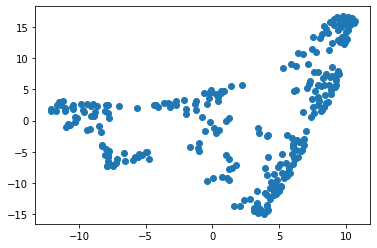

In [93]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
matrix = np.asarray([data['0'],data['1'],data['2'], data['3']]).T
matrix.shape

X_embedded = TSNE(n_components=2).fit_transform(matrix)

plt.scatter(X_embedded[:, 0],X_embedded[:, 1])


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

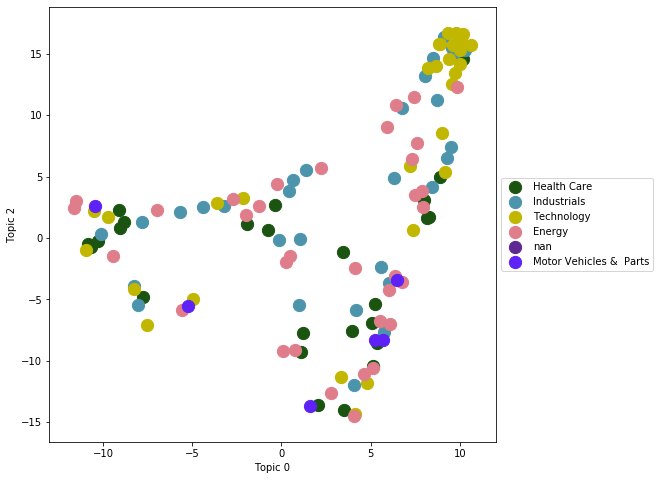

In [136]:
import numpy as np
from sklearn import preprocessing
scatter_x = X_embedded[:, 0]
scatter_y = X_embedded[:, 1]
group = np.array(data['Sector'])
cdict = dict()
for industry in unique_industry:
    if industry not in cdict:
        cdict[industry] = np.random.rand(3,)


        
fig, ax = plt.subplots()
fig.set_figheight(8)
fig.set_figwidth(10)
for industry in unique_industry:
    if industry == "Financials & Services" or industry == "Retailing":
        continue
    ix = np.where(group == industry)
    ax.scatter(scatter_x[ix], scatter_y[ix], c = cdict[industry], label = industry, s = 150)
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.xlabel('Topic 0')
plt.ylabel('Topic 2')
plt.savefig("./sector_scatter.jpeg", dpi=1200)
plt.show()


In [87]:
X_embedded.shape

(265, 2)

In [88]:
data.shape

(265, 24)

In [111]:
print(type(ix[0].tolist()))

<class 'list'>


(array([ 17,  31,  44,  59,  73,  74,  76,  82,  86,  98, 100, 116, 117,
       119, 126, 151, 158, 159, 165, 179, 180, 191, 196, 201, 210, 217,
       231, 234, 236, 240, 244, 246, 255]),)


TypeError: unhashable type: 'numpy.ndarray'

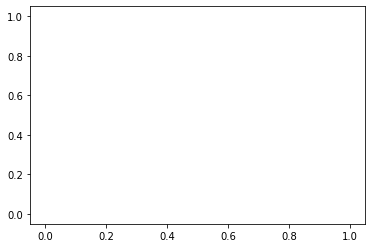

In [122]:
import seaborn as sns

#one sector
#for industry in unique_industry:
ix = np.where(group == 'Energy')
#ix[0].tolist()
sns.kdeplot(X_embedded[ix[0].tolist(), 0],X_embedded[ix[0].tolist(), 1], cmap=cdict[industry])
#plt.clf()
"""
sns.kdeplot(X_embedded[130:, 0],X_embedded[130:, 1], cmap='Reds')
sns.kdeplot(X_embedded[130:, 0],X_embedded[130:, 1], cmap='')

sns.kdeplot(X_embedded[130:, 0],X_embedded[130:, 1], cmap='Reds')
"""
    









In [106]:
ix[0]

array([  0,   1,   2,   3,   5,   6,   7,   8,  25,  29,  32,  40,  67,
        70,  77,  79,  80,  81,  83,  85,  90,  95, 101, 105, 110, 111,
       114, 122, 123, 125, 127, 128, 130, 131, 132, 135, 137, 139, 140,
       141, 147, 153, 155, 156, 162, 166, 167, 168, 187, 189, 199, 202,
       203, 215, 220, 230, 235, 237, 239, 241, 248, 250, 257, 259, 260])

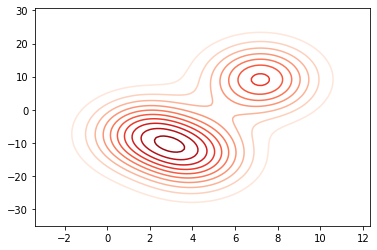

In [113]:
#another sector
sns.kdeplot(X_embedded[[1,2,3], 0],X_embedded[[1,2,3], 1], cmap='Reds')



In [79]:
X_embedded.shape

(265, 2)

In [33]:
# color based on revenue size?
revenues = data['Revenues ($M)']


In [34]:
revenues = revenues.replace('[\$,]', '', regex=True).astype(float)

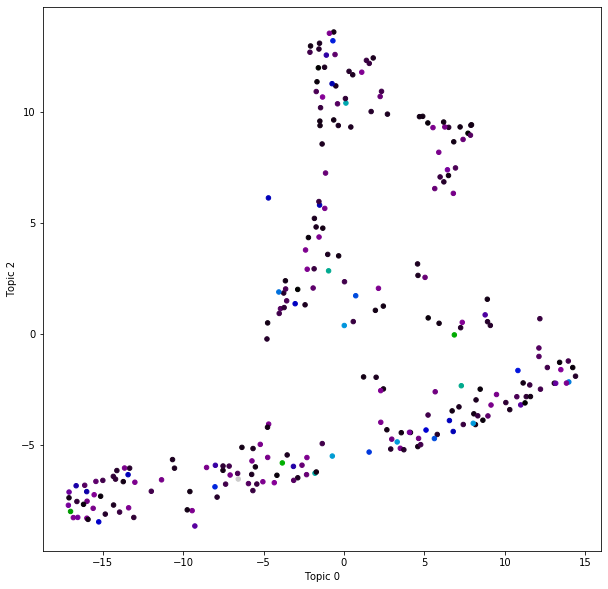

In [39]:
import matplotlib as mpl
revenues = (revenues - revenues.min()) / (revenues.max() - revenues.min())
fig2, ax2 = plt.subplots()

fig2.set_figheight(10)
fig2.set_figwidth(10)


color = [(rev - revenues.min()) / (revenues.max() - revenues.min()) for rev in revenues]
colormap = plt.get_cmap('nipy_spectral')
ax2.scatter(scatter_x, scatter_y, c = color, s=20, cmap=colormap)
plt.xlabel('Topic 0')
plt.ylabel('Topic 2')
plt.show()

In [131]:
for industry in unique_industry:
    ix = np.where(group == industry)
    print(industry), print(len(ix[0]))

Financials & Services
65
Retailing
60
Health Care
25
Industrials
30
Technology
30
Energy
33
nan
0
Motor Vehicles &  Parts
6
